In [40]:
import matplotlib.pyplot as plt
%matplotlib inline

In [41]:
from gensim.models.word2vec import Word2Vec

In this section, you can decide which model for which corpus you want to use for your analysis. Here by default, it's the Revue des Deux Mondes corpus within the years 1820-1900. We tested over 10-year slides, it's clearly much less effective due to the small size of the French corpora.
After the load, put the path to your directory of models, and then select your range in "year in range".

In [42]:
from collections import OrderedDict

models = OrderedDict([
    (year, Word2Vec.load('/home/odysseus/Téléchargements/hist-vec-master/r2m/LemCorpR2M_models/{}.bin'.format(year)))
    for year in range(1820, 1900, 20)
])

In [43]:
def cosine_series(anchor, query):
    
    series = OrderedDict()
    
    for year, model in models.items():
        
        series[year] = (
            model.similarity(anchor, query)
            if query in model else 0
        )

    return series

In [44]:
import numpy as np
import statsmodels.api as sm

def lin_reg(series):

    x = np.array(list(series.keys()))
    y = np.array(list(series.values()))

    x = sm.add_constant(x)

    return sm.OLS(y, x).fit()

In [45]:
def plot_cosine_series(anchor, query, w=8, h=4):
    
    series = cosine_series(anchor, query)
    
    fit = lin_reg(series)

    x1 = list(series.keys())[0]
    x2 = list(series.keys())[-1]

    y1 = fit.predict()[0]
    y2 = fit.predict()[-1]
    
    print(query)
    
    plt.figure(figsize=(w, h))
    plt.ylim(0, 1)
    plt.title(query)
    plt.xlabel('Year')
    plt.ylabel('Similarity')
    plt.plot(list(series.keys()), list(series.values()))
    plt.plot([x1, x2], [y1, y2], color='gray', linewidth=0.5)
    plt.show()

# Similarity of a list of key terms to "littérature"

The cell below (which calls the methods above), shows how two words differ from one another <b>through time</b>, with <b>cosine</b> similarity. Here, we show how a list of selected concepts evolves compared to "littérature". You can manually change both below.

poésie


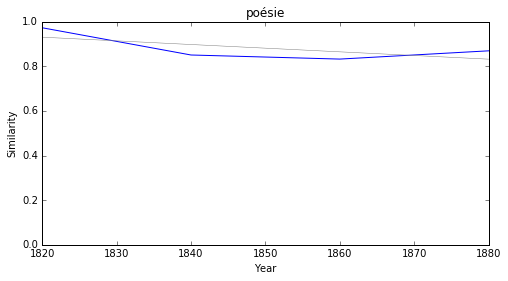

science


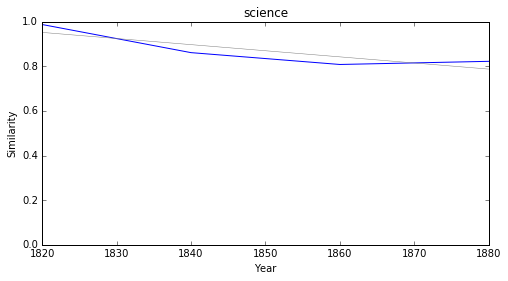

savoir


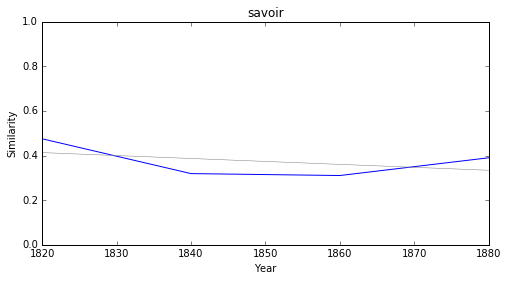

histoire


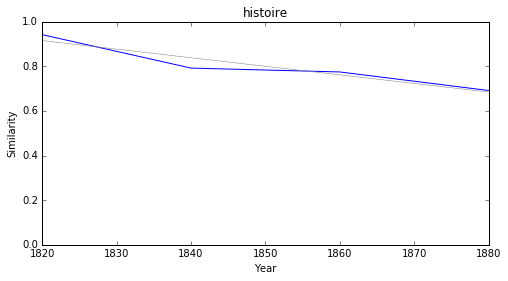

philosophie


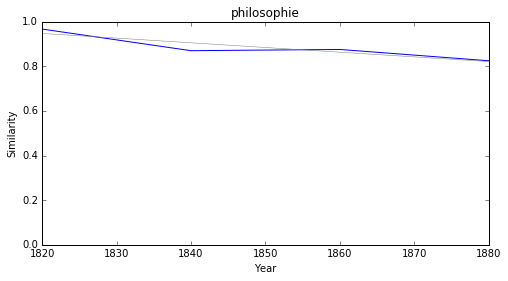

lettre


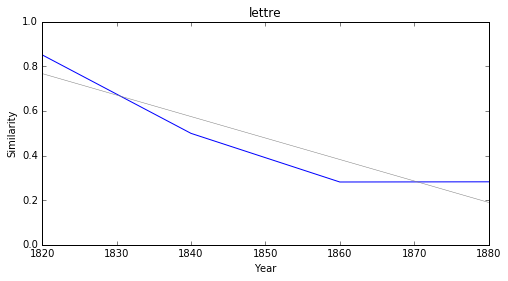

critique


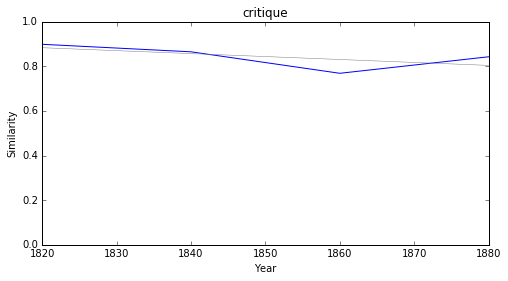

roman


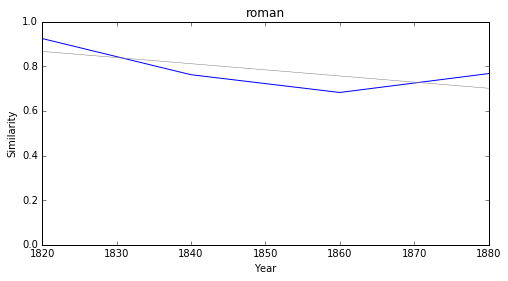

théâtre


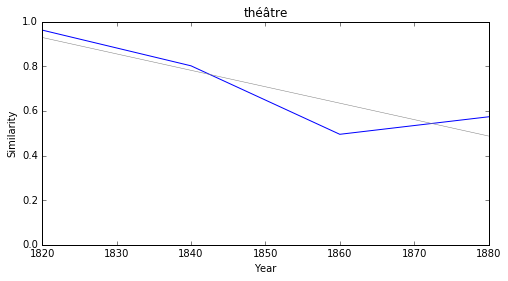

drame


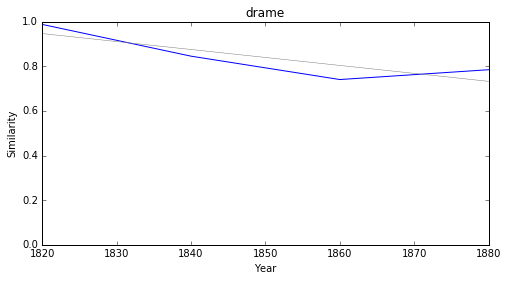

esprit


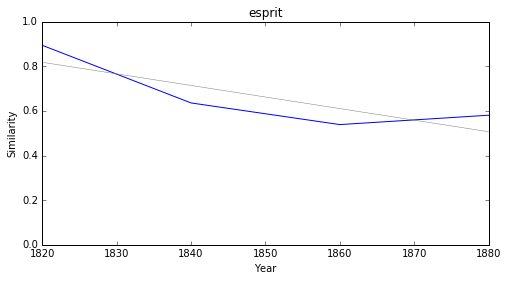

langue


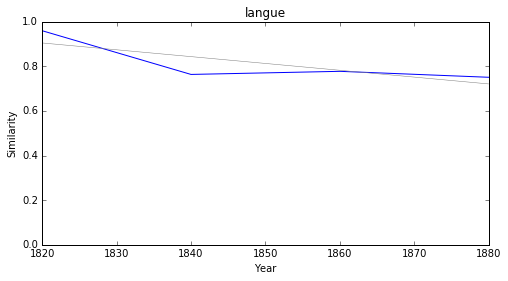

diplomatie


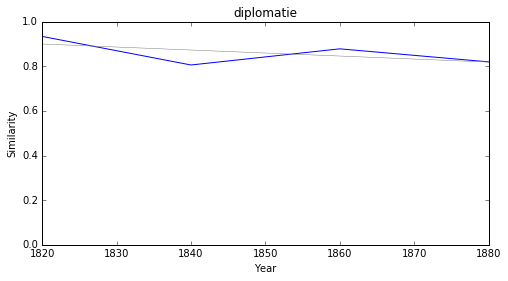

politique


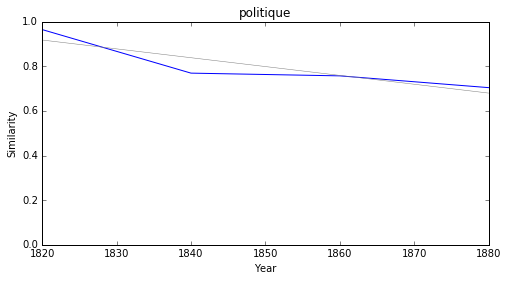

morale


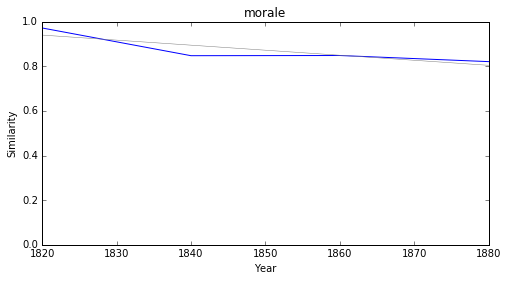

société


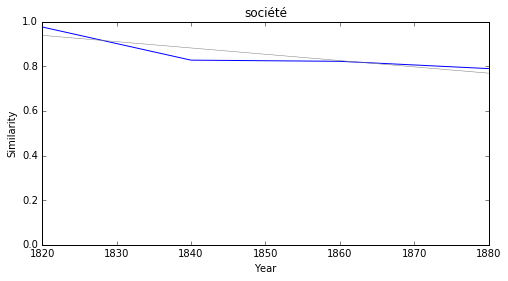

pouvoir


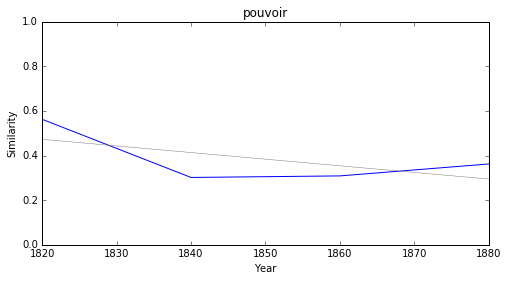

théologie


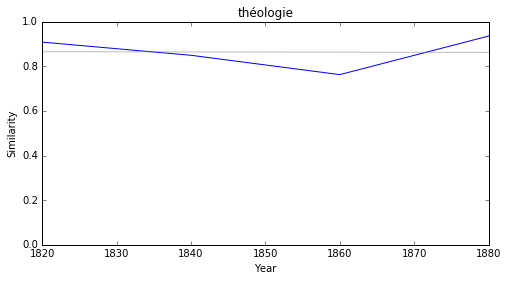

droit


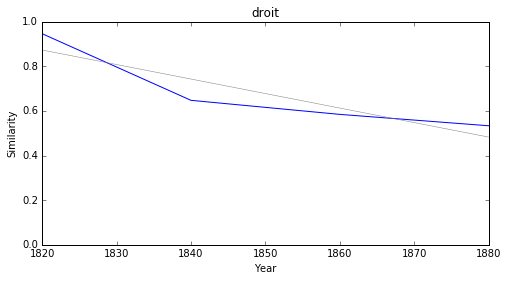

loi


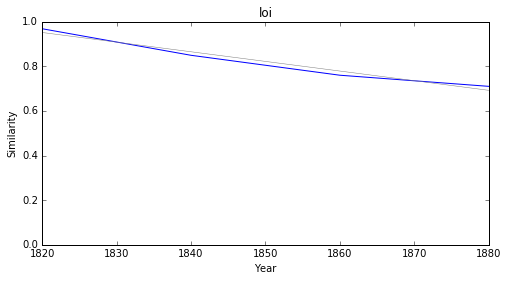

méthode


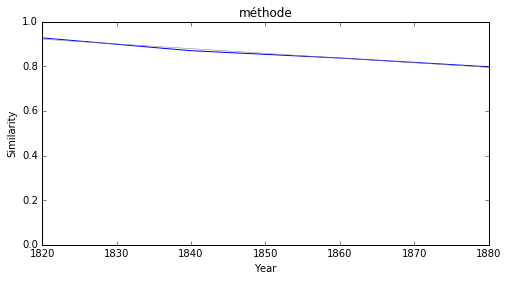

génie


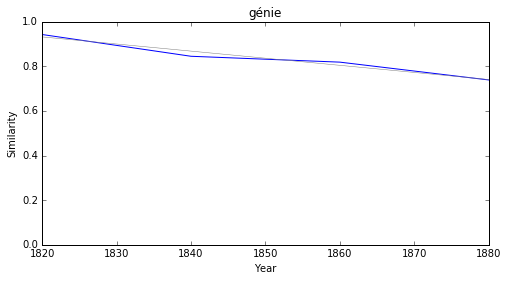

romantisme


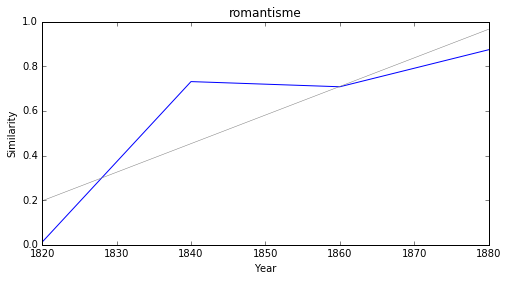

réalisme


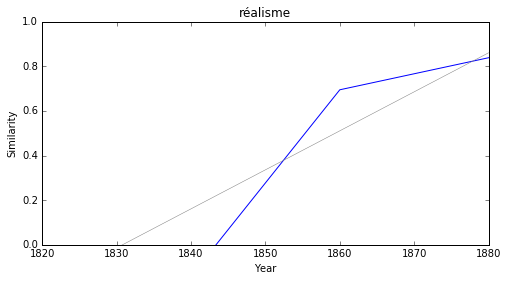

symbolisme


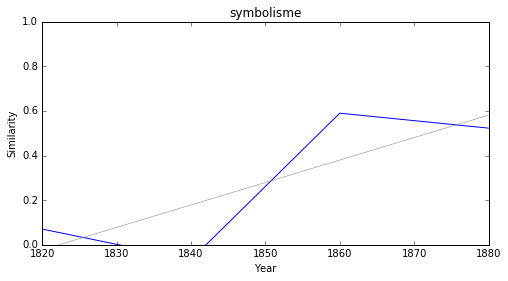

naturalisme


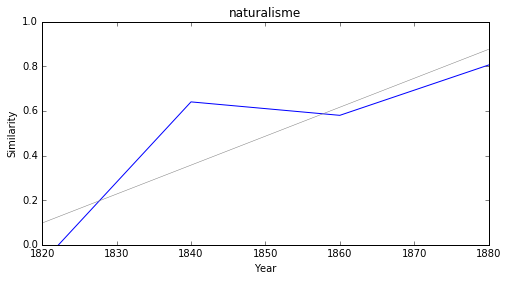

In [46]:
testList = ('littérature','poésie', 'science', 'savoir', 'histoire', 'philosophie', 'lettre', 'critique', 
            'roman', 'théâtre', 'drame', 'esprit', 'langue', 'diplomatie', 'politique', 'morale', 'société', 
            'pouvoir', 'théologie', 'droit', 'loi', 'méthode', 'génie', 'romantisme', 'réalisme', 'symbolisme', 
            'naturalisme')

for idx, val in enumerate(testList):
    if idx>0:
        plot_cosine_series('littérature', val)

The two next cells get the 200 most similar terms to a specific term, from the training models, here "littérature".

In [47]:
def union_neighbor_vocab(anchor, topn=200):
    
    vocab = set()
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocab.update([s[0] for s in similar])
        
    return vocab

At this point, we'll do the same thing as above, and calculate, for each token in the 200 nearest terms to the main entry, the <b>proximity</b> of this term and its <b>significance</b>. The significance is calculated with the p value, that is to say that, below a certain threshold (0.05) we have a strong likelyhood that the result is sure and significant.

In [48]:
entries={}

for word in testList:
    data = []
    for token in union_neighbor_vocab(word):
    
        series = cosine_series(word, token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

# Increasing

In this part, we want to show what terms <b>emerge</b> more and more with the main entry, that is to say each word of the given test list. The <b>"slope"</b> is the degree of progress, and the <b>"p" value</b> its efficiency. So here, the main emergence with "littérature" which is significant is "humanisme". All terms seem to be significant, except "fédéralisme", "welschinger", "maniere", "hennet", "réapparition", "deffence", "bourgin", "colonie", "naturalisme", "réalisme", "sillery", "gréco", "compétence", "symbolisme", "catholique", "japonais", "manuel", "romand", "topographie, "organisme", "prédominance". That is to say that those terms can be nearest, but that statistically they are not significant enough to be sure, while the others are more certain.

In this following cell, we show how the top ten most similar vectors change through time compared to the words in the test list : "humanisme" for example seems to be very rare before 1860, and then becomes more and more similar to "littérature". Those show the terms that were not similar in the beginning, but <b>tend to be more and more related</b> to "littérature". You should keep in mind the p values associated to each vector.

### <i><b>littérature</i></b>

            token     slope         p
0     physiologie  0.015517  0.039857
121   positiviste  0.015063  0.002245
28    sauvegarder  0.014201  0.024549
105     arbitrage  0.011269  0.003807
87         adepte  0.008166  0.026672
7    consécration  0.003431  0.000266
45      orthodoxe  0.003419  0.002439
122   suppression  0.001464  0.040740
52   traditionnel  0.001363  0.007826
63   enseignement -0.000700  0.043674



physiologie


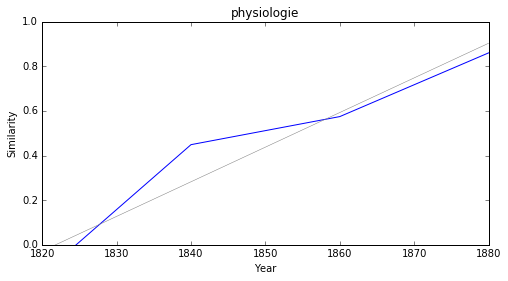

positiviste


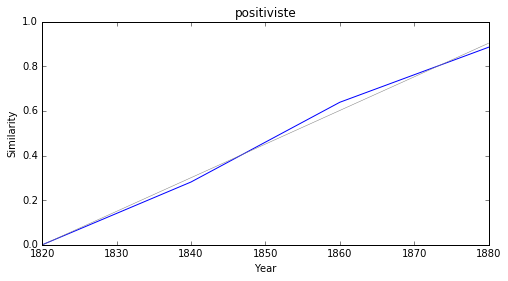

sauvegarder


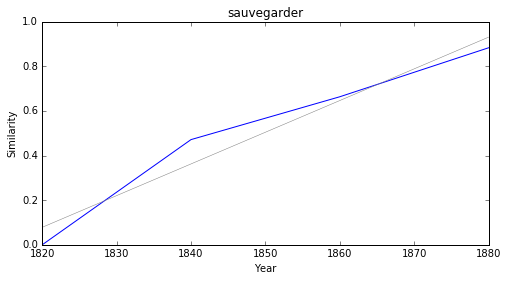

arbitrage


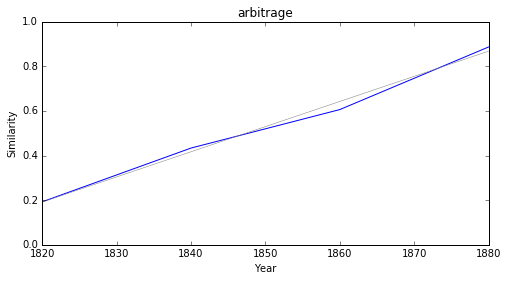

adepte


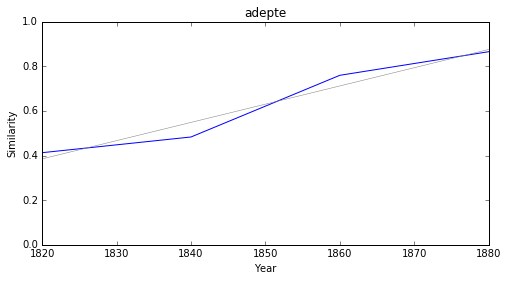

consécration


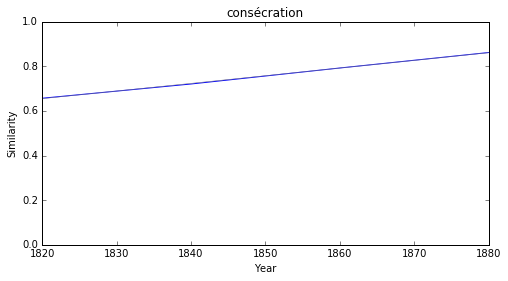

orthodoxe


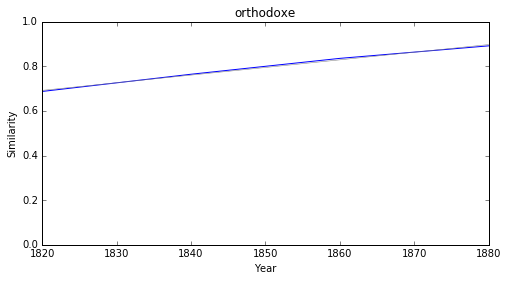

suppression


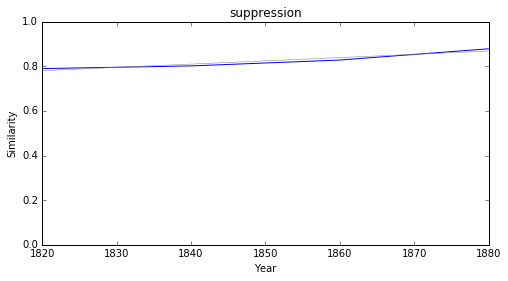

traditionnel


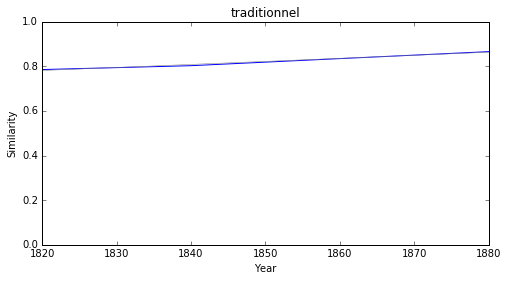

enseignement


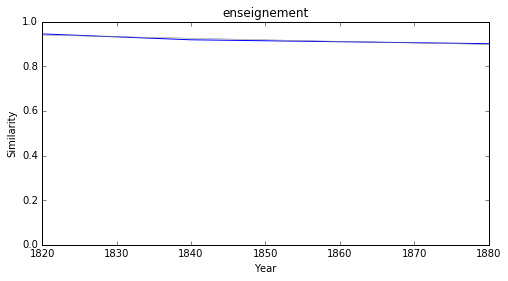

### <i><b>poésie</i></b>

             token     slope         p
35    infiltration  0.015045  0.024431
103  compromettant  0.014531  0.043260
19       expansion  0.001542  0.028793
55         artiste  0.000468  0.040553
86       curiosité -0.001054  0.011632
61        grandeur -0.001207  0.031502
53    enseignement -0.001276  0.018840
75         analyse -0.001356  0.031715
58       ascendant -0.001456  0.039471
34         raffiné -0.001463  0.041801



infiltration


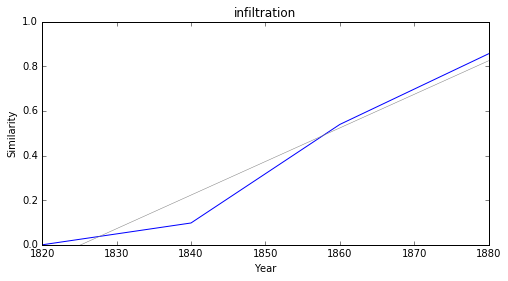

compromettant


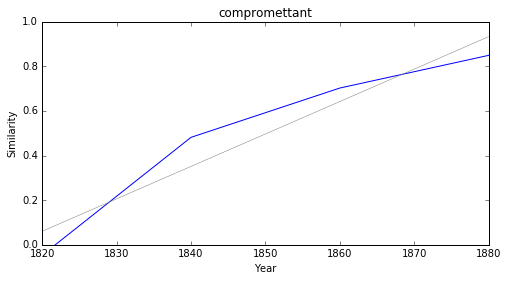

expansion


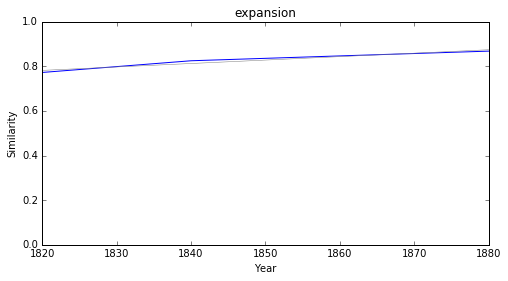

artiste


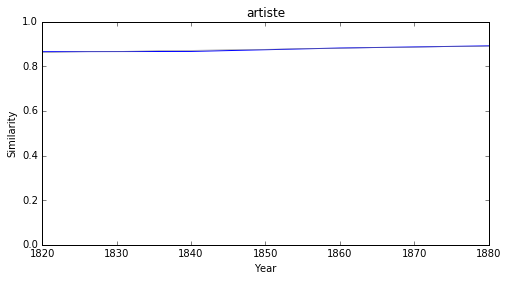

curiosité


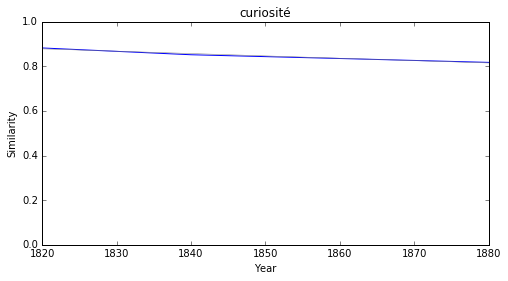

grandeur


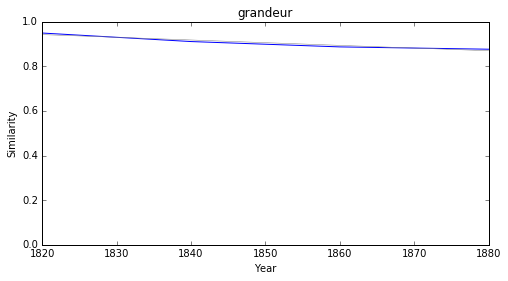

enseignement


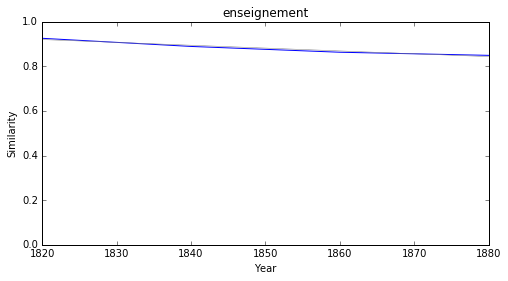

analyse


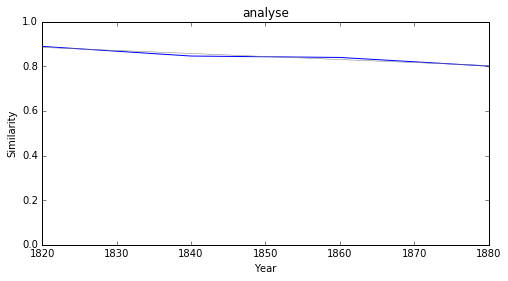

ascendant


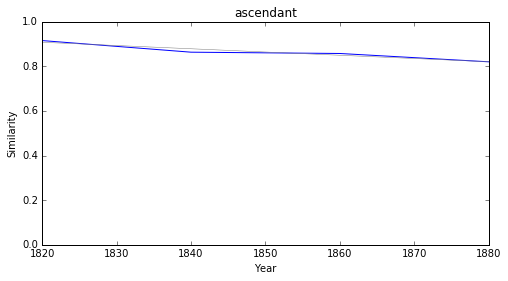

raffiné


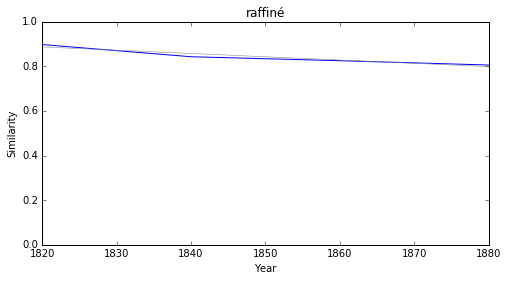

### <i><b>science</i></b>

           token     slope         p
49      religion -0.001481  0.019389
14       opinion -0.001647  0.040320
44       société -0.001911  0.003703
29       naturel -0.001914  0.020147
28       intérêt -0.002073  0.009383
48      pratique -0.002115  0.006009
52  civilisation -0.002135  0.011585
23     puissance -0.002276  0.030968
54        peuple -0.002345  0.012885
38        morale -0.002404  0.005120



religion


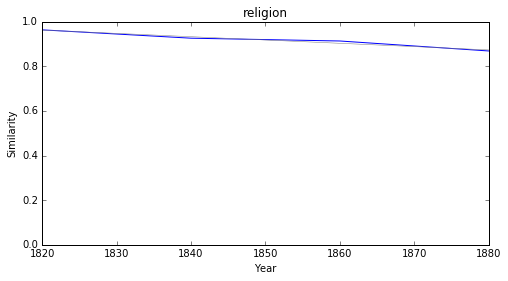

opinion


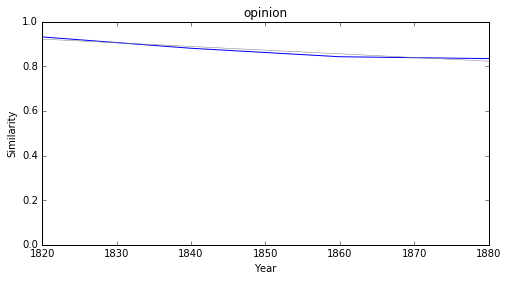

société


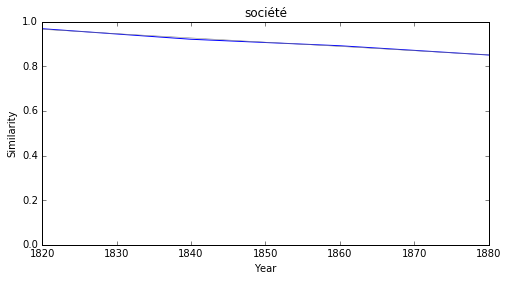

naturel


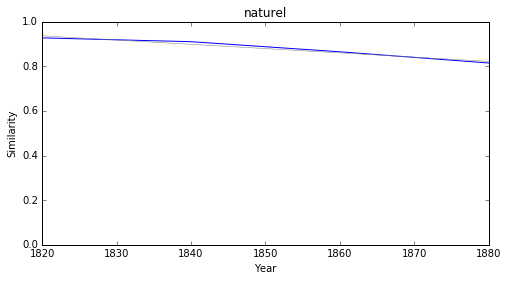

intérêt


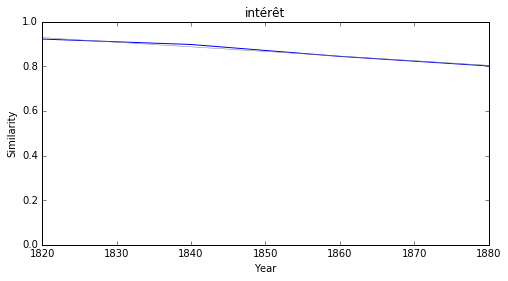

pratique


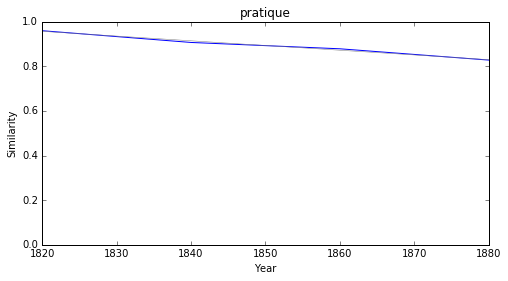

civilisation


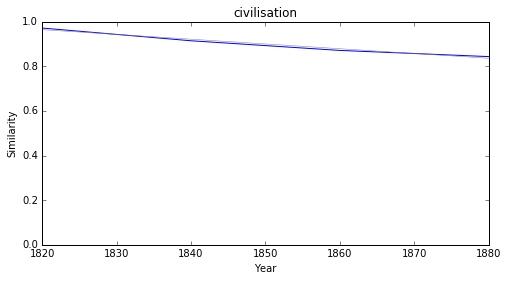

puissance


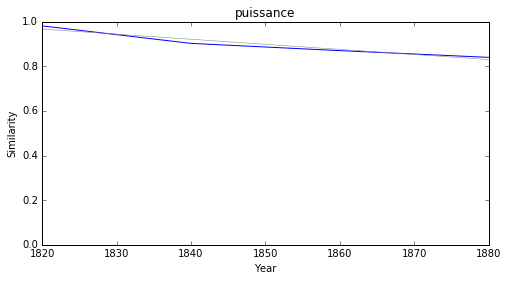

peuple


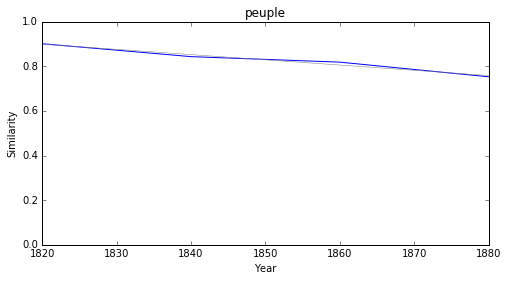

morale


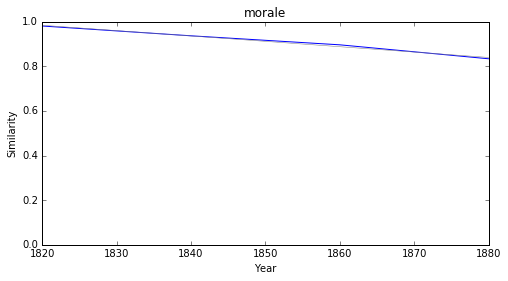

### <i><b>savoir</i></b>

         token     slope         p
35  comprendre -0.001639  0.045174
21   autrement -0.002523  0.027493
27        user -0.002640  0.008462
46    souffrir -0.002643  0.043424
53   remarquer -0.002696  0.046478
31   ressentir -0.002883  0.028704
42     bonheur -0.003029  0.025884
48   respecter -0.003246  0.045202
33     accuser -0.003294  0.047635
13       voilà -0.003382  0.039623



comprendre


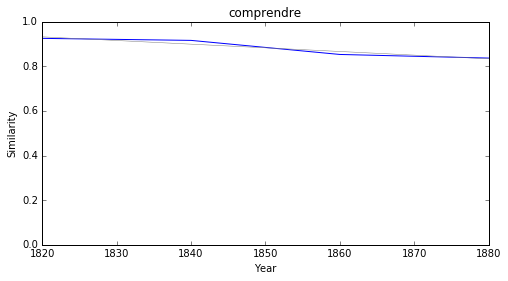

autrement


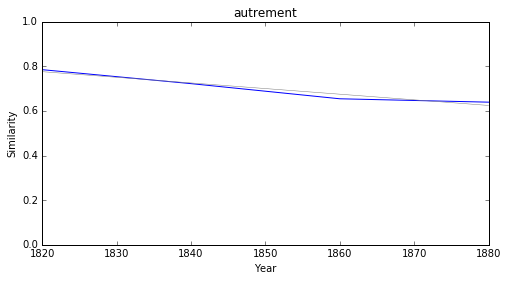

user


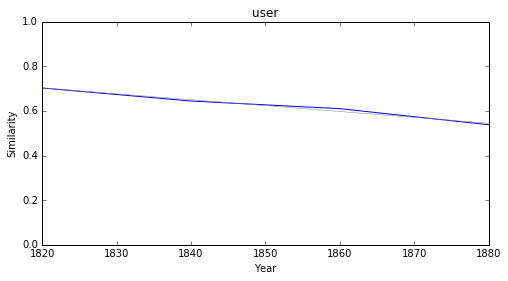

souffrir


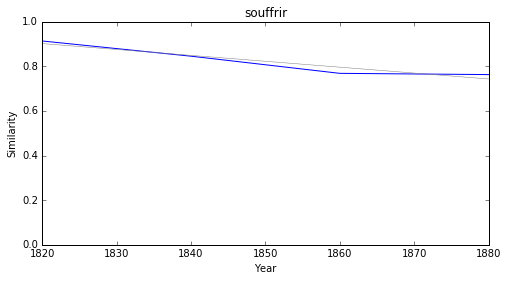

remarquer


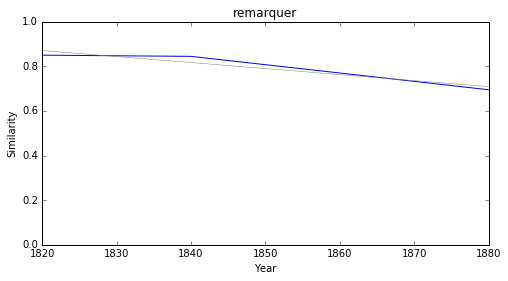

ressentir


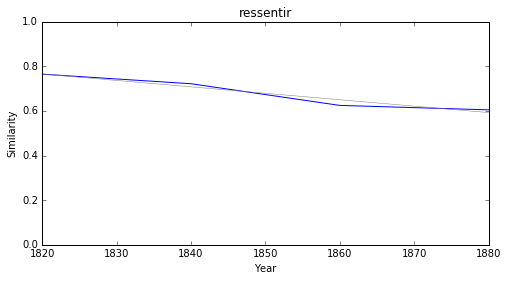

bonheur


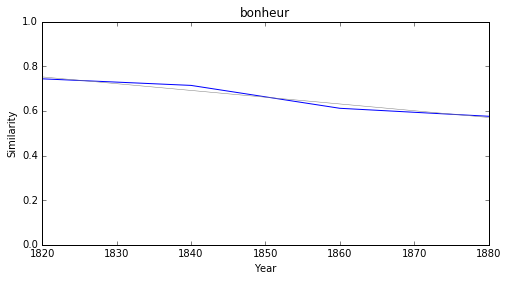

respecter


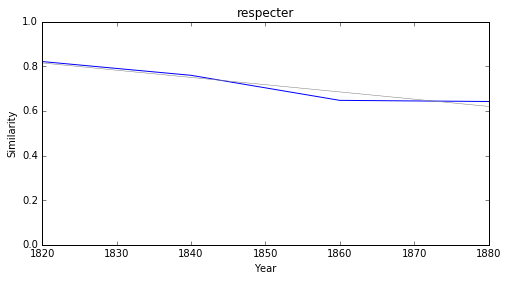

accuser


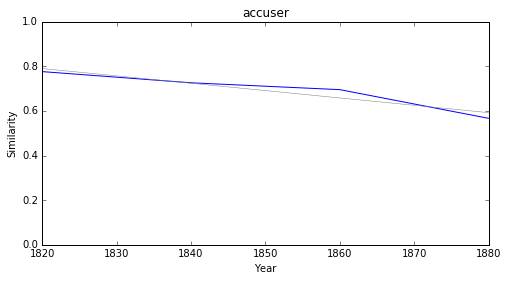

voilà


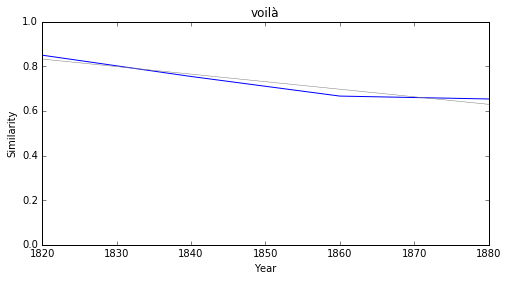

### <i><b>histoire</i></b>

         token     slope         p
46        pays -0.001362  0.042655
57  expérience -0.001631  0.022928
24      auteur -0.001642  0.039254
91    ailleurs -0.002154  0.019824
52   éducation -0.002207  0.006406
34      époque -0.002505  0.004581
42        rôle -0.002513  0.042427
65     langage -0.002643  0.011432
75    résultat -0.002722  0.008607
38       usage -0.002742  0.008103



pays


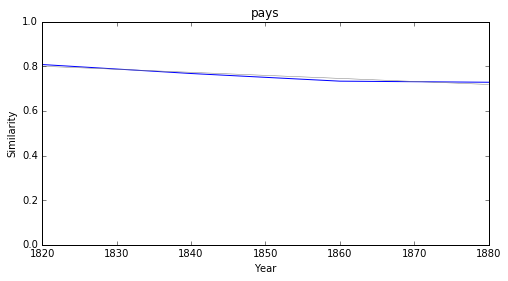

expérience


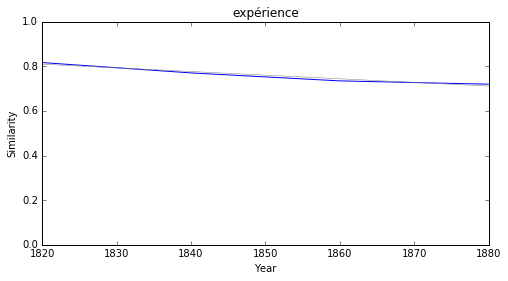

auteur


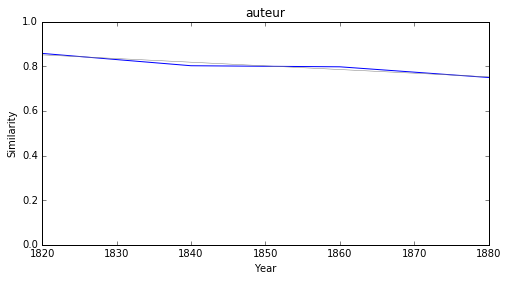

ailleurs


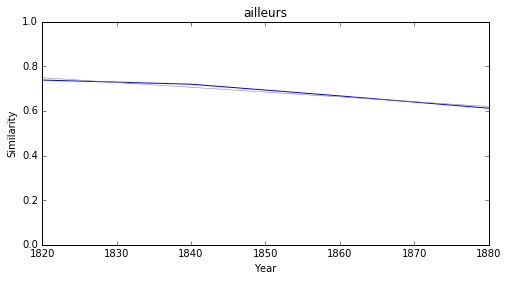

éducation


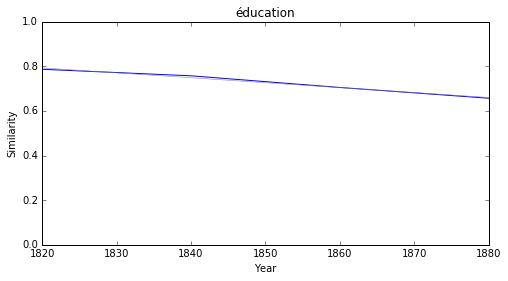

époque


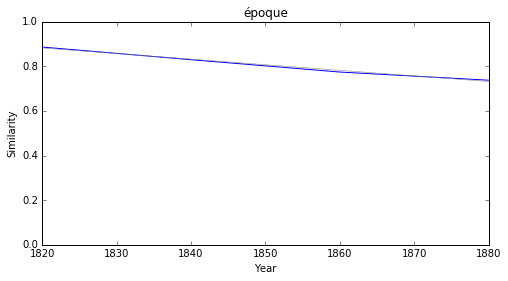

rôle


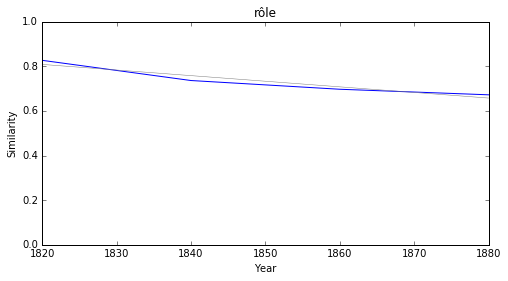

langage


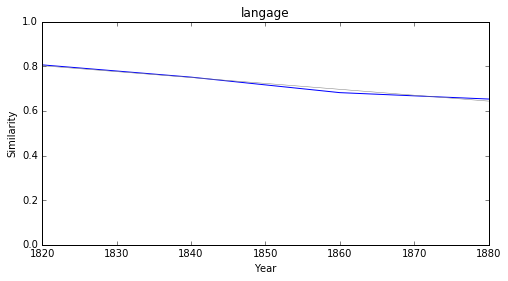

résultat


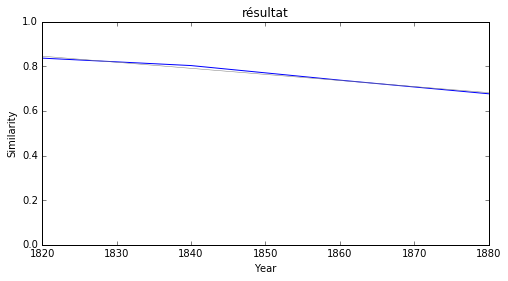

usage


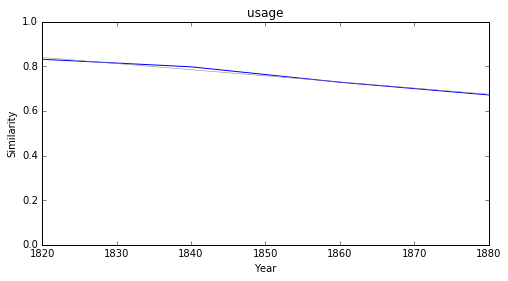

### <i><b>philosophie</i></b>

           token     slope         p
26   liquidation  0.010727  0.001520
75       méthode -0.001888  0.036232
39       opinion -0.002189  0.003355
64       naturel -0.002267  0.039408
1      nécessité -0.002334  0.016193
105      société -0.002446  0.004877
123      système -0.002475  0.036814
22        absolu -0.002508  0.018984
58       artiste -0.002551  0.044241
85       justice -0.002602  0.022261



liquidation


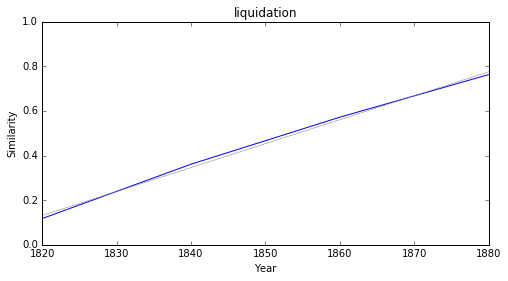

méthode


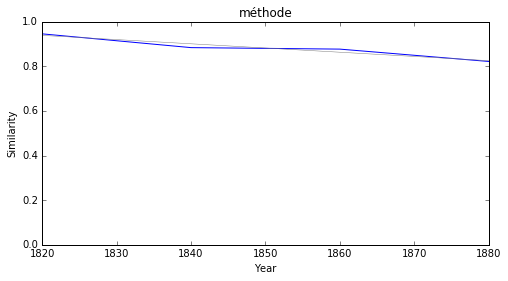

opinion


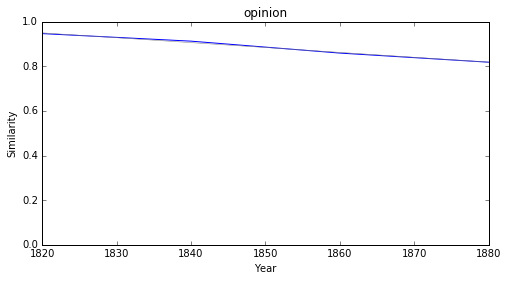

naturel


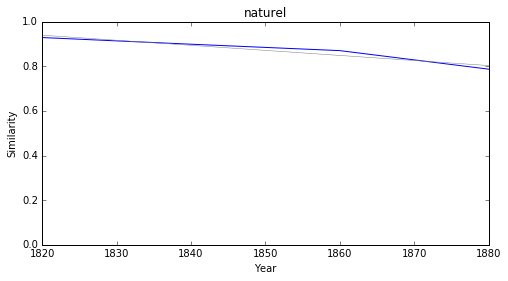

nécessité


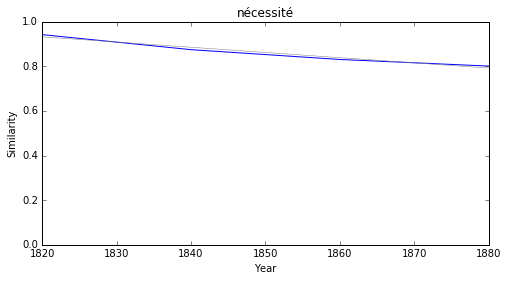

société


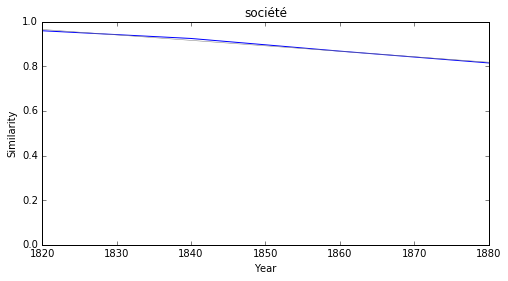

système


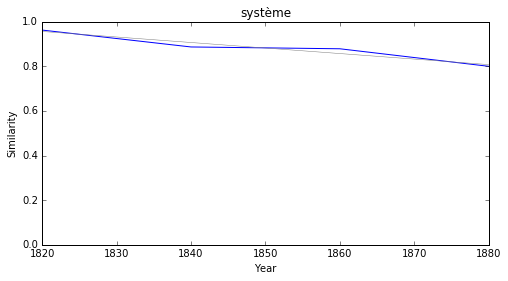

absolu


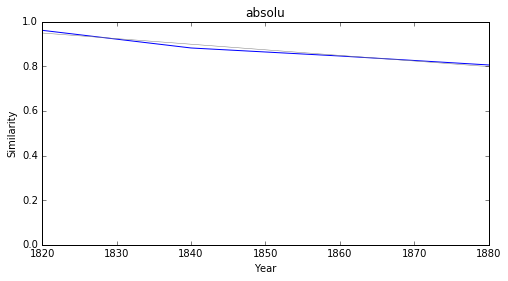

artiste


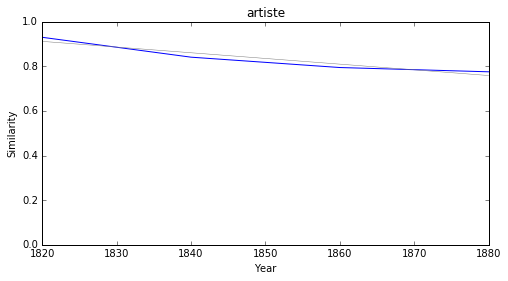

justice


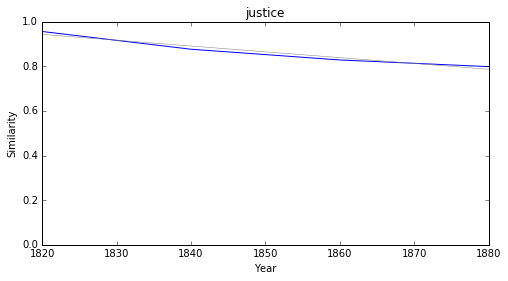

### <i><b>lettre</i></b>

            token     slope         p
227       pénates  0.010997  0.014294
211         henri -0.003865  0.020310
155       réponse -0.003868  0.047355
29            duc -0.004054  0.014019
86       dépêcher -0.004230  0.012138
173   ambassadeur -0.004524  0.026064
160     damoiseau -0.004694  0.007392
171     entretien -0.004750  0.040872
182  portefeuille -0.004987  0.028571
198   explication -0.005044  0.010016



pénates


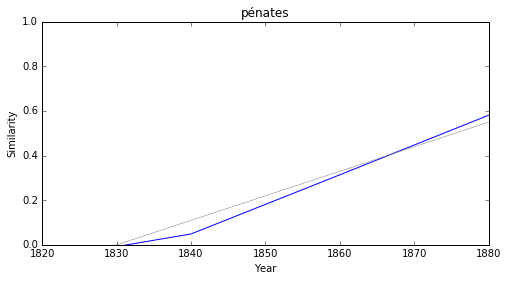

henri


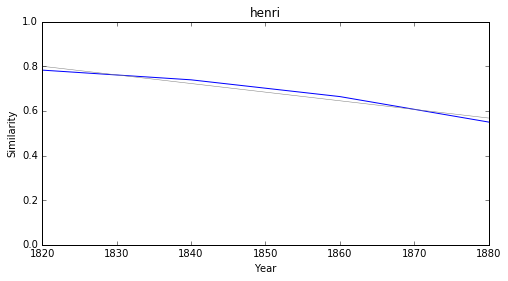

réponse


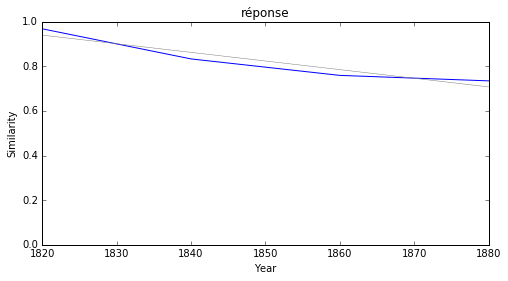

duc


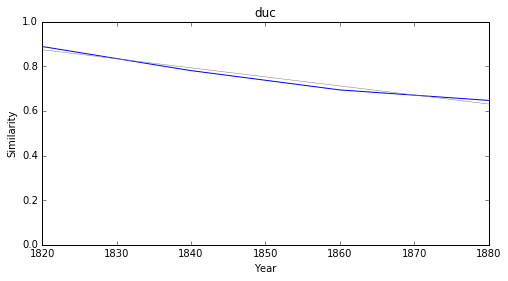

dépêcher


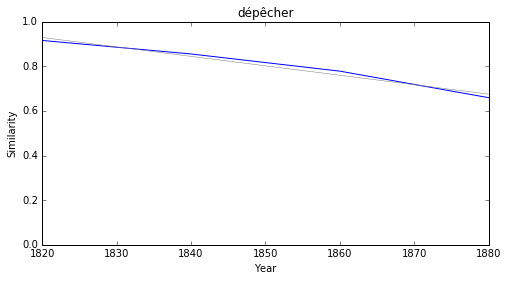

ambassadeur


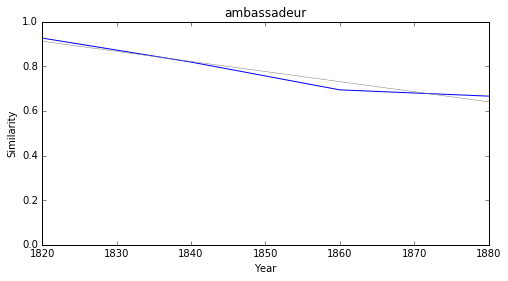

damoiseau


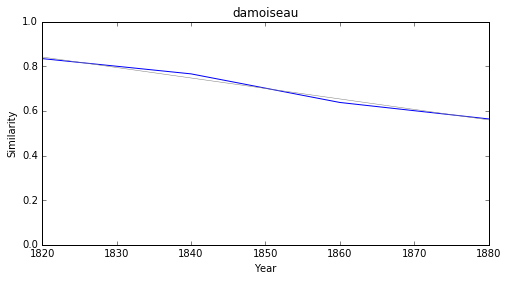

entretien


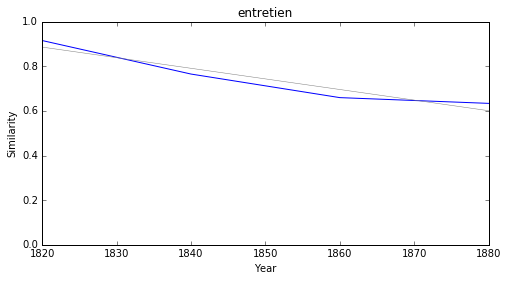

portefeuille


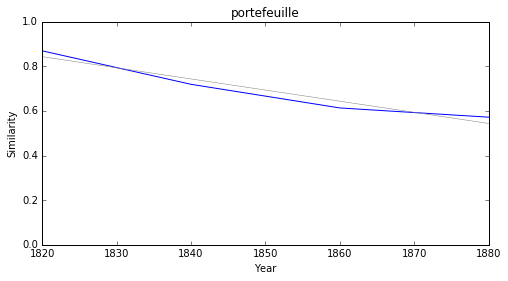

explication


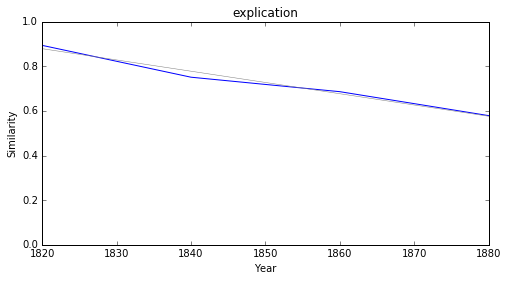

### <i><b>critique</i></b>

             token     slope         p
160       ébruiter  0.013833  0.006994
18         émérite  0.013364  0.007787
6    théoriquement  0.013105  0.013248
107         adepte  0.001428  0.002170
35     méconnaître -0.000892  0.038641
60           moral -0.001231  0.014476
97   impossibilité -0.001629  0.014588
117       sécurité -0.001638  0.047308
45            fait -0.001909  0.015290
9          penseur -0.002023  0.042820



ébruiter


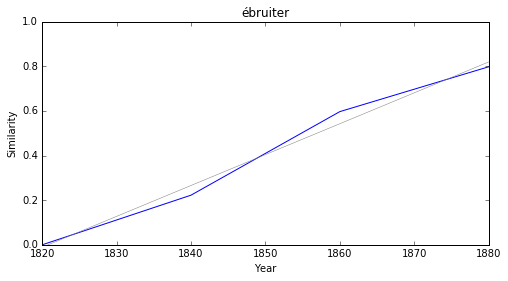

émérite


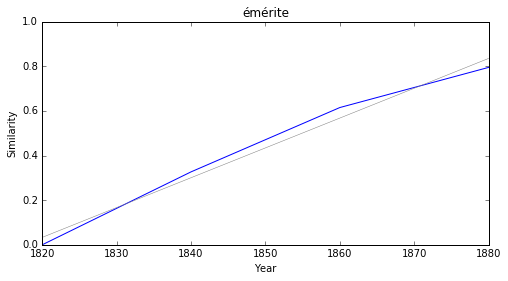

théoriquement


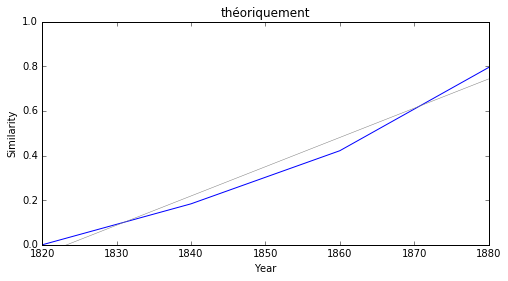

adepte


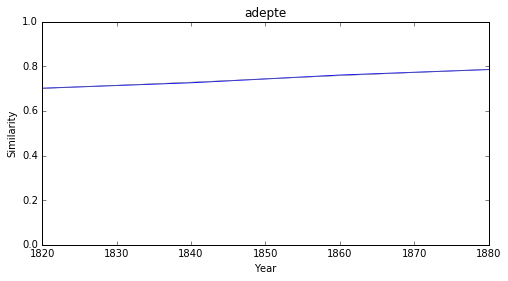

méconnaître


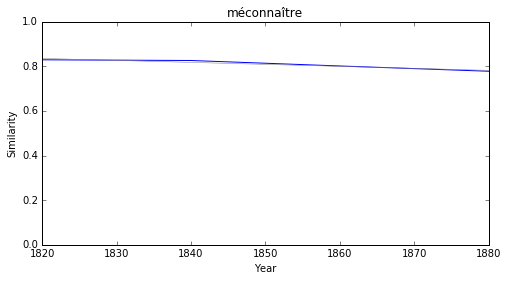

moral


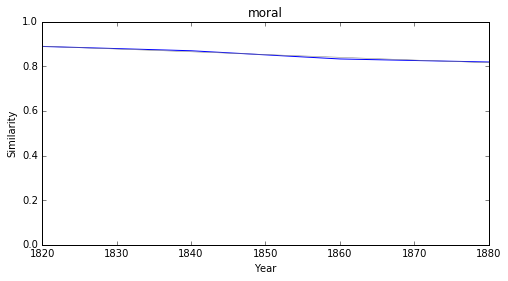

impossibilité


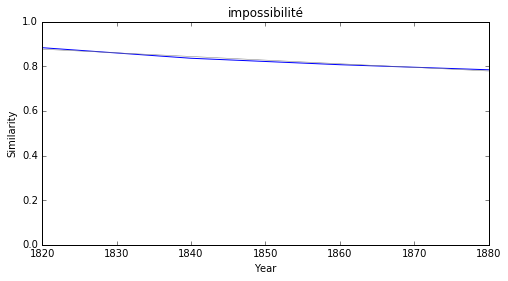

sécurité


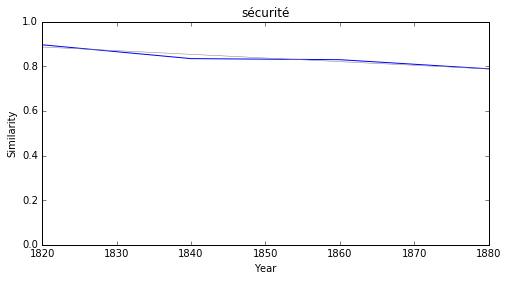

fait


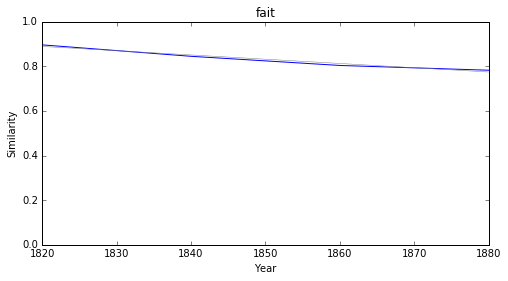

penseur


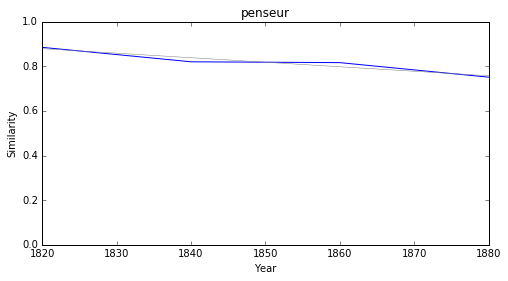

### <i><b>roman</i></b>

           token     slope         p
11          legs  0.009040  0.007757
8   matérialisme  0.004433  0.017241
33  superstition -0.001313  0.034652
59       ivresse -0.001412  0.042952
39         drame -0.001577  0.013694
65     ignorance -0.001581  0.042358
75         style -0.001635  0.007702
35       mystère -0.001818  0.033856
19     isolement -0.001871  0.010875
30       légende -0.001903  0.023818



legs


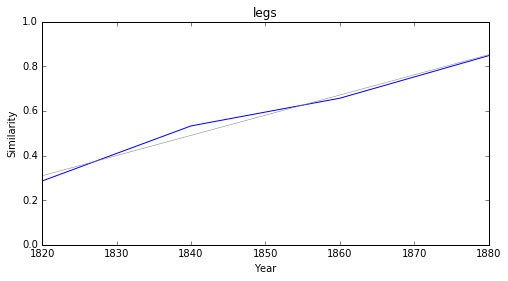

matérialisme


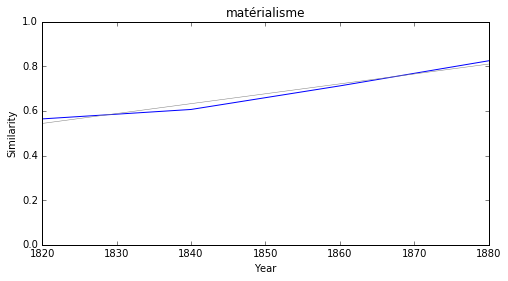

superstition


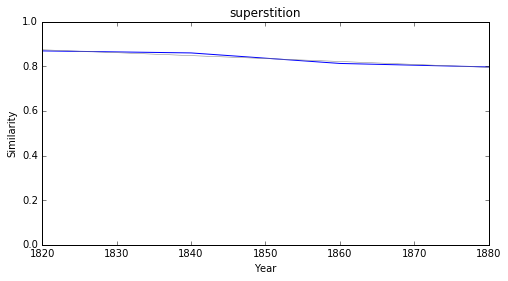

ivresse


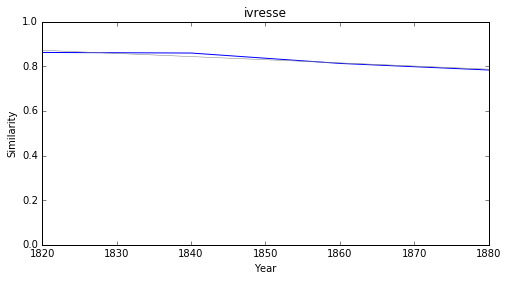

drame


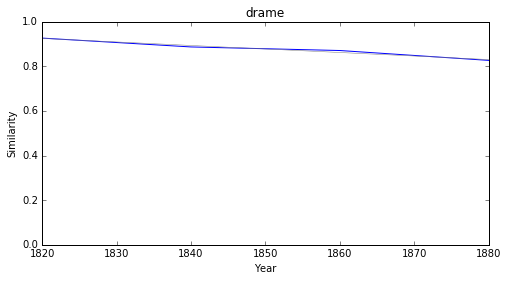

ignorance


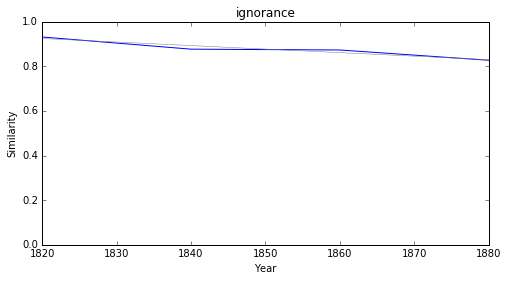

style


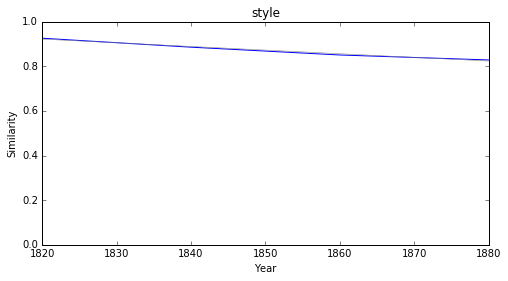

mystère


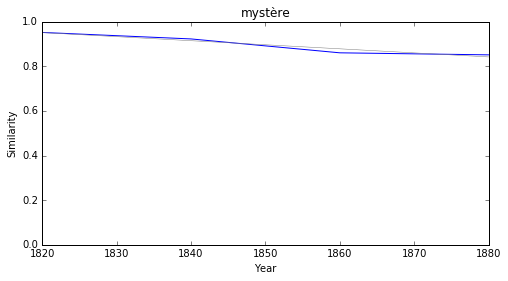

isolement


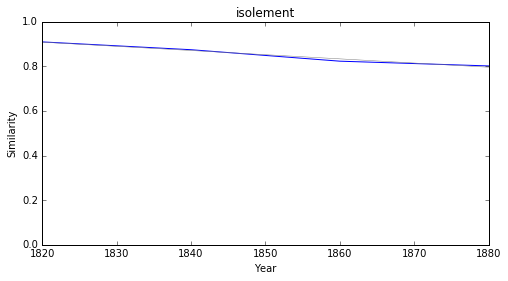

légende


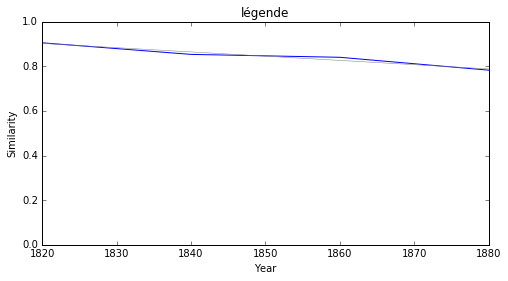

### <i><b>théâtre</i></b>

           token     slope         p
164    charivari  0.015093  0.048832
67        rabais  0.013027  0.031442
5        ontario  0.010890  0.041629
18   historiette  0.010846  0.030062
68         trône -0.002647  0.041369
163       niveau -0.002704  0.015317
84         siège -0.002929  0.039352
176    monastère -0.003078  0.017424
144      secours -0.003158  0.038287
93      chapitre -0.003207  0.041014



charivari


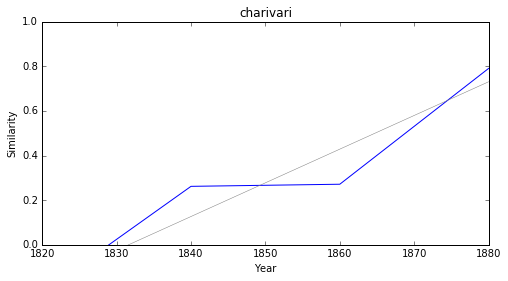

rabais


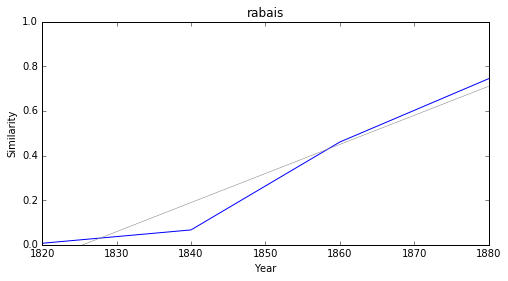

ontario


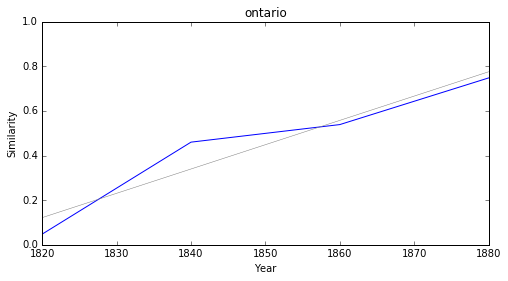

historiette


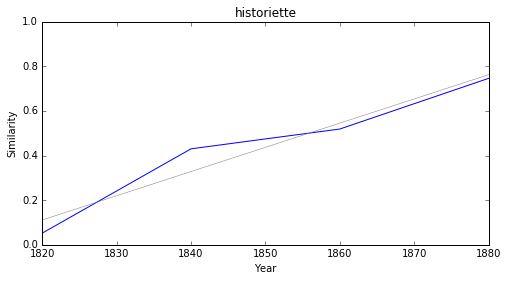

trône


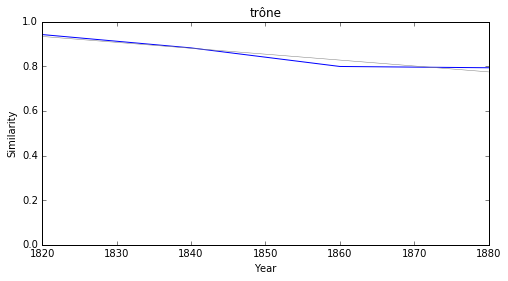

niveau


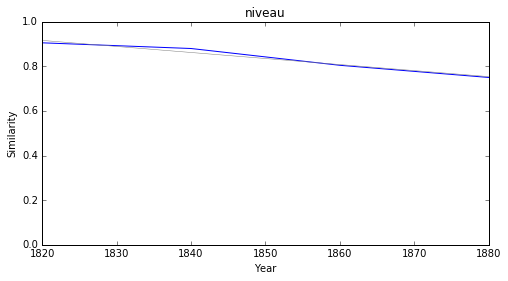

siège


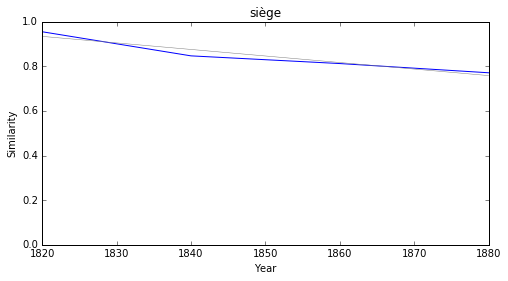

monastère


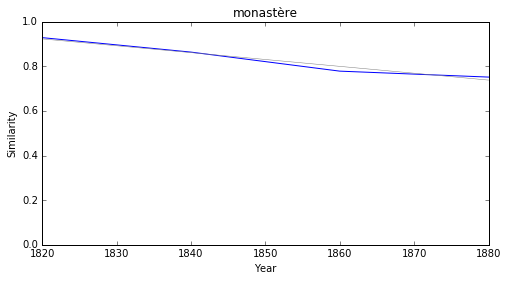

secours


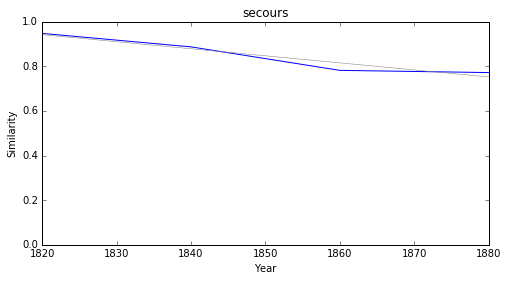

chapitre


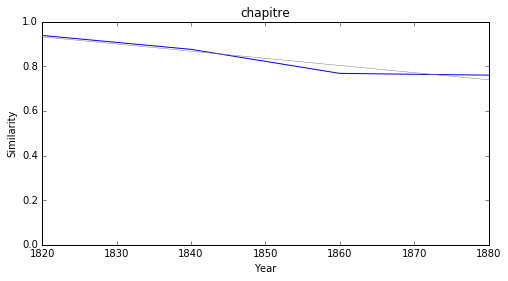

### <i><b>drame</i></b>

       token     slope         p
37   envolée  0.015334  0.010577
56  hobereau  0.015157  0.032581
13   mayence  0.015043  0.016630
21      caïd  0.013901  0.015423
41   percher  0.013572  0.040128
33   stipulé  0.011056  0.048340
30  chapitre -0.000901  0.030932
8      roman -0.001577  0.013694
45   poisson -0.001788  0.043484
4     dessin -0.001954  0.034184



envolée


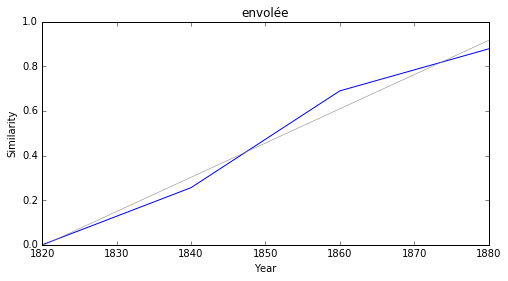

hobereau


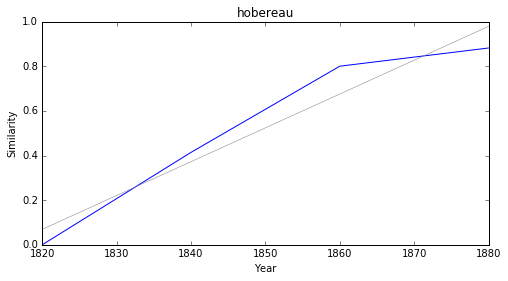

mayence


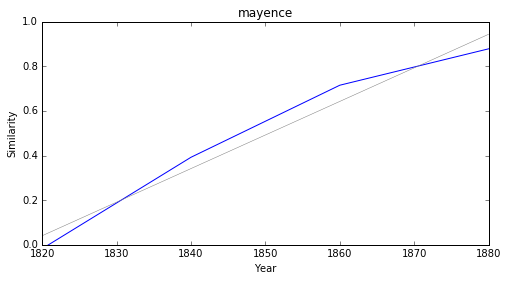

caïd


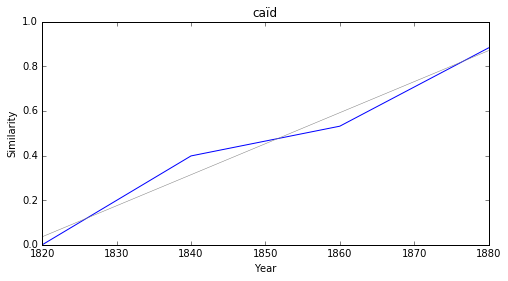

percher


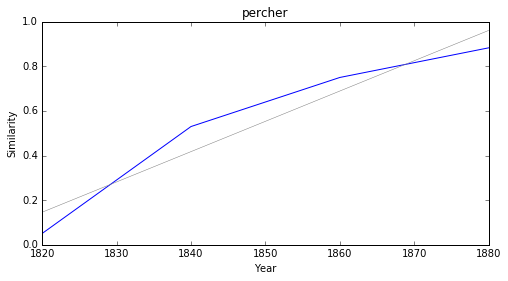

stipulé


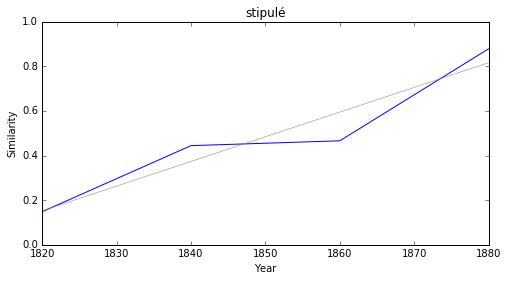

chapitre


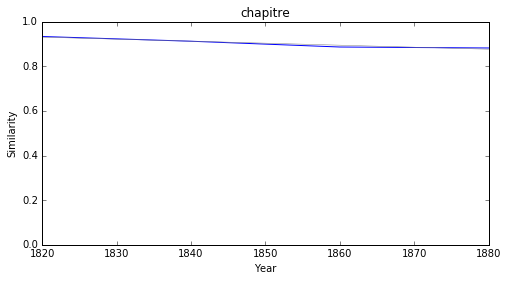

roman


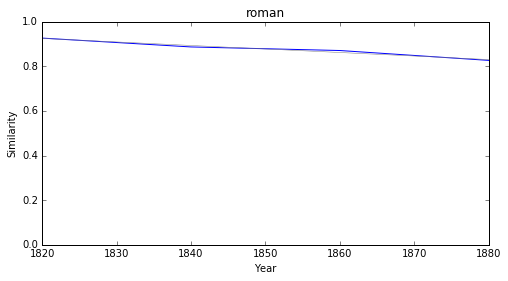

poisson


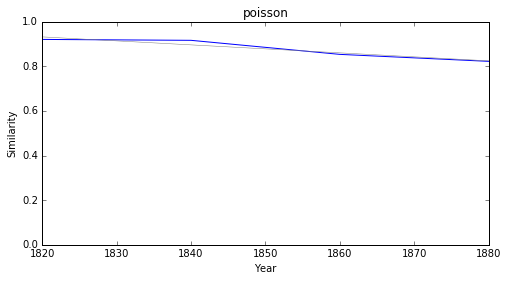

dessin


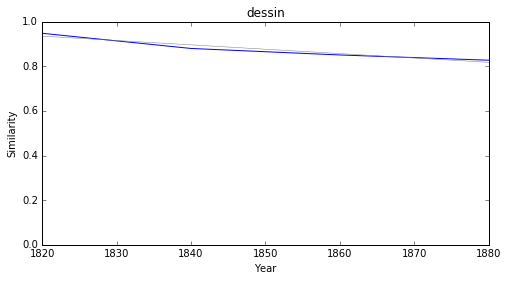

### <i><b>esprit</i></b>

           token     slope         p
38      habitude -0.001963  0.048457
35        défaut -0.002021  0.034724
5   intelligence -0.002076  0.037064
29          idée -0.002177  0.010229
8        réalité -0.002329  0.032418
48     influence -0.002350  0.002875
3       tendance -0.002388  0.036438
47       méthode -0.002456  0.022145
16        talent -0.002510  0.034719
49        morale -0.002615  0.028271



habitude


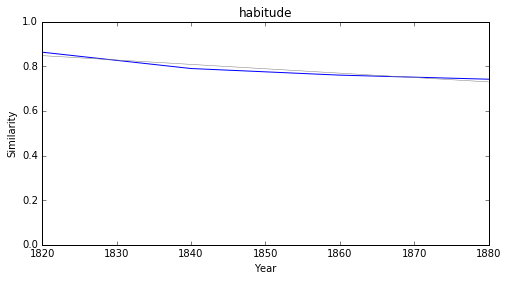

défaut


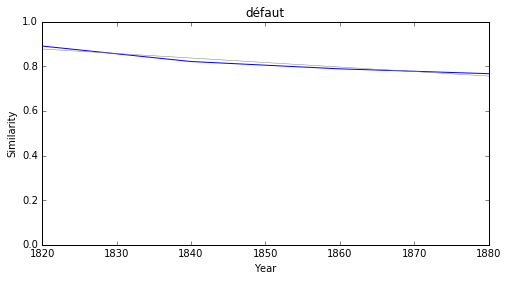

intelligence


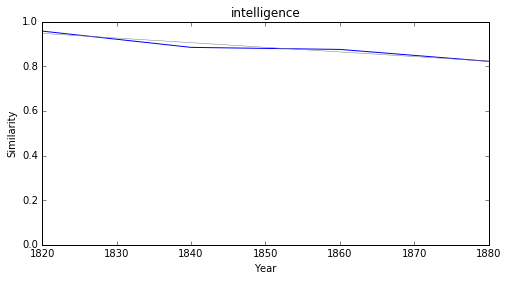

idée


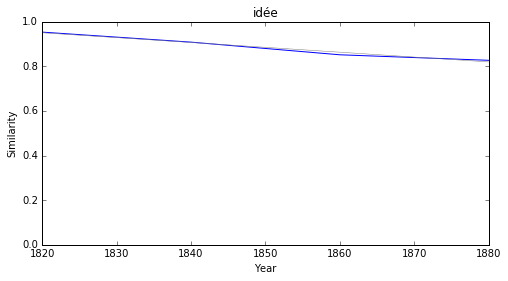

réalité


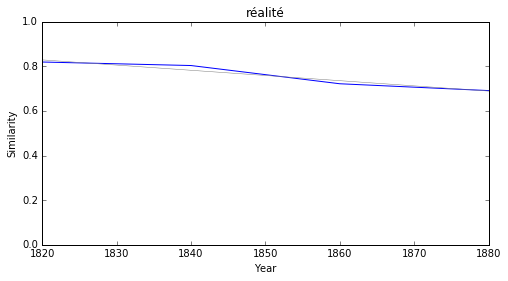

influence


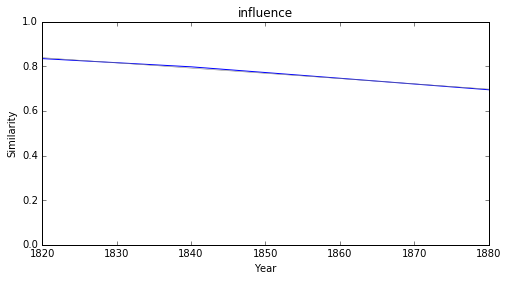

tendance


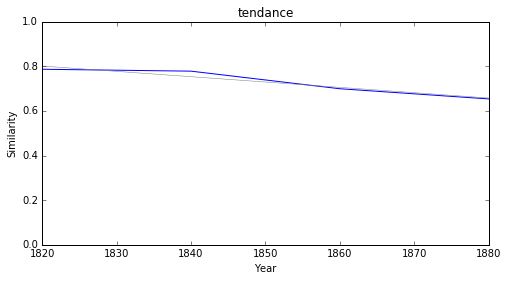

méthode


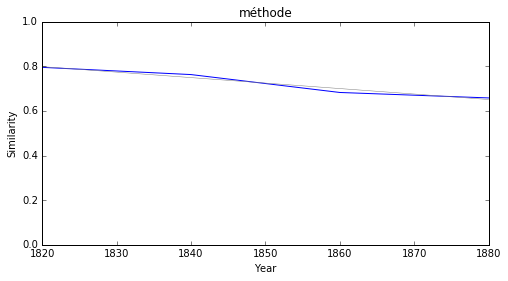

talent


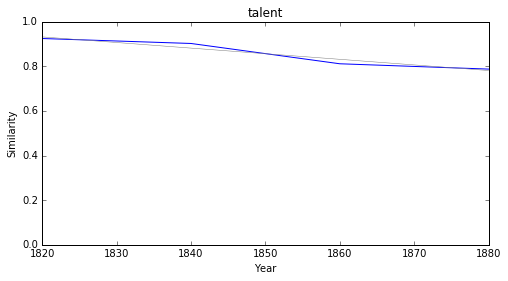

morale


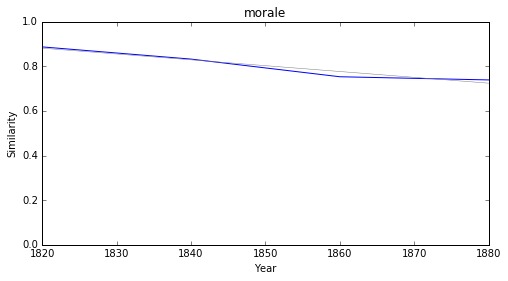

### <i><b>langue</i></b>

          token     slope         p
58       ligure  0.017885  0.045427
60     offusqué  0.013719  0.041684
51    évolution  0.003874  0.048935
18       devise  0.003626  0.007943
46        thèse  0.001993  0.046253
12      procédé -0.001295  0.040765
32  disposition -0.001998  0.018117
0      croyance -0.002137  0.034141
48   historique -0.002321  0.013468
30      mission -0.002328  0.033181



ligure


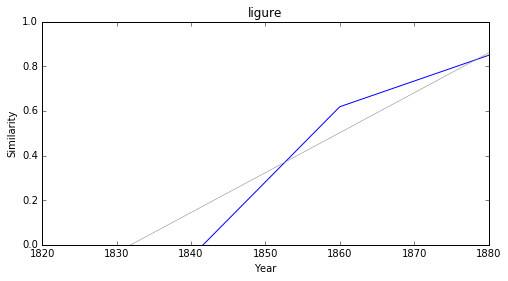

offusqué


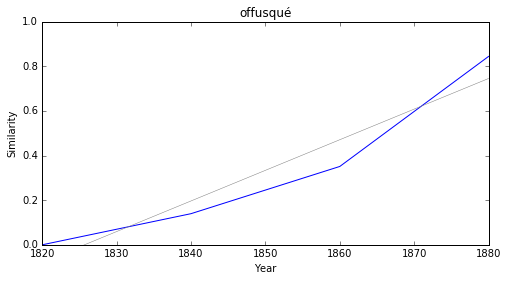

évolution


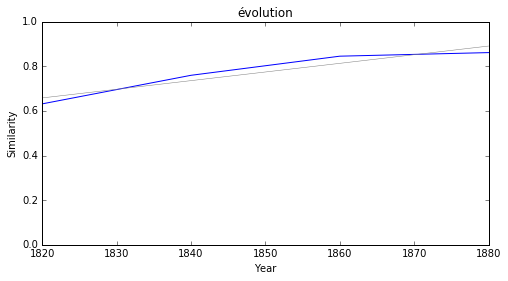

devise


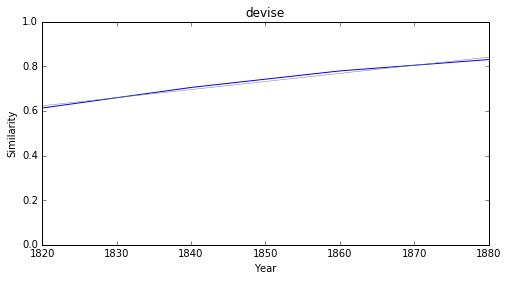

thèse


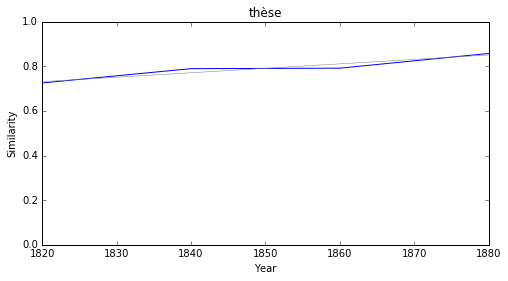

procédé


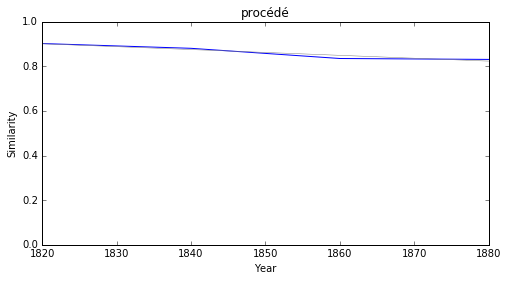

disposition


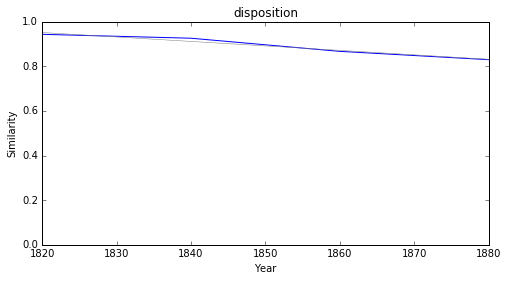

croyance


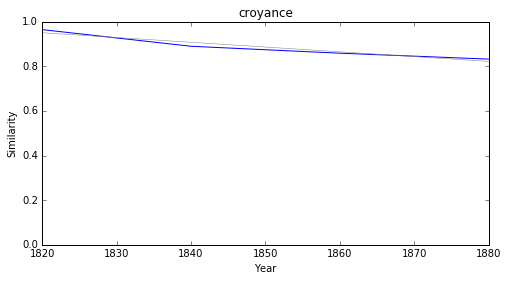

historique


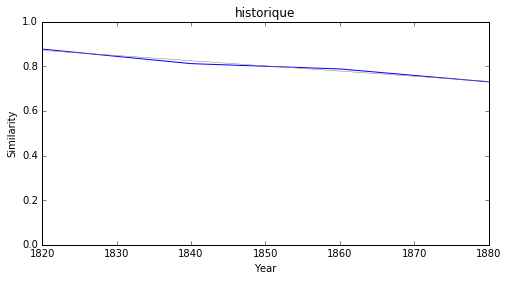

mission


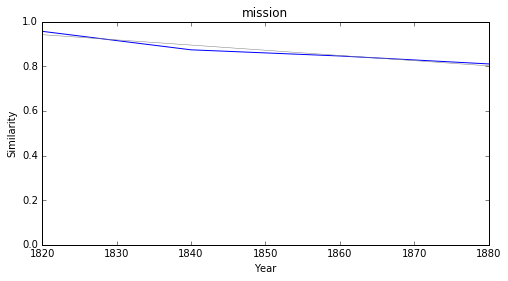

### <i><b>diplomatie</i></b>

           token     slope         p
6    compétition  0.015603  0.028272
68   dégrèvement  0.014307  0.046187
8      stratégie  0.006472  0.032153
90      donation  0.004327  0.027324
56  félicitation  0.004280  0.005215
23    confession -0.001293  0.003261
76    accusation -0.001351  0.018766
73    auxiliaire -0.001495  0.021666
97     tentative -0.001501  0.049495
71    conversion -0.001529  0.040239



compétition


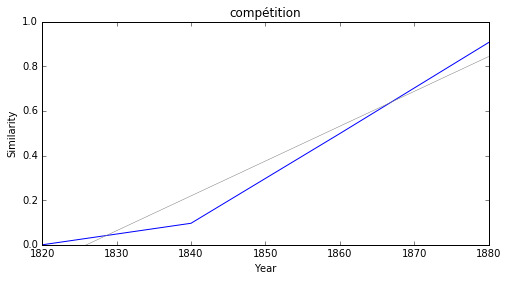

dégrèvement


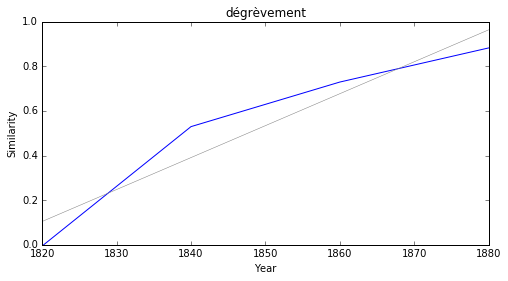

stratégie


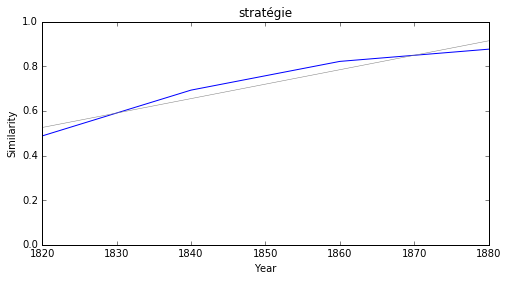

donation


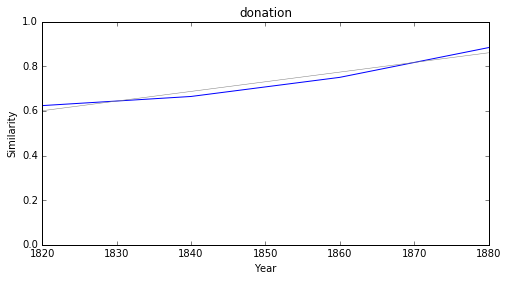

félicitation


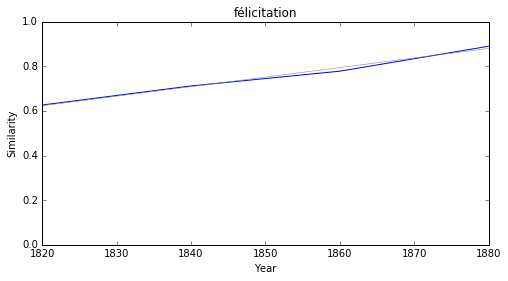

confession


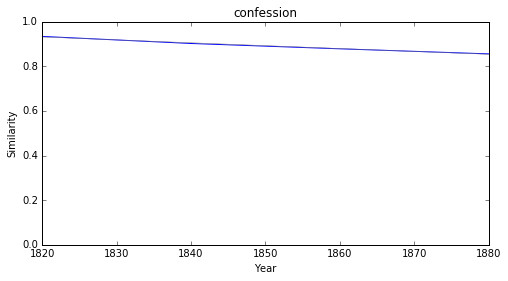

accusation


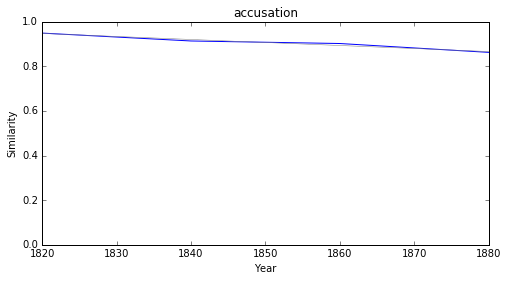

auxiliaire


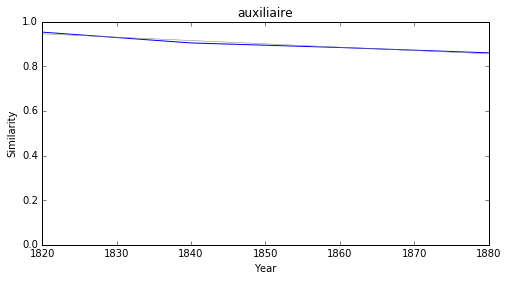

tentative


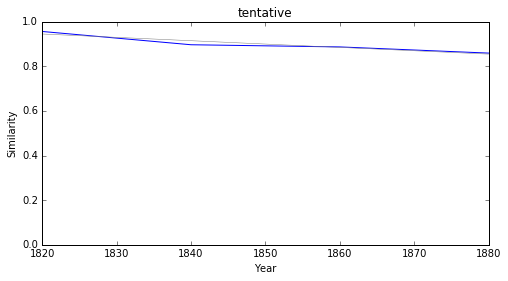

conversion


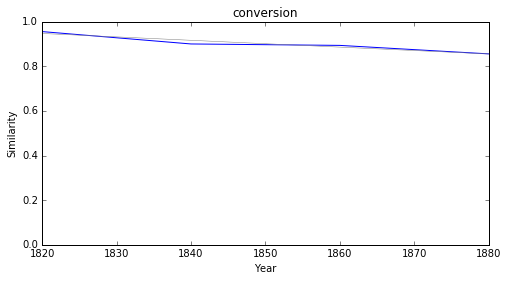

### <i><b>politique</i></b>

         token     slope         p
13   ingérence  0.010740  0.043739
12   électoral  0.005655  0.023942
71    principe -0.001436  0.026769
5        force -0.001503  0.041200
3    nécessité -0.001731  0.045832
14    critique -0.002062  0.036110
94    religion -0.002148  0.015891
33         art -0.002300  0.000617
23      absolu -0.002527  0.030603
100     peuple -0.002530  0.032991



ingérence


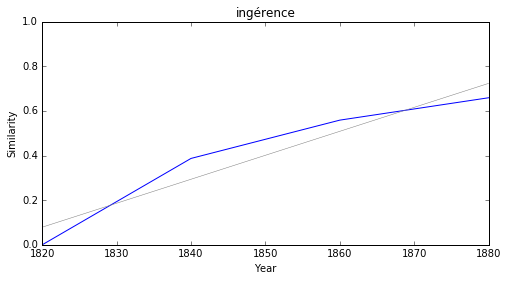

électoral


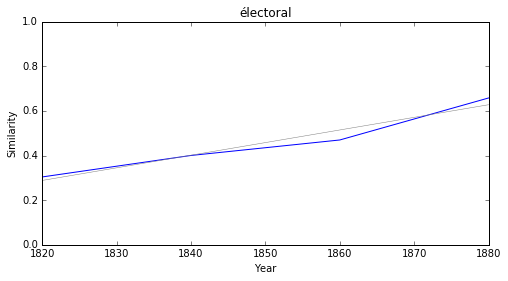

principe


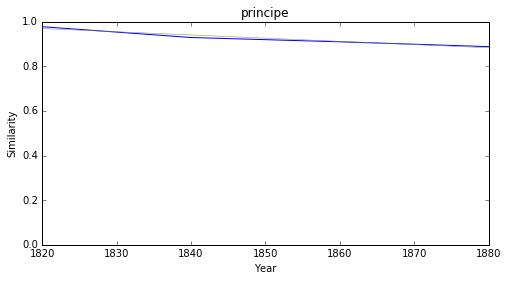

force


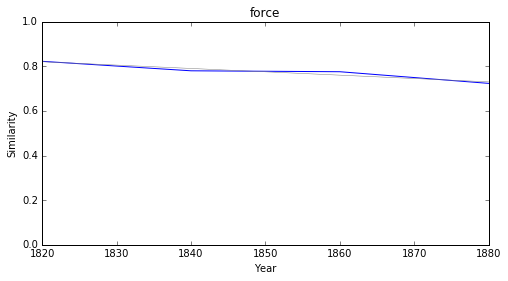

nécessité


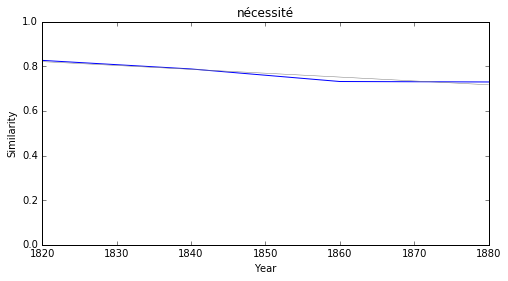

critique


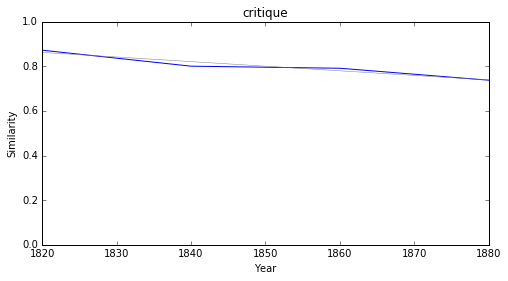

religion


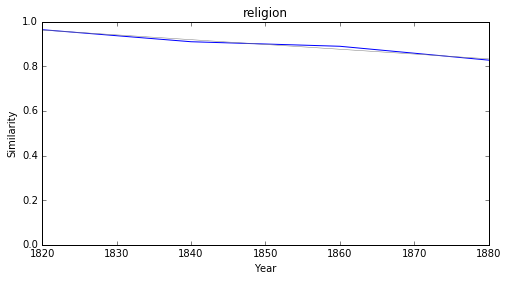

art


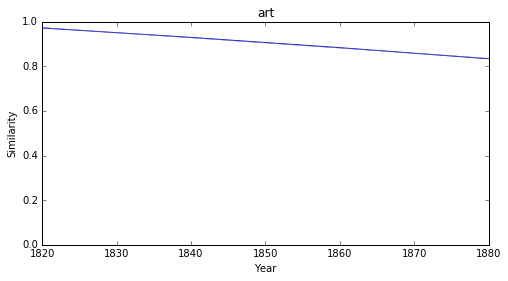

absolu


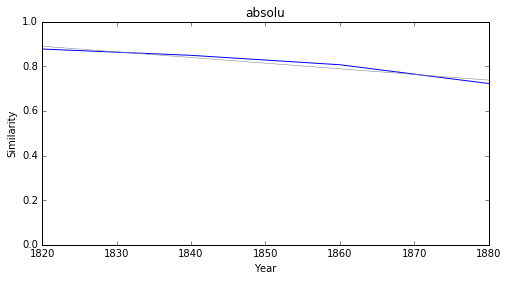

peuple


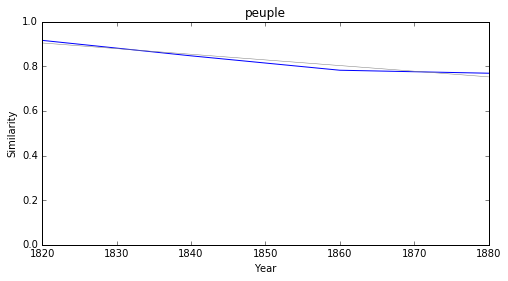

### <i><b>morale</i></b>

            token     slope         p
68   irréductible  0.013985  0.038140
28            art -0.001824  0.028311
67        intérêt -0.001889  0.035990
38      caractère -0.002122  0.014709
118        social -0.002285  0.013524
113      pratique -0.002296  0.024600
15     démocratie -0.002310  0.037612
72        science -0.002404  0.005120
92       garantie -0.002444  0.002345
7    intelligence -0.002473  0.019460



irréductible


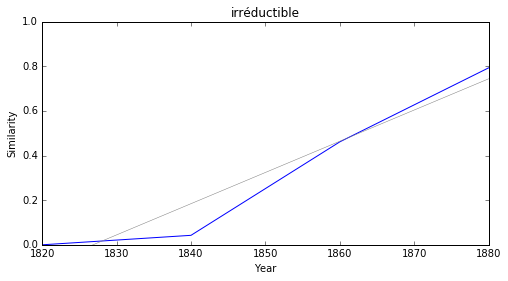

art


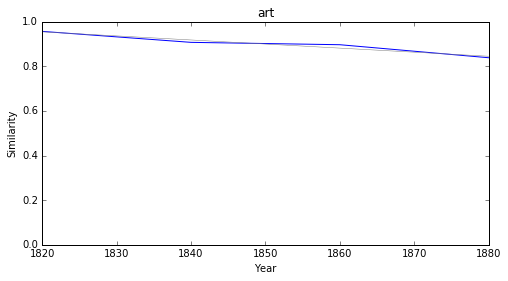

intérêt


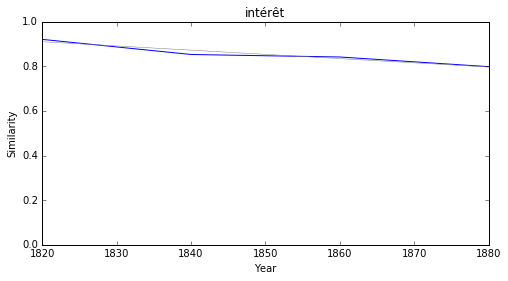

caractère


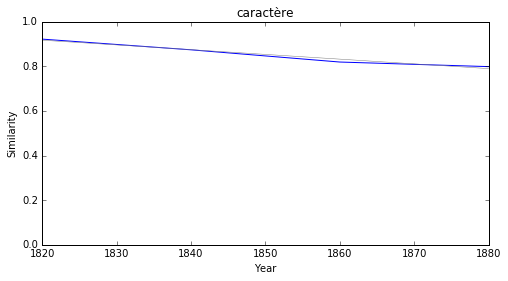

social


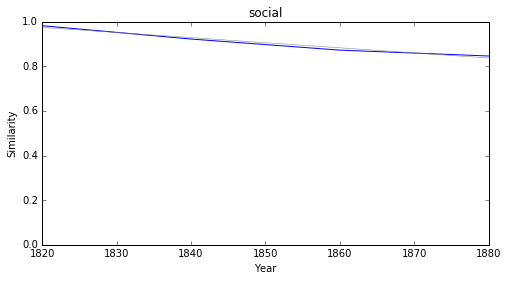

pratique


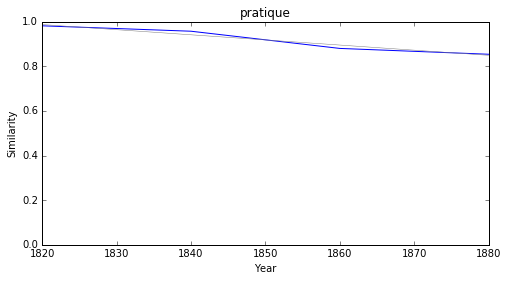

démocratie


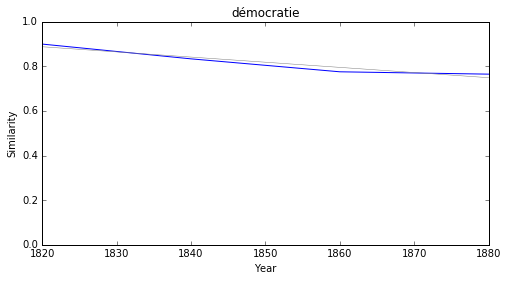

science


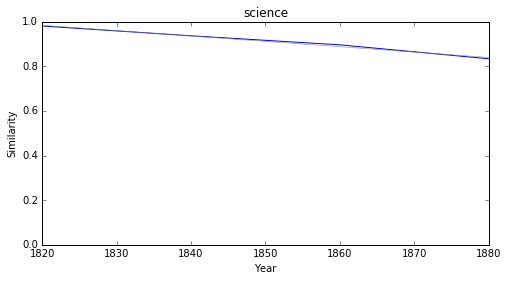

garantie


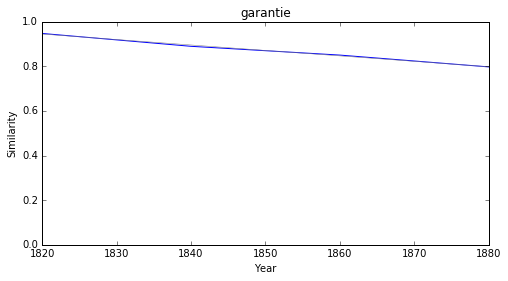

intelligence


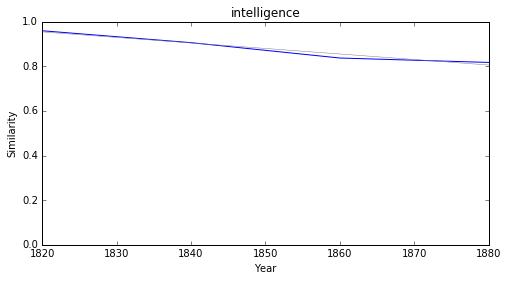

### <i><b>société</i></b>

          token     slope         p
9     ingérence  0.012192  0.022791
61    influence -0.001841  0.022127
21      procédé -0.001878  0.023496
28   importance -0.001897  0.046111
54      science -0.001911  0.003703
40    monarchie -0.001963  0.020835
64       nation -0.001965  0.045277
36        école -0.001971  0.005828
24      opinion -0.002028  0.030748
17  institution -0.002050  0.016399



ingérence


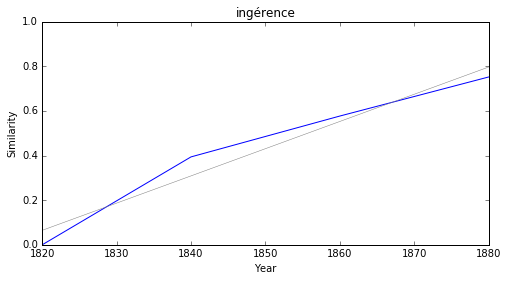

influence


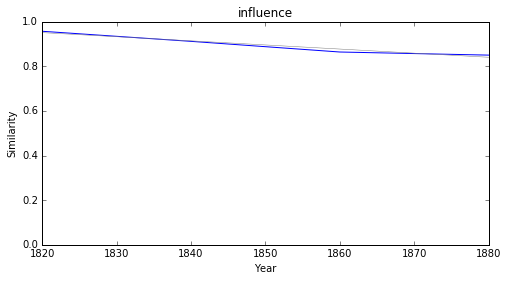

procédé


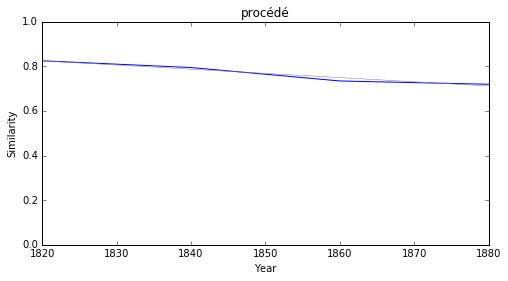

importance


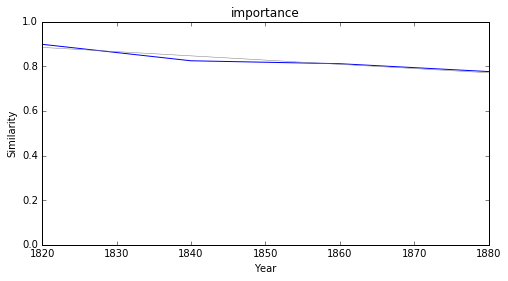

science


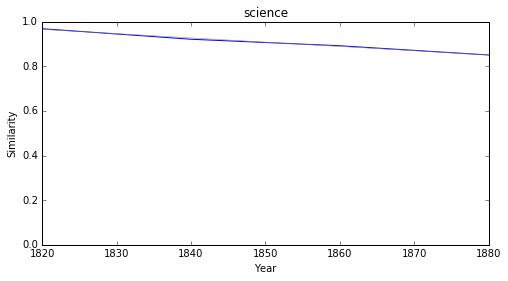

monarchie


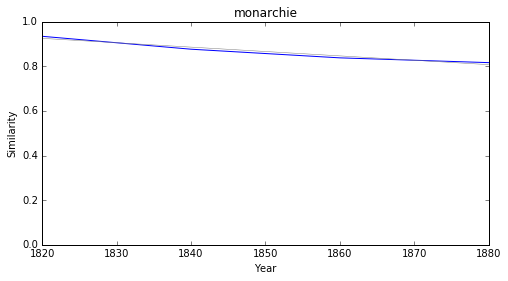

nation


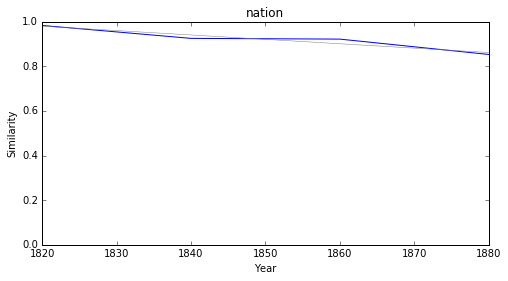

école


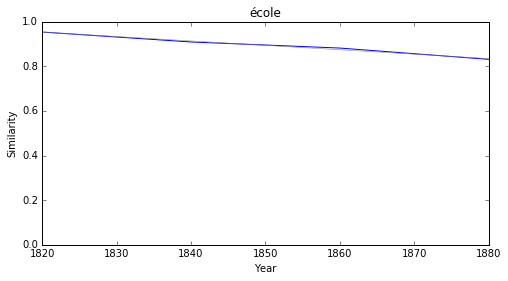

opinion


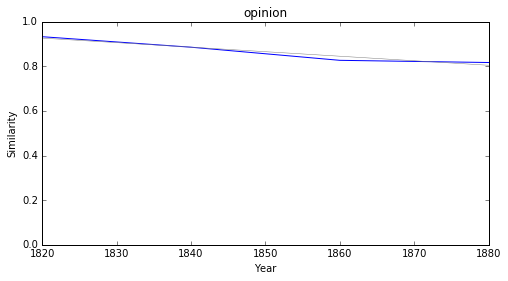

institution


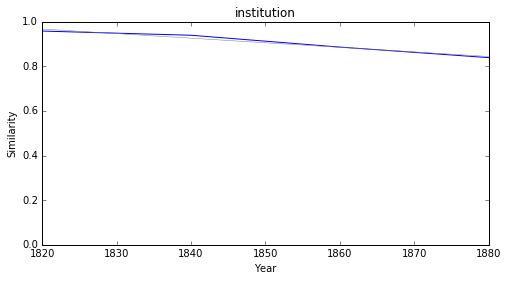

### <i><b>pouvoir</i></b>

              token     slope         p
44      humainement  0.009377  0.010440
8            berner  0.008327  0.037252
1         médisance  0.007886  0.031092
55  péremptoirement  0.007415  0.029162
15         illusion -0.001537  0.029111
67        politique -0.001574  0.004878
37            moyen -0.002209  0.035905
54          justice -0.002359  0.043892
20              but -0.002465  0.049889
63        situation -0.002489  0.001543



humainement


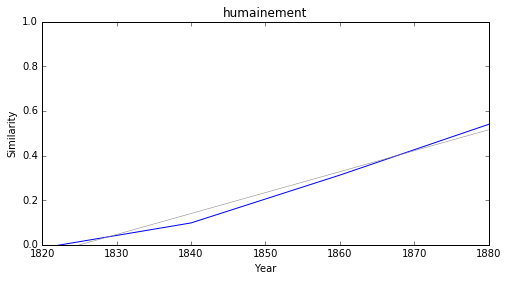

berner


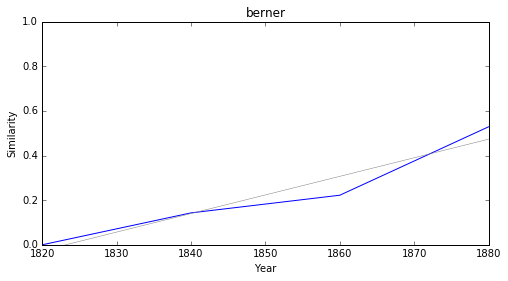

médisance


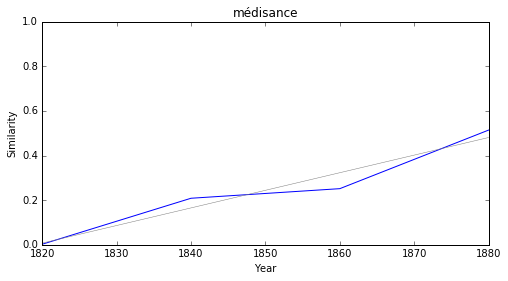

péremptoirement


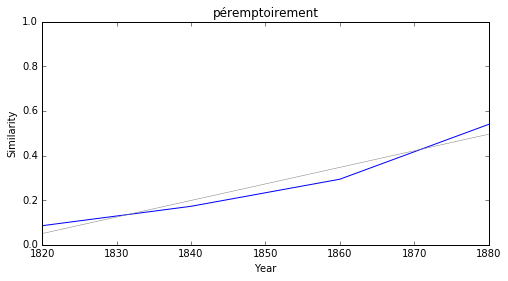

illusion


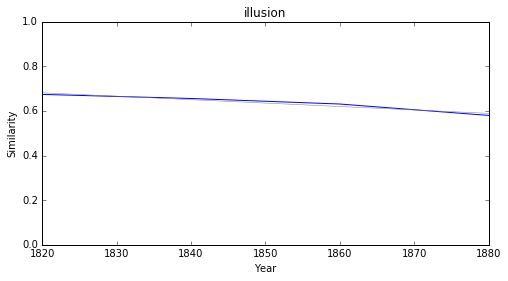

politique


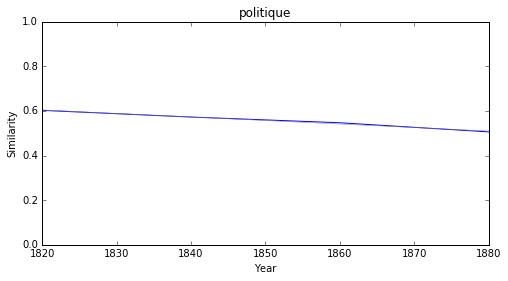

moyen


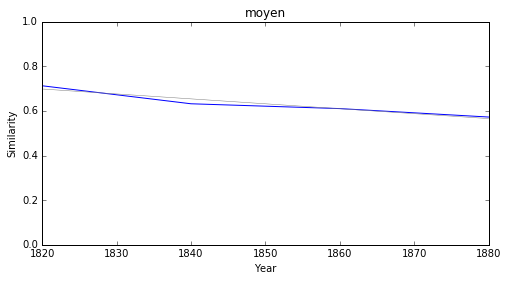

justice


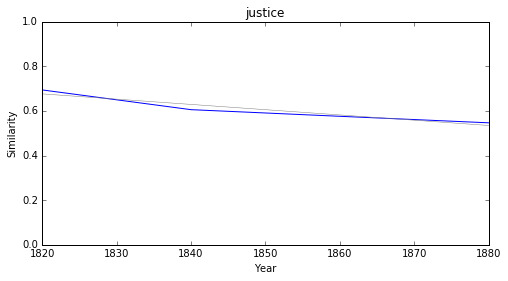

but


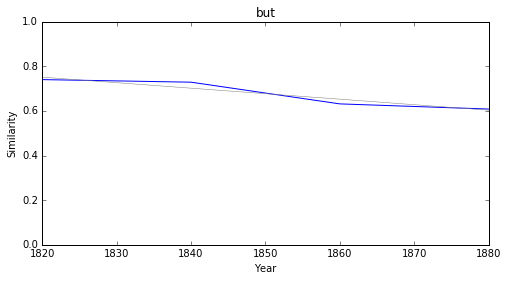

situation


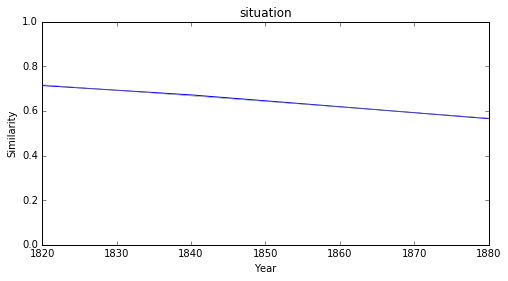

### <i><b>théologie</i></b>

          token     slope         p
10      breslau  0.016342  0.036485
51  positiviste  0.016208  0.036273
16      mayence  0.015294  0.024593
33       genèse  0.014879  0.014241
0       enclave  0.013961  0.036653
42    arbitrage  0.012126  0.016487
3     stratégie  0.008039  0.001387
20    orthodoxe  0.003543  0.024684
50  suppression  0.002274  0.019547
11     criminel -0.001746  0.004708



breslau


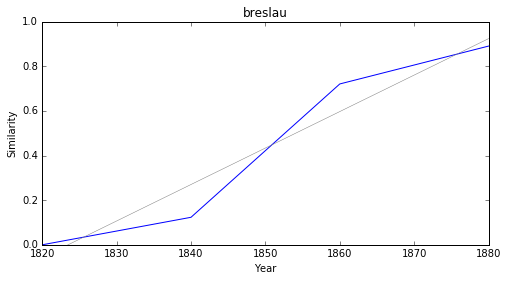

positiviste


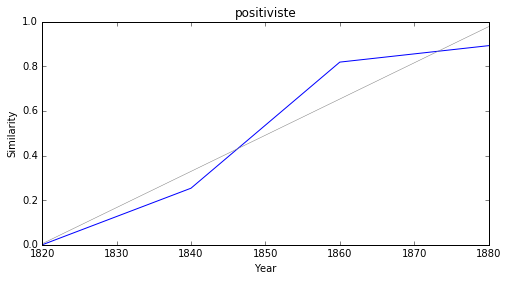

mayence


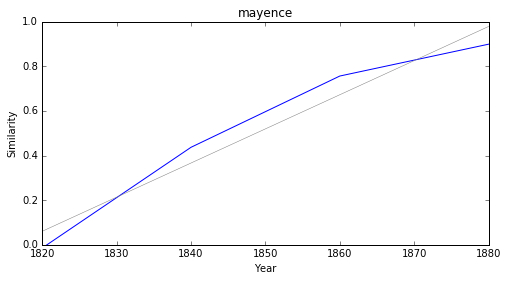

genèse


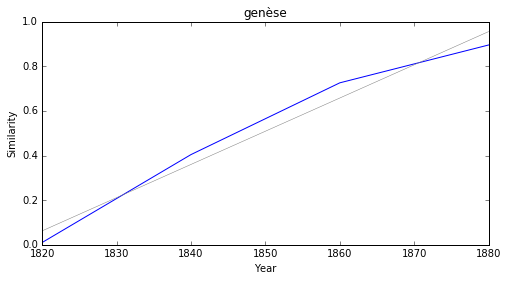

enclave


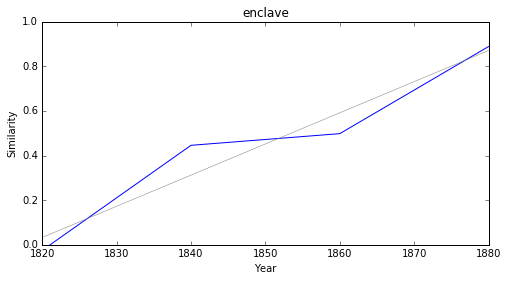

arbitrage


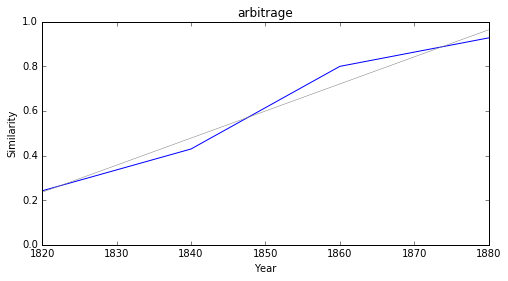

stratégie


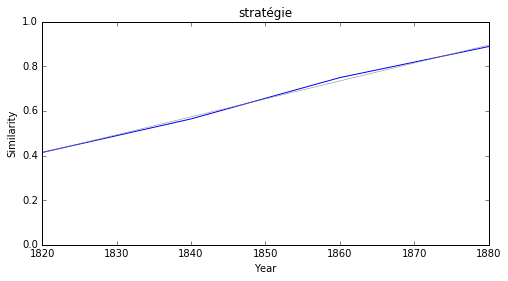

orthodoxe


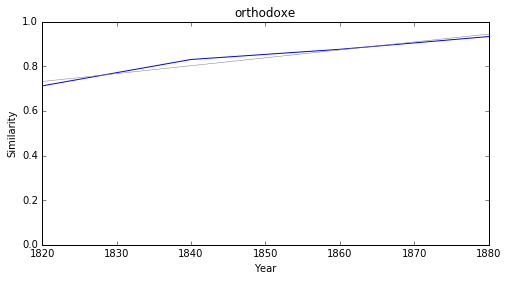

suppression


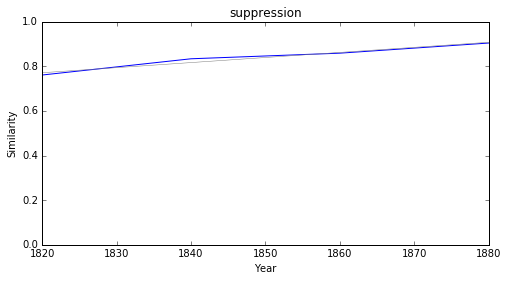

criminel


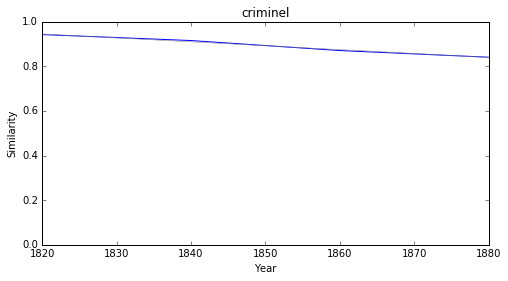

### <i><b>droit</i></b>

              token     slope         p
13        ingérence  0.010870  0.042973
68           raison -0.002296  0.011160
85         principe -0.002452  0.029501
106         liberté -0.002456  0.042787
87            parti -0.002463  0.049357
75        influence -0.002511  0.010790
54           besoin -0.002609  0.002606
33              but -0.002980  0.014875
103  responsabilité -0.003007  0.010548
39      conséquence -0.003025  0.022695



ingérence


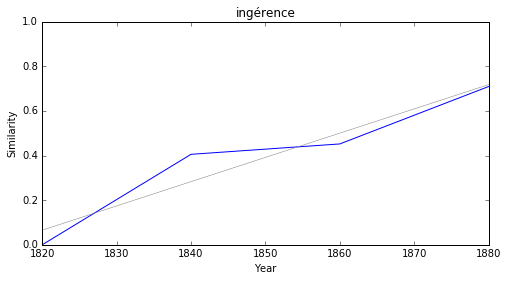

raison


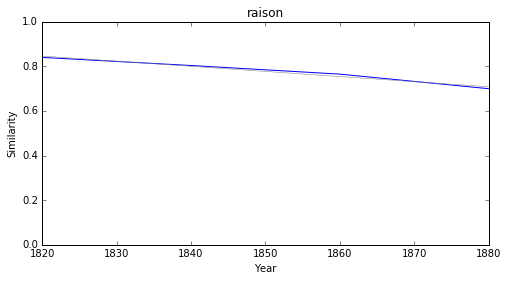

principe


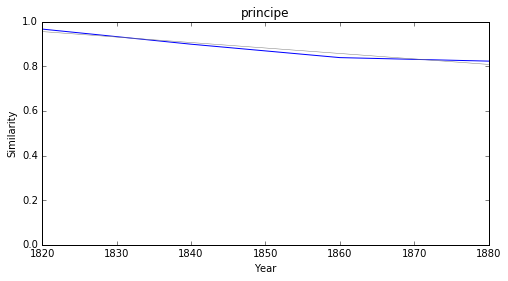

liberté


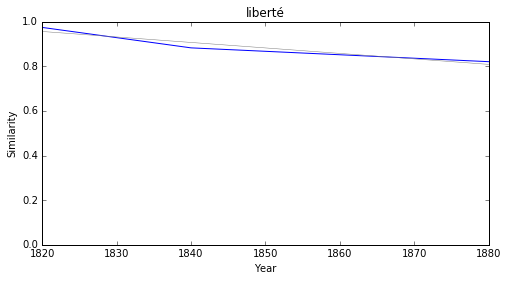

parti


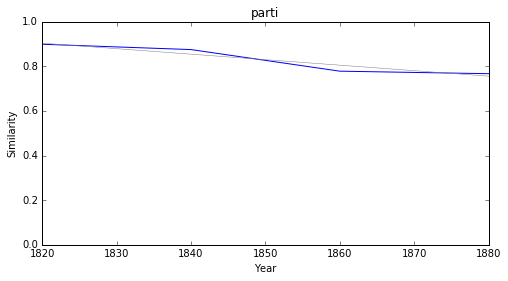

influence


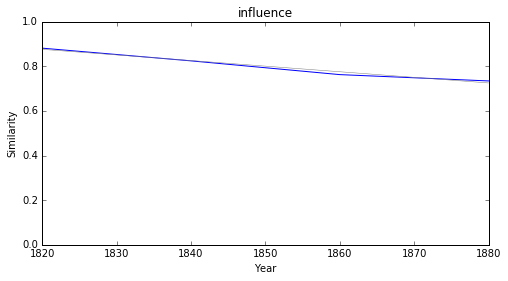

besoin


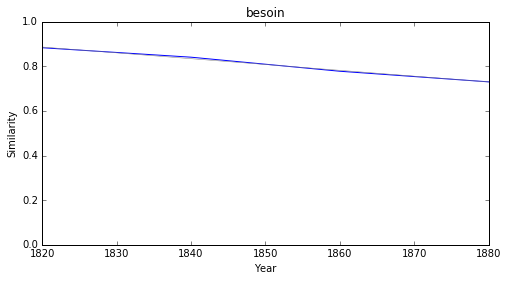

but


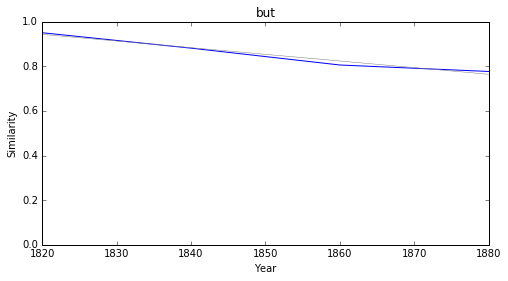

responsabilité


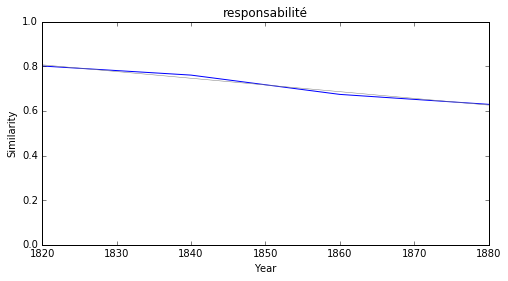

conséquence


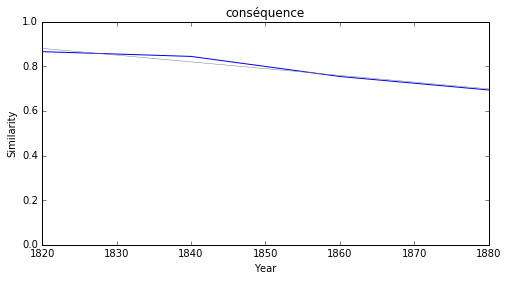

### <i><b>loi</i></b>

             token     slope         p
14       ingérence  0.011580  0.037077
8    théoriquement  0.011070  0.043036
110         nation -0.001591  0.031155
142          règle -0.002100  0.049025
39       religieux -0.002454  0.032087
113        essence -0.002571  0.022237
70       monarchie -0.002584  0.000842
45         procédé -0.002679  0.036882
141           état -0.002693  0.024566
7         tendance -0.002805  0.010189



ingérence


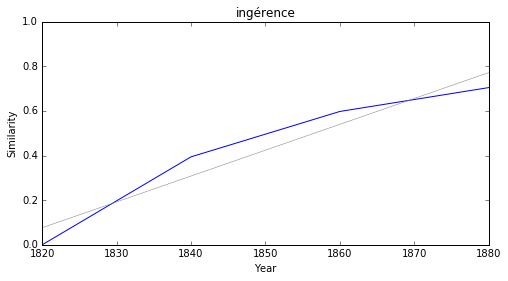

théoriquement


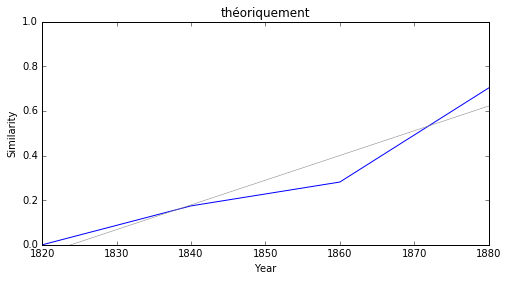

nation


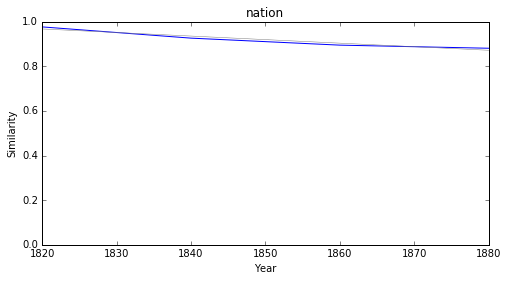

règle


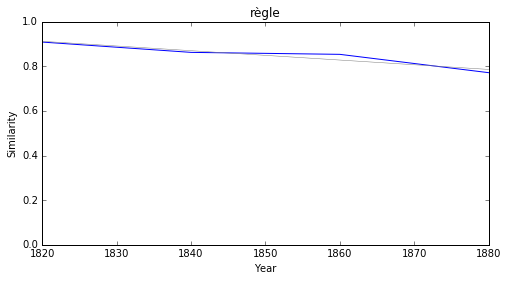

religieux


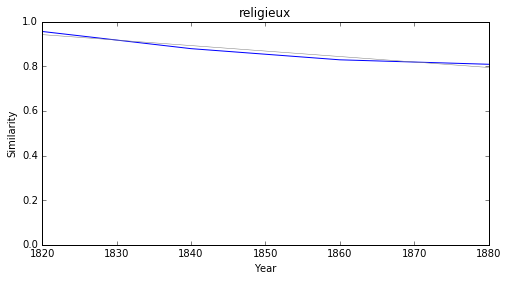

essence


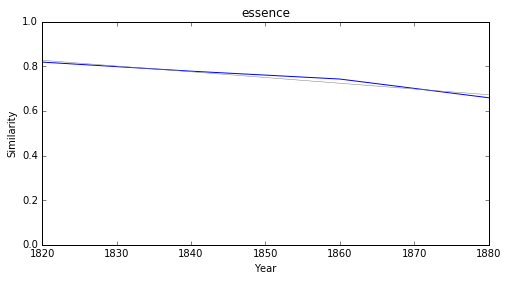

monarchie


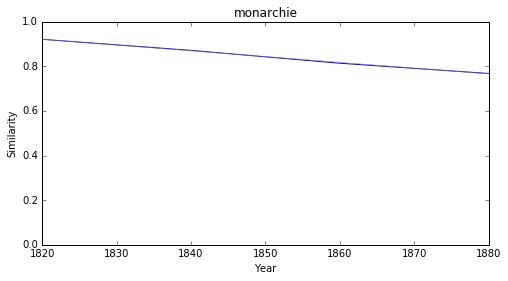

procédé


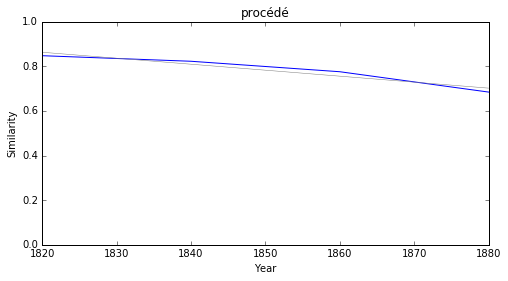

état


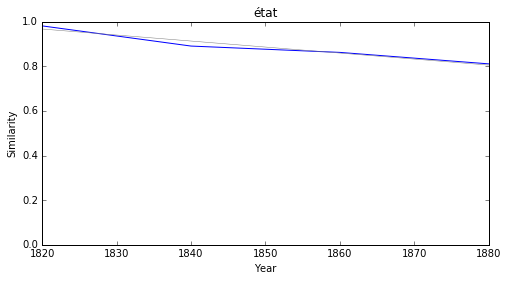

tendance


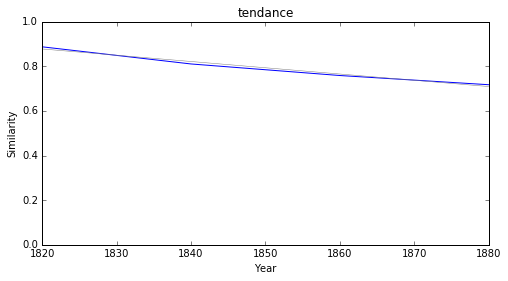

### <i><b>méthode</i></b>

            token     slope         p
24        quinine  0.015808  0.037095
114  entraînement -0.000991  0.009192
70        préjugé -0.001271  0.023138
121    profession -0.001377  0.024176
6        tendance -0.001392  0.026156
65   intervention -0.001435  0.049911
5        croyance -0.001439  0.047691
47        qualité -0.001494  0.012870
68       grandeur -0.001512  0.026904
37      ressource -0.001578  0.001074



quinine


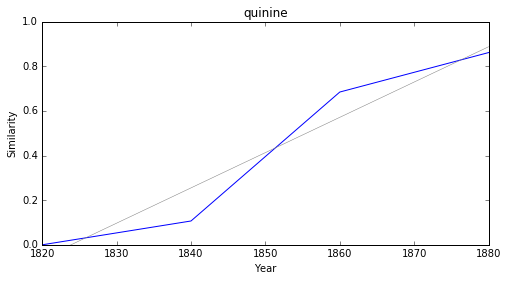

entraînement


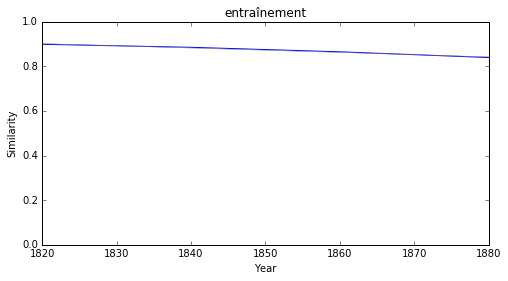

préjugé


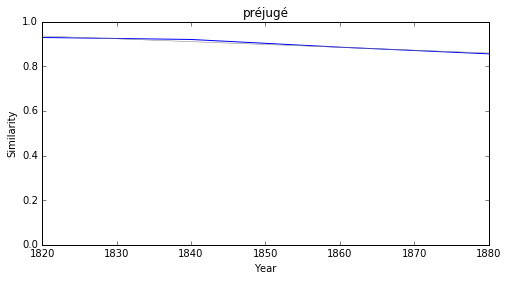

profession


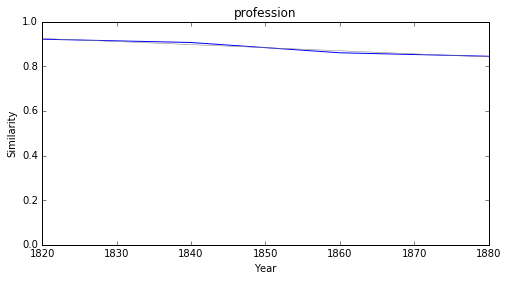

tendance


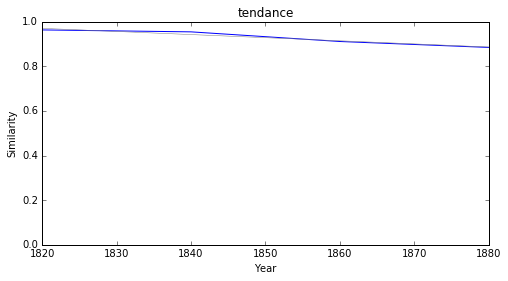

intervention


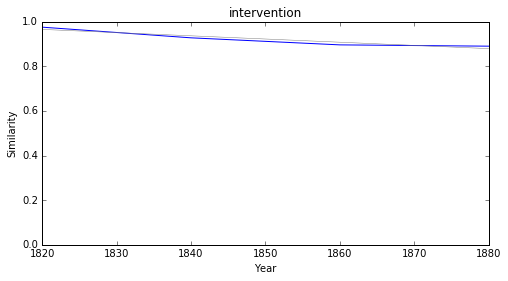

croyance


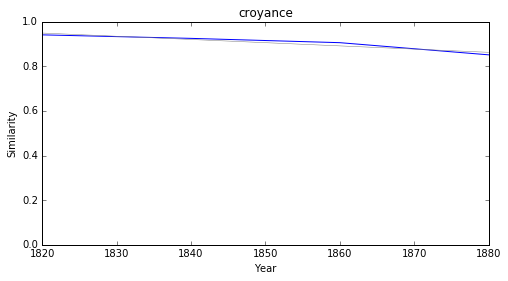

qualité


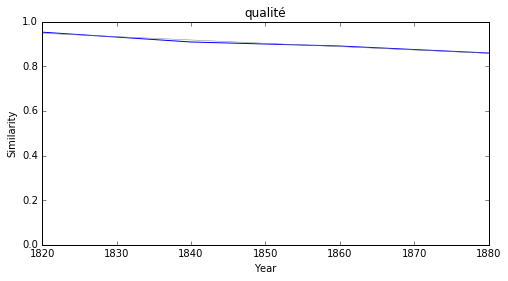

grandeur


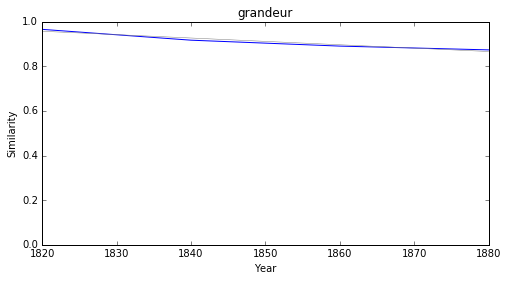

ressource


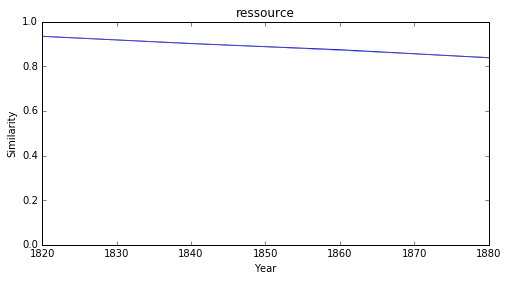

### <i><b>génie</i></b>

           token     slope         p
12     ingérence  0.014089  0.007894
28      tactique  0.007133  0.027211
86      fraction  0.002154  0.008874
42         moral -0.001368  0.046415
83        modéré -0.001582  0.036823
65       élément -0.001732  0.002654
39      doctrine -0.001842  0.041764
22     extension -0.002049  0.005894
48      noblesse -0.002070  0.012684
17  intellectuel -0.002073  0.002055



ingérence


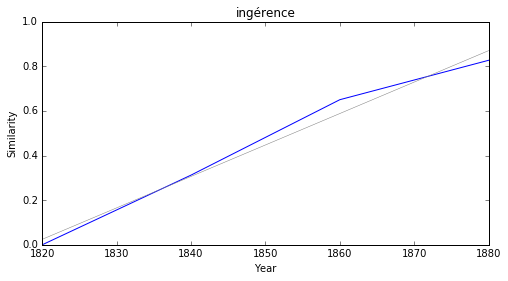

tactique


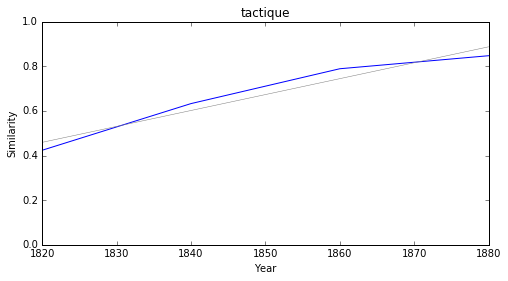

fraction


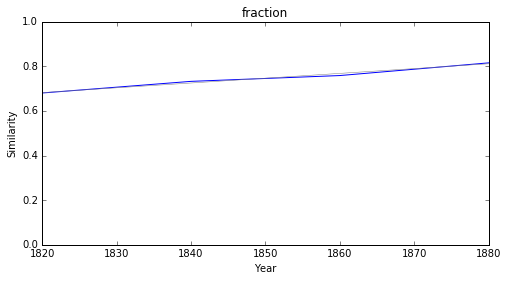

moral


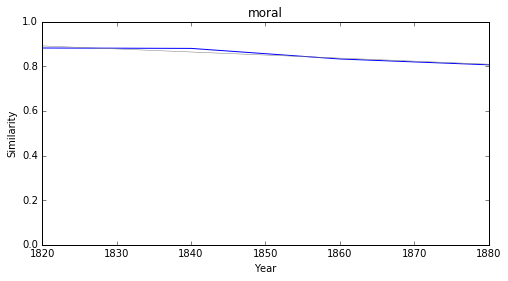

modéré


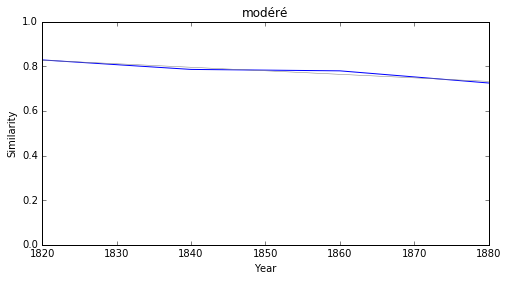

élément


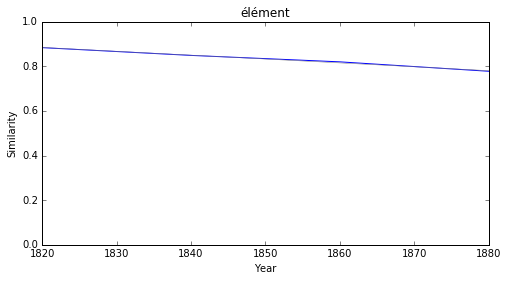

doctrine


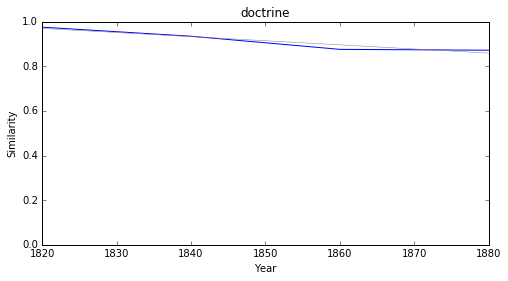

extension


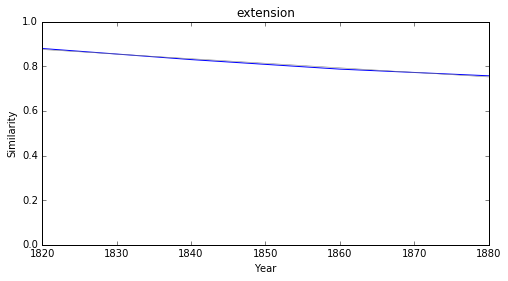

noblesse


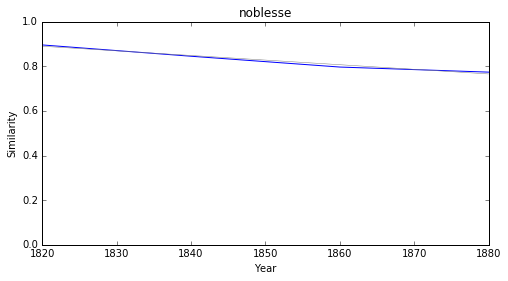

intellectuel


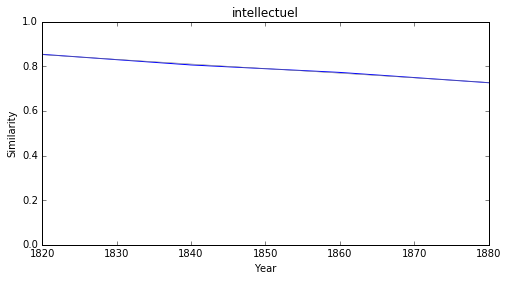

### <i><b>romantisme</i></b>

          token     slope         p
17        vigny  0.018439  0.025716
23       borgia  0.017853  0.024510
3      invalide  0.017548  0.025692
6     électorat  0.017533  0.020528
30          for  0.016387  0.026694
20     objectif  0.016373  0.031353
9    moralement  0.015458  0.021212
11     conjugal  0.015429  0.026207
0   physiologie  0.015150  0.025562
7   notoirement  0.015140  0.046848



vigny


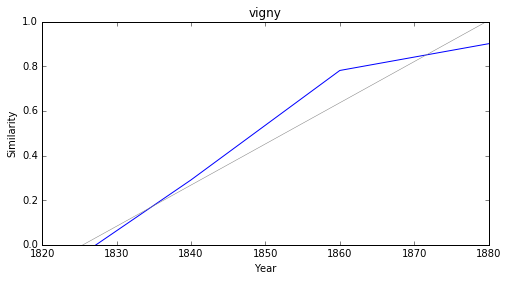

borgia


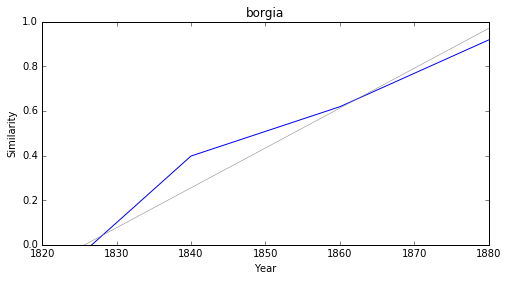

invalide


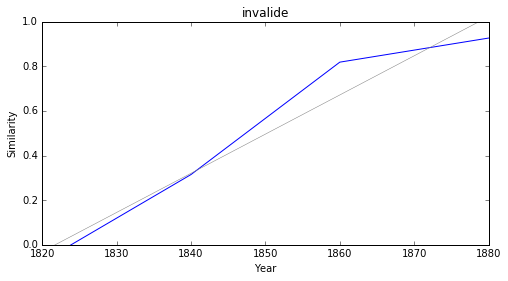

électorat


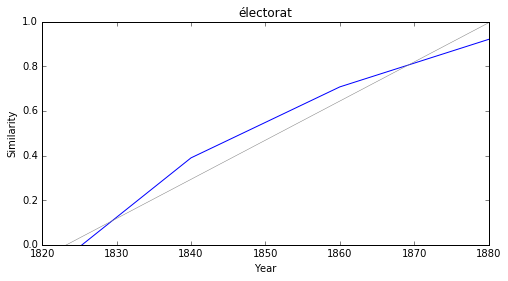

for


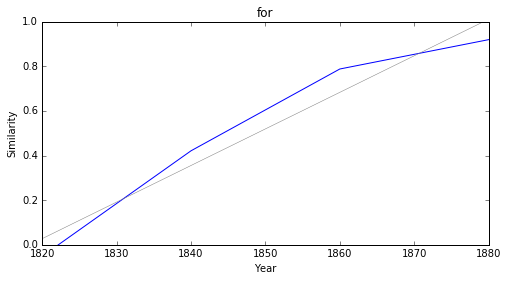

objectif


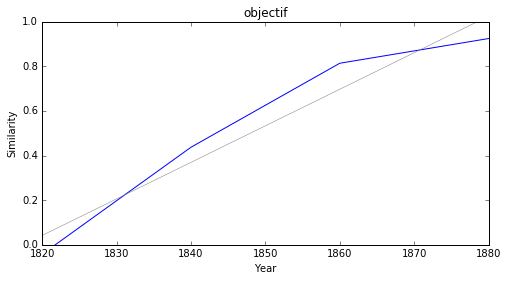

moralement


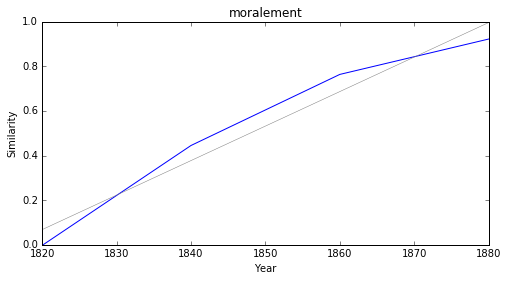

conjugal


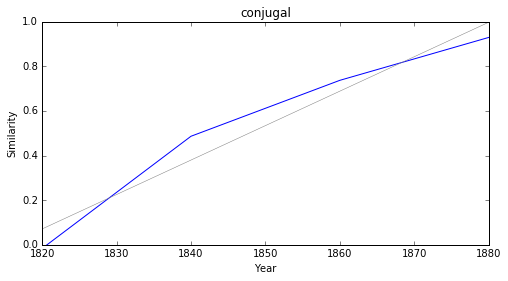

physiologie


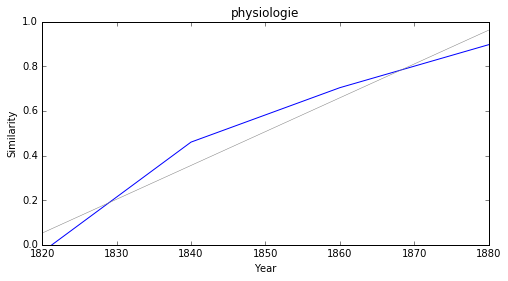

notoirement


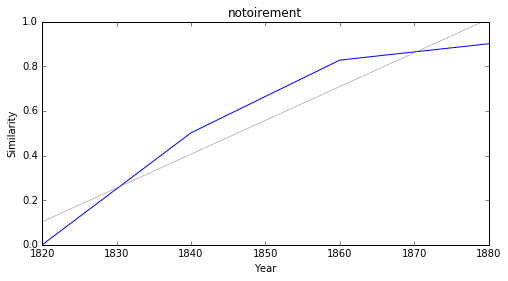

### <i><b>réalisme</i></b>

             token     slope         p
6          assumer  0.019816  0.027574
8        condillac  0.019199  0.040982
10      stephenson  0.016852  0.048451
12         picorer  0.016681  0.033938
3         giboulée  0.016597  0.042483
5             pâté  0.016554  0.048890
15     contrariant  0.016062  0.026361
2               pé  0.015816  0.018827
13      pourriture  0.015720  0.049079
9   outrageusement  0.015652  0.006961



assumer


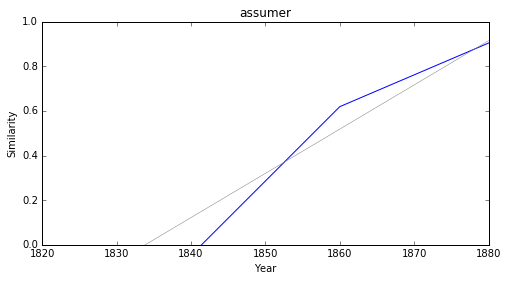

condillac


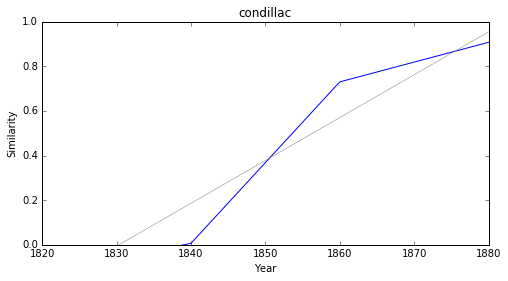

stephenson


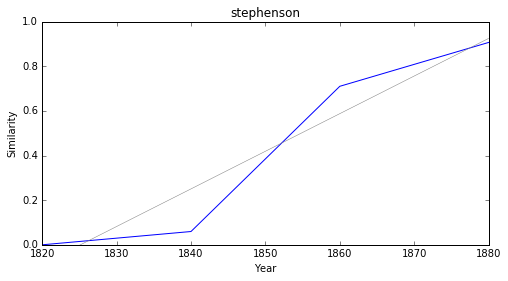

picorer


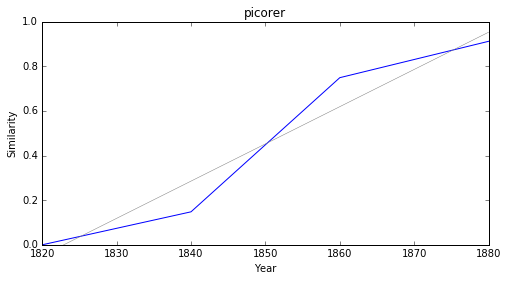

giboulée


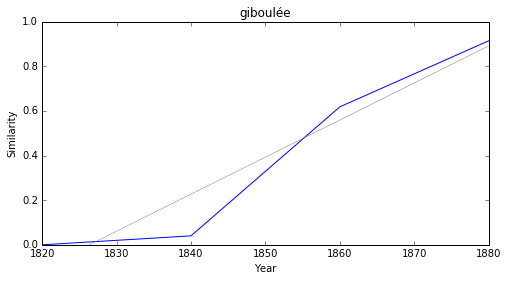

pâté


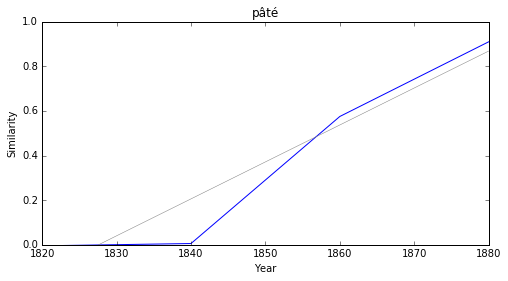

contrariant


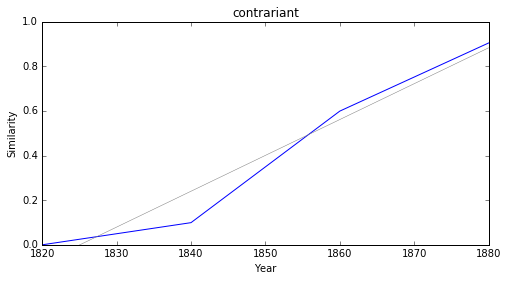

pé


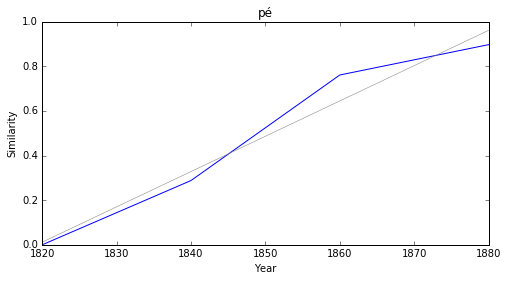

pourriture


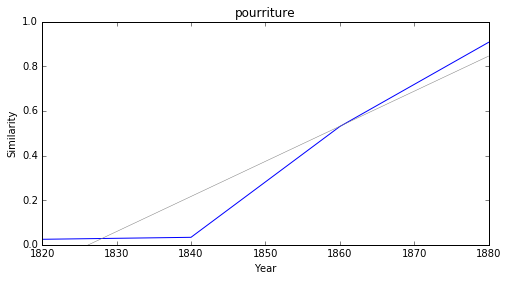

outrageusement


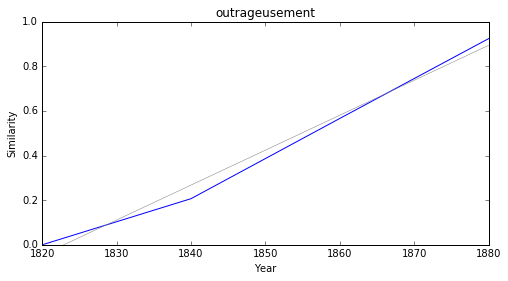

### <i><b>symbolisme</i></b>

            token     slope         p
8       boulanger  0.014525  0.025732
2         fédéral  0.013281  0.032013
10  inappréciable  0.012813  0.015061
3         surtaxe  0.012059  0.034377
1          primat  0.011806  0.032218
5          octroi  0.011617  0.024266
6      marécageux  0.010829  0.047873
4     omnipotence  0.010525  0.029241
0        patrocle  0.010407  0.026735
9            hung  0.009692  0.033139



boulanger


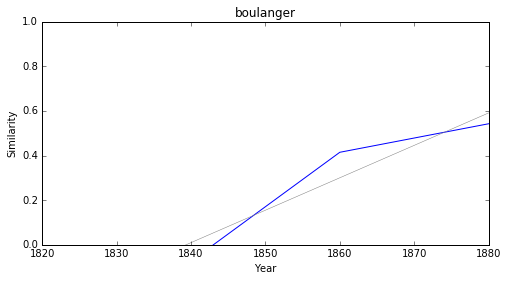

fédéral


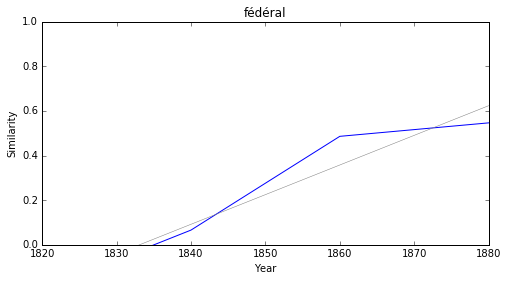

inappréciable


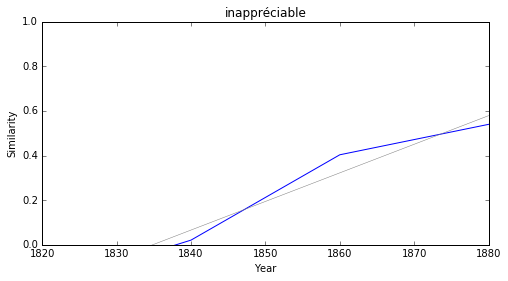

surtaxe


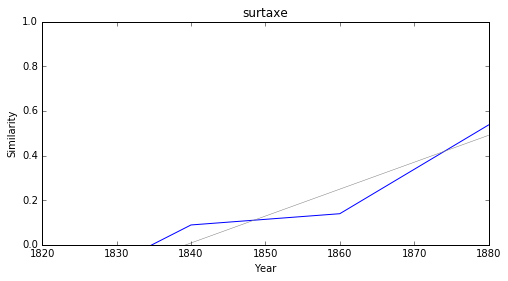

primat


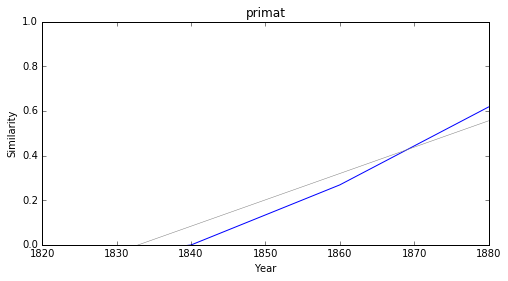

octroi


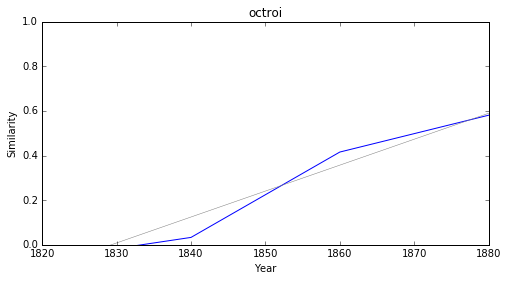

marécageux


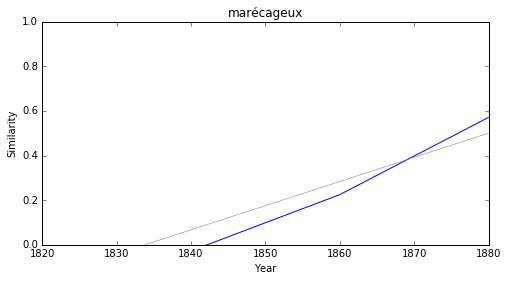

omnipotence


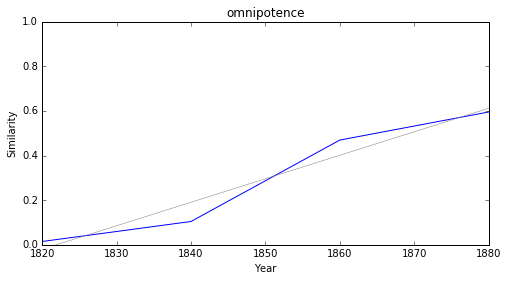

patrocle


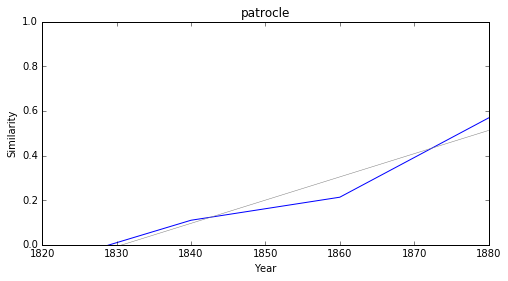

hung


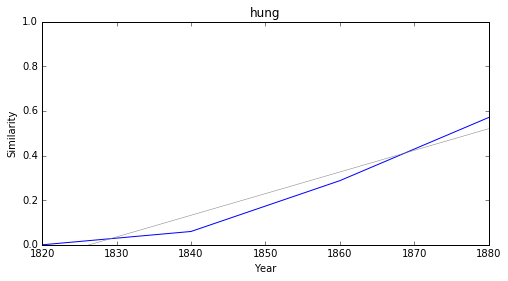

### <i><b>naturalisme</i></b>

           token     slope         p
21        conrad  0.017726  0.049440
12          watt  0.017302  0.037589
8          isaïe  0.017289  0.038633
1         crèche  0.017085  0.020745
16         vigny  0.017012  0.018021
6        laybach  0.016977  0.010704
5   prolégomènes  0.016840  0.028643
4     cosmogonie  0.016348  0.038720
14         ferré  0.016041  0.019310
3         mylord  0.015907  0.045543



conrad


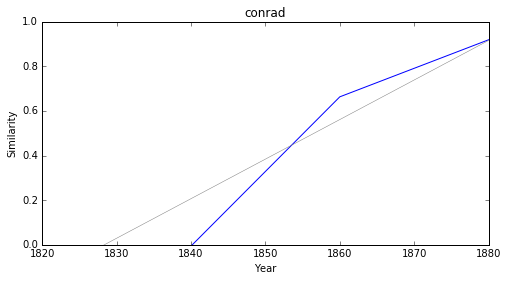

watt


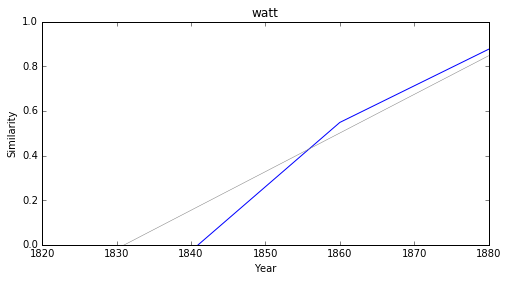

isaïe


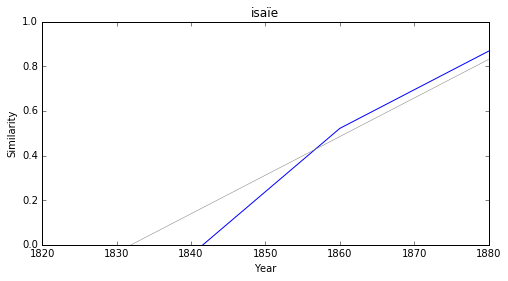

crèche


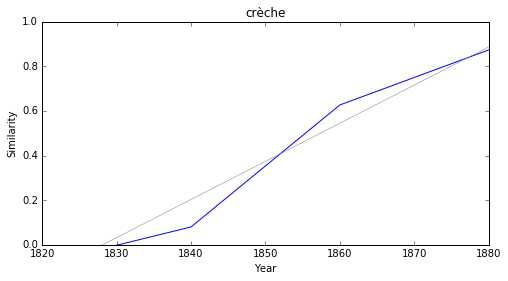

vigny


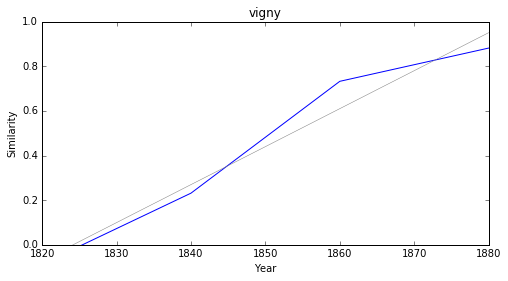

laybach


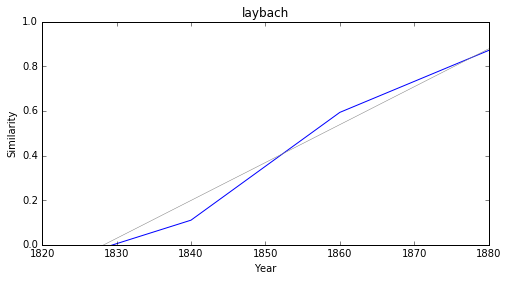

prolégomènes


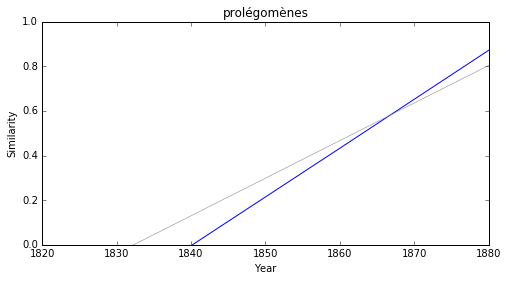

cosmogonie


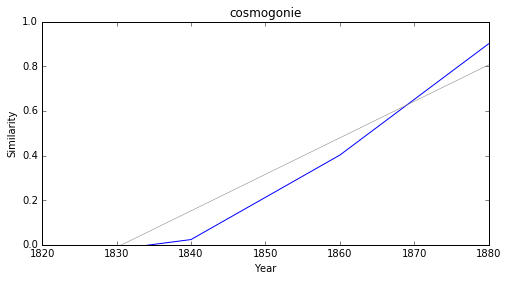

ferré


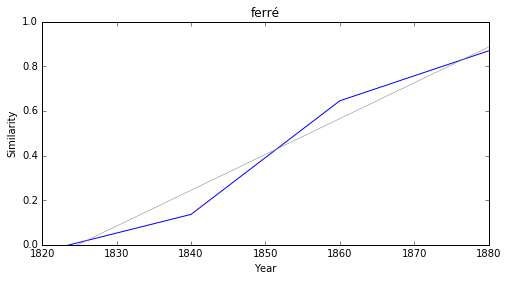

mylord


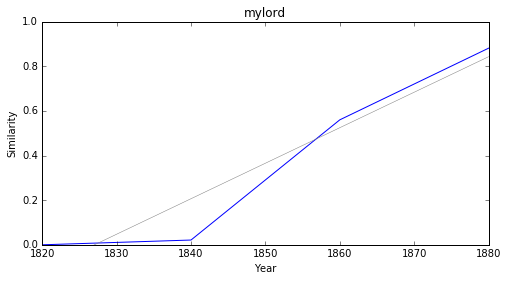

In [49]:
import pandas as pd
from IPython.display import Markdown, display
pd.set_option('display.max_rows', 1000)

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df1 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df1.sort_values('slope', ascending=False).head(10))
    print('\n\n')
    
    for i, row in df1.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)

# Decreasing

This is the same process here : we want to see which terms tend to <b>disassociate</b> themselves from "littérature" (by default, which you can change with the trained models). Then again, you have to check the p values. "transplantation", "choeur" and "philé" are not considered significant, "chaldéen" is, and "destination", "morceau", etc. are as well. The fact that those are less significant is logical : the fewer the terms, the more erratic their series tend to be.

### <i><b>littérature</i></b>

        token     slope         p
83  géographe -0.015757  0.027133
43  mahométan -0.015267  0.037757
46   dialecte -0.013514  0.037056
23     cortès -0.012651  0.006905
58      étage -0.009194  0.014811
10    détroit -0.008516  0.001436
62     troupe -0.008314  0.017857
70      armée -0.007865  0.003266
80      ligne -0.007592  0.029598
98   barbarie -0.007355  0.003667



géographe


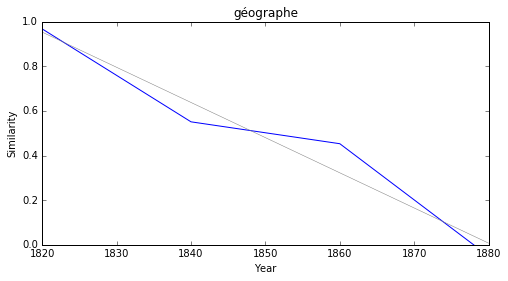

mahométan


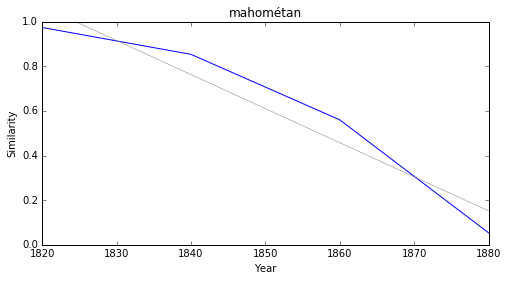

dialecte


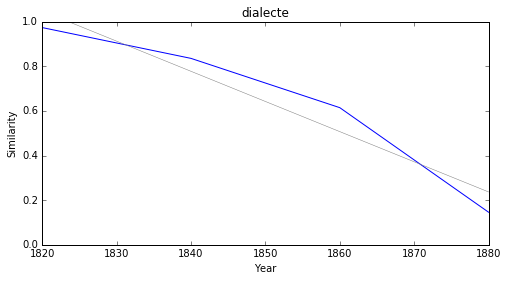

cortès


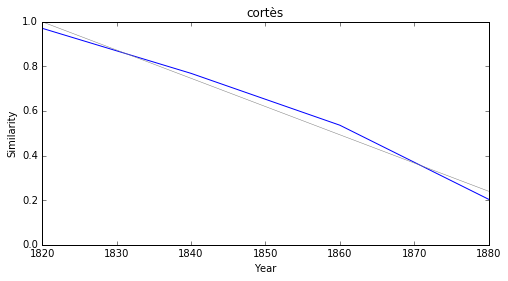

étage


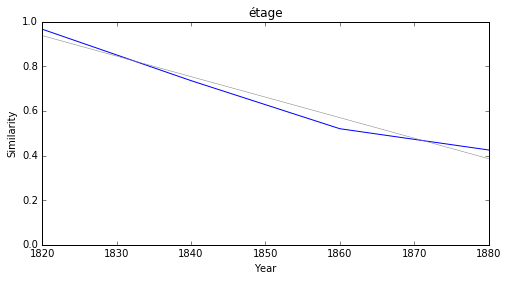

détroit


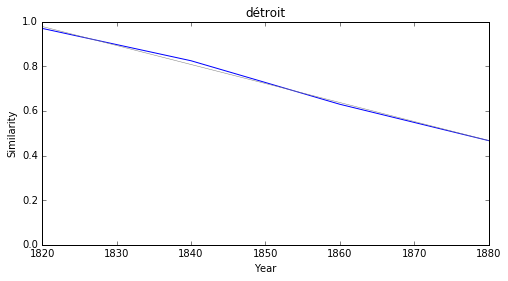

troupe


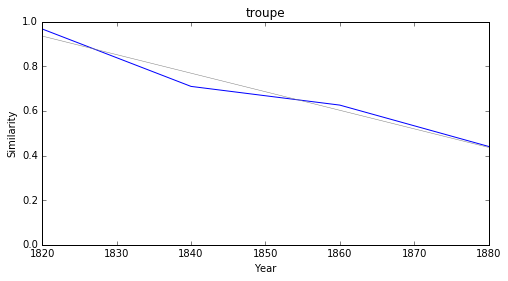

armée


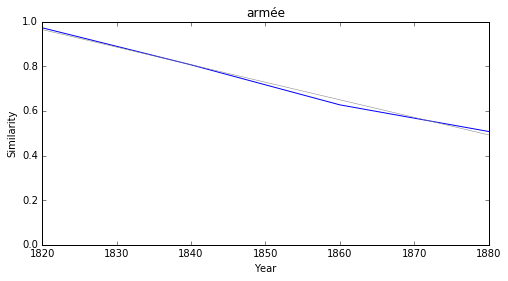

ligne


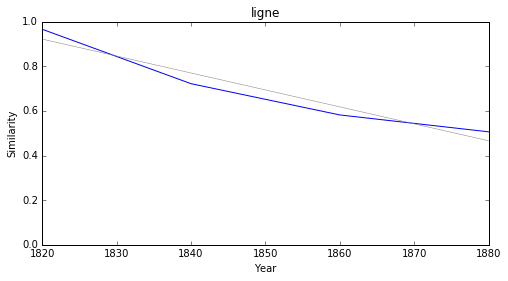

barbarie


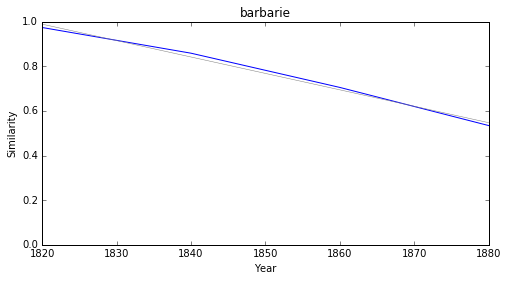

### <i><b>poésie</i></b>

         token     slope         p
10       mably -0.016867  0.025046
38   mahométan -0.015830  0.038863
42    dialecte -0.013144  0.028955
1          eau -0.011813  0.048568
16    français -0.011090  0.021440
97       corps -0.010094  0.042067
36     presque -0.009632  0.017308
43        jury -0.009430  0.014418
92  angleterre -0.009342  0.012717
57  navigateur -0.009145  0.034269



mably


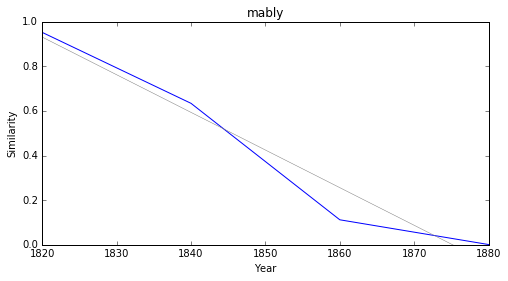

mahométan


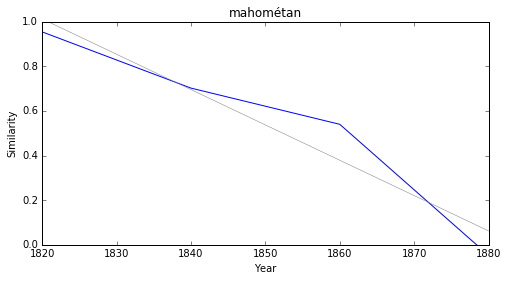

dialecte


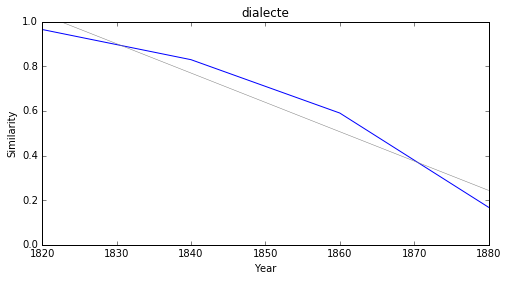

eau


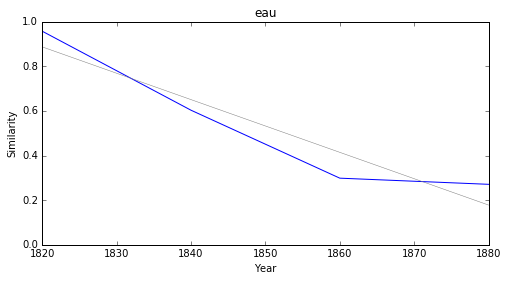

français


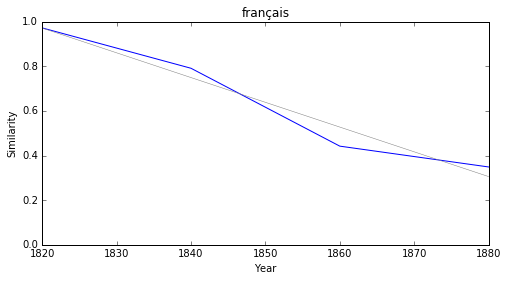

corps


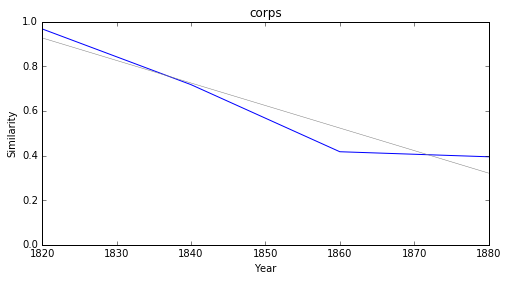

presque


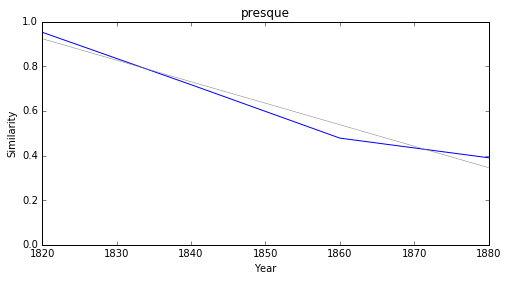

jury


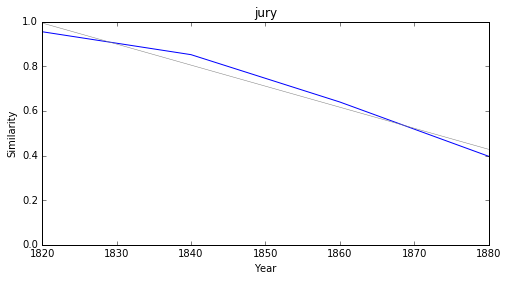

angleterre


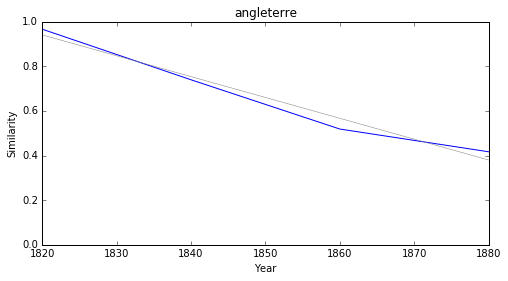

navigateur


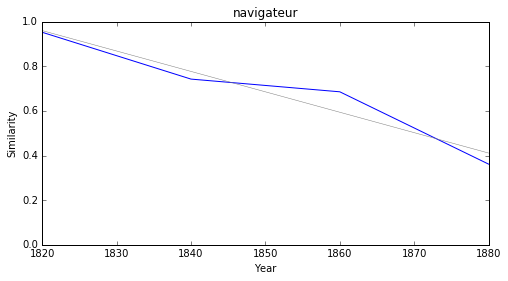

### <i><b>science</i></b>

           token     slope         p
16     mahométan -0.018531  0.006524
36     géographe -0.017698  0.025349
1       idolâtre -0.015748  0.012714
19      dialecte -0.012565  0.023560
27    navigateur -0.010153  0.020703
42    évaluation -0.009018  0.043152
24      moralité -0.007411  0.010340
6   régénération -0.007083  0.013936
39         telle -0.006333  0.012455
7       français -0.005956  0.000211



mahométan


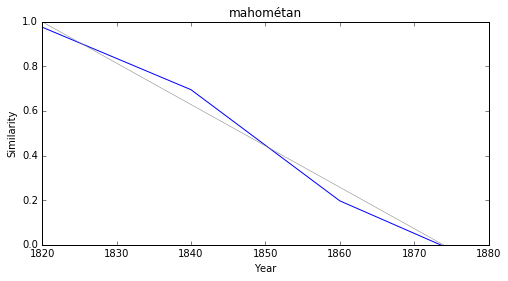

géographe


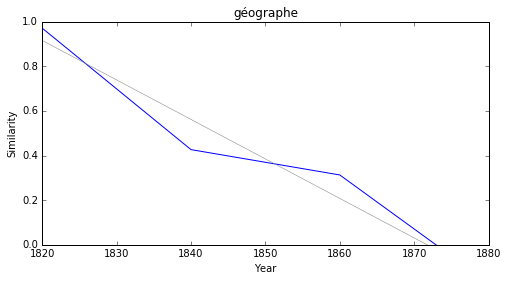

idolâtre


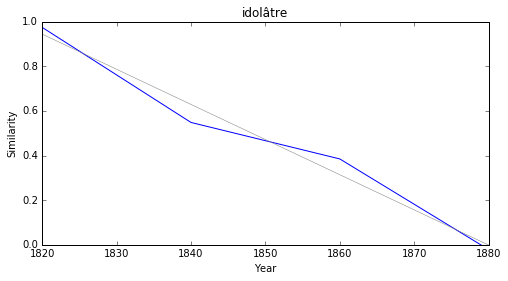

dialecte


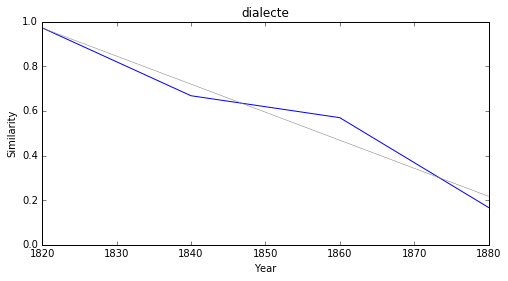

navigateur


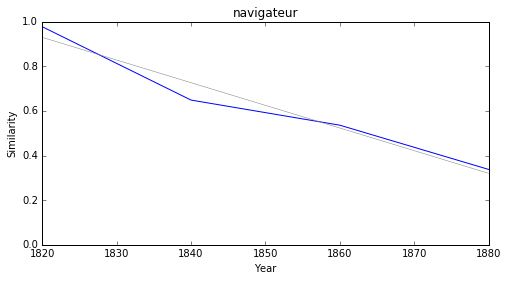

évaluation


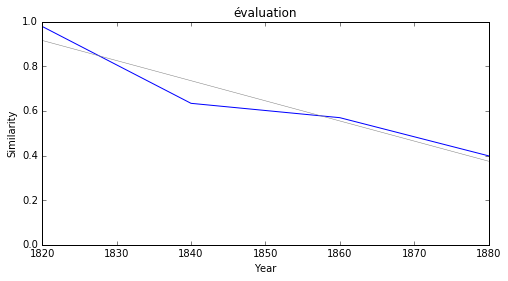

moralité


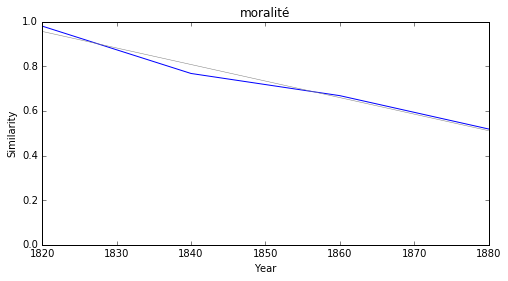

régénération


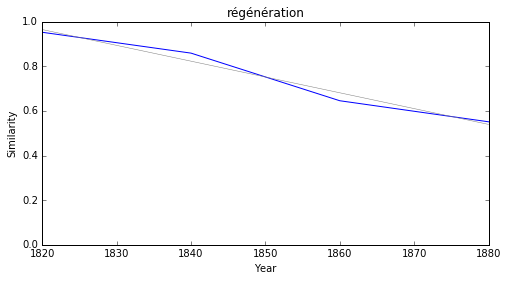

telle


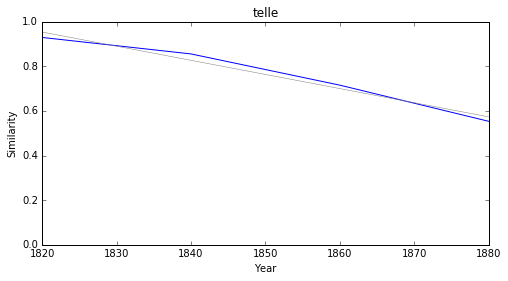

français


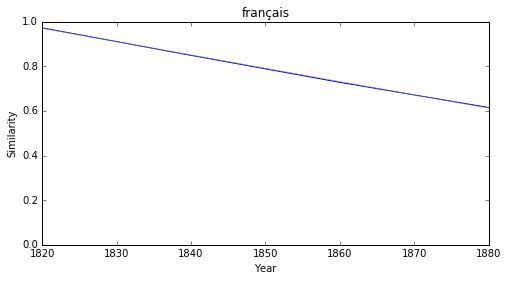

### <i><b>savoir</i></b>

          token     slope         p
38  généraliser -0.011913  0.008846
39  extravagant -0.010626  0.037561
7      alléguer -0.009960  0.017112
30     remédier -0.008072  0.037651
10      lecteur -0.007703  0.028545
11    restituer -0.007683  0.045184
15     regarder -0.007588  0.030870
37    attention -0.007535  0.017882
0    inquiétude -0.006533  0.036228
45        amour -0.006297  0.017418



généraliser


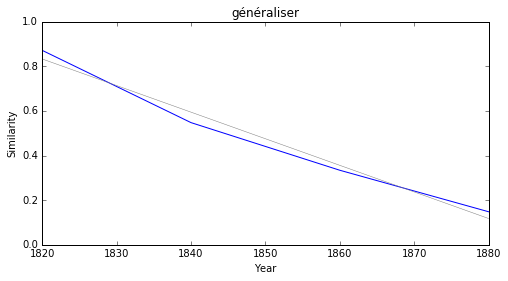

extravagant


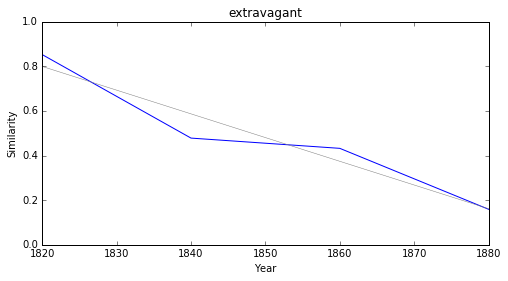

alléguer


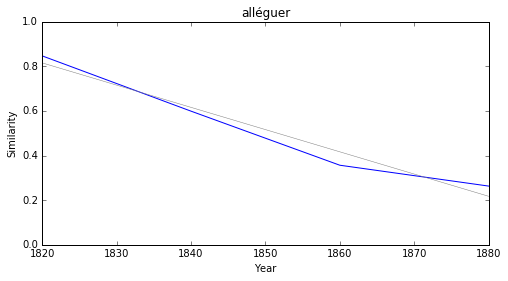

remédier


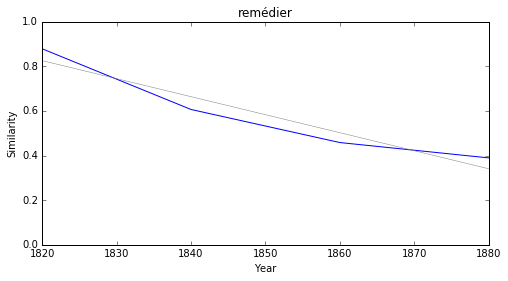

lecteur


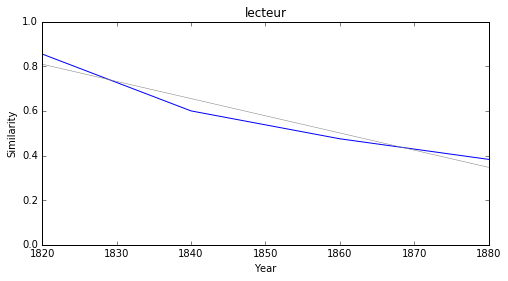

restituer


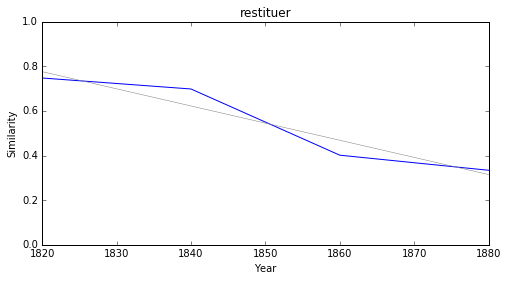

regarder


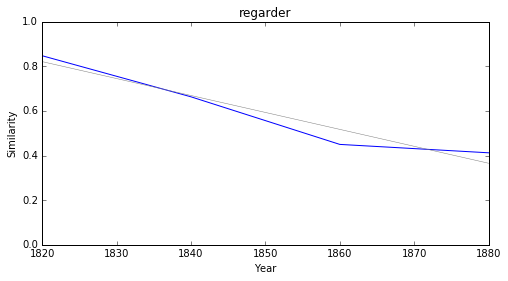

attention


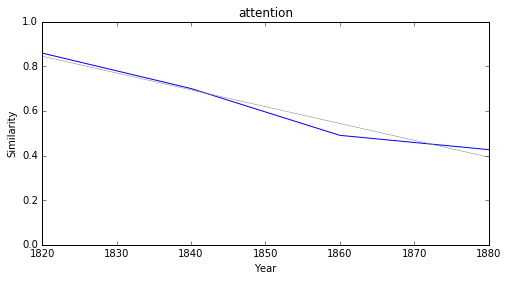

inquiétude


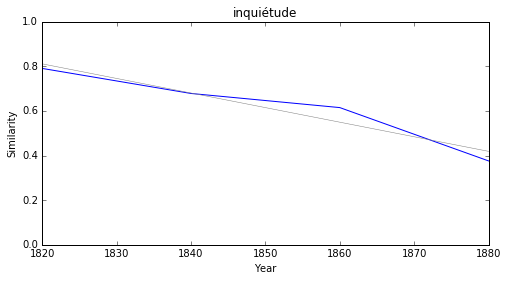

amour


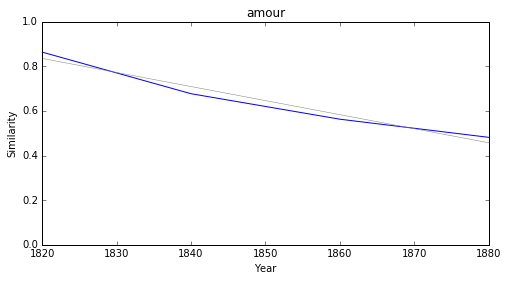

### <i><b>histoire</i></b>

           token     slope         p
9          toise -0.013701  0.031257
41          jury -0.013347  0.002065
40      dialecte -0.012157  0.006093
71        sicile -0.010535  0.041529
86      spontané -0.010534  0.014053
36       gaulois -0.010194  0.014669
64    navigation -0.010044  0.025507
0   bouffonnerie -0.009923  0.024940
77      barbarie -0.009282  0.031884
14  régénération -0.008863  0.018909



toise


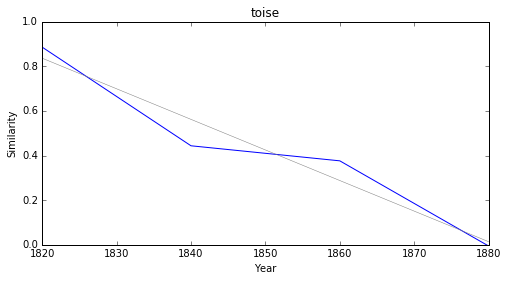

jury


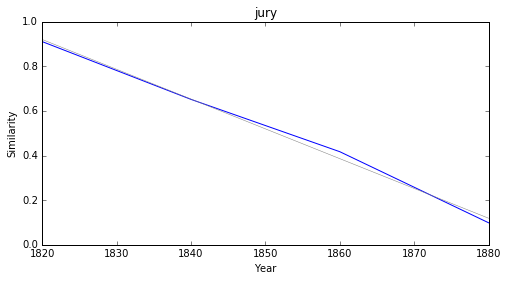

dialecte


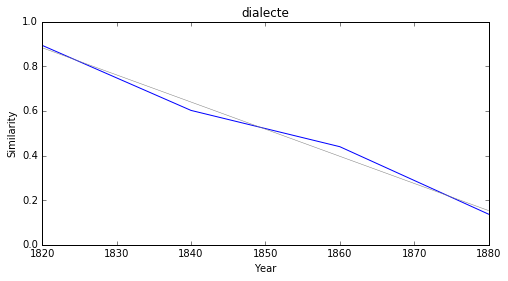

sicile


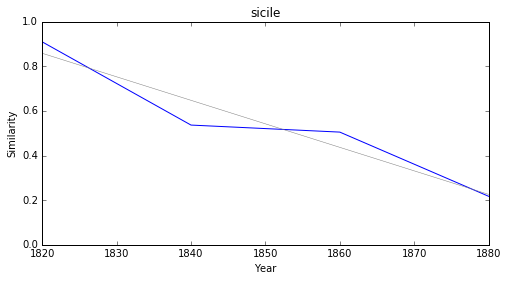

spontané


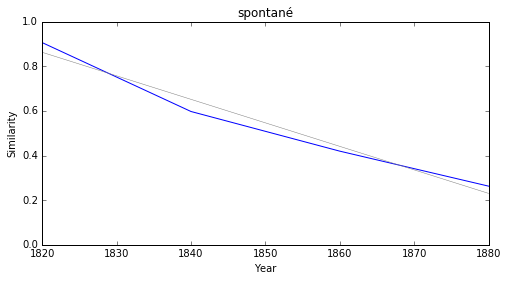

gaulois


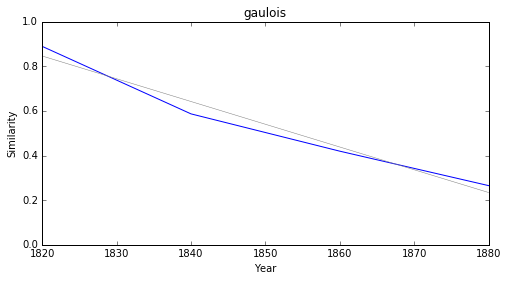

navigation


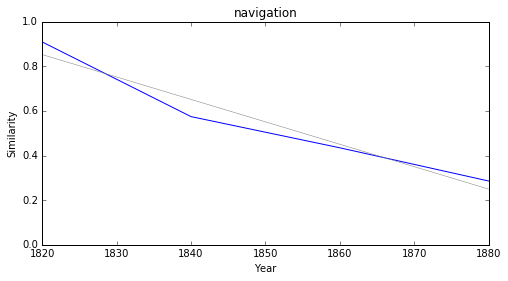

bouffonnerie


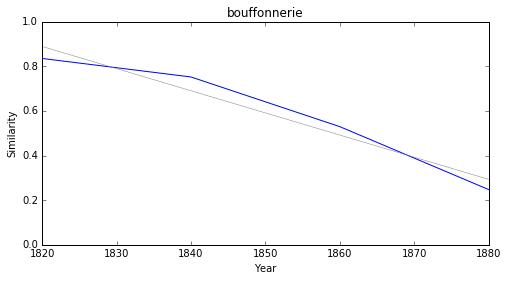

barbarie


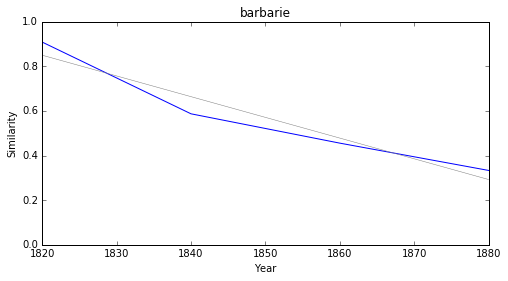

régénération


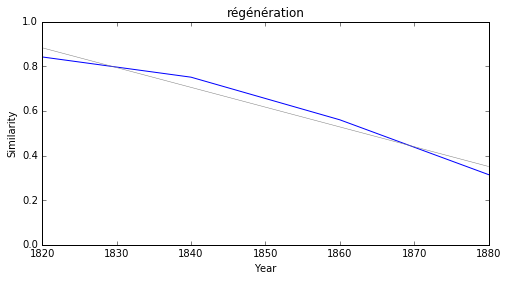

### <i><b>philosophie</i></b>

            token     slope         p
89     évaluation -0.012249  0.042411
38        lumière -0.011484  0.010008
84        branche -0.010371  0.042822
28       archipel -0.010356  0.026675
108       couleur -0.009989  0.007510
102       irlande -0.009210  0.029722
17      discrédit -0.009105  0.030422
86   débarquement -0.008625  0.031224
34        costume -0.008605  0.007252
10        tableau -0.008357  0.007530



évaluation


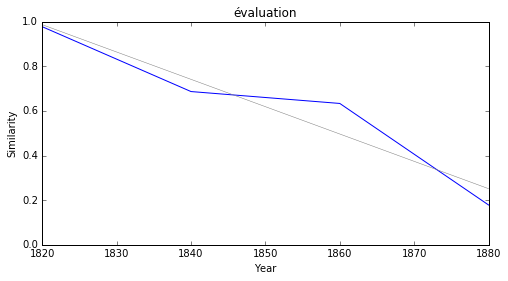

lumière


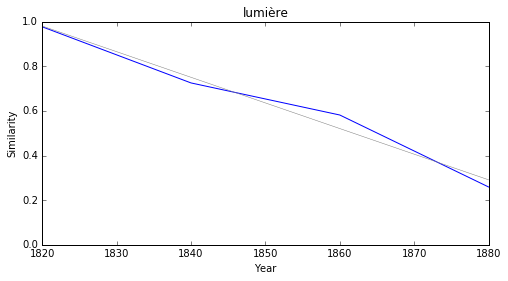

branche


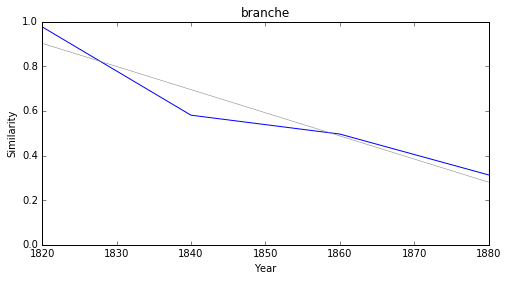

archipel


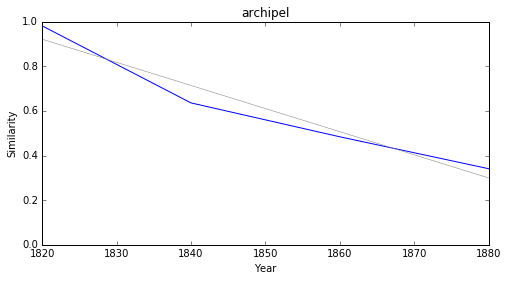

couleur


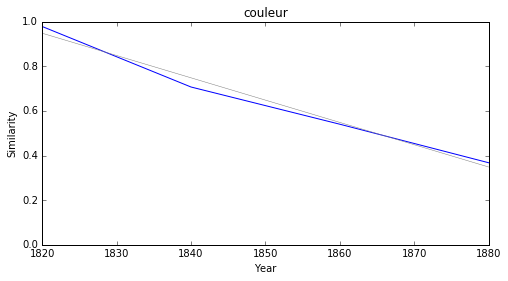

irlande


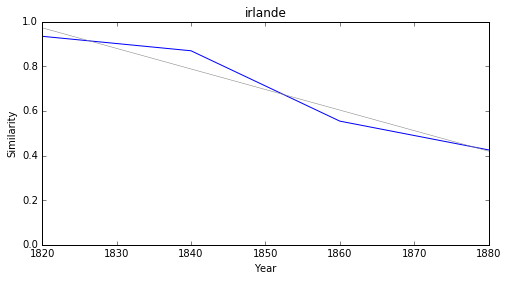

discrédit


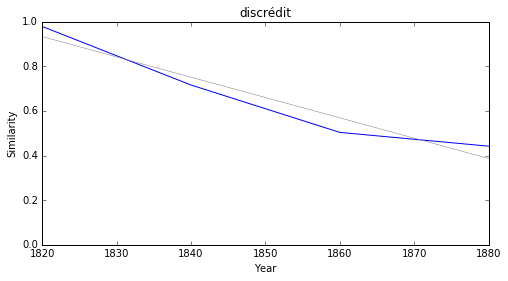

débarquement


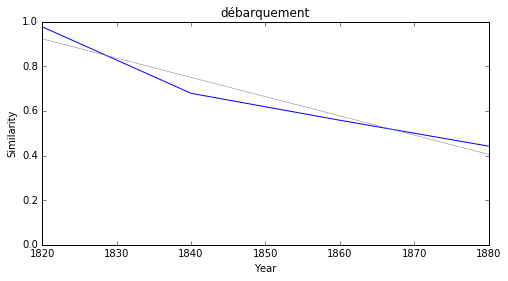

costume


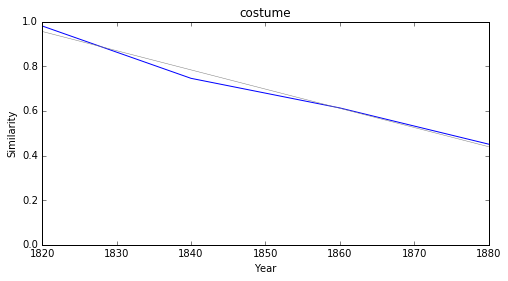

tableau


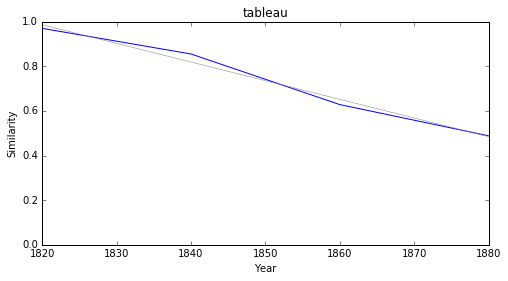

### <i><b>lettre</i></b>

       token     slope         p
225  profond -0.016110  0.039243
6     cacher -0.014542  0.007088
74      oeil -0.014402  0.002285
28    battre -0.014329  0.033207
73       âme -0.014258  0.044471
12      face -0.014156  0.007536
104    bruit -0.013794  0.000804
23   tremper -0.013704  0.032849
63      sang -0.013685  0.000440
24    tendre -0.013287  0.030964



profond


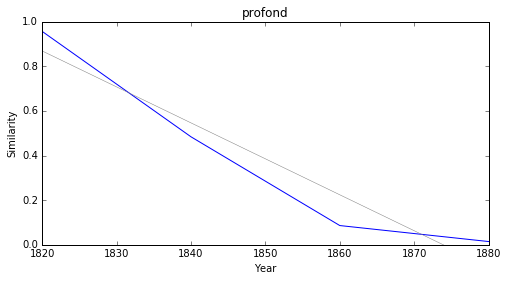

cacher


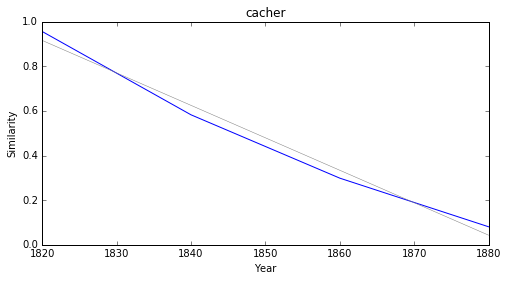

oeil


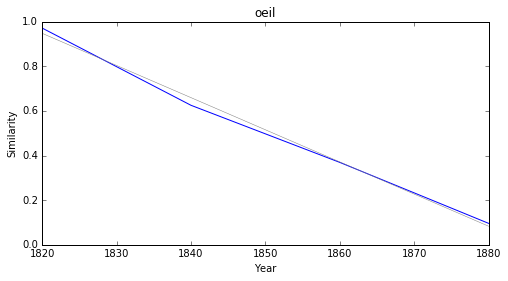

battre


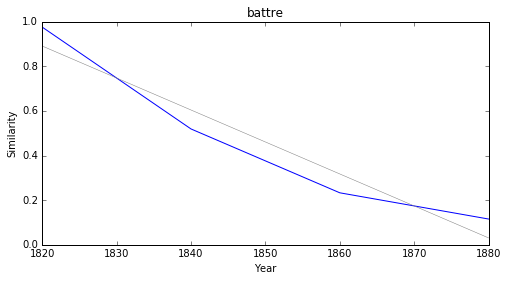

âme


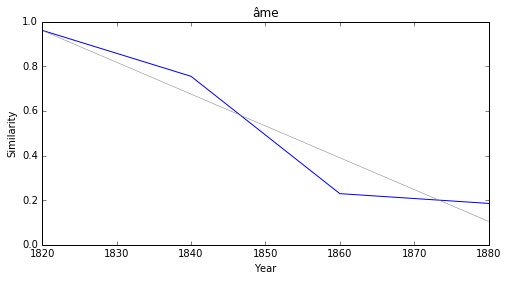

face


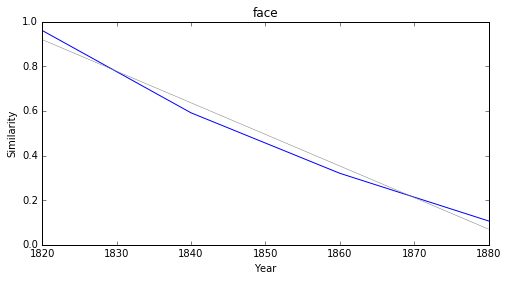

bruit


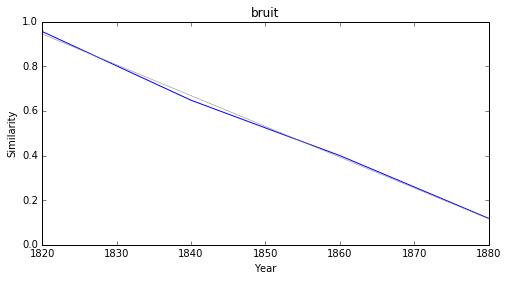

tremper


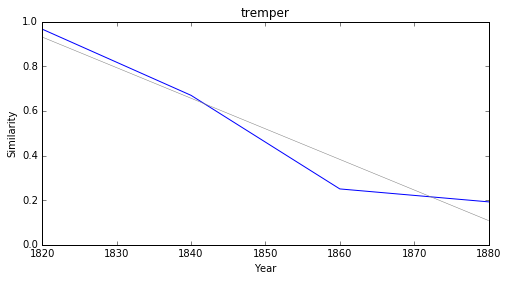

sang


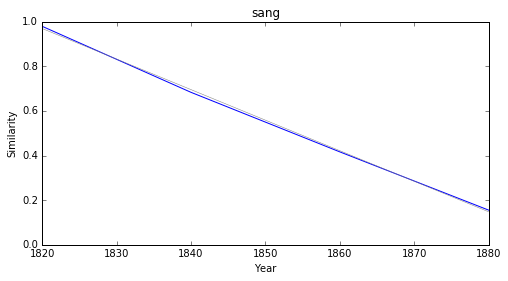

tendre


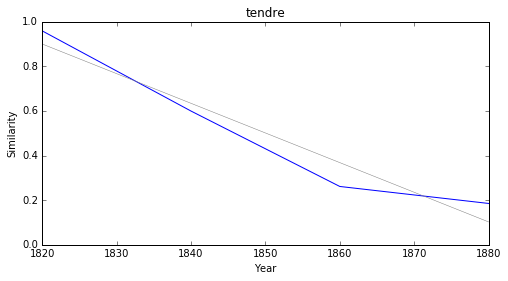

### <i><b>critique</i></b>

        token     slope         p
17     radeau -0.010104  0.042286
128   irlande -0.009081  0.017950
76      pérou -0.008826  0.013934
55   pamphlet -0.008527  0.033846
120    purger -0.008482  0.049345
135       vif -0.008074  0.036254
74    rejeter -0.007979  0.017083
136     chair -0.007800  0.000651
64     captif -0.007586  0.005665
32    ébauche -0.007546  0.041981



radeau


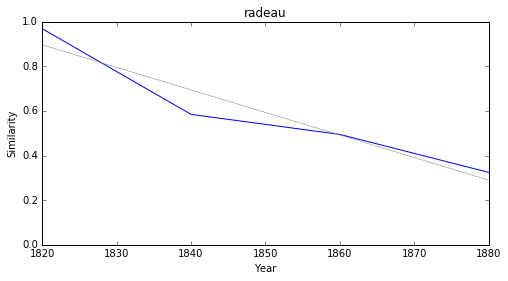

irlande


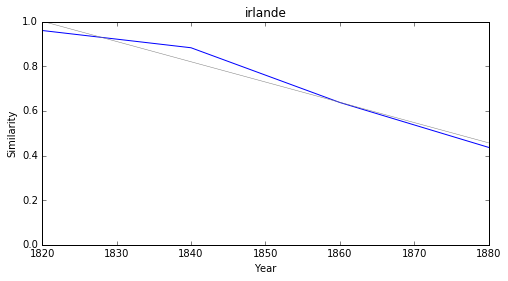

pérou


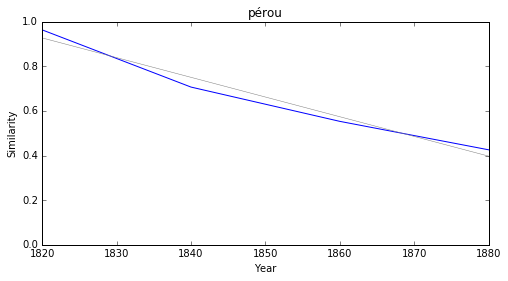

pamphlet


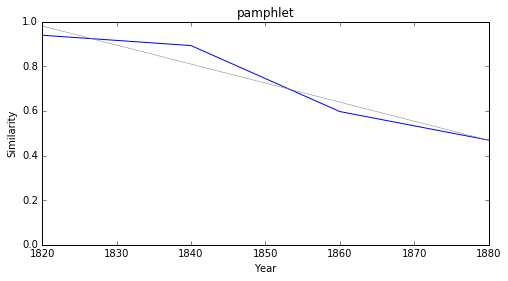

purger


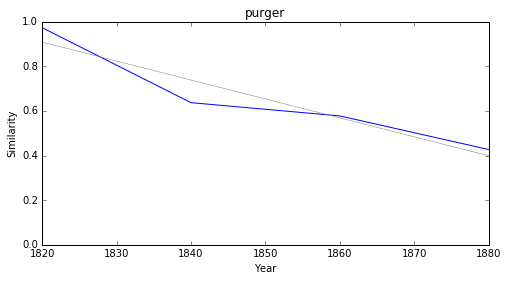

vif


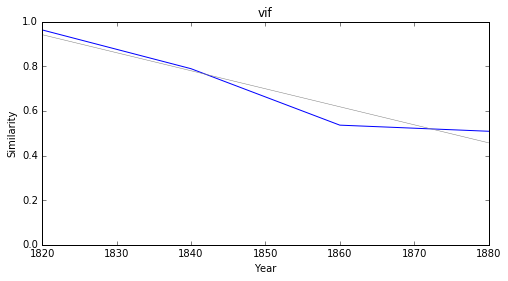

rejeter


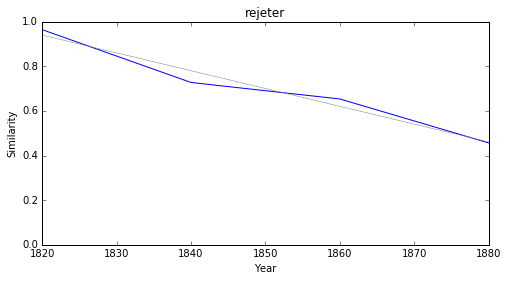

chair


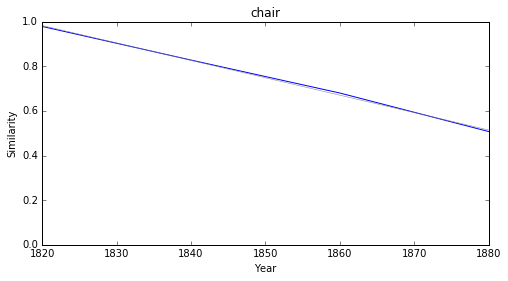

captif


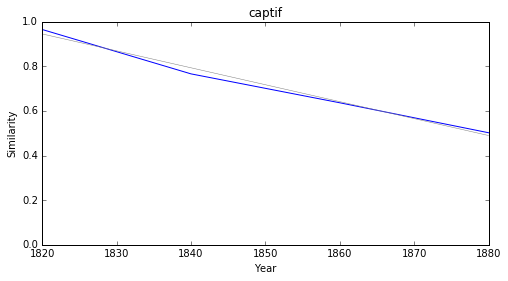

ébauche


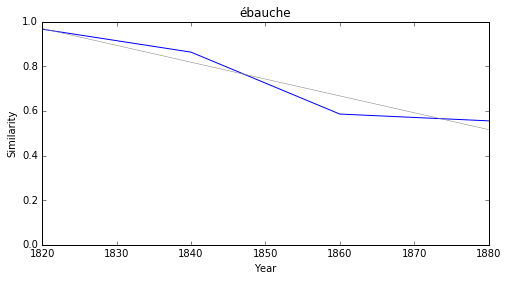

### <i><b>roman</i></b>

            token     slope         p
55         caboul -0.018629  0.044791
43    sympathiser -0.017304  0.006314
45          pérou -0.010837  0.001280
21  incontestable -0.008452  0.004896
68       imminent -0.008144  0.021157
77         persan -0.008018  0.007179
76     déposition -0.007161  0.037771
20        prodige -0.007042  0.046436
82          juste -0.006605  0.023989
67    naturaliste -0.006409  0.028567



caboul


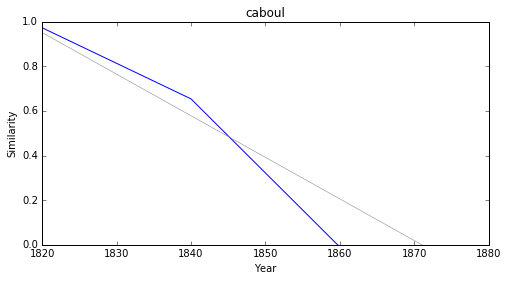

sympathiser


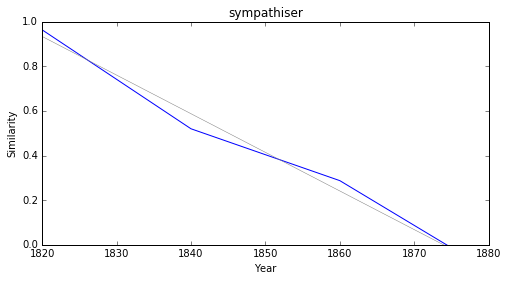

pérou


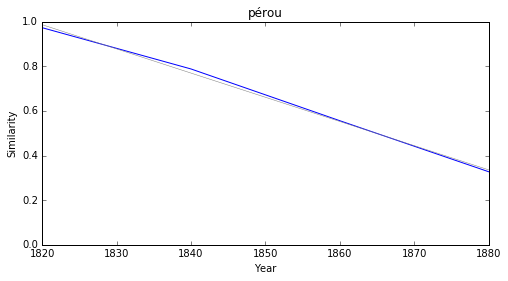

incontestable


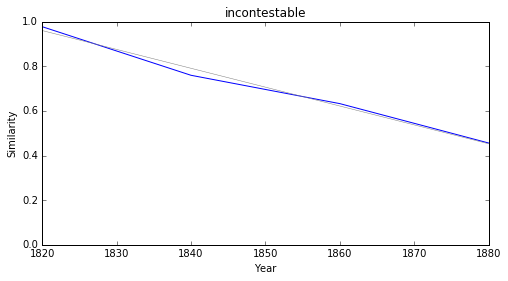

imminent


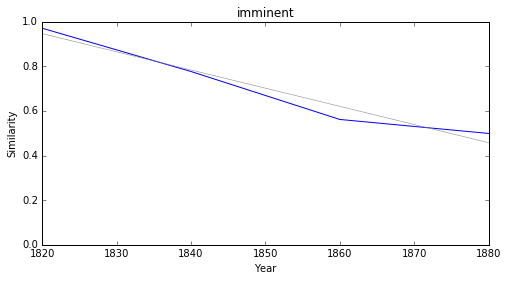

persan


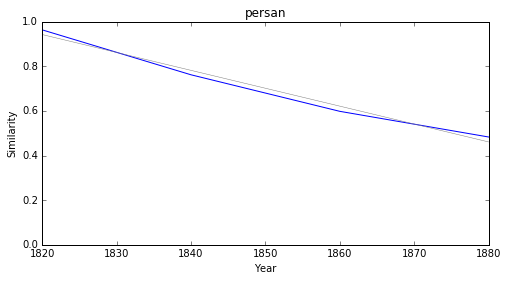

déposition


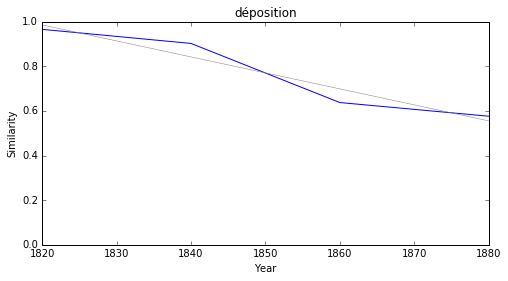

prodige


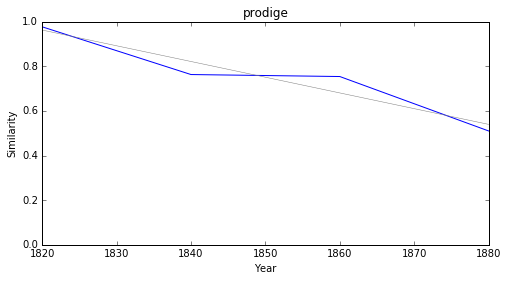

juste


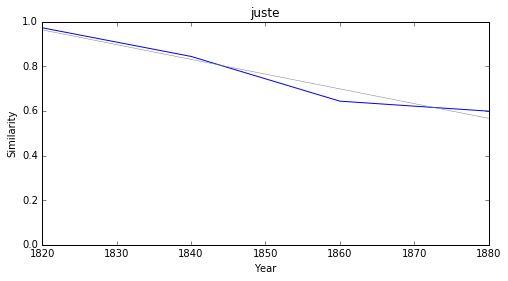

naturaliste


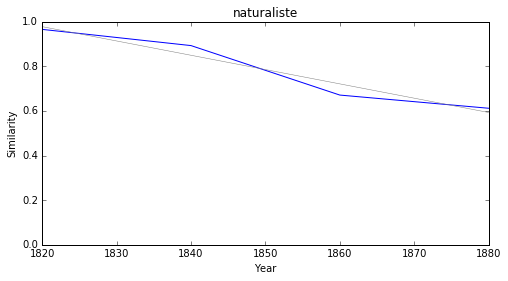

### <i><b>théâtre</i></b>

        token     slope         p
174   sommité -0.015105  0.036567
105  athénien -0.014998  0.024499
70       java -0.013098  0.023900
119   altérer -0.012175  0.032788
128    regard -0.011260  0.028232
149  arracher -0.011150  0.031671
136    enfler -0.010717  0.024554
181     tâche -0.010601  0.001378
92      tigre -0.010508  0.009844
189      joue -0.010446  0.000246



sommité


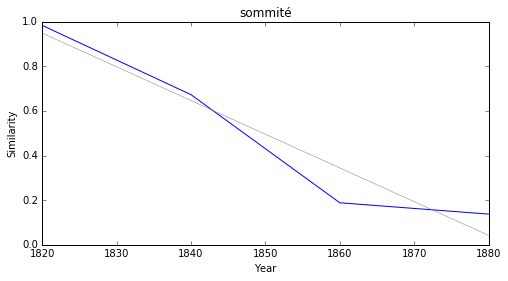

athénien


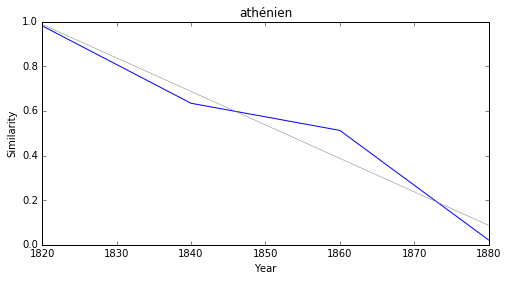

java


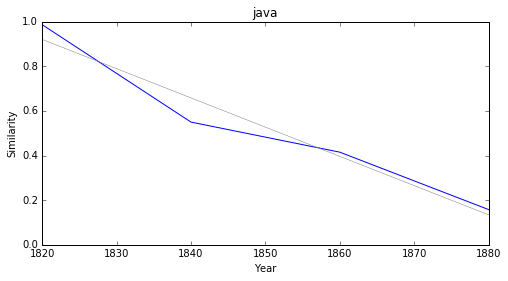

altérer


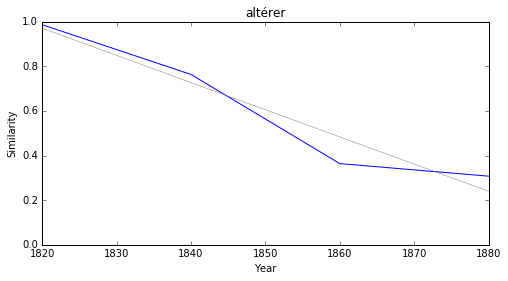

regard


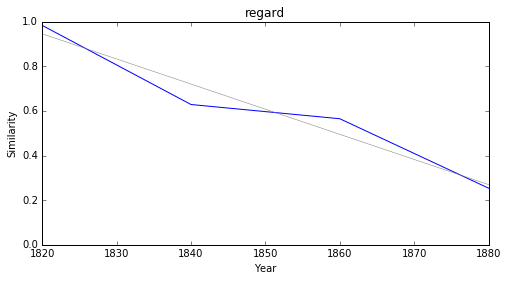

arracher


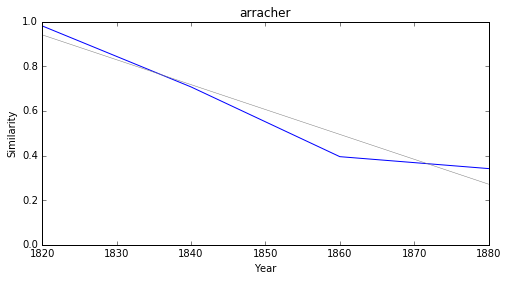

enfler


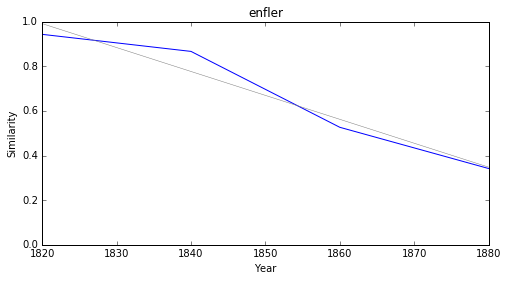

tâche


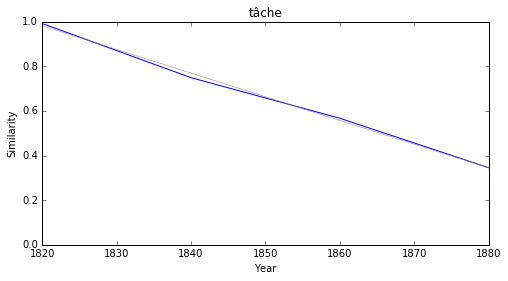

tigre


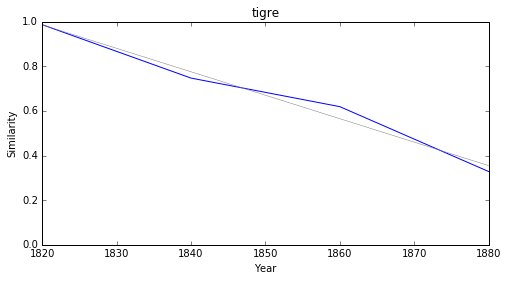

joue


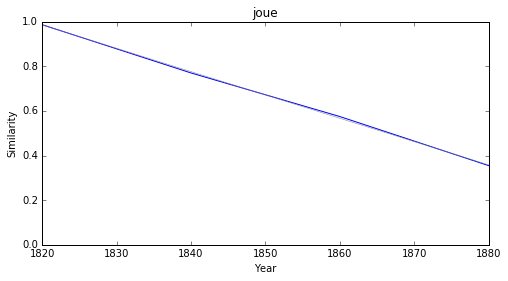

### <i><b>drame</i></b>

          token     slope         p
54   déposition -0.007901  0.027366
2       détroit -0.007737  0.022015
28      utilité -0.007238  0.014111
46     latitude -0.007061  0.018425
12  imagination -0.006815  0.040613
25    véritable -0.006807  0.027829
24         jury -0.006789  0.023686
40        péril -0.006758  0.047358
53  observation -0.006448  0.009447
18      gaulois -0.006221  0.001382



déposition


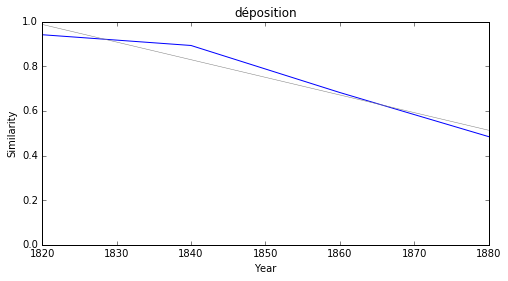

détroit


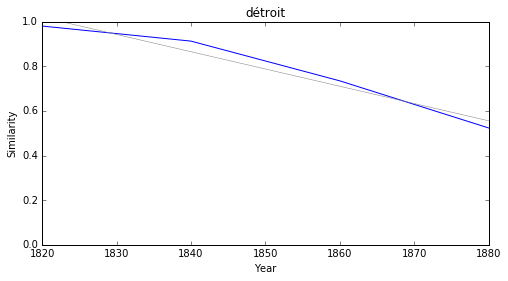

utilité


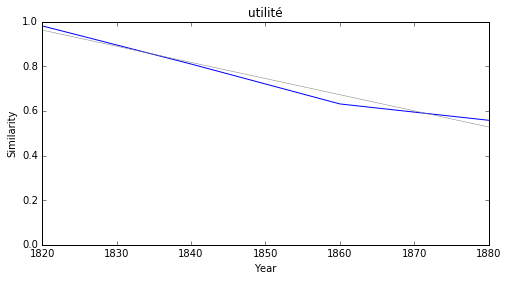

latitude


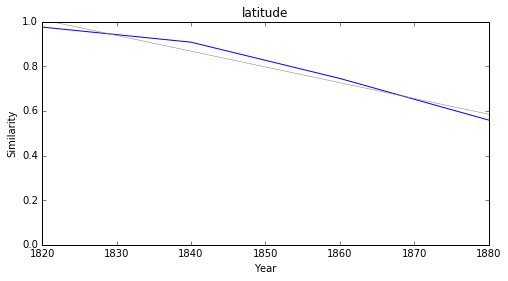

imagination


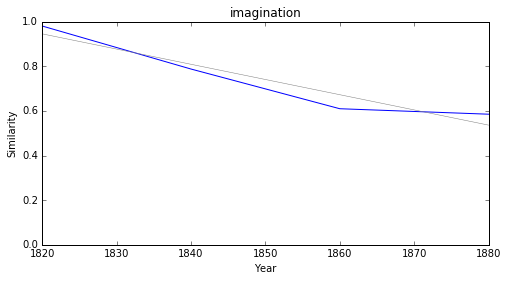

véritable


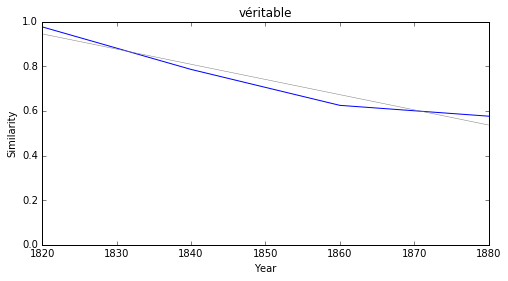

jury


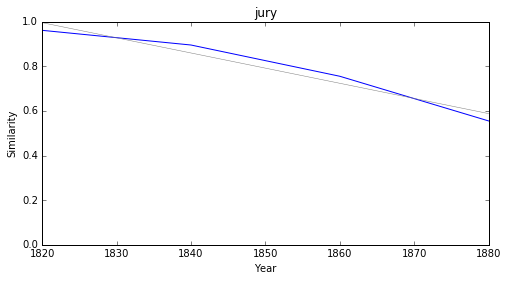

péril


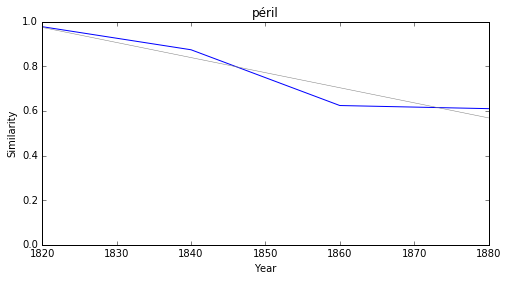

observation


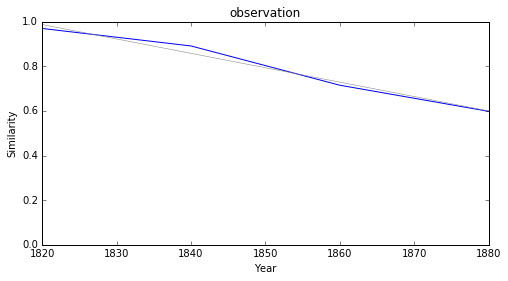

gaulois


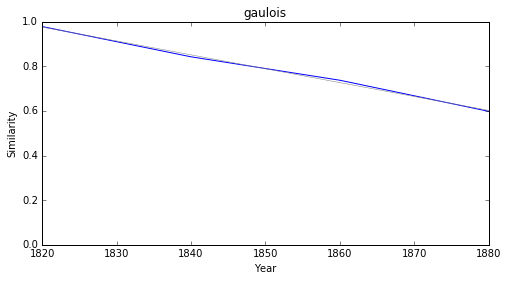

### <i><b>esprit</i></b>

            token     slope         p
43   précédemment -0.016953  0.001624
58          livre -0.009693  0.035750
20     révolution -0.009389  0.022736
46       étranger -0.009326  0.006913
12        tableau -0.009324  0.006933
25        général -0.009004  0.038451
22  incontestable -0.008984  0.029685
36      imitateur -0.008804  0.009607
40     distinguer -0.008770  0.023916
81   constitution -0.008702  0.030678



précédemment


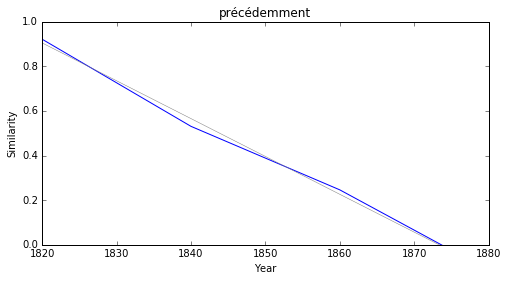

livre


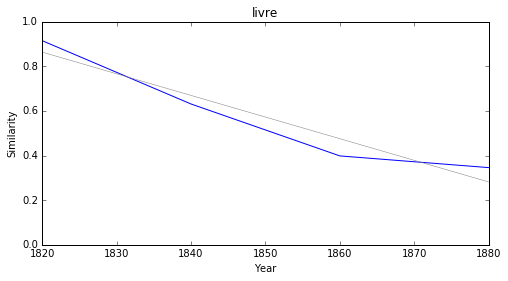

révolution


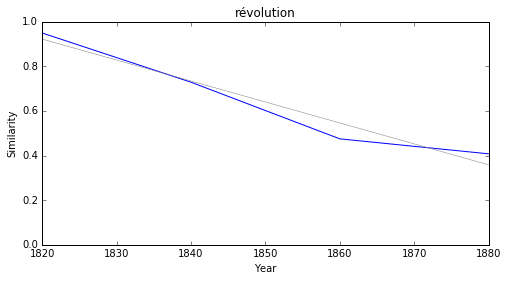

étranger


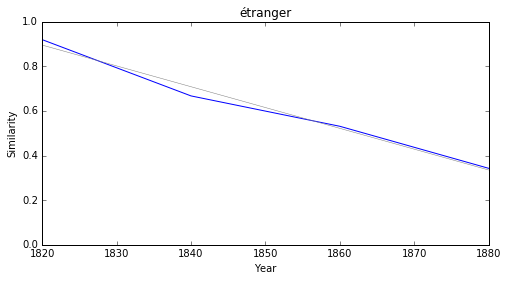

tableau


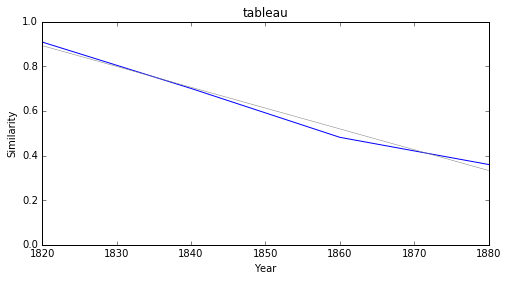

général


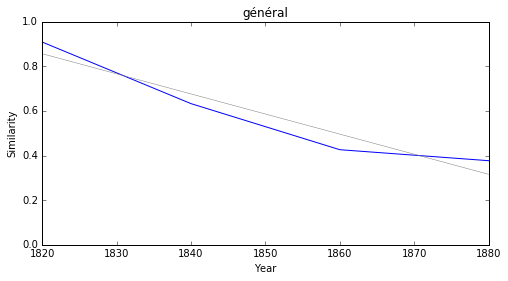

incontestable


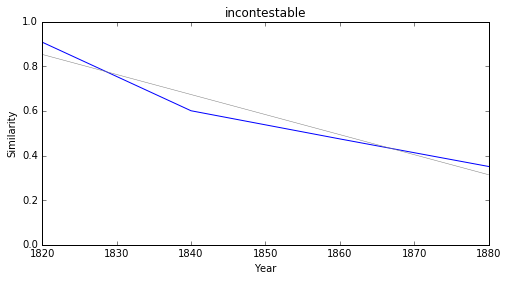

imitateur


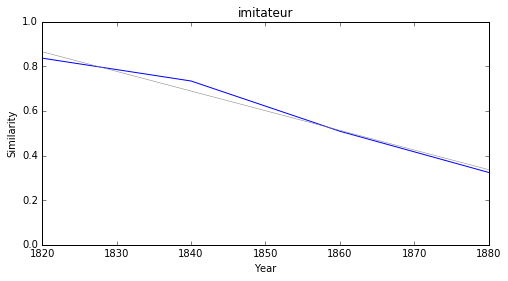

distinguer


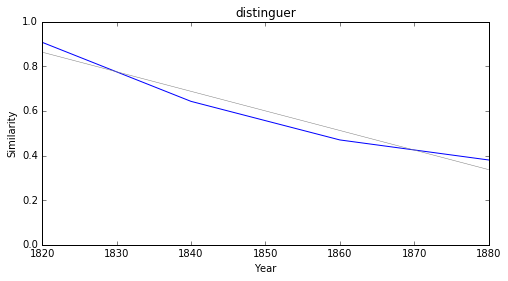

constitution


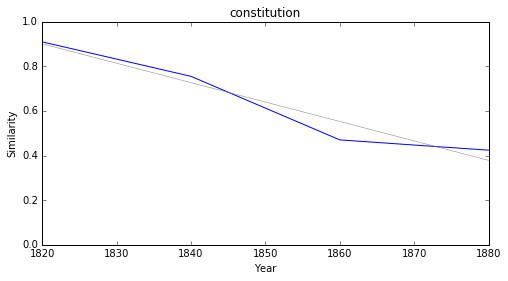

### <i><b>langue</i></b>

            token     slope         p
1        géorgien -0.016768  0.044487
25       dialecte -0.012336  0.021674
23      allemagne -0.009183  0.027812
9   incontestable -0.008550  0.020109
8      accidentel -0.007578  0.020418
28      imitateur -0.007381  0.042964
34       étranger -0.006978  0.033992
19          droit -0.006959  0.042918
42         église -0.006507  0.029045
36        surtout -0.006486  0.020884



géorgien


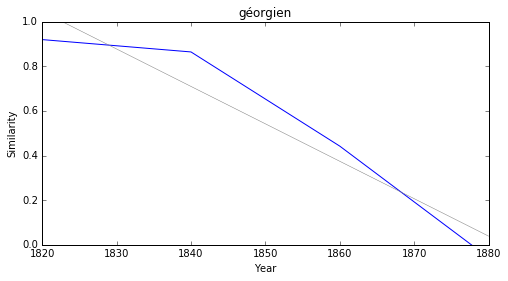

dialecte


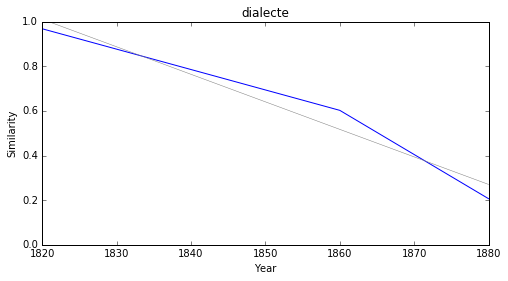

allemagne


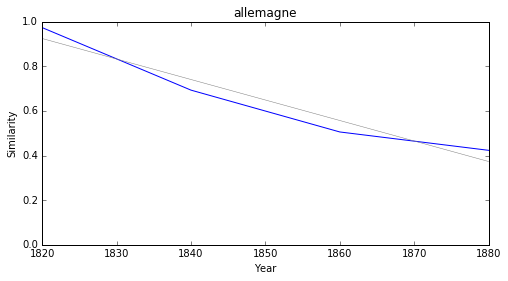

incontestable


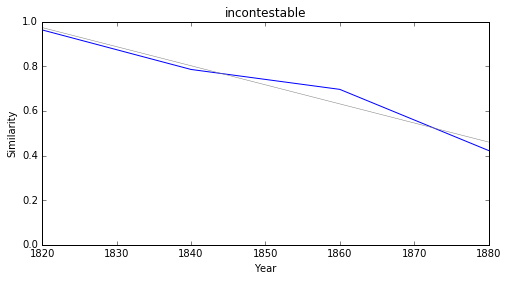

accidentel


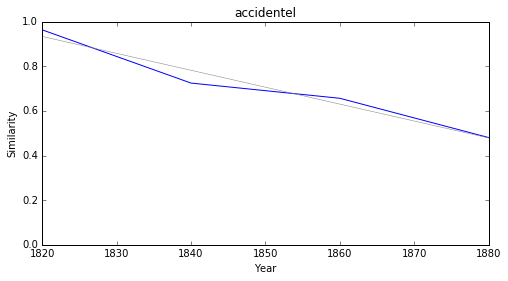

imitateur


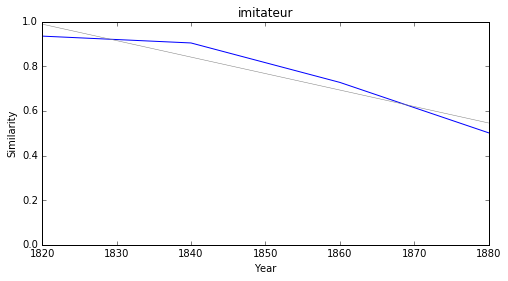

étranger


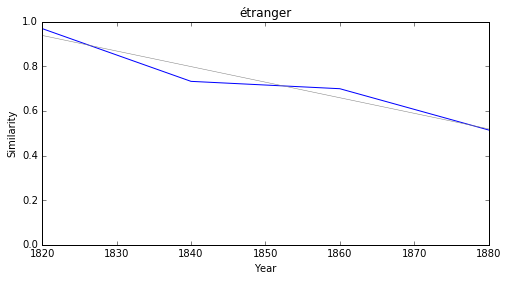

droit


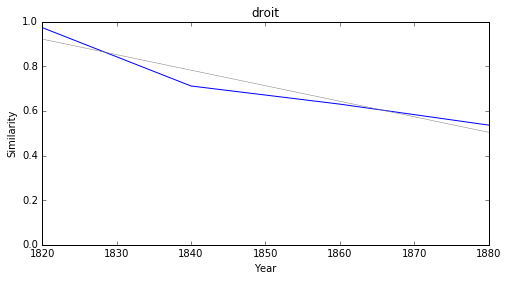

église


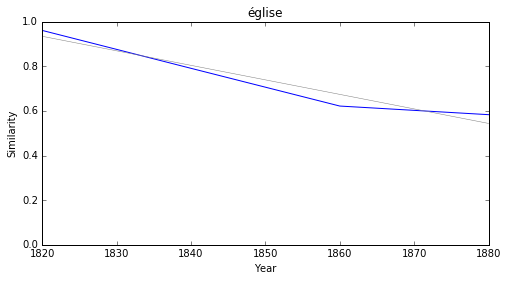

surtout


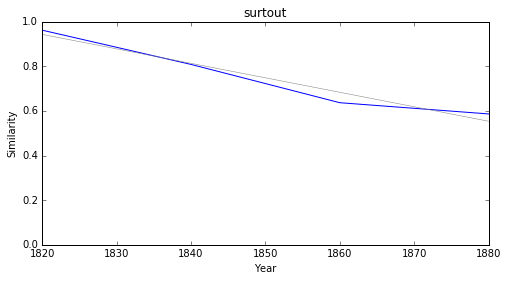

### <i><b>diplomatie</i></b>

          token     slope         p
24  brahmanique -0.018514  0.037808
41      sandale -0.017036  0.040905
30    crocodile -0.015626  0.037854
38         java -0.013563  0.041412
1         aloès -0.009403  0.048002
70        docte -0.008874  0.045781
99       persan -0.008647  0.044393
84  naturaliste -0.007042  0.039140
2    simplement -0.006830  0.042662
10       détenu -0.006811  0.003876



brahmanique


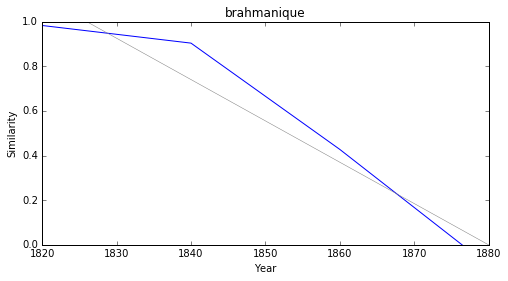

sandale


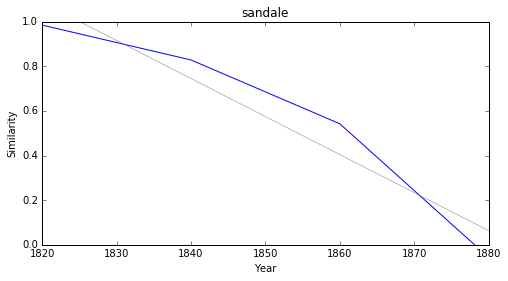

crocodile


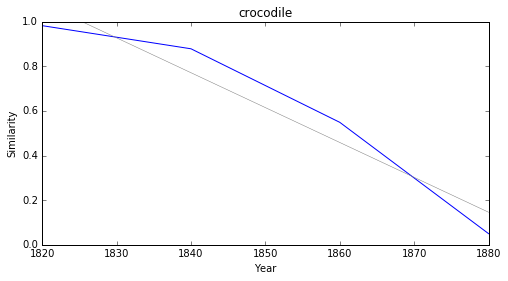

java


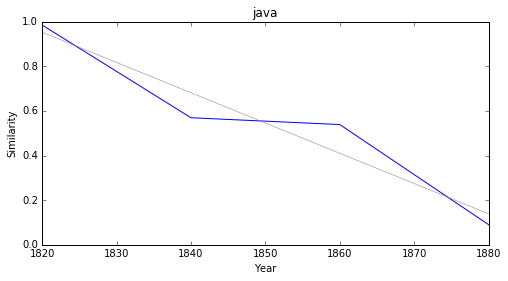

aloès


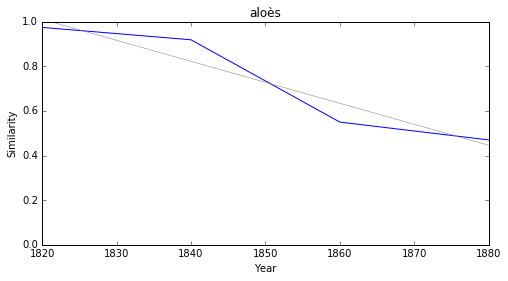

docte


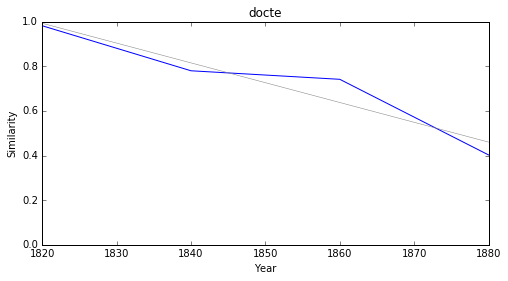

persan


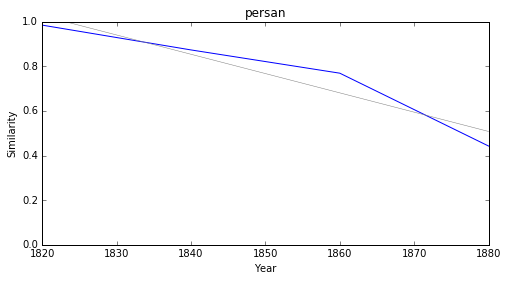

naturaliste


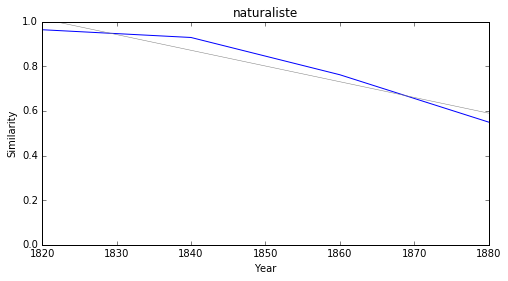

simplement


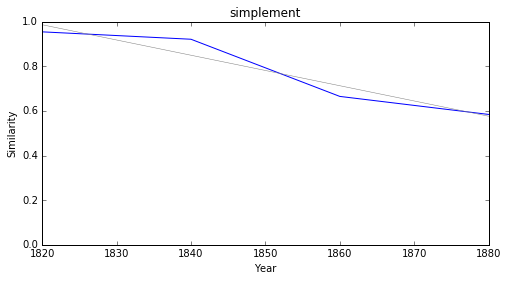

détenu


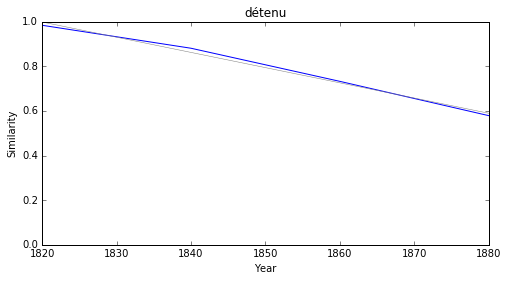

### <i><b>politique</i></b>

        token     slope         p
10      toise -0.015892  0.039191
96      masse -0.011359  0.012369
47       jury -0.011150  0.025296
77    irlande -0.010868  0.044539
81      trait -0.010805  0.039345
75   barbarie -0.010667  0.035352
89   spontané -0.010355  0.028903
50  érudition -0.010083  0.026340
0     continu -0.009899  0.028798
32     suisse -0.009871  0.042367



toise


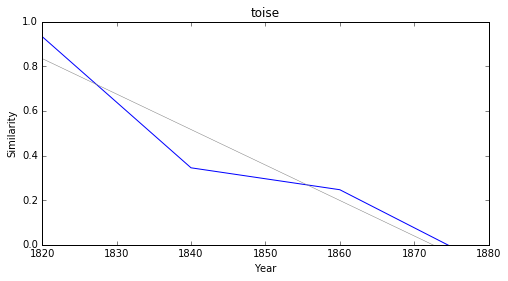

masse


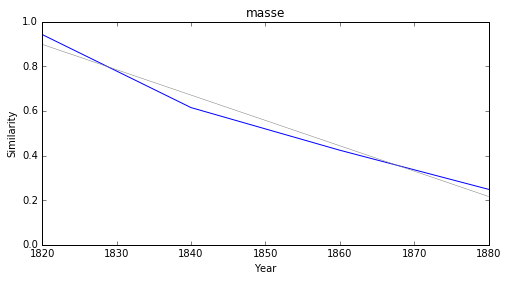

jury


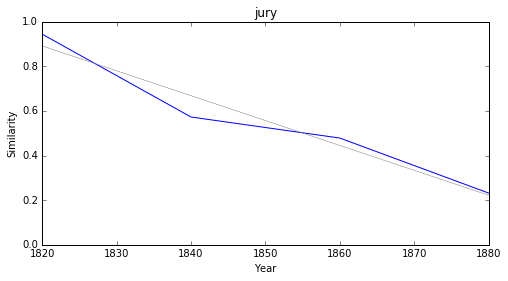

irlande


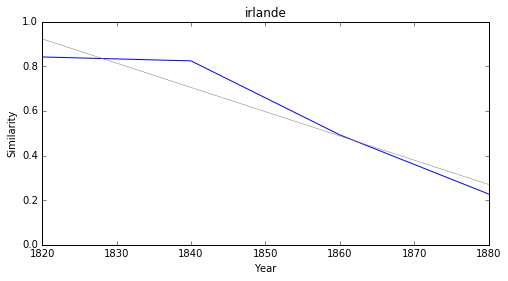

trait


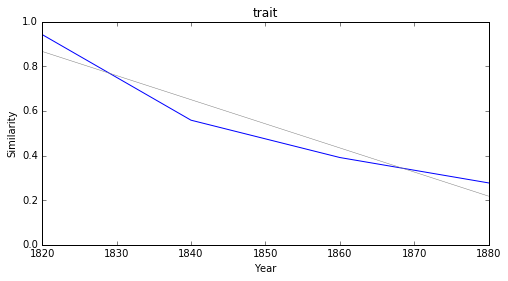

barbarie


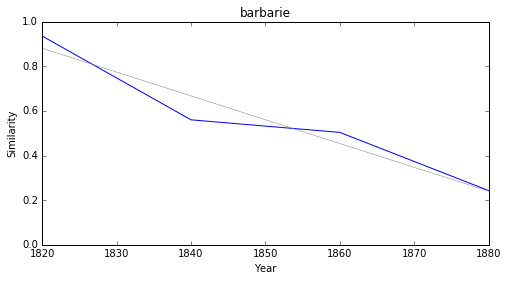

spontané


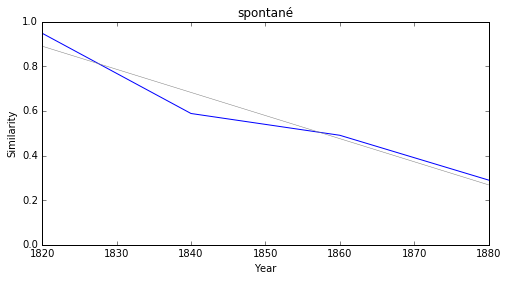

érudition


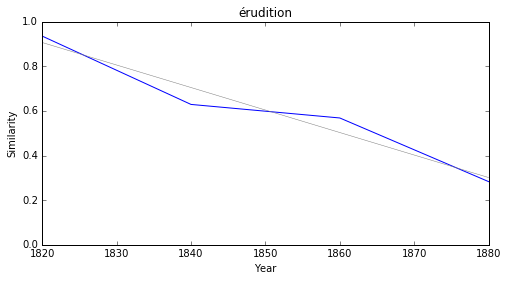

continu


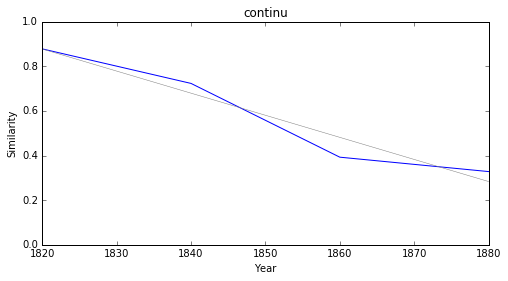

suisse


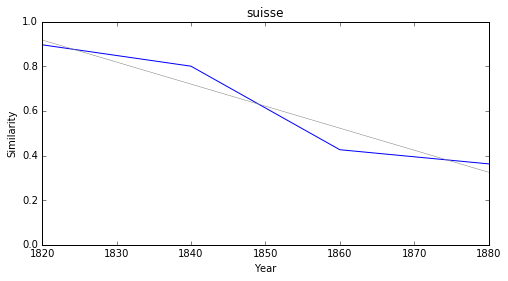

### <i><b>morale</i></b>

             token     slope         p
40       mahométan -0.017590  0.003883
54         seconde -0.014397  0.043584
93      évaluation -0.012646  0.035453
77        éclairer -0.010455  0.002828
29         marquer -0.010018  0.029347
62        moralité -0.009685  0.048561
100            bey -0.009621  0.042921
14    régénération -0.008778  0.015959
27   incontestable -0.007785  0.020899
76       fécondité -0.007655  0.038016



mahométan


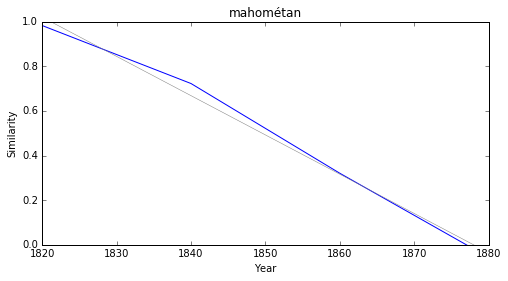

seconde


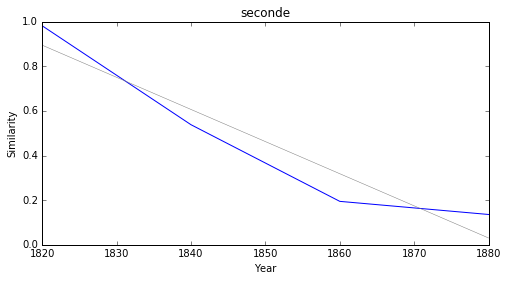

évaluation


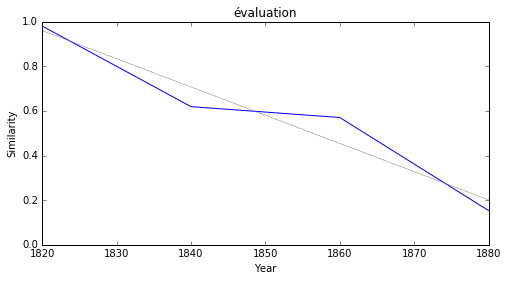

éclairer


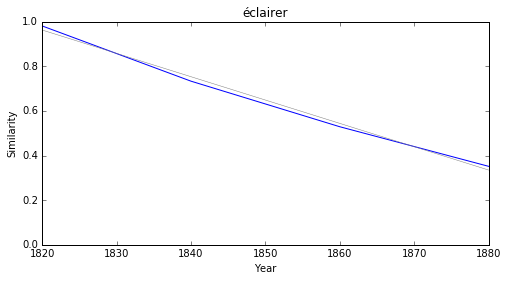

marquer


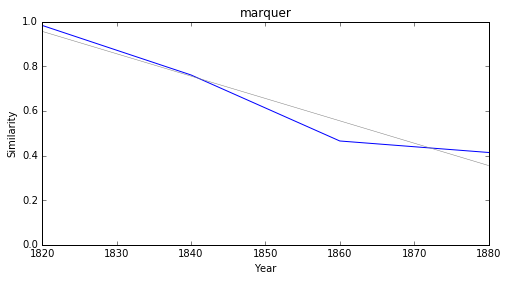

moralité


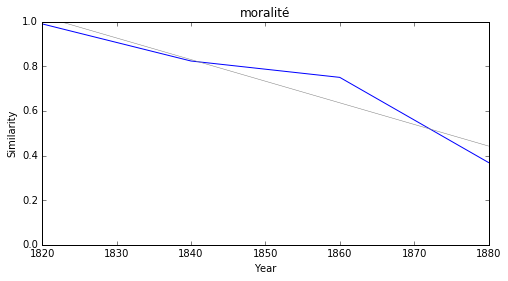

bey


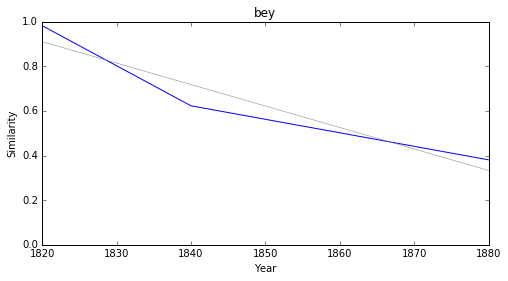

régénération


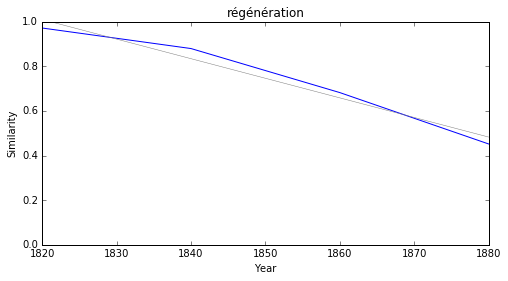

incontestable


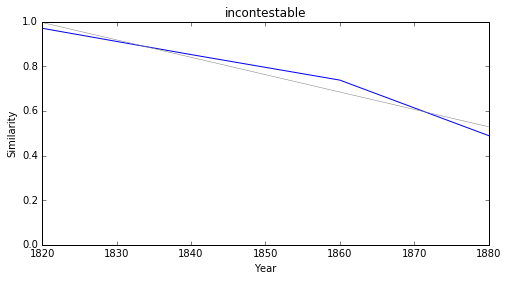

fécondité


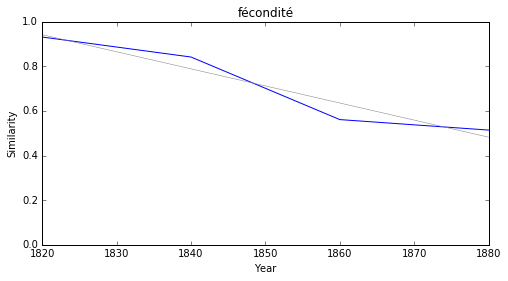

### <i><b>société</i></b>

           token     slope         p
34      dialecte -0.012986  0.026185
35          jury -0.012021  0.028126
63         telle -0.007946  0.015639
11  régénération -0.007918  0.013540
91       adopter -0.007893  0.022938
94       nouveau -0.006909  0.031967
68       établir -0.006782  0.022205
55        italie -0.006630  0.033078
29         civil -0.006558  0.020864
13      français -0.006371  0.014277



dialecte


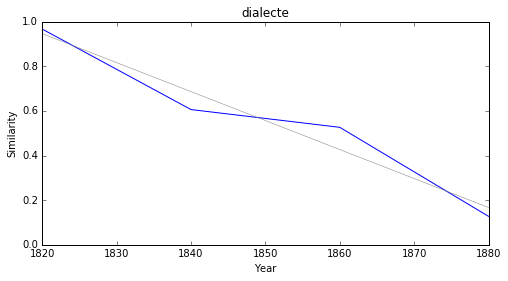

jury


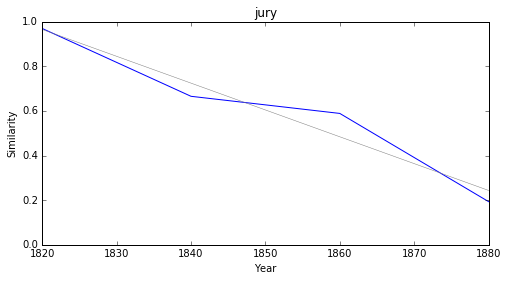

telle


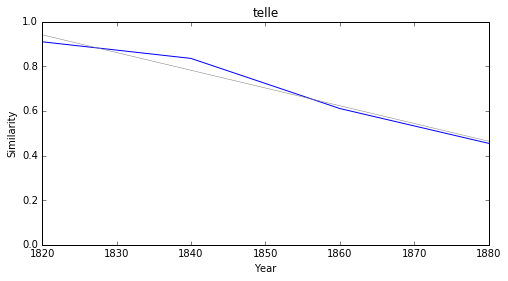

régénération


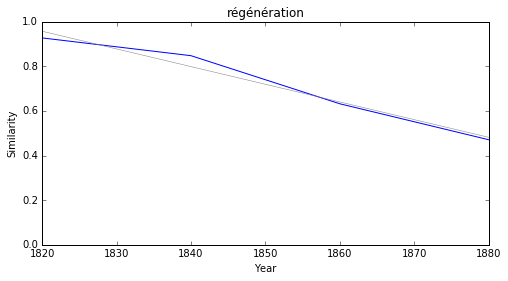

adopter


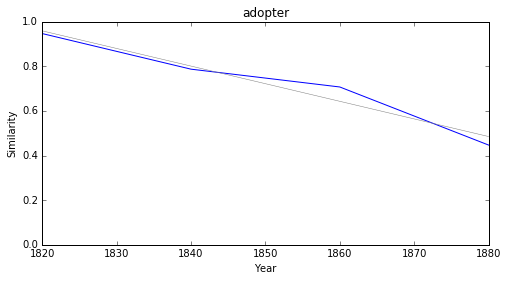

nouveau


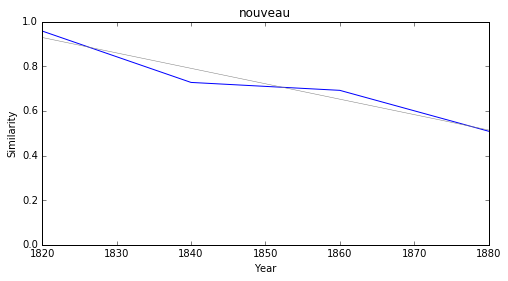

établir


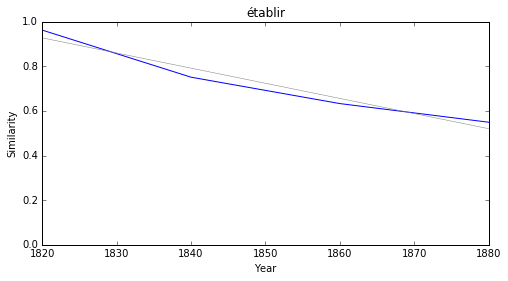

italie


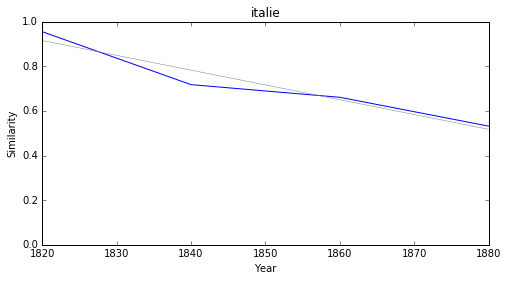

civil


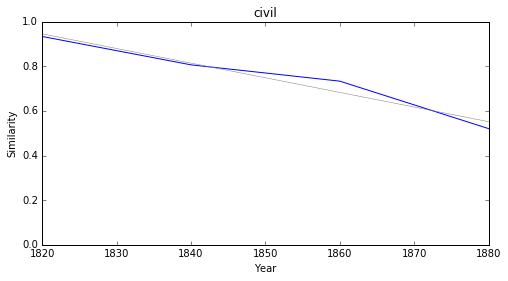

français


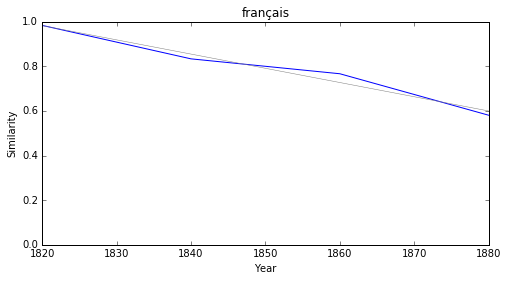

### <i><b>pouvoir</i></b>

              token     slope         p
48      secondement -0.015722  0.036757
69       persécuter -0.013792  0.029504
46        piraterie -0.013585  0.034909
18      dissolution -0.013159  0.033150
57      généraliser -0.011378  0.019992
49       approprier -0.010659  0.022155
7   raisonnablement -0.010630  0.023263
9          alléguer -0.010505  0.040249
65          déloger -0.009286  0.043012
40           donnée -0.009099  0.020656



secondement


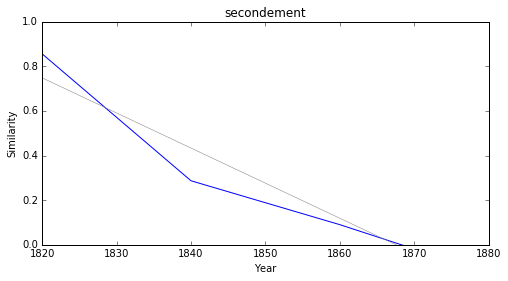

persécuter


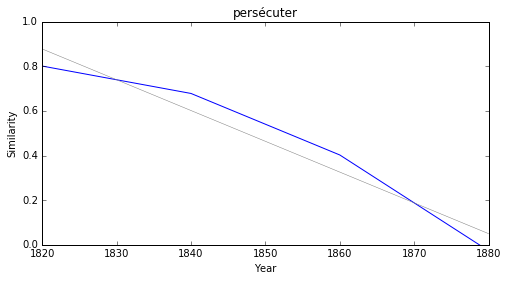

piraterie


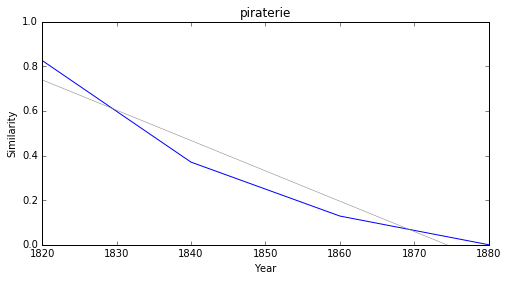

dissolution


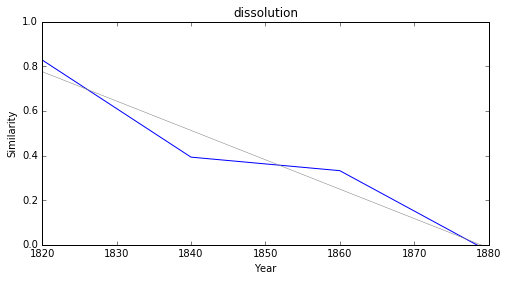

généraliser


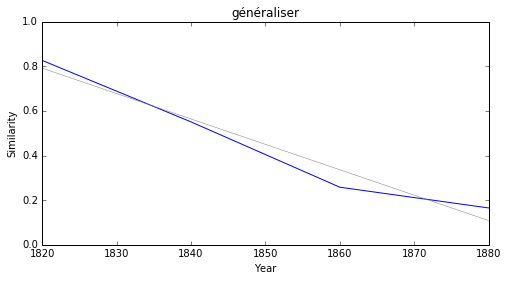

approprier


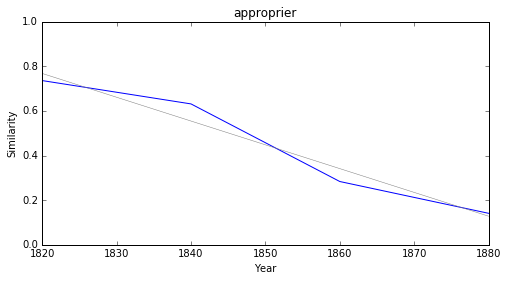

raisonnablement


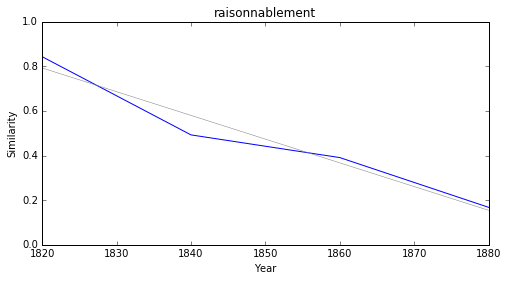

alléguer


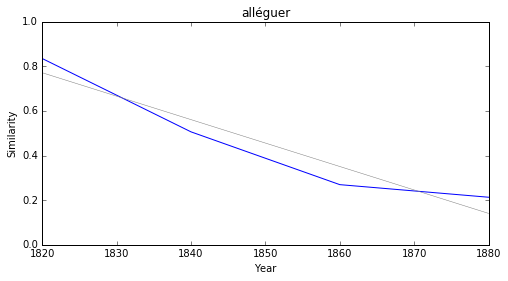

déloger


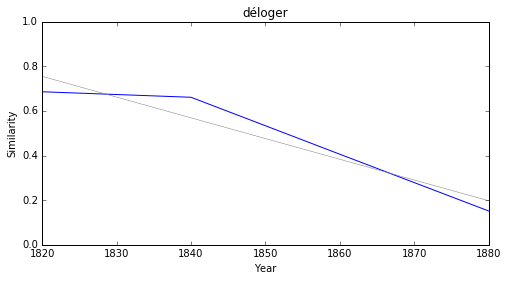

donnée


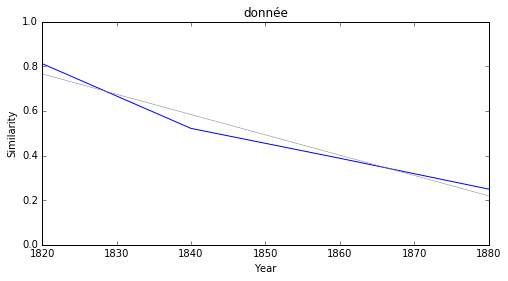

### <i><b>théologie</i></b>

         token     slope         p
5         face -0.010496  0.028356
28   embrasser -0.010409  0.045721
54    demeurer -0.009101  0.039161
30       fixer -0.008665  0.038127
23     attirer -0.008564  0.027596
37  contempler -0.008064  0.015039
22      rouler -0.008051  0.006075
39       poste -0.007726  0.008814
12      couler -0.007058  0.042897
27    regagner -0.006996  0.015560



face


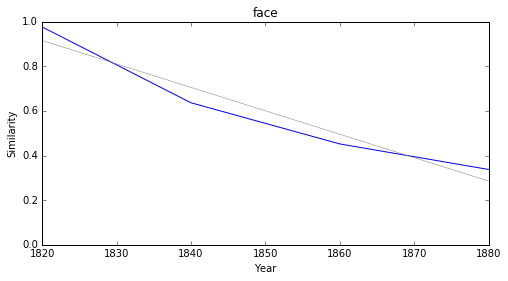

embrasser


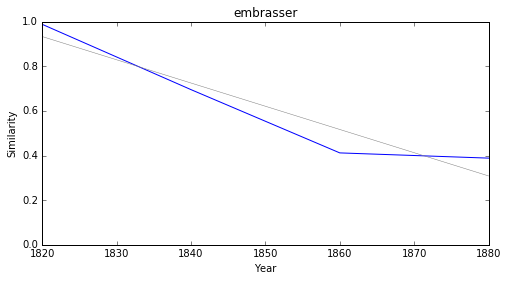

demeurer


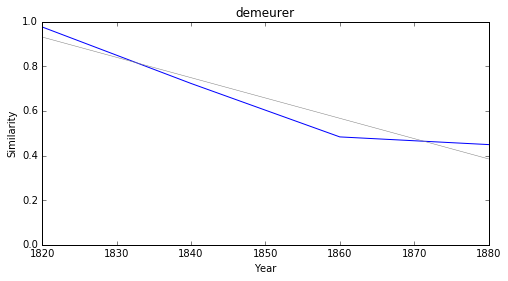

fixer


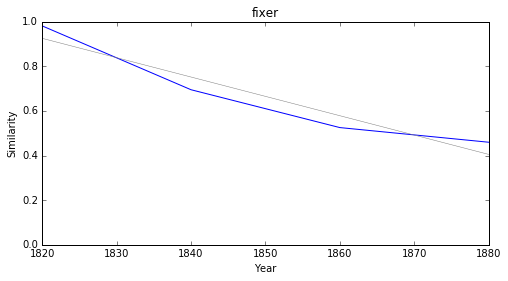

attirer


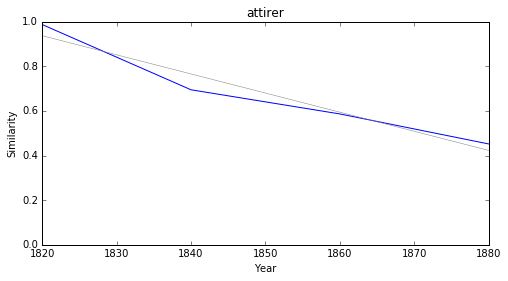

contempler


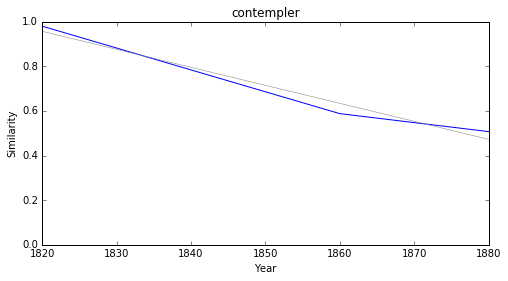

rouler


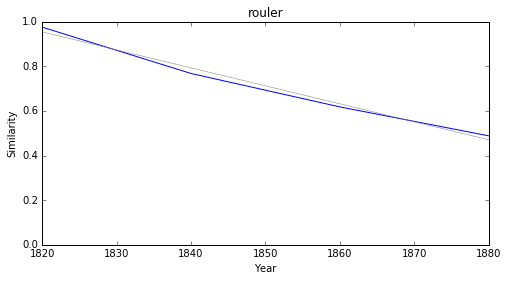

poste


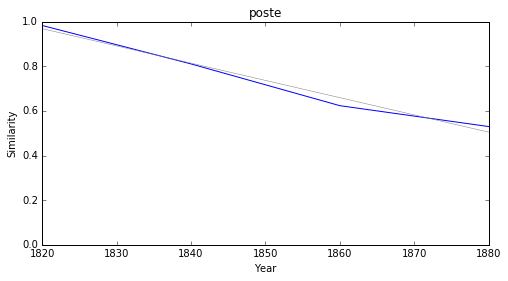

couler


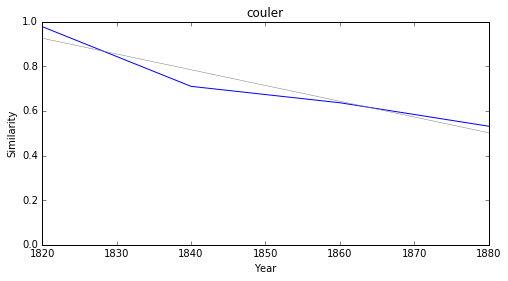

regagner


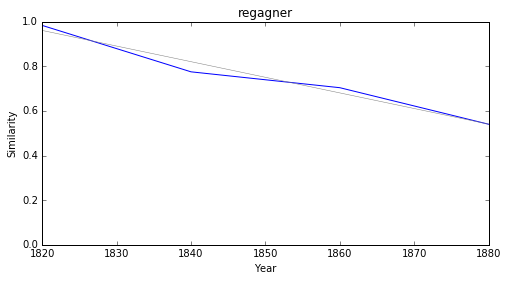

### <i><b>droit</i></b>

            token     slope         p
93        irlande -0.012920  0.026920
16        tableau -0.011180  0.039614
19   régénération -0.011061  0.007799
32       précéder -0.010663  0.044427
3          aspect -0.010455  0.037016
96      irlandais -0.009702  0.046370
116    différence -0.009695  0.000586
83        hostile -0.009037  0.043273
60     distinguer -0.008921  0.032688
84       tyrannie -0.008865  0.036847



irlande


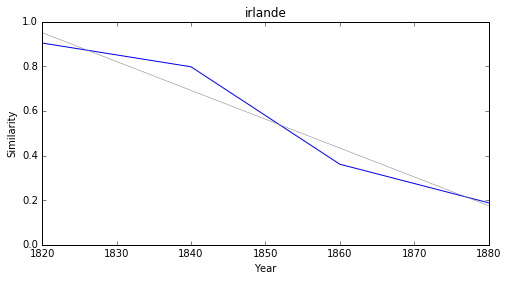

tableau


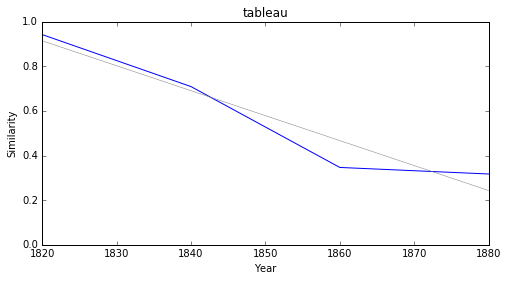

régénération


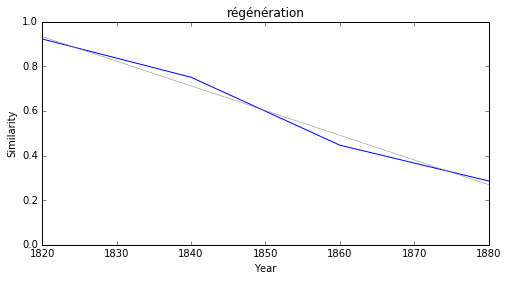

précéder


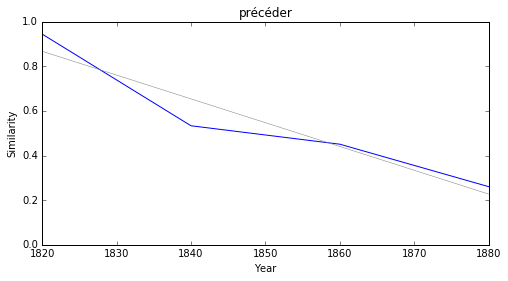

aspect


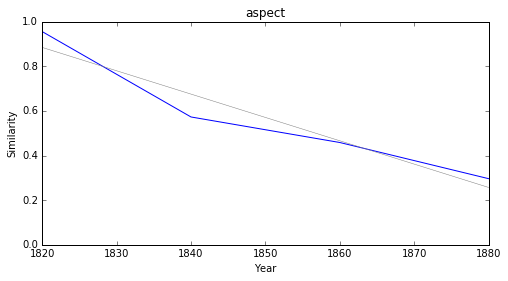

irlandais


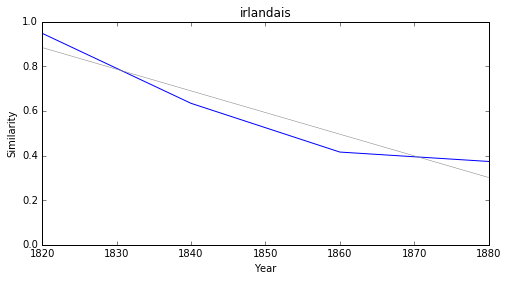

différence


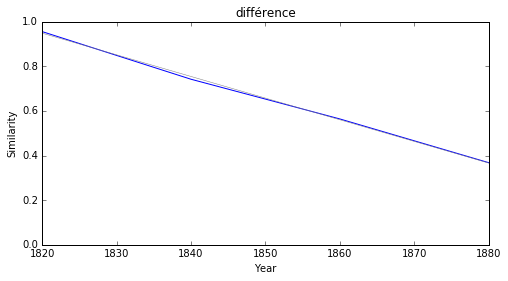

hostile


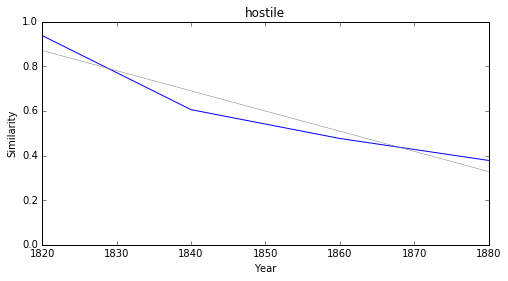

distinguer


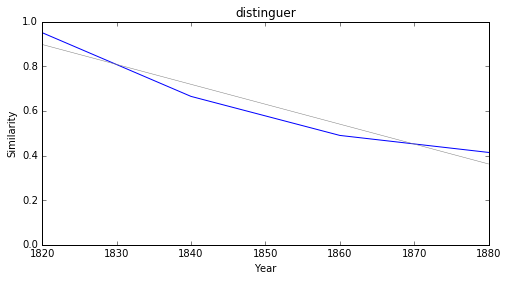

tyrannie


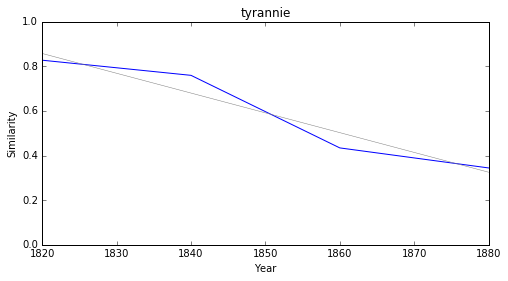

### <i><b>loi</i></b>

             token     slope         p
57       mahométan -0.017318  0.011036
62        dialecte -0.015249  0.022319
139       entourer -0.012875  0.043877
50         presque -0.012596  0.002804
48         lumière -0.012049  0.005927
40   incontestable -0.010995  0.036961
133        irlande -0.010565  0.041577
28       adoration -0.010444  0.040523
102            île -0.010417  0.029321
83     réformation -0.010222  0.040010



mahométan


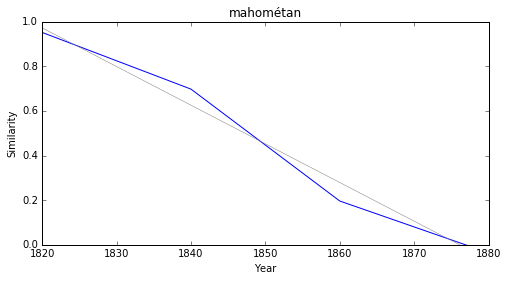

dialecte


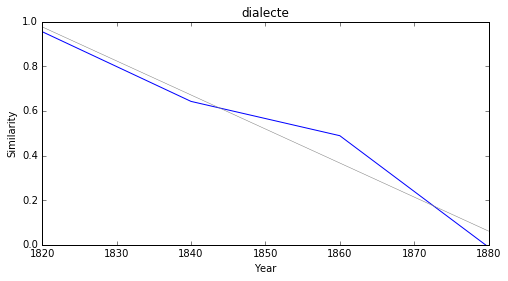

entourer


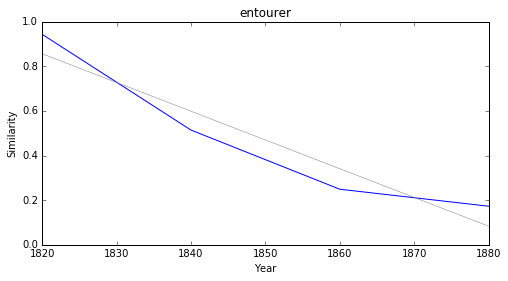

presque


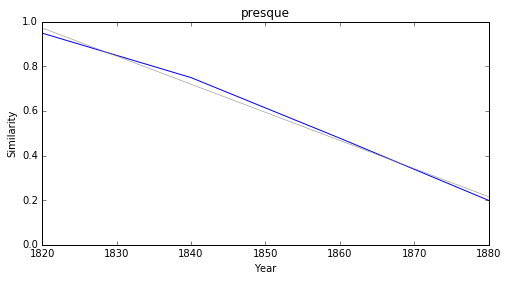

lumière


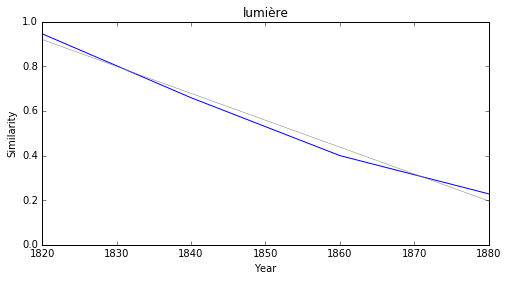

incontestable


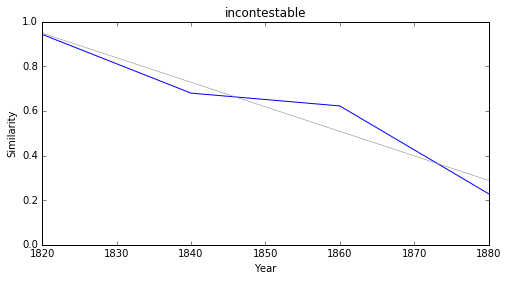

irlande


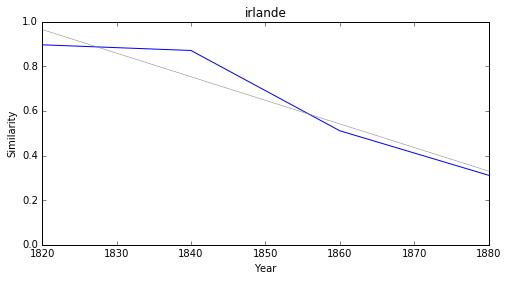

adoration


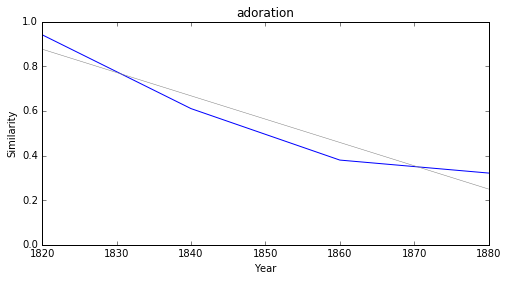

île


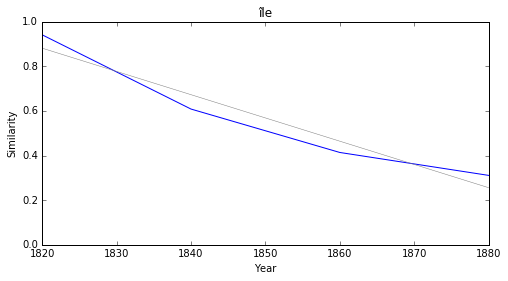

réformation


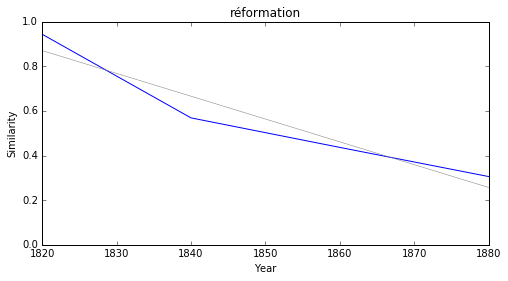

### <i><b>méthode</i></b>

            token     slope         p
21        bertram -0.018891  0.012603
16            nec -0.018182  0.049811
122        london -0.016988  0.015530
7         écosser -0.016206  0.012791
112        ulysse -0.014051  0.041651
15   commentateur -0.013058  0.038513
87    manufacture -0.010848  0.030096
74          vasco -0.010012  0.003578
86          court -0.009500  0.015620
64      portugais -0.009372  0.003935



bertram


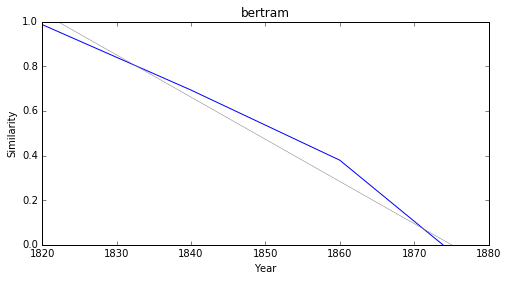

nec


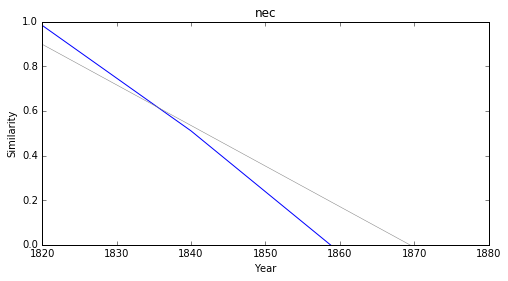

london


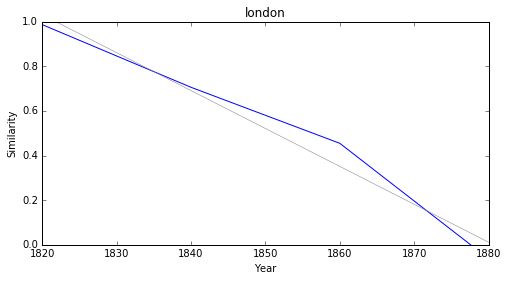

écosser


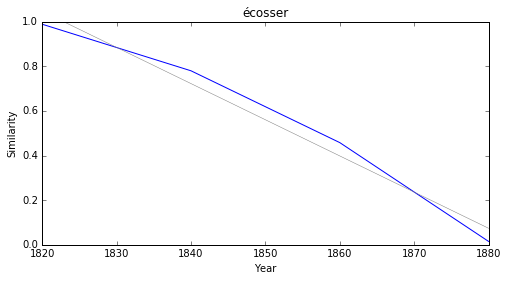

ulysse


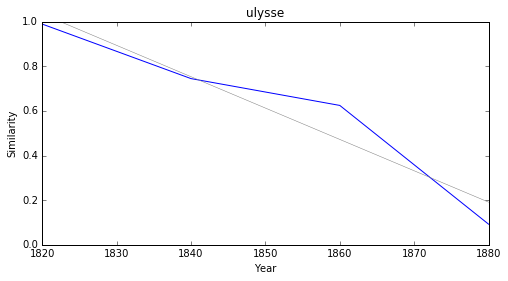

commentateur


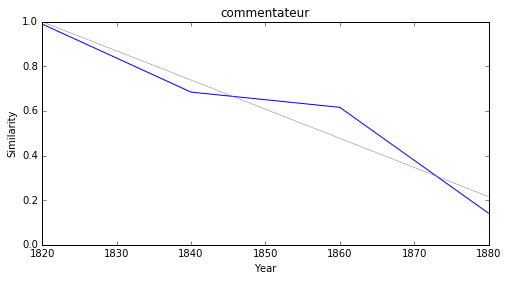

manufacture


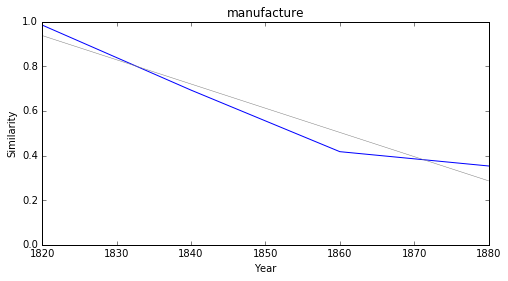

vasco


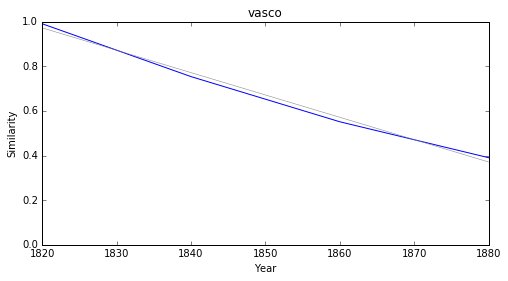

court


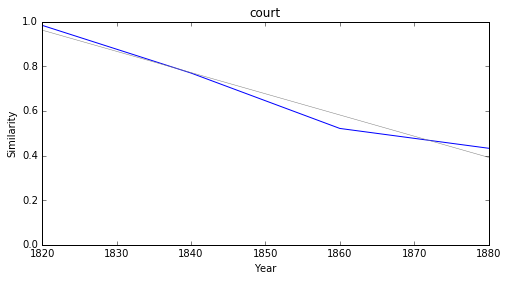

portugais


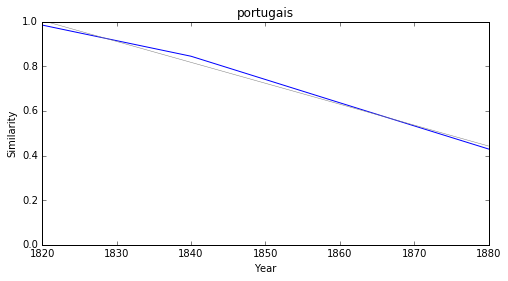

### <i><b>génie</i></b>

         token     slope         p
32     chaucer -0.014763  0.010956
8      cratère -0.012557  0.014831
61  réfutation -0.010285  0.037721
34     lumière -0.008125  0.001115
6           or -0.007876  0.049165
44   imitateur -0.007421  0.017056
7      détroit -0.007306  0.049521
81   plutarque -0.007133  0.035110
76    produire -0.007104  0.034163
84    meilleur -0.006930  0.022351



chaucer


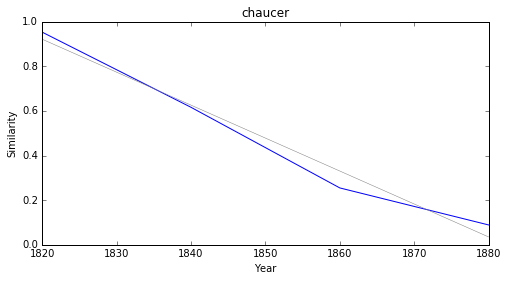

cratère


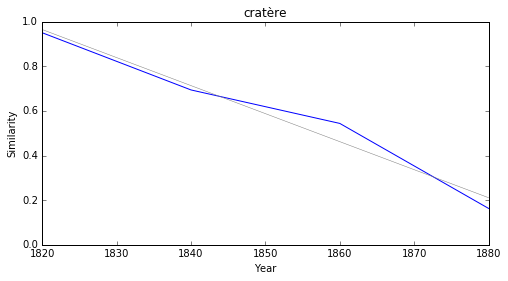

réfutation


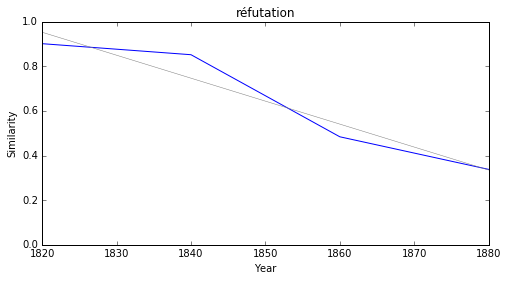

lumière


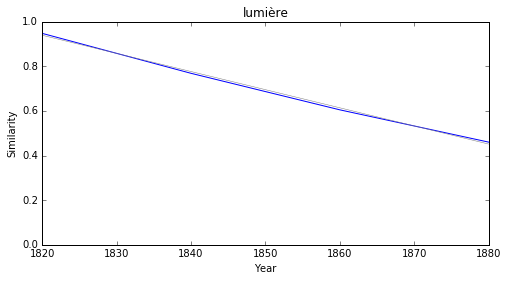

or


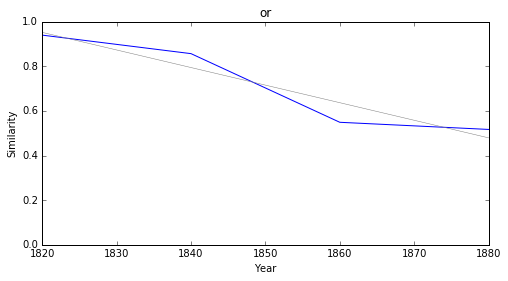

imitateur


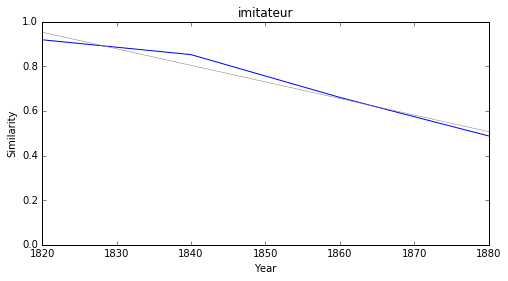

détroit


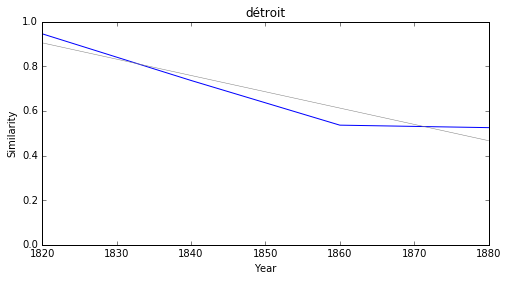

plutarque


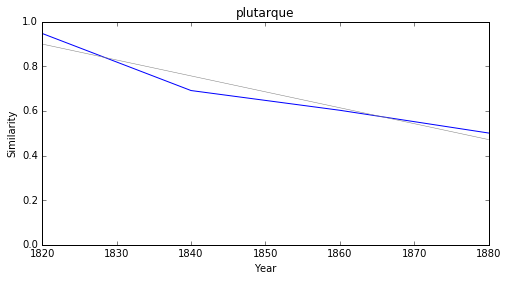

produire


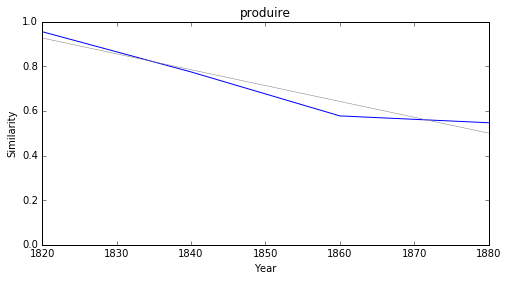

meilleur


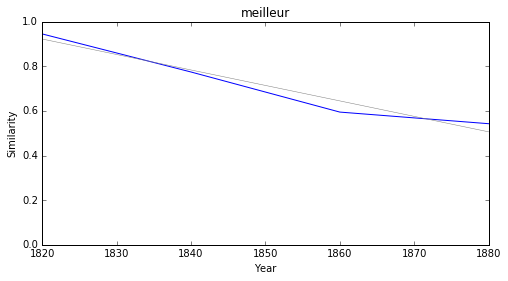

### <i><b>romantisme</i></b>

              token     slope         p
26           timoré  0.003831  0.007165
16      désespérant  0.004277  0.016803
10      épouvantail  0.004475  0.045115
22          ricaner  0.004764  0.047368
31             papa  0.004904  0.006415
15           piteux  0.005516  0.040418
14  victorieusement  0.005643  0.008773
1            aimant  0.005796  0.043936
25           gorger  0.005885  0.015457
28          satiété  0.006195  0.012552



timoré


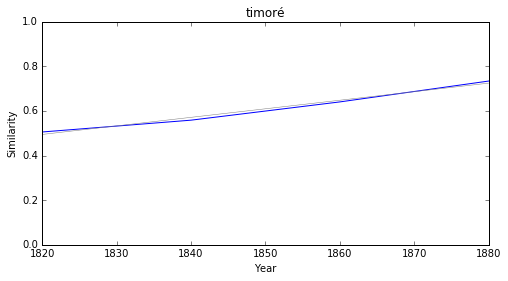

désespérant


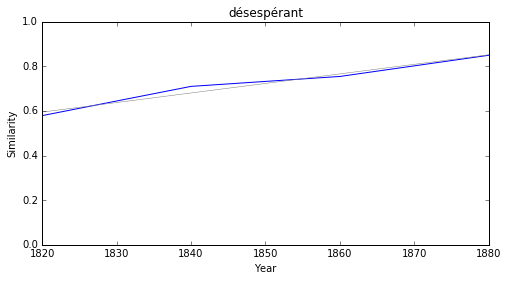

épouvantail


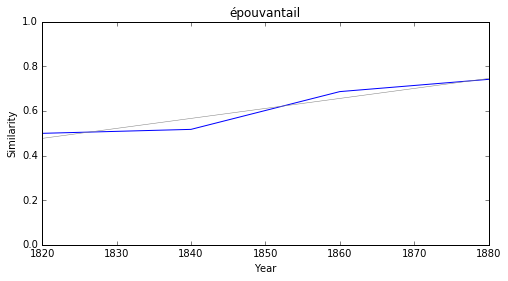

ricaner


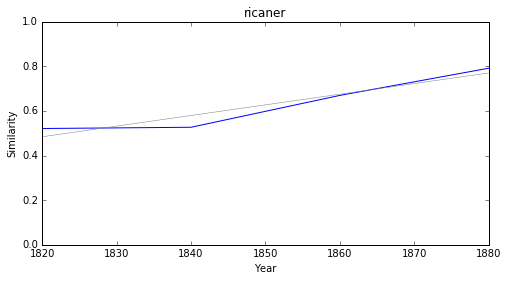

papa


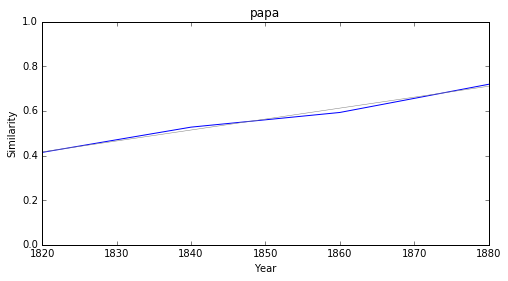

piteux


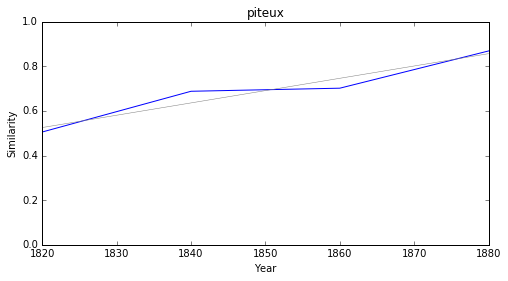

victorieusement


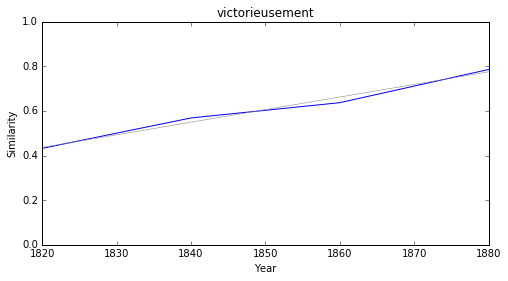

aimant


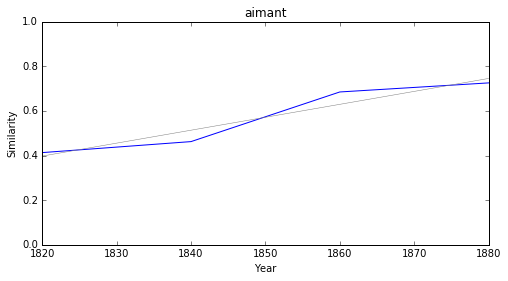

gorger


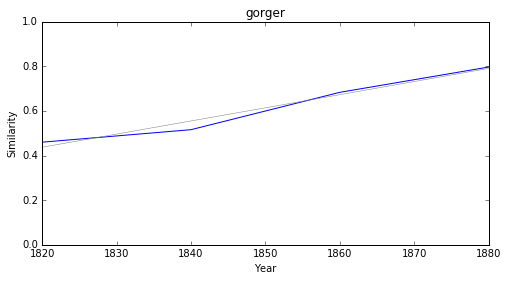

satiété


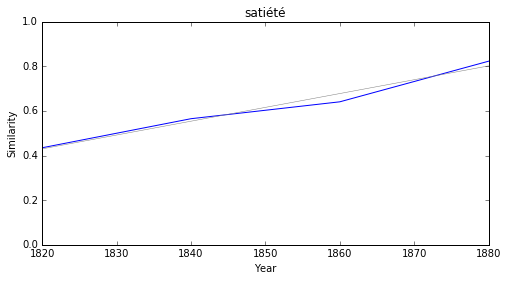

### <i><b>réalisme</i></b>

          token     slope         p
1     dénombrer  0.009537  0.016635
16    fleuriste  0.010118  0.040859
4          brio  0.010895  0.010485
17  inconvenant  0.011076  0.008870
7       galoche  0.011795  0.002126
11    pharisien  0.012695  0.024392
18       anodin  0.013499  0.049240
0         maret  0.014173  0.002361
14       eglise  0.015145  0.035109
19        figue  0.015462  0.013016



dénombrer


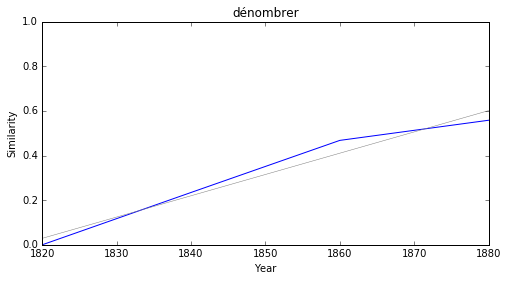

fleuriste


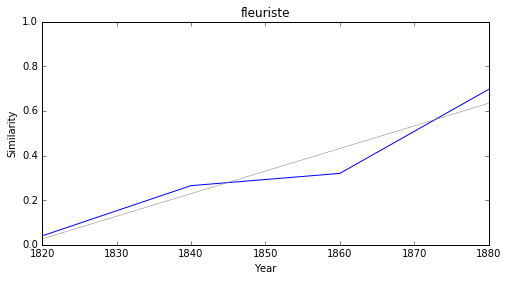

brio


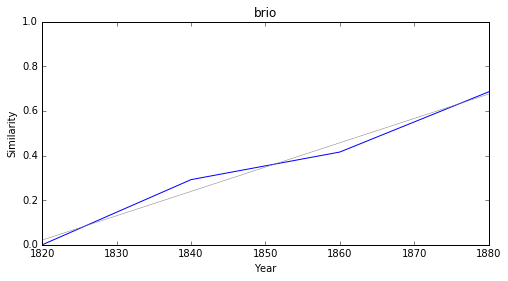

inconvenant


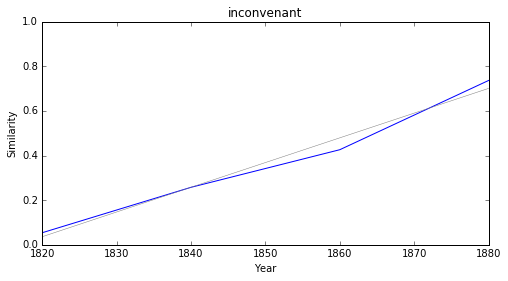

galoche


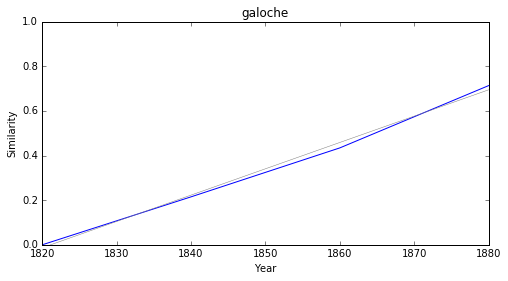

pharisien


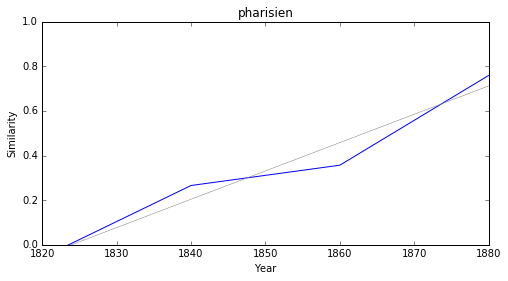

anodin


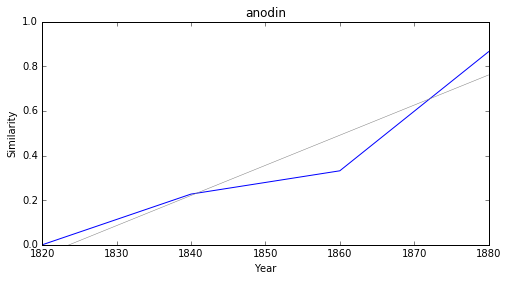

maret


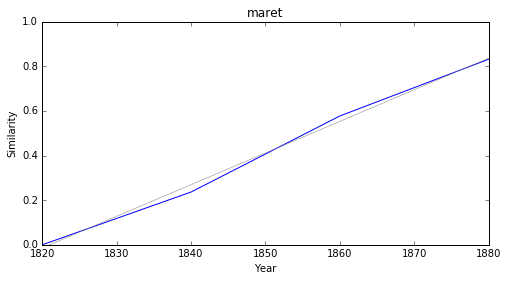

eglise


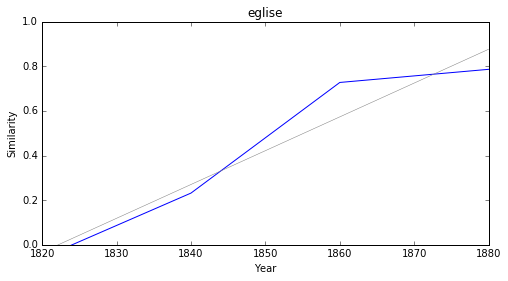

figue


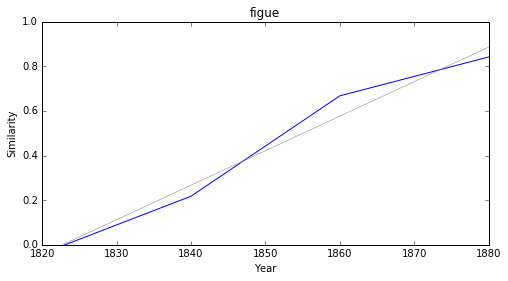

### <i><b>symbolisme</i></b>

            token     slope         p
7           ahuri  0.007548  0.026847
9            hung  0.009692  0.033139
0        patrocle  0.010407  0.026735
4     omnipotence  0.010525  0.029241
6      marécageux  0.010829  0.047873
5          octroi  0.011617  0.024266
1          primat  0.011806  0.032218
3         surtaxe  0.012059  0.034377
10  inappréciable  0.012813  0.015061
2         fédéral  0.013281  0.032013



ahuri


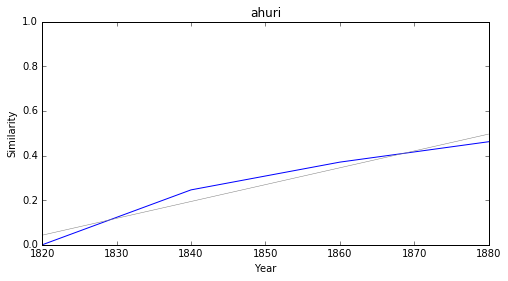

hung


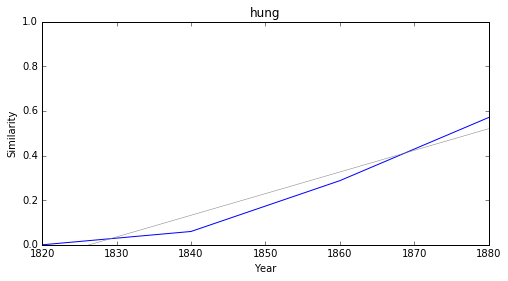

patrocle


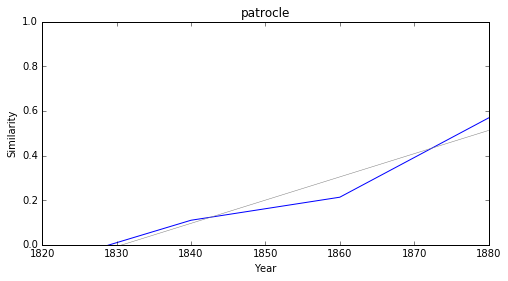

omnipotence


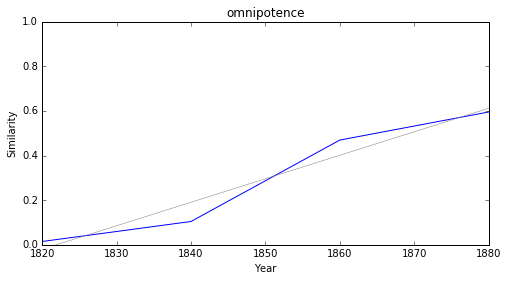

marécageux


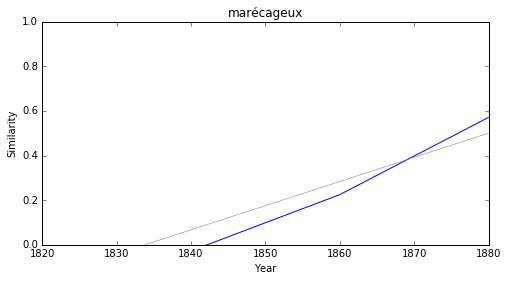

octroi


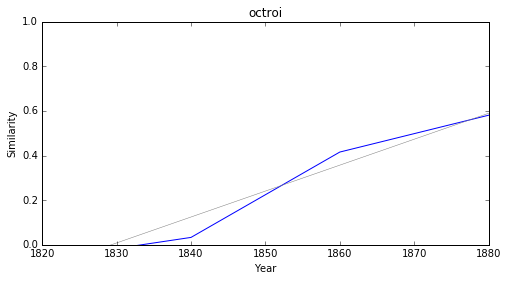

primat


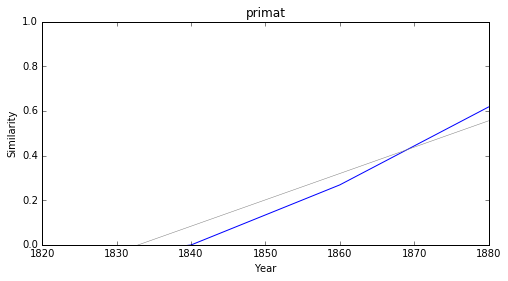

surtaxe


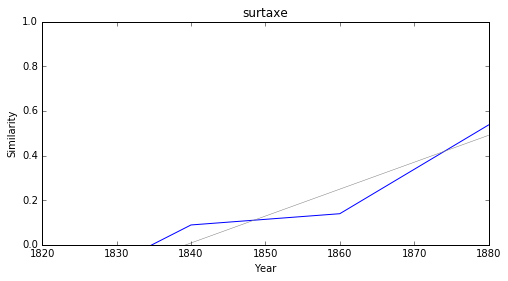

inappréciable


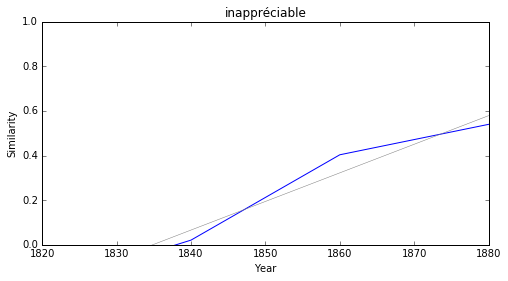

fédéral


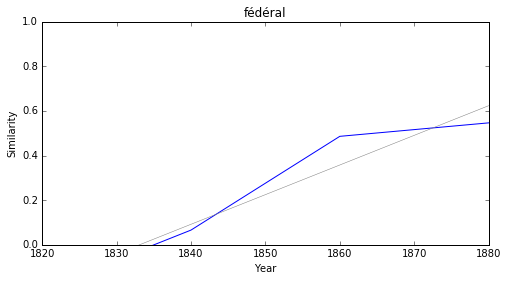

### <i><b>naturalisme</i></b>

         token     slope         p
11       penny -0.004257  0.008074
9     mabillon -0.002139  0.027227
24      cassel  0.010958  0.023299
0       bêtise  0.012069  0.011869
13      évasif  0.012945  0.014144
18      adepte  0.013576  0.008651
17      dérivé  0.013609  0.000233
20        book  0.014093  0.044371
7    demandeur  0.014303  0.018455
2   plaidoirie  0.014405  0.021947



penny


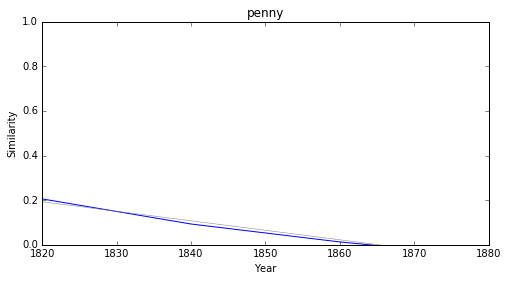

mabillon


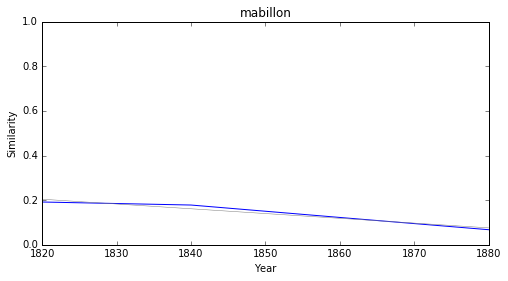

cassel


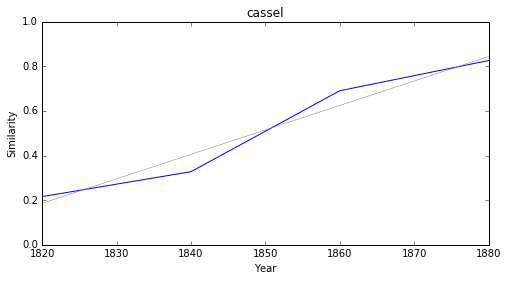

bêtise


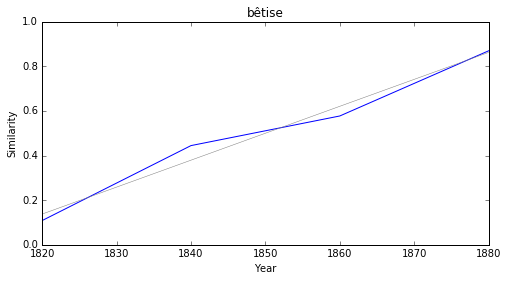

évasif


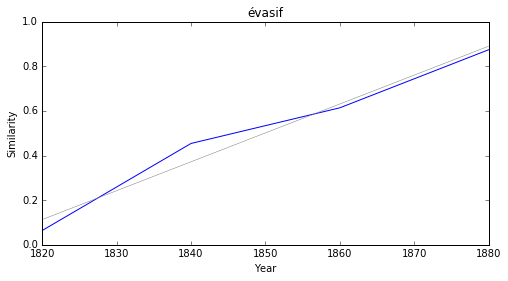

adepte


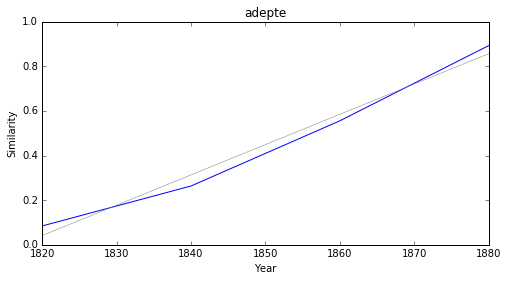

dérivé


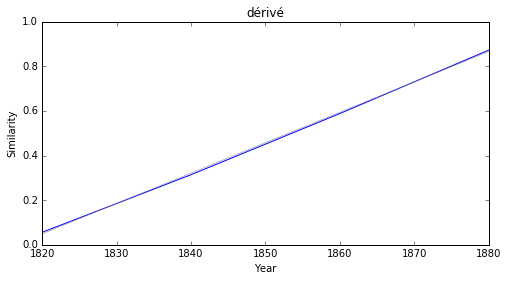

book


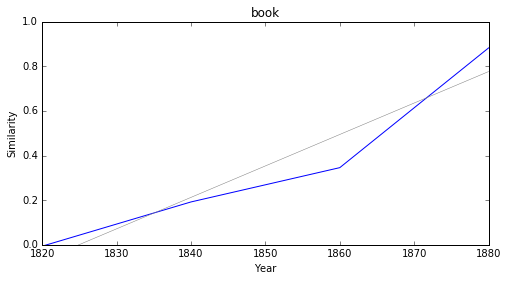

demandeur


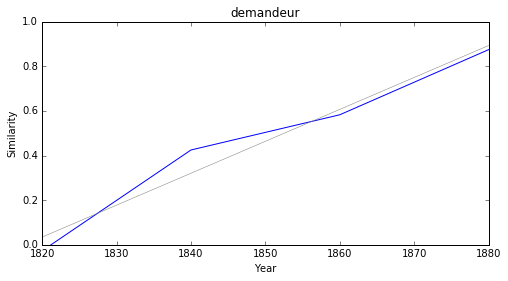

plaidoirie


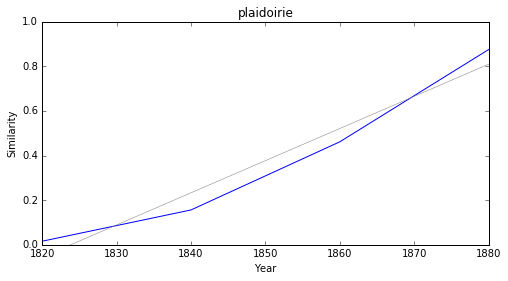

In [50]:
for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df2 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df2.sort_values('slope', ascending=True).head(10))
    print('\n\n')
    
    for i, row in df2.sort_values('slope', ascending=True).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)

# Intersected neighbors

In this part, we show which significant terms tend to be, throughout time, the nearest neighbours to the main entry. That is to say that these vectors follow the same evolution through time as the main entry and are very near to the "littérature" vector. At this stage, we only ask for significant terms (filter above : "if fit.pvalues[1] < 0.05").

In [51]:
def intersect_neighbor_vocab(anchor, topn=2000):
    
    vocabs = []
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocabs.append(set([s[0] for s in similar]))
        
    return set.intersection(*vocabs)

In [52]:
entries={}

for word in testList:
    data = []
    for token in intersect_neighbor_vocab(word):
    
        series = cosine_series(word, token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

In [53]:
import pandas as pd

### <i><b>littérature</i></b>

            token     slope         p
28   enseignement -0.000700  0.043674
7     législation -0.001048  0.030707
6      historique -0.001139  0.035809
12    application -0.001379  0.043726
26       européen -0.001821  0.034444
10   conservateur -0.001905  0.042349
16          union -0.001916  0.007480
30          latin -0.002018  0.016694
18  établissement -0.002051  0.003521
8            mode -0.002138  0.014923



enseignement


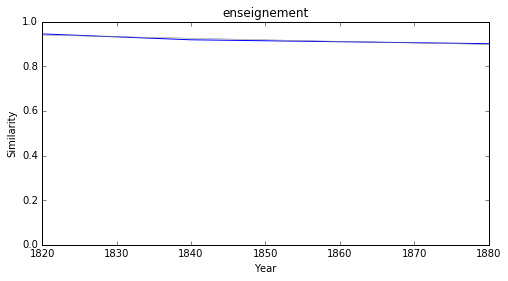

législation


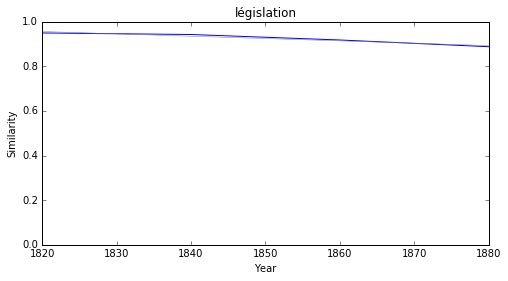

historique


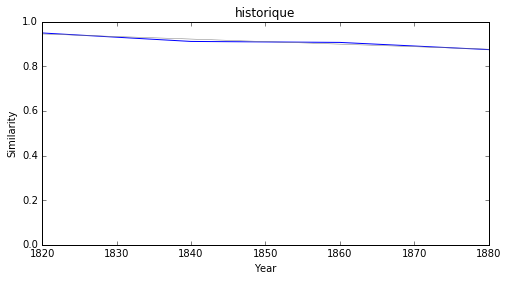

application


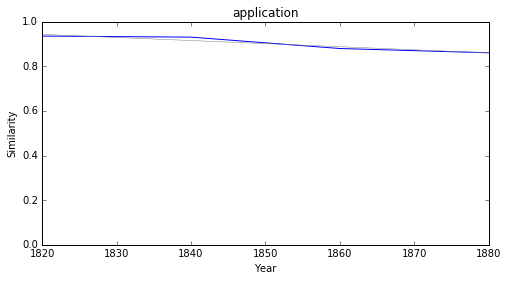

européen


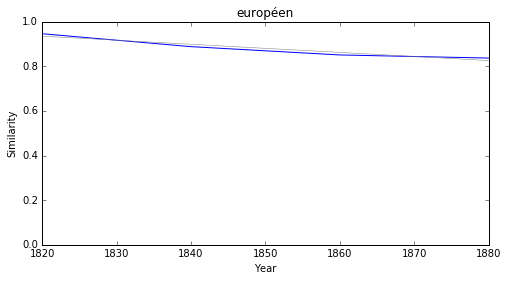

conservateur


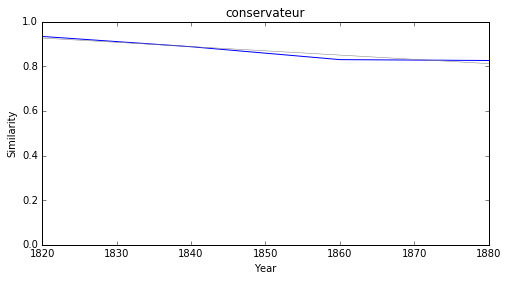

union


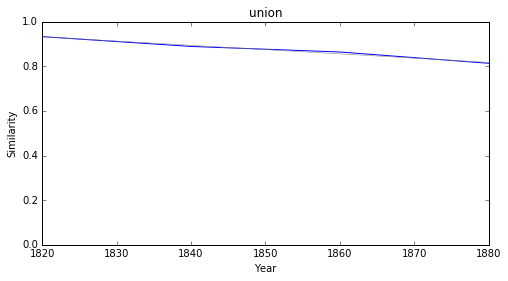

latin


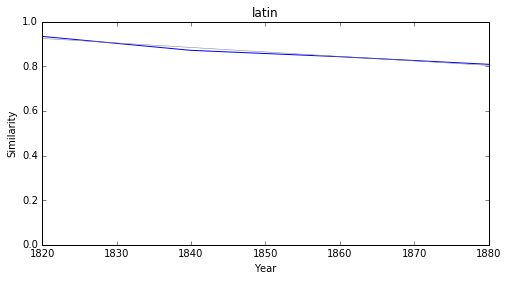

établissement


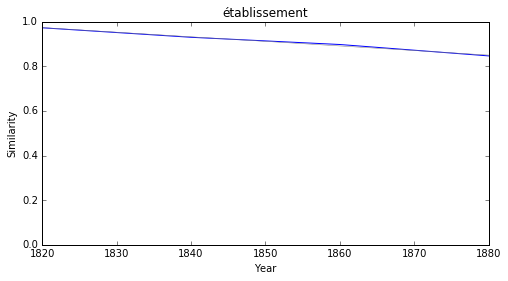

mode


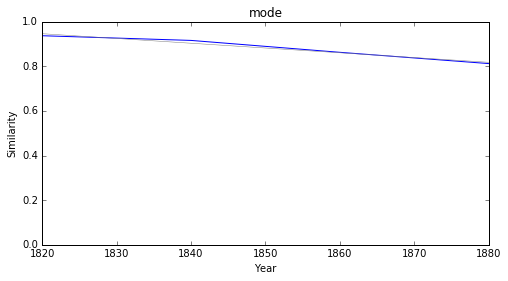

### <i><b>poésie</i></b>

           token     slope         p
10      grandeur -0.001207  0.031502
37  enseignement -0.001276  0.018840
4      ascendant -0.001456  0.039471
29       théorie -0.001595  0.040270
8     diplomatie -0.001754  0.001211
20   composition -0.002018  0.048536
22         fonds -0.002025  0.006432
15   inspiration -0.002081  0.014336
34     isolement -0.002130  0.047606
6      recherche -0.002160  0.037901



grandeur


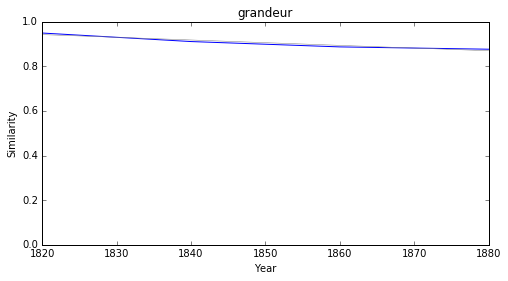

enseignement


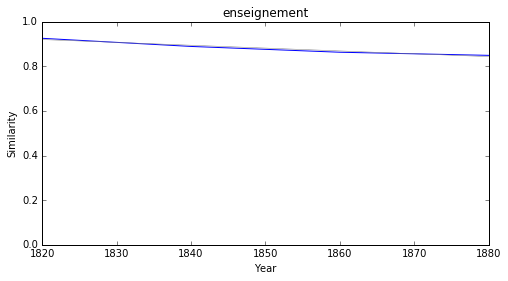

ascendant


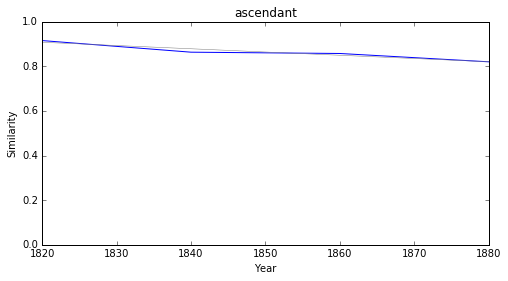

théorie


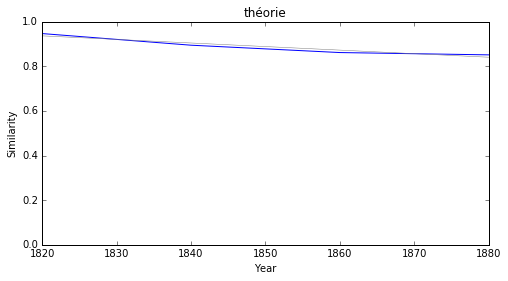

diplomatie


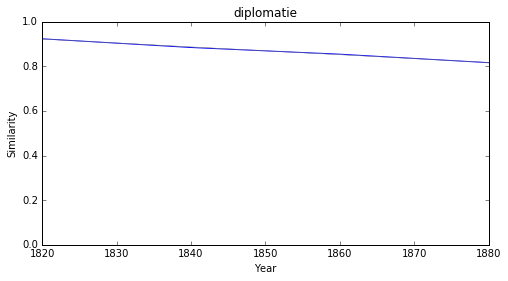

composition


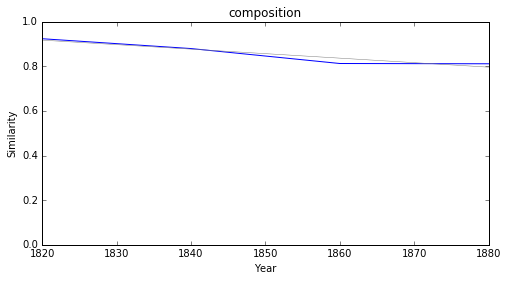

fonds


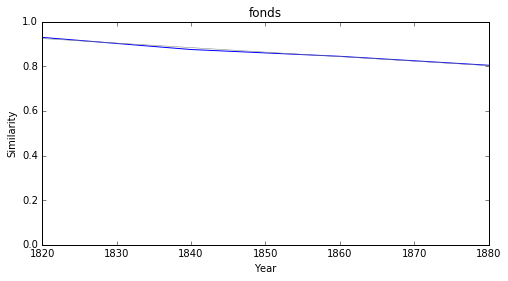

inspiration


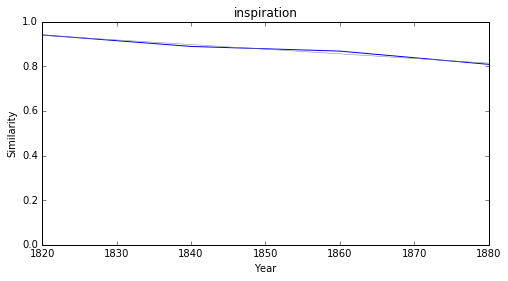

isolement


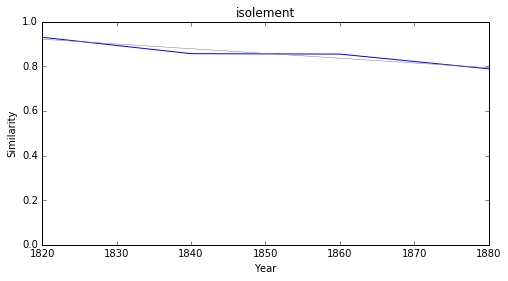

recherche


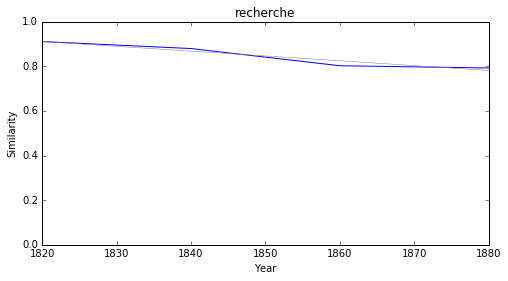

### <i><b>science</i></b>

           token     slope         p
19      religion -0.001481  0.019389
15       société -0.001911  0.003703
18      pratique -0.002115  0.006009
22  civilisation -0.002135  0.011585
7      puissance -0.002276  0.030968
11        morale -0.002404  0.005120
4        progrès -0.002500  0.007224
2         moeurs -0.002522  0.006420
9     expérience -0.002607  0.025576
17           loi -0.003049  0.019719



religion


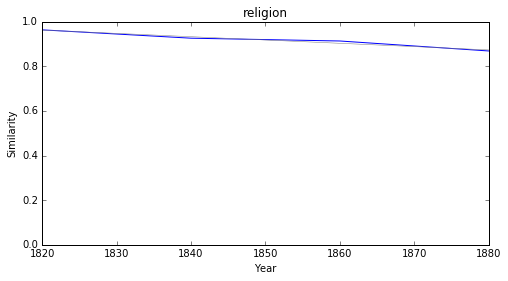

société


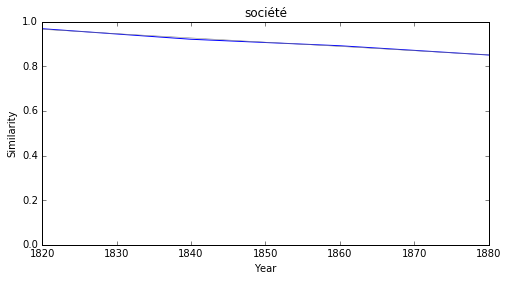

pratique


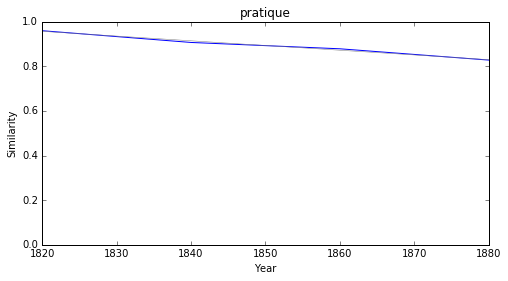

civilisation


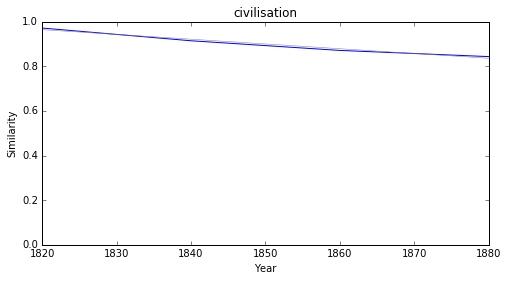

puissance


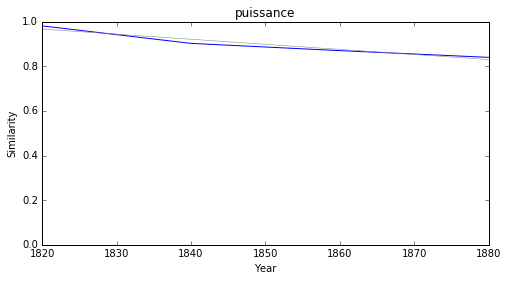

morale


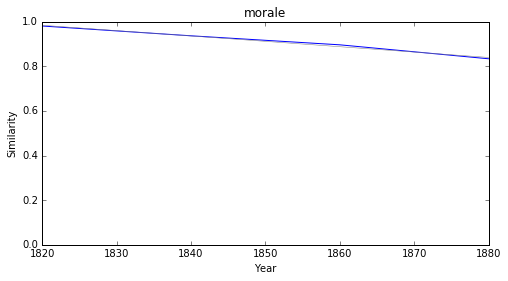

progrès


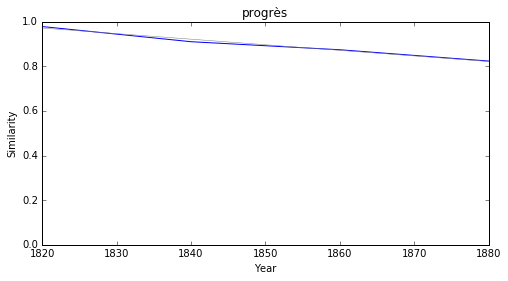

moeurs


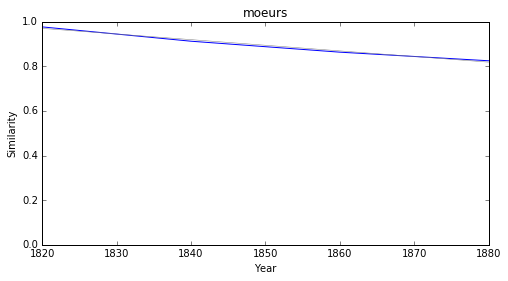

expérience


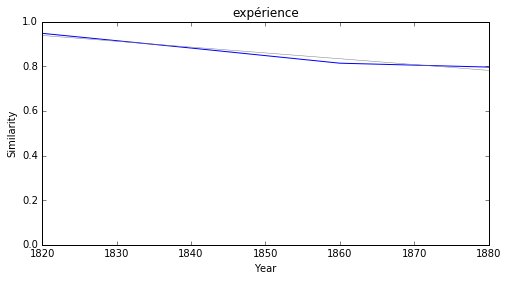

loi


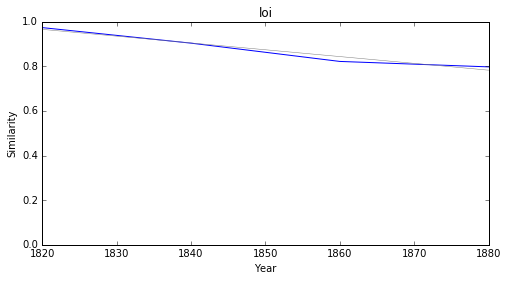

### <i><b>savoir</i></b>

         token     slope         p
60  comprendre -0.001639  0.045174
41   autrement -0.002523  0.027493
51        user -0.002640  0.008462
82    souffrir -0.002643  0.043424
95   remarquer -0.002696  0.046478
55   ressentir -0.002883  0.028704
6      irriter -0.002904  0.045767
72     bonheur -0.003029  0.025884
15  conscience -0.003196  0.038011
85   respecter -0.003246  0.045202



comprendre


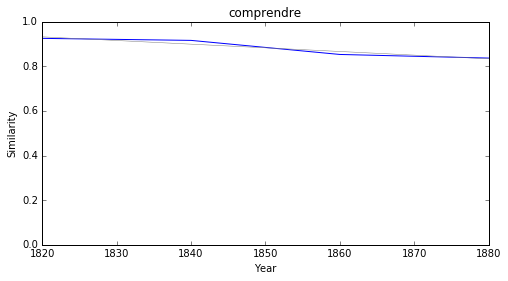

autrement


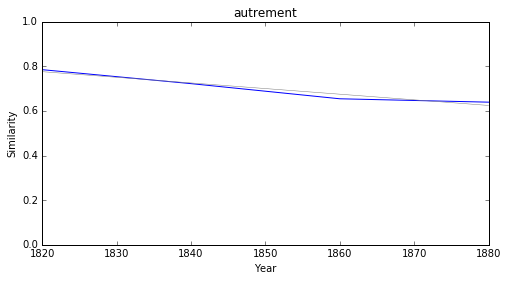

user


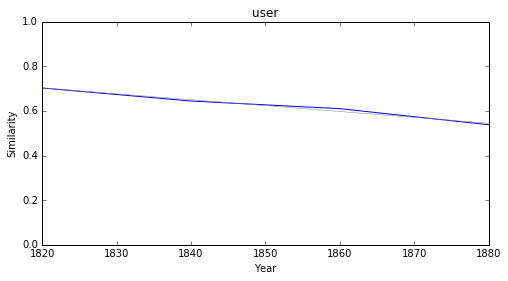

souffrir


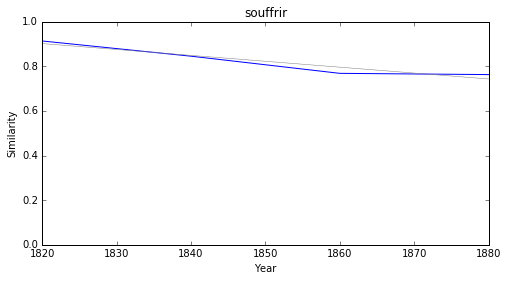

remarquer


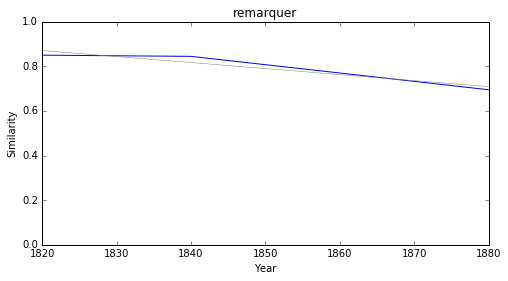

ressentir


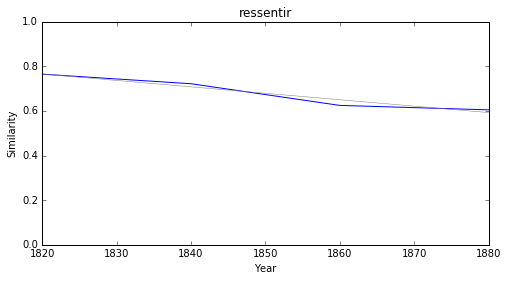

irriter


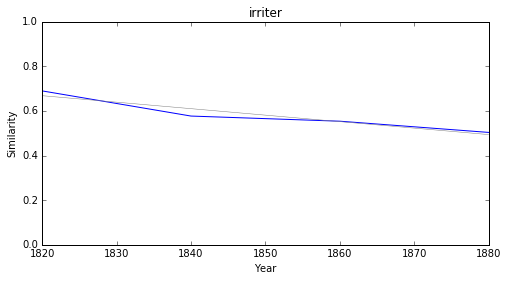

bonheur


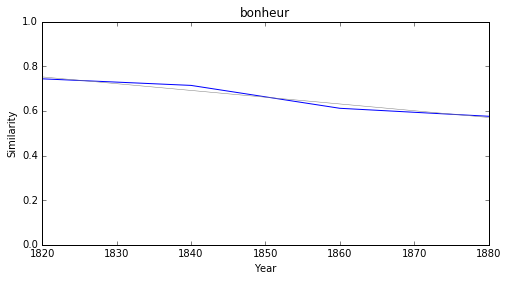

conscience


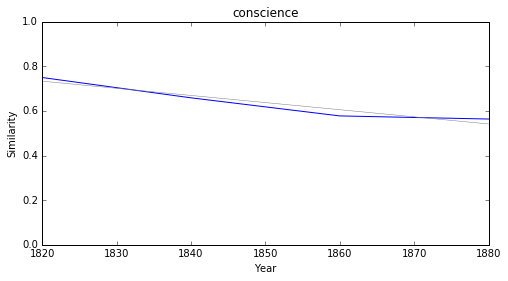

respecter


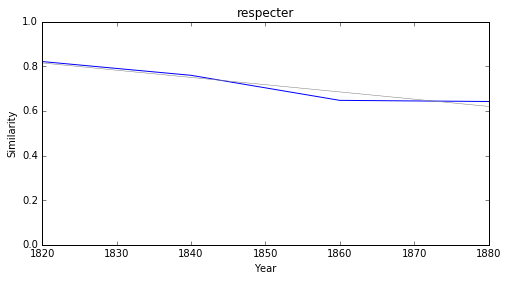

### <i><b>histoire</i></b>

           token     slope         p
40    expérience -0.001631  0.022928
13        auteur -0.001642  0.039254
23        époque -0.002505  0.004581
29          rôle -0.002513  0.042427
50      résultat -0.002722  0.008607
27         usage -0.002742  0.008103
63      religion -0.002767  0.043086
41  circonstance -0.003017  0.012724
35      habitude -0.003029  0.021498
51       origine -0.003031  0.039374



expérience


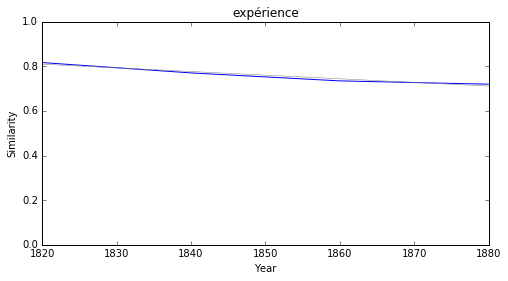

auteur


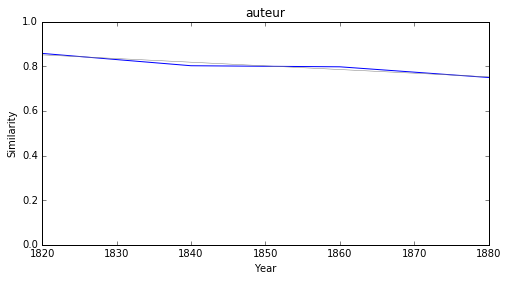

époque


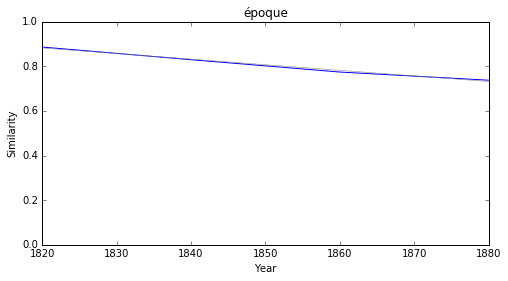

rôle


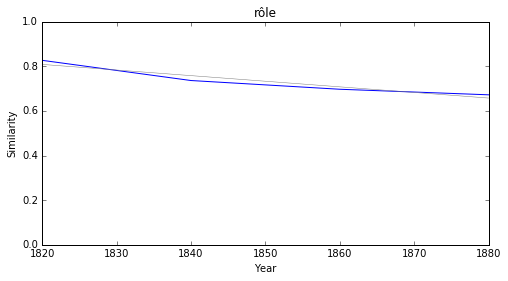

résultat


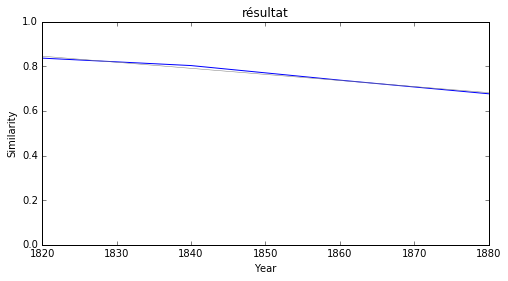

usage


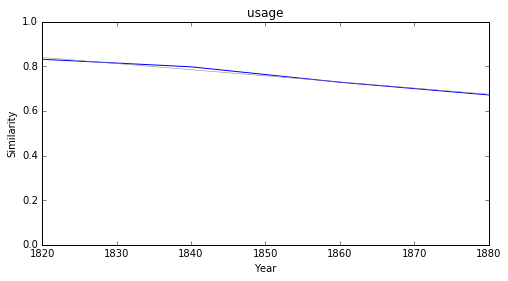

religion


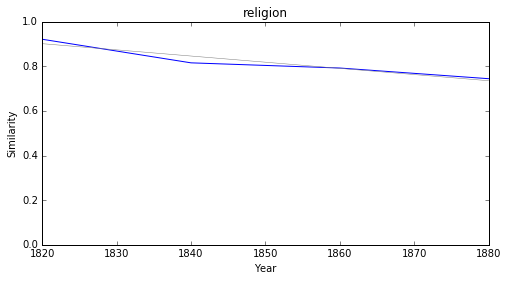

circonstance


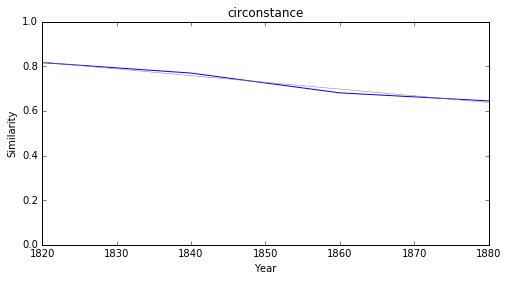

habitude


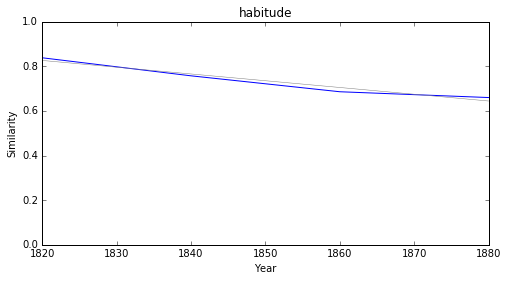

origine


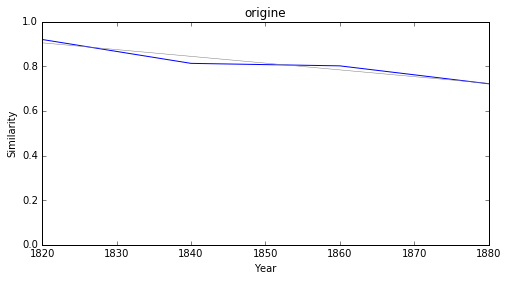

### <i><b>philosophie</i></b>

          token     slope         p
57      société -0.002446  0.004877
67      système -0.002475  0.036814
13       absolu -0.002508  0.018984
46      justice -0.002602  0.022261
31      théorie -0.002722  0.005092
49     résultat -0.002736  0.015470
21       action -0.002745  0.024698
14  institution -0.002890  0.016539
30    monarchie -0.002942  0.010469
58        idéal -0.002968  0.044435



société


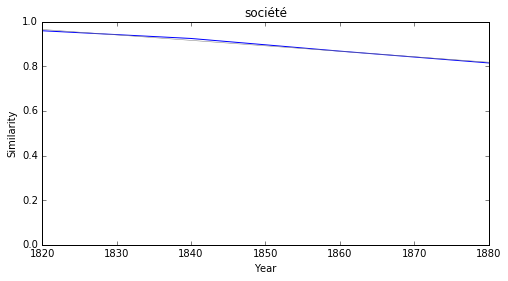

système


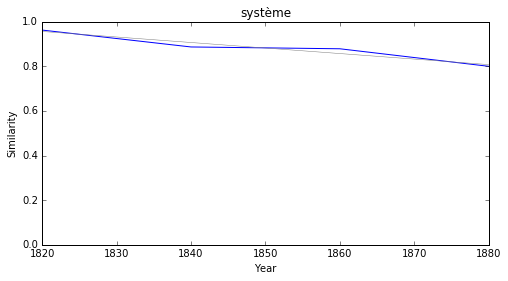

absolu


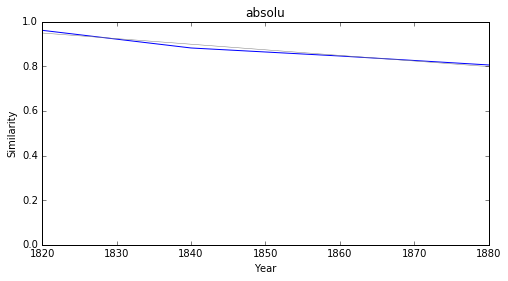

justice


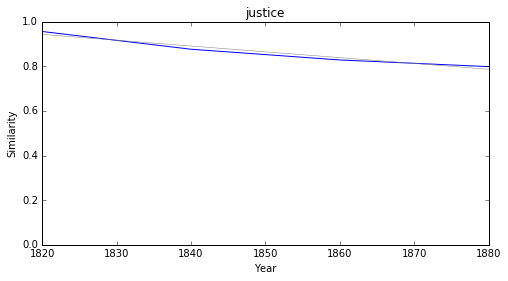

théorie


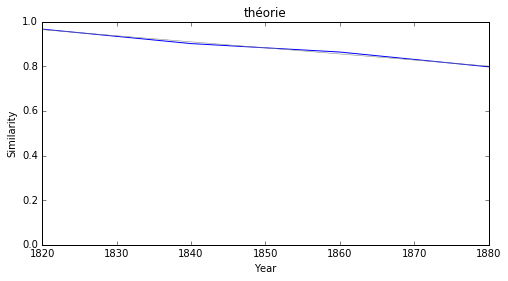

résultat


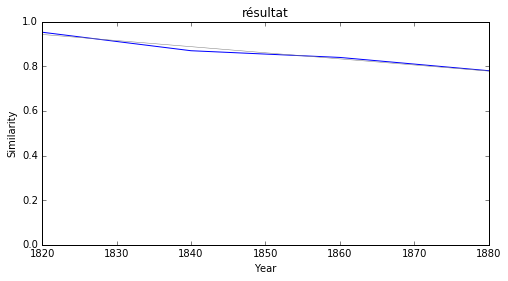

action


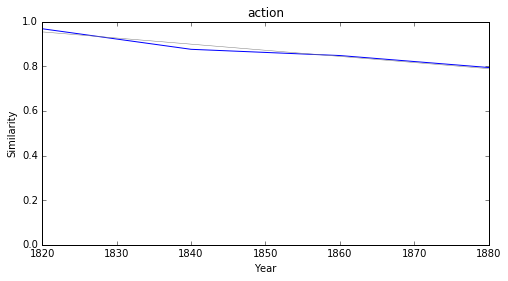

institution


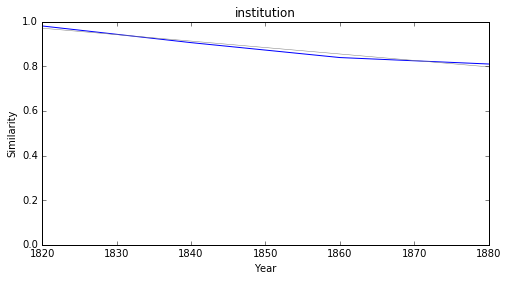

monarchie


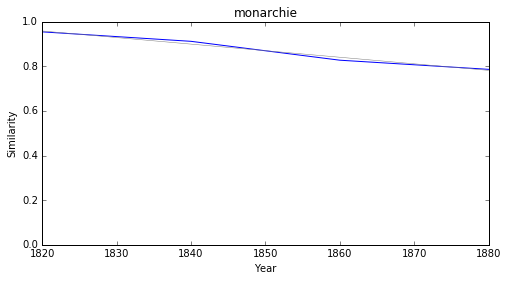

idéal


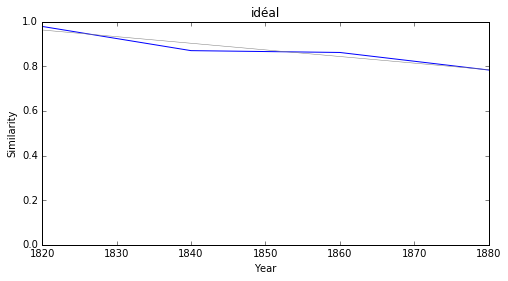

### <i><b>lettre</i></b>

           token     slope         p
82       réponse -0.003868  0.047355
49      dépêcher -0.004230  0.012138
1    ambassadeur -0.004524  0.026064
116    entretien -0.004750  0.040872
38        écrire -0.005113  0.048218
28        cousin -0.005167  0.041440
115        oncle -0.005194  0.027037
9          frère -0.005272  0.046563
13      portrait -0.005380  0.009802
68        phrase -0.005482  0.041433



réponse


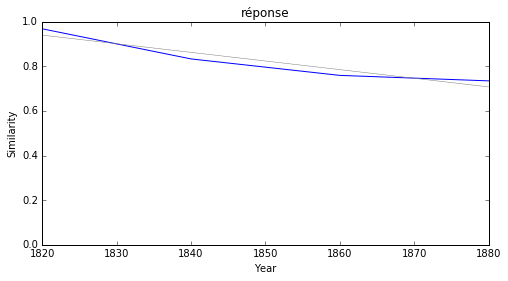

dépêcher


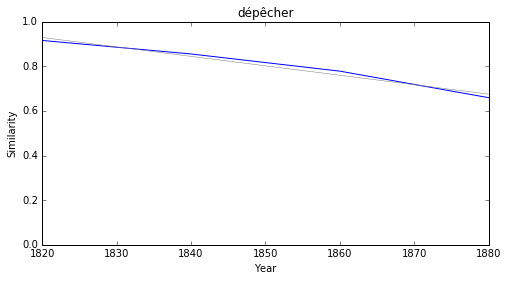

ambassadeur


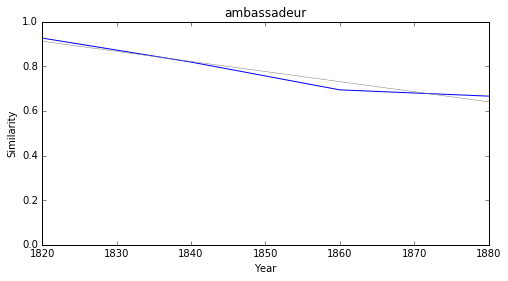

entretien


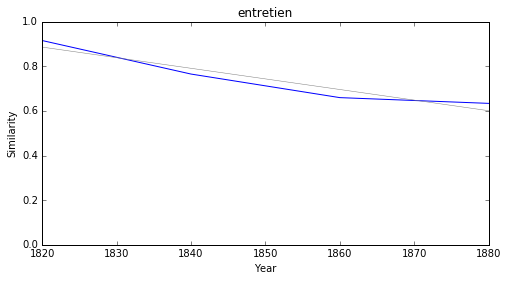

écrire


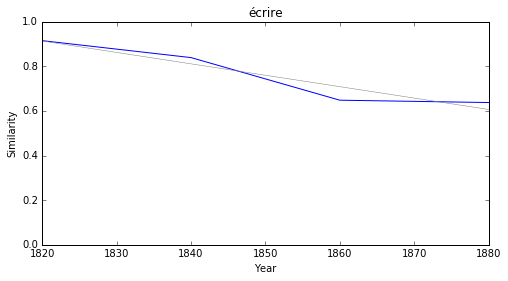

cousin


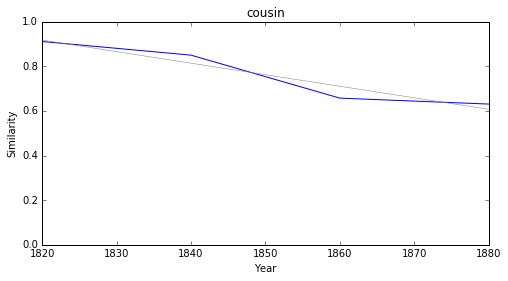

oncle


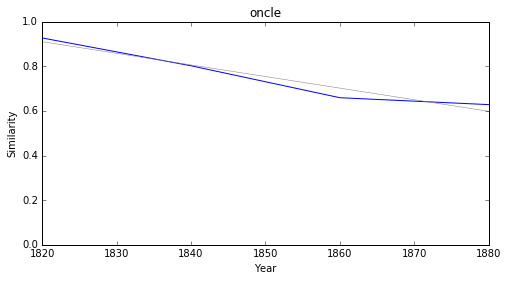

frère


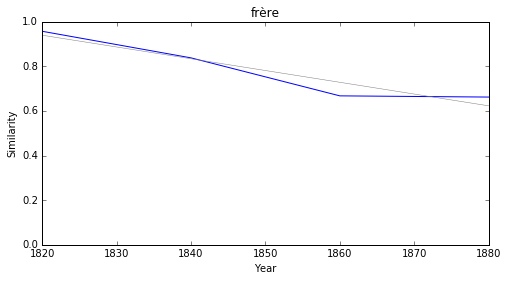

portrait


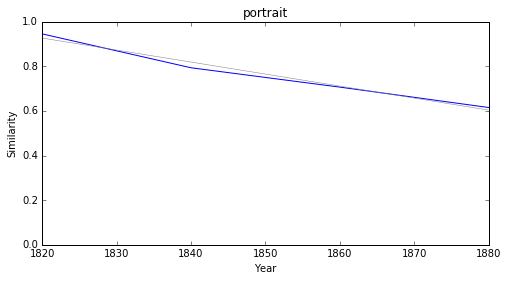

phrase


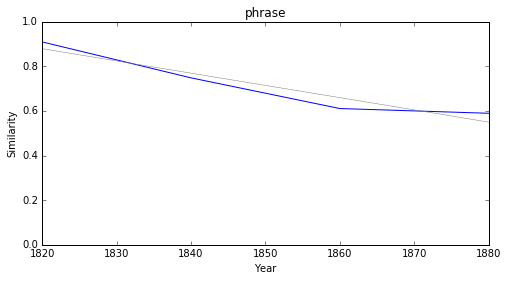

### <i><b>critique</i></b>

            token     slope         p
114        absolu -0.002252  0.005207
31        science -0.002408  0.007692
115     conquérir -0.002621  0.044776
13      nécessité -0.002634  0.038788
97        injuste -0.002658  0.038406
40     expérience -0.002729  0.028837
94       religion -0.002808  0.008155
34     entreprise -0.002838  0.043991
78   métaphysique -0.002897  0.015406
48    transaction -0.002905  0.039986



absolu


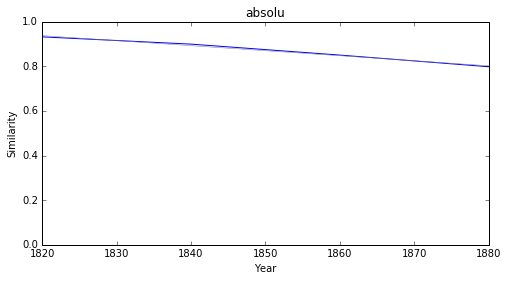

science


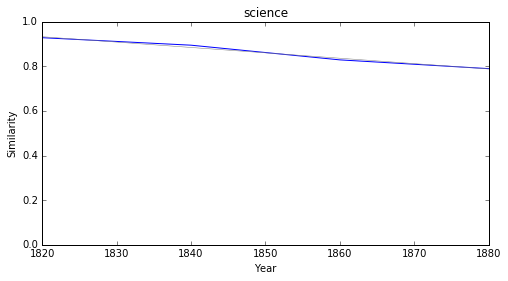

conquérir


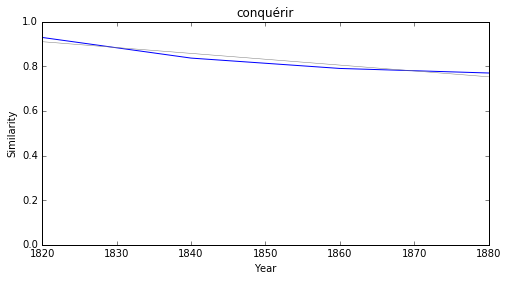

nécessité


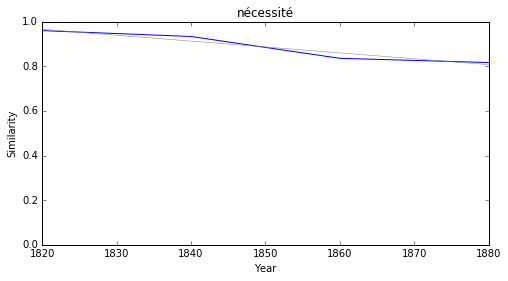

injuste


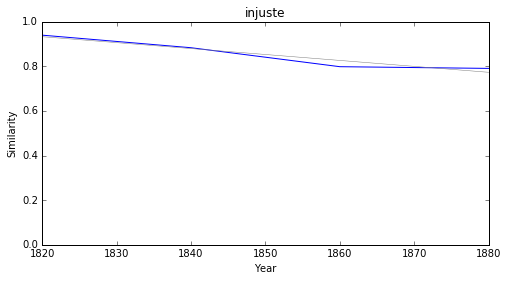

expérience


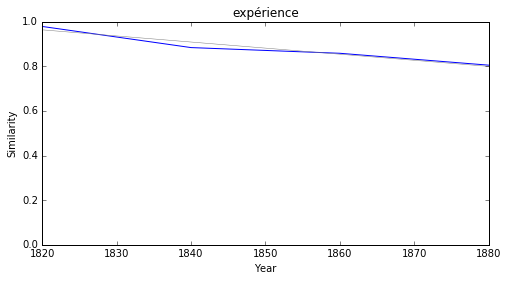

religion


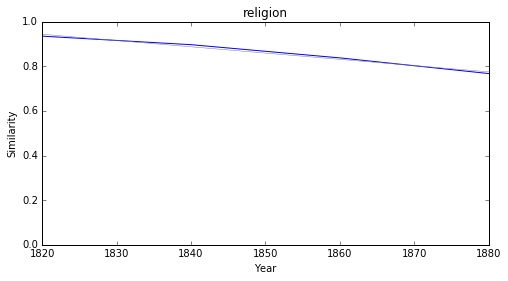

entreprise


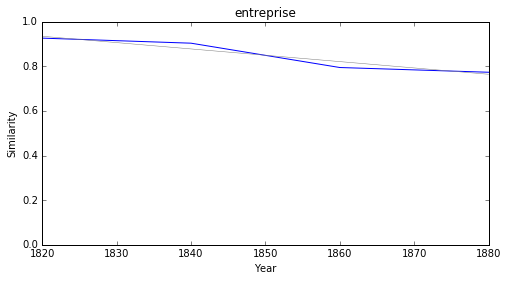

métaphysique


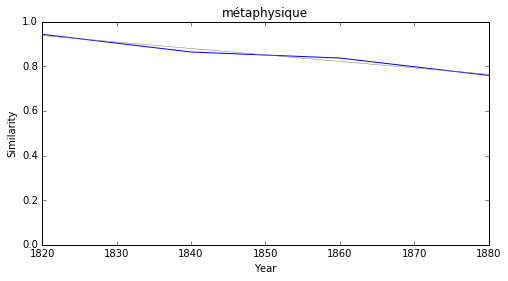

transaction


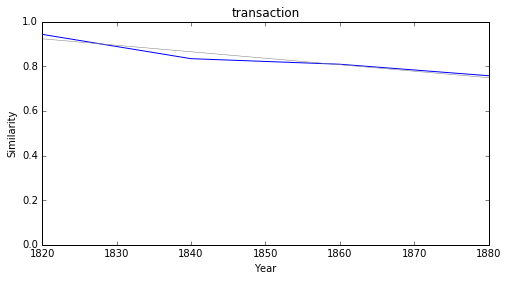

### <i><b>roman</i></b>

            token     slope         p
18          drame -0.001577  0.013694
28      ignorance -0.001581  0.042358
14        mystère -0.001818  0.033856
8       spectacle -0.001928  0.016615
1   préoccupation -0.002048  0.004038
17     réputation -0.002085  0.037839
4             jeu -0.002229  0.028737
12       vocation -0.002234  0.027443
21        miracle -0.002392  0.023845
26      bourgeois -0.002396  0.015552



drame


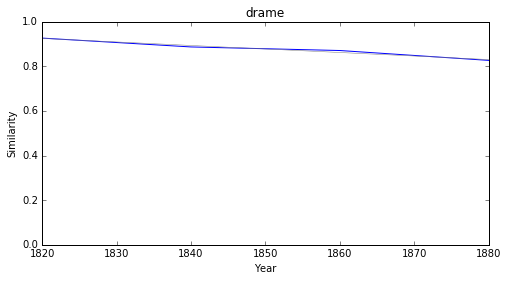

ignorance


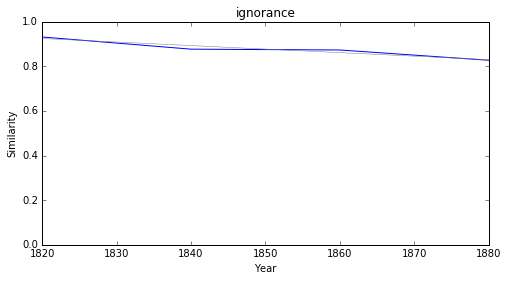

mystère


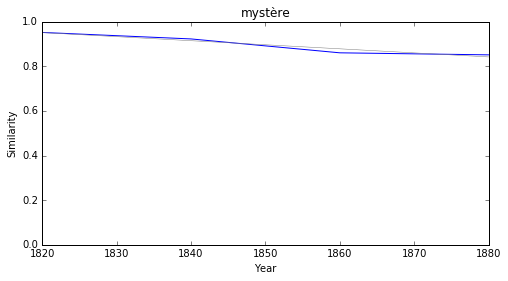

spectacle


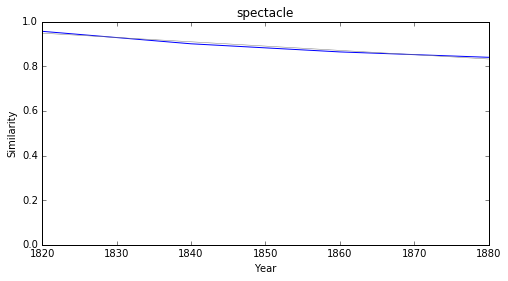

préoccupation


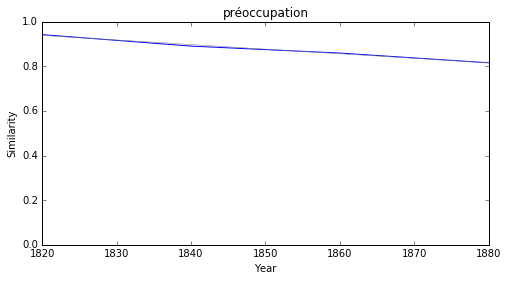

réputation


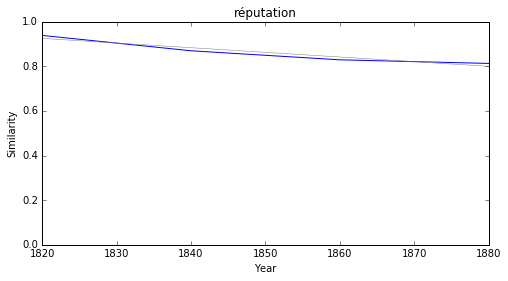

jeu


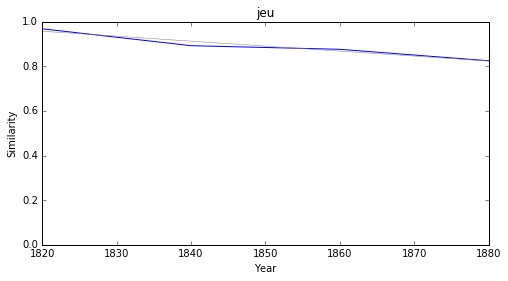

vocation


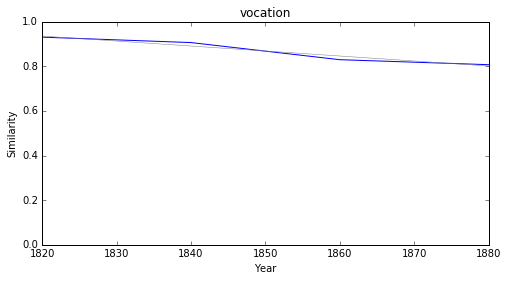

miracle


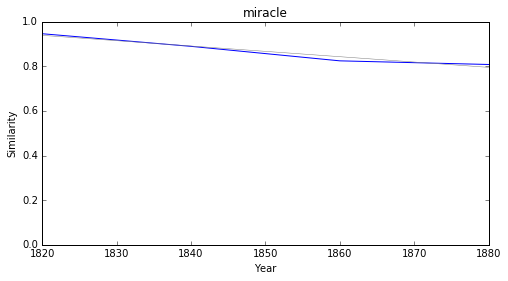

bourgeois


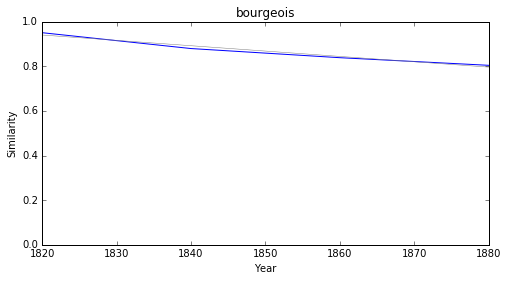

### <i><b>théâtre</i></b>

         token     slope         p
11         sol -0.003210  0.040786
76        rang -0.003366  0.018711
103   quartier -0.003390  0.020374
10     endroit -0.003564  0.019480
64         lac -0.003847  0.030838
47   voisinage -0.003909  0.018938
23        café -0.003996  0.030719
70       drame -0.003998  0.007822
53       cadre -0.004038  0.007449
51       salon -0.004053  0.011381



sol


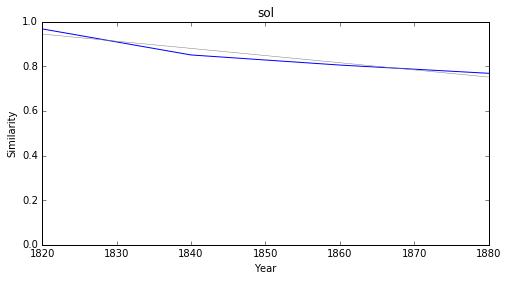

rang


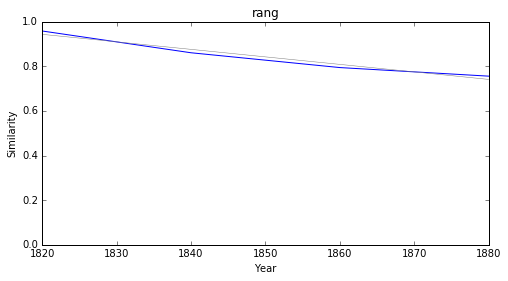

quartier


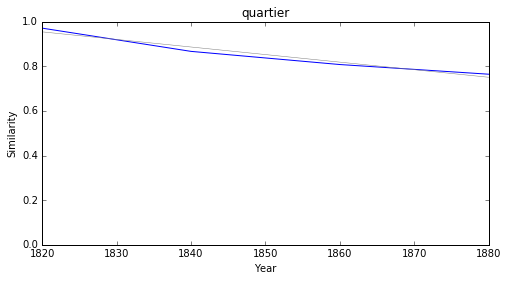

endroit


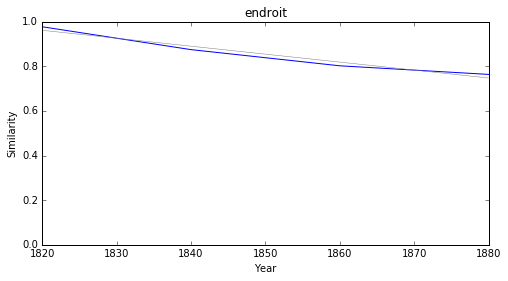

lac


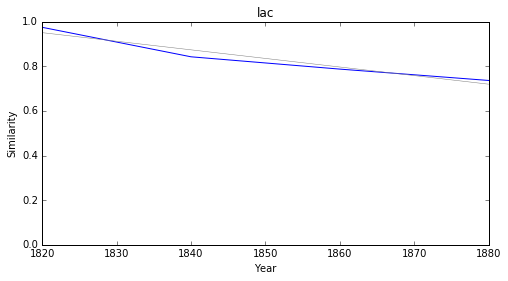

voisinage


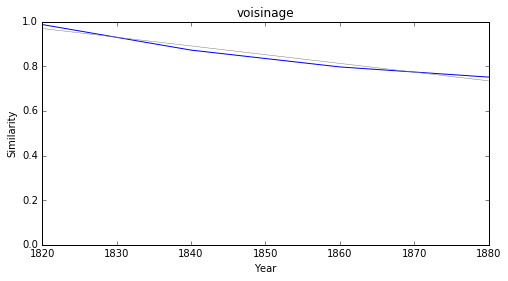

café


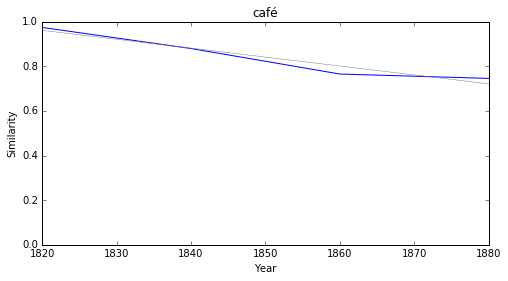

drame


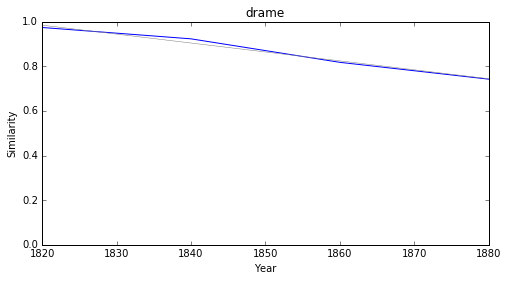

cadre


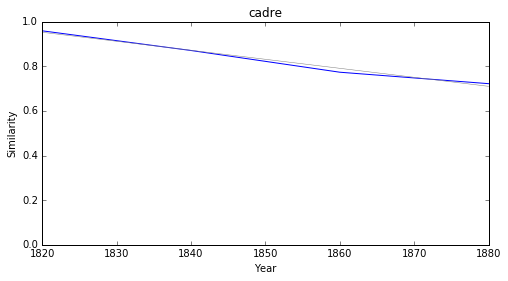

salon


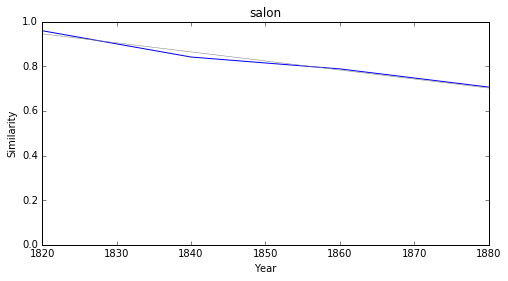

### <i><b>drame</i></b>

          token     slope         p
2        dessin -0.001954  0.034184
1       symbole -0.001968  0.034458
3  propriétaire -0.002154  0.034486
0        climat -0.002408  0.035229
4          joug -0.002596  0.026204



dessin


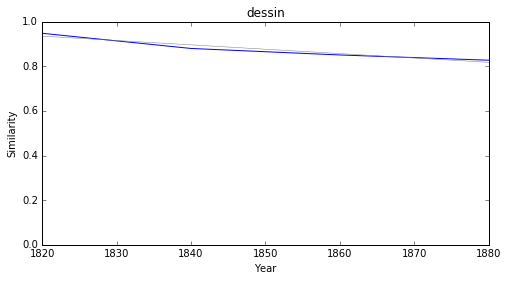

symbole


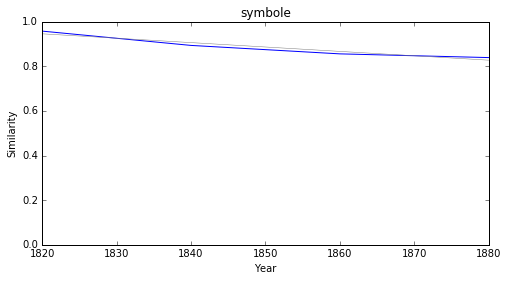

propriétaire


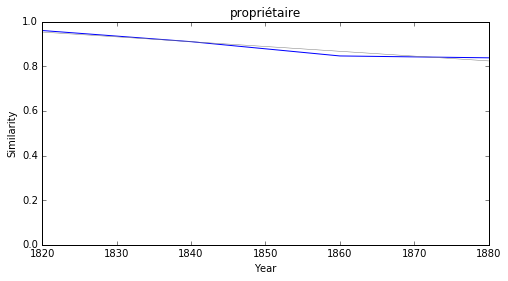

climat


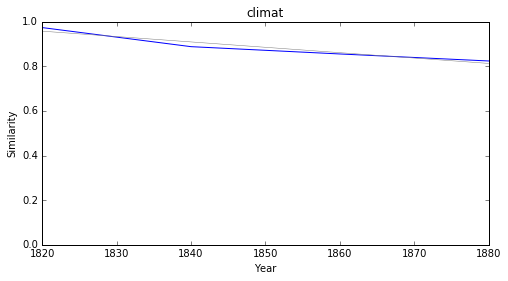

joug


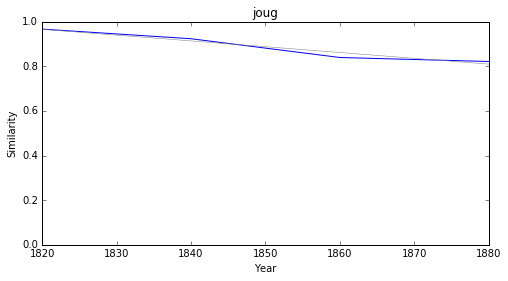

### <i><b>esprit</i></b>

           token     slope         p
34      habitude -0.001963  0.048457
29        défaut -0.002021  0.034724
4   intelligence -0.002076  0.037064
21          idée -0.002177  0.010229
44     influence -0.002350  0.002875
11        talent -0.002510  0.034719
45        morale -0.002615  0.028271
46       langage -0.002693  0.013396
57     condition -0.002728  0.028231
27        mérite -0.002762  0.016114



habitude


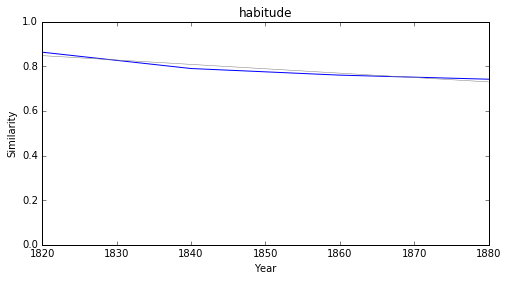

défaut


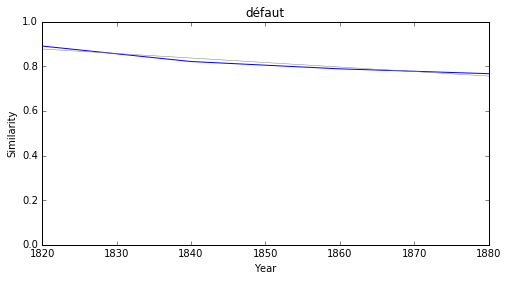

intelligence


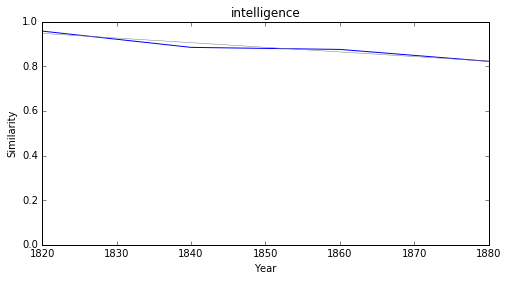

idée


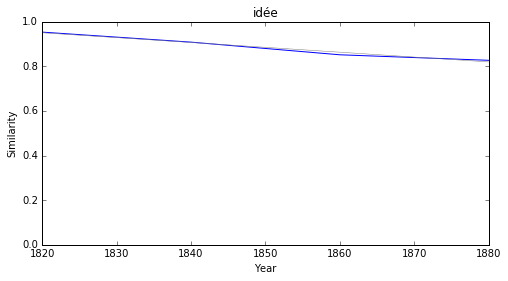

influence


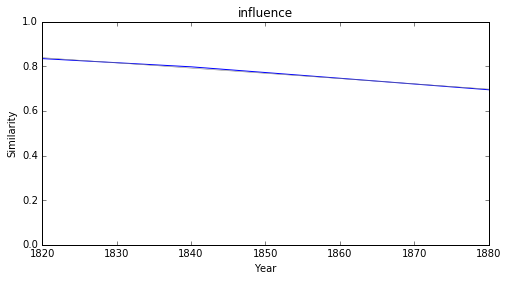

talent


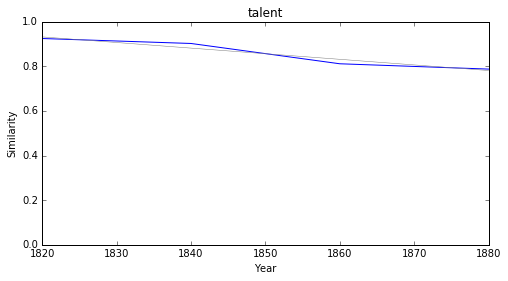

morale


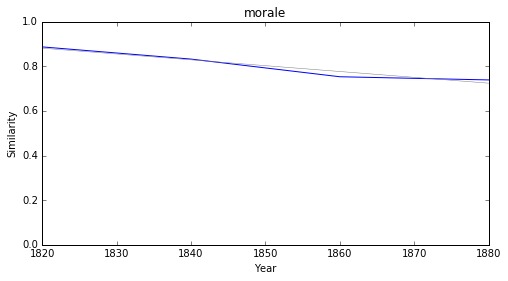

langage


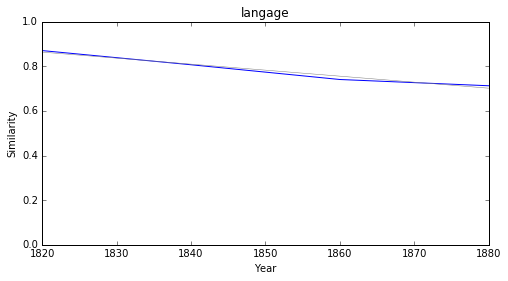

condition


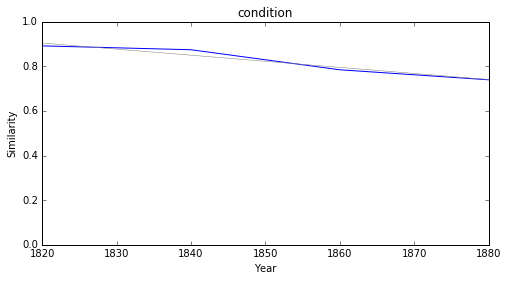

mérite


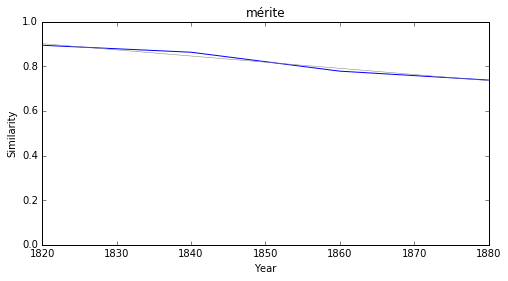

### <i><b>langue</i></b>

         token     slope         p
3  disposition -0.001998  0.018117
2     croyance -0.002137  0.034141
1      mission -0.002328  0.033181
0    faiblesse -0.002910  0.049173
6        tâche -0.003121  0.043690
5        usage -0.003179  0.033521
4      opinion -0.003459  0.015635



disposition


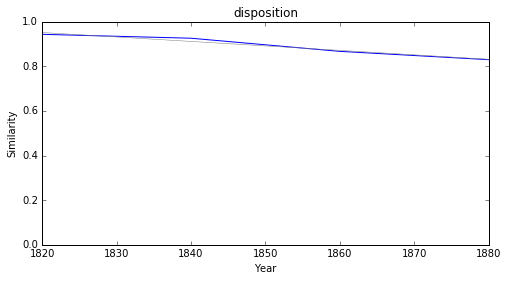

croyance


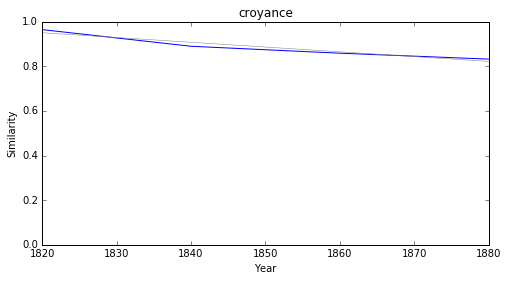

mission


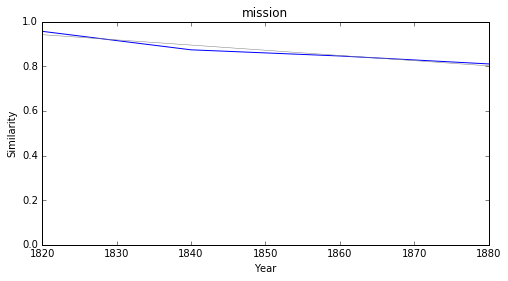

faiblesse


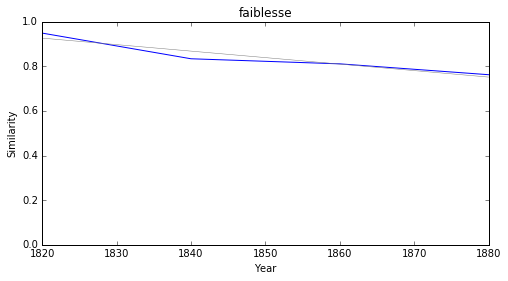

tâche


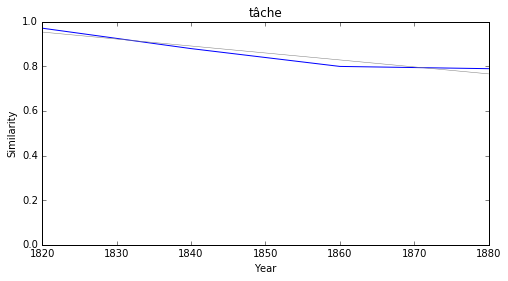

usage


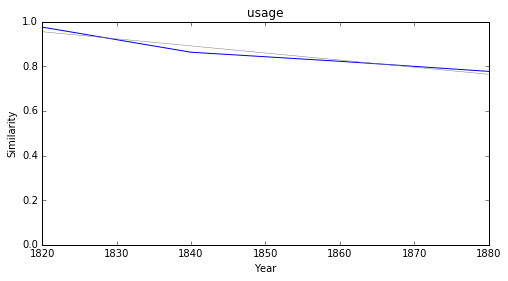

opinion


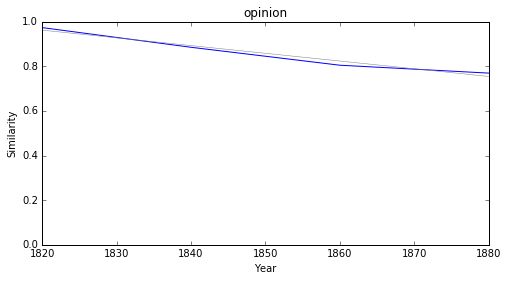

### <i><b>diplomatie</i></b>

          token     slope         p
31   révélation -0.001700  0.001339
7    protecteur -0.001793  0.041251
0       analyse -0.001900  0.031565
13   instrument -0.001956  0.019860
16      réunion -0.001996  0.033389
8   inépuisable -0.002119  0.043578
18     monument -0.002139  0.041813
29     divinité -0.002182  0.011980
3         futur -0.002197  0.034215
19   conclusion -0.002319  0.030043



révélation


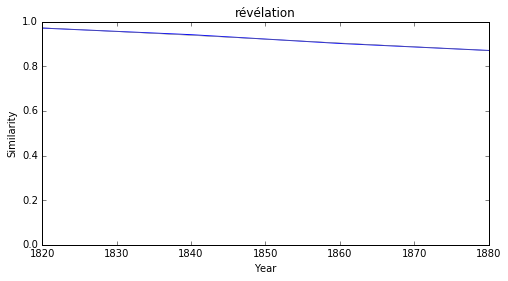

protecteur


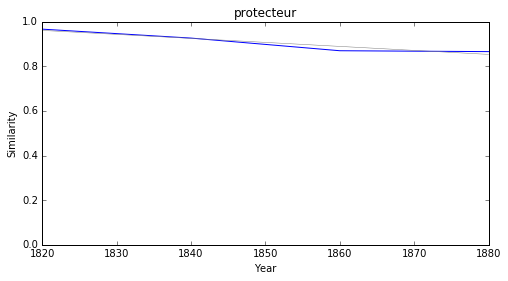

analyse


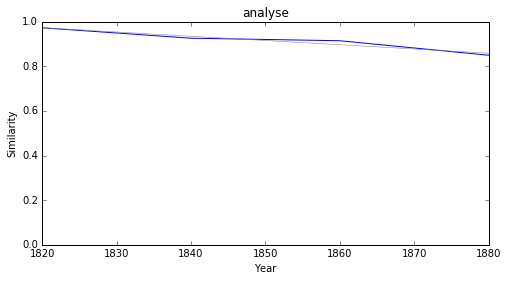

instrument


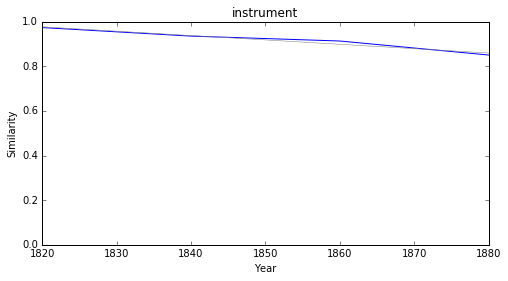

réunion


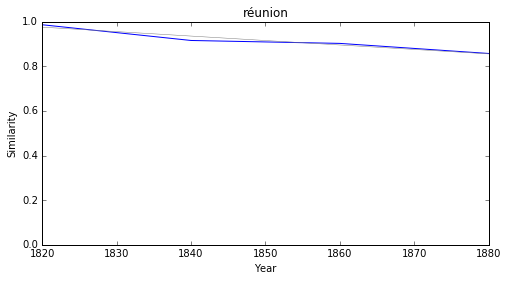

inépuisable


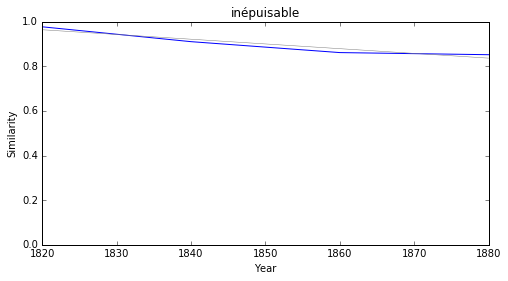

monument


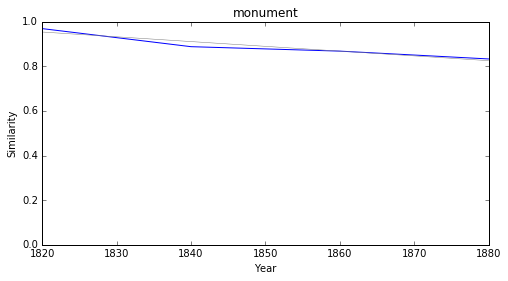

divinité


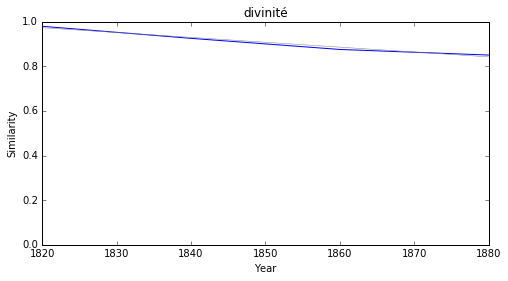

futur


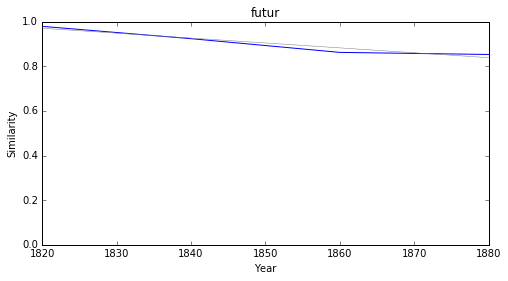

conclusion


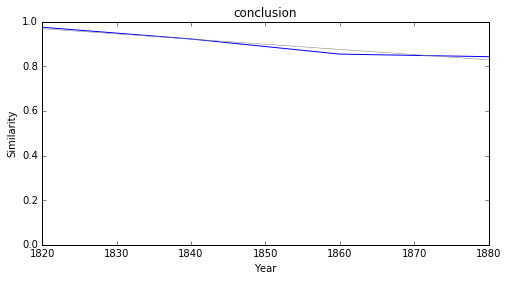

### <i><b>politique</i></b>

        token     slope         p
63   principe -0.001436  0.026769
81   religion -0.002148  0.015891
27        art -0.002300  0.000617
86     peuple -0.002530  0.032991
42  monarchie -0.002588  0.039597
79    système -0.002625  0.032192
69    société -0.002775  0.011104
80    liberté -0.002841  0.028561
8       cause -0.002896  0.038814
22     nature -0.003018  0.027857



principe


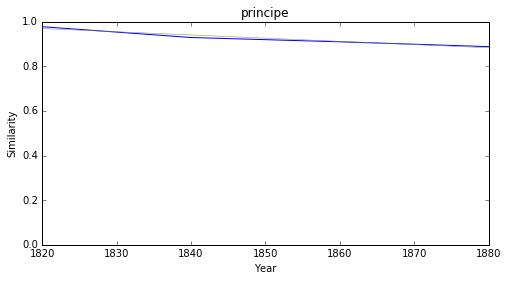

religion


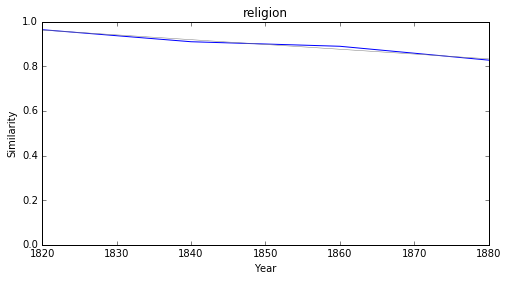

art


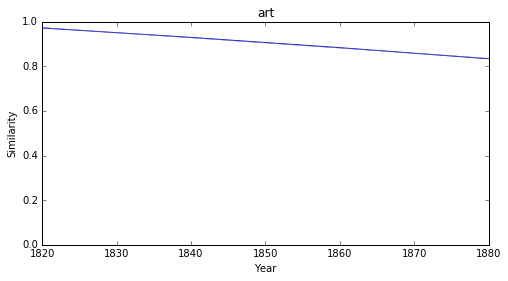

peuple


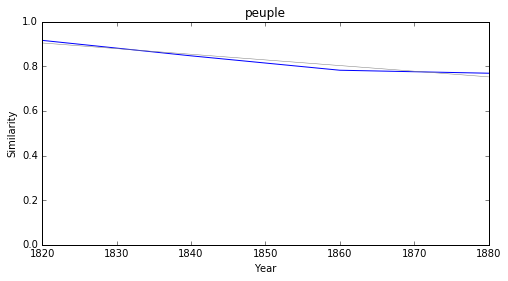

monarchie


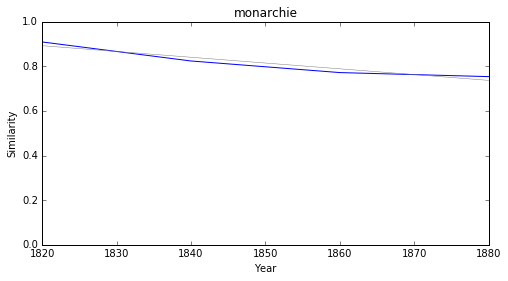

système


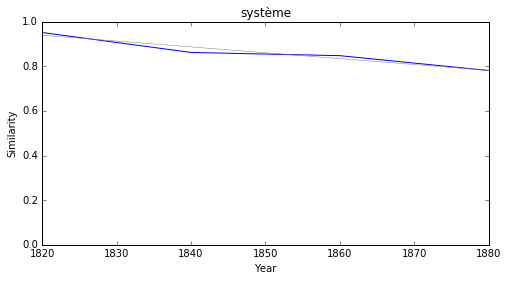

société


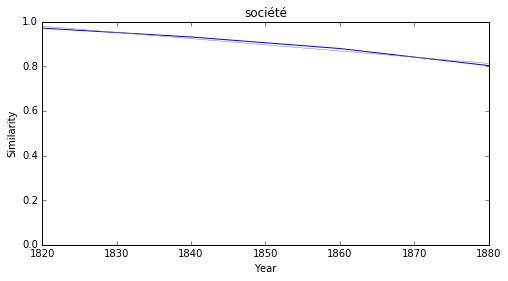

liberté


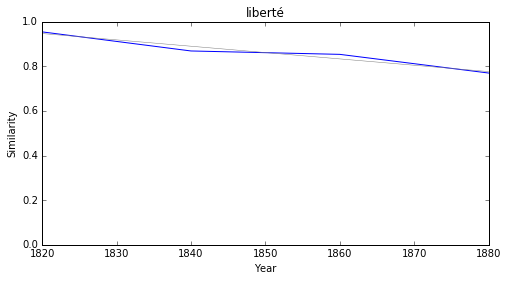

cause


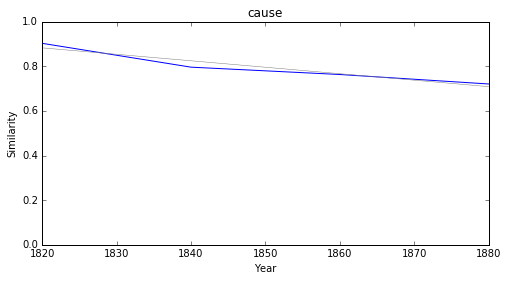

nature


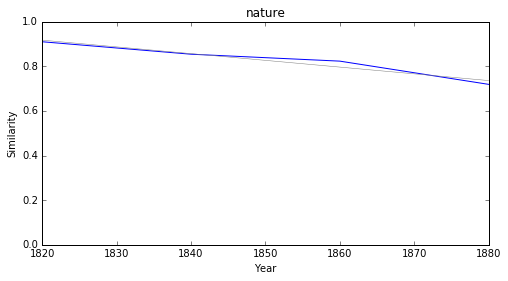

### <i><b>morale</i></b>

           token     slope         p
16           art -0.001824  0.028311
69        social -0.002285  0.013524
66      pratique -0.002296  0.024600
38       science -0.002404  0.005120
3   intelligence -0.002473  0.019460
46      humanité -0.002566  0.047336
41        humain -0.002594  0.048232
29       théorie -0.002785  0.018484
18        action -0.002793  0.046156
63         idéal -0.002842  0.022911



art


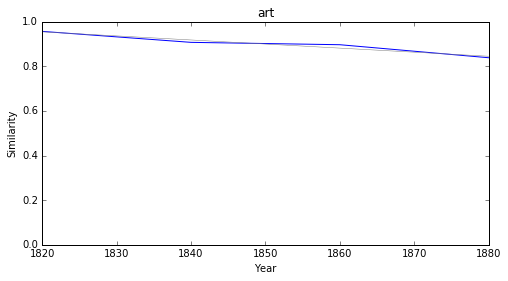

social


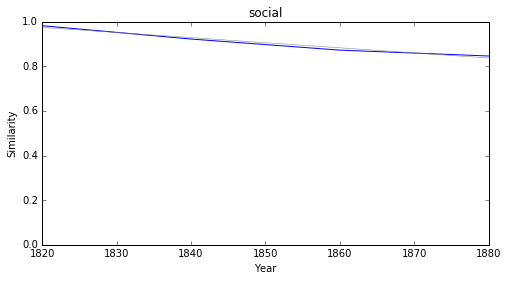

pratique


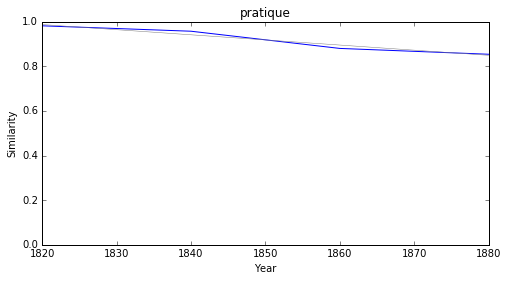

science


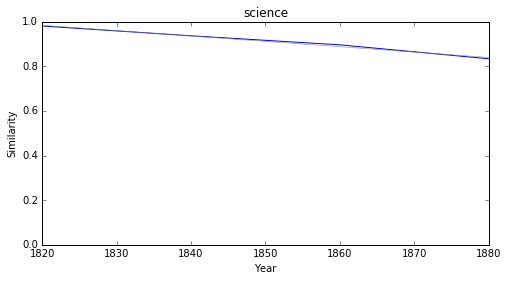

intelligence


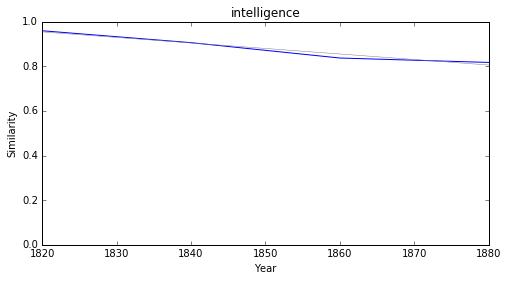

humanité


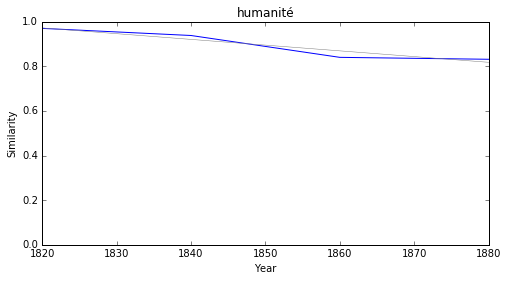

humain


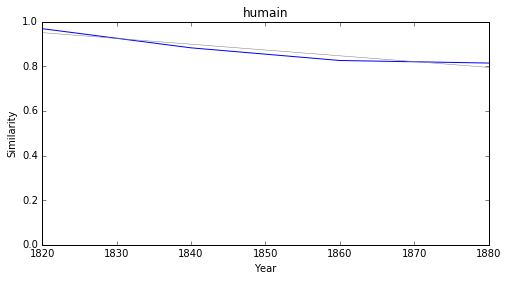

théorie


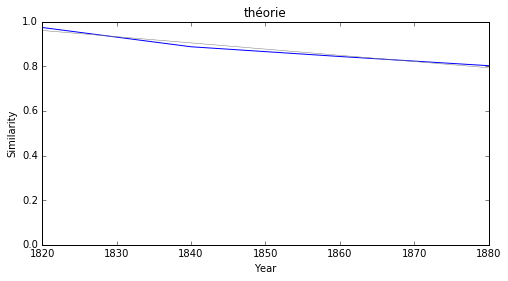

action


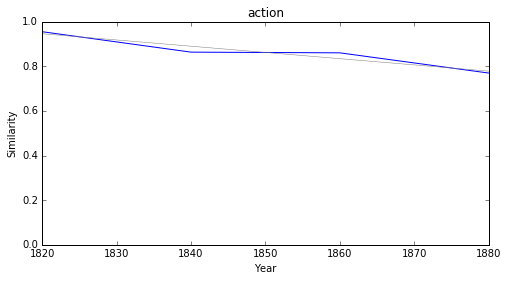

idéal


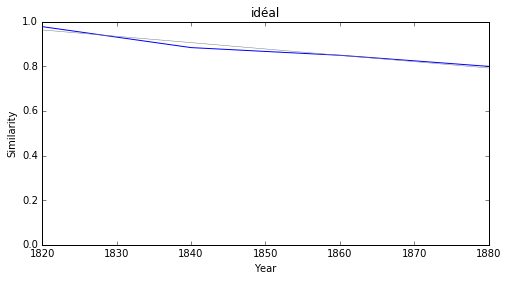

### <i><b>société</i></b>

          token     slope         p
43    influence -0.001841  0.022127
37      science -0.001911  0.003703
24    monarchie -0.001963  0.020835
45       nation -0.001965  0.045277
20        école -0.001971  0.005828
14      opinion -0.002028  0.030748
9   institution -0.002050  0.016399
66     religion -0.002110  0.016858
54        règle -0.002330  0.010917
50     principe -0.002408  0.036031



influence


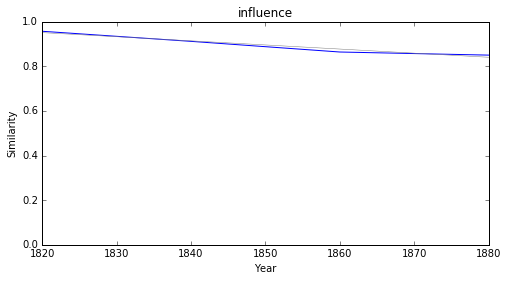

science


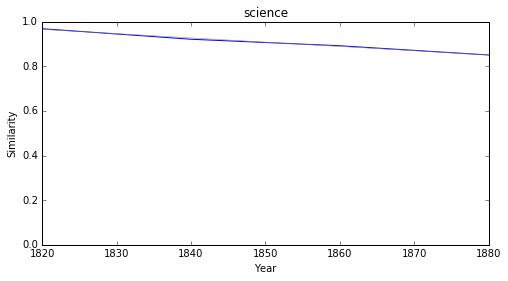

monarchie


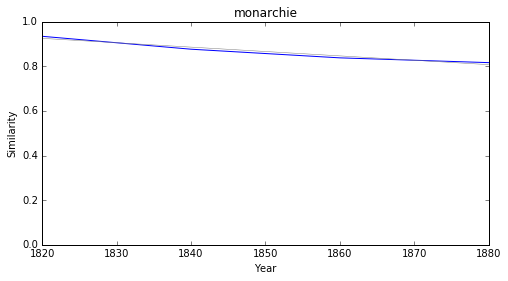

nation


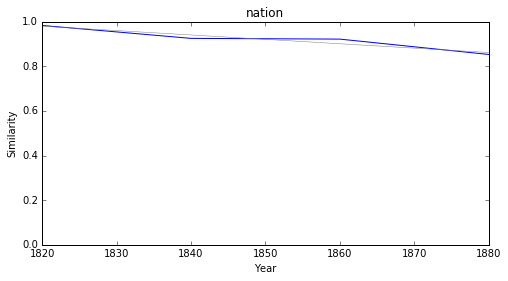

école


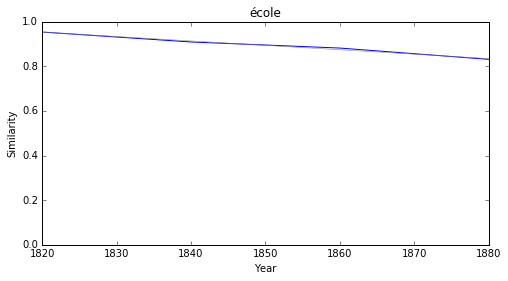

opinion


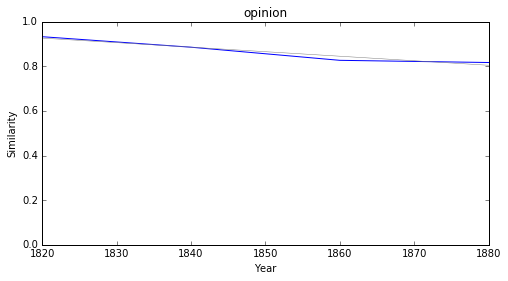

institution


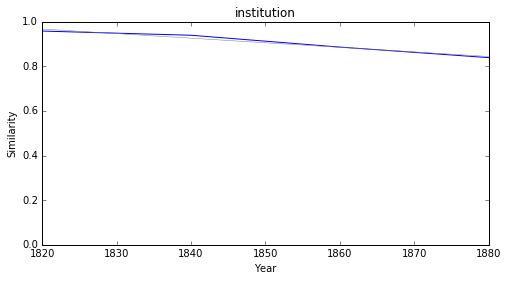

religion


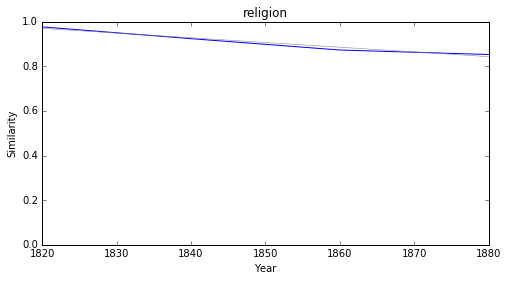

règle


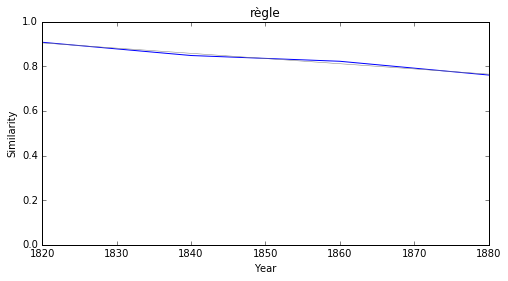

principe


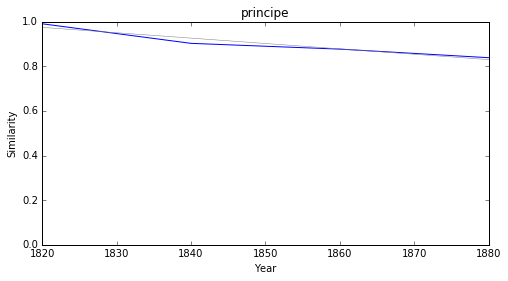

### <i><b>pouvoir</i></b>

         token     slope         p
35       moyen -0.002209  0.035905
51     justice -0.002359  0.043892
19         but -0.002465  0.049889
61   situation -0.002489  0.001543
69      mesure -0.002860  0.034804
27  résistance -0.003188  0.023486
29    accepter -0.003285  0.030412
38     intérêt -0.003312  0.026719
55      danger -0.003373  0.000599
2    nécessité -0.003565  0.043004



moyen


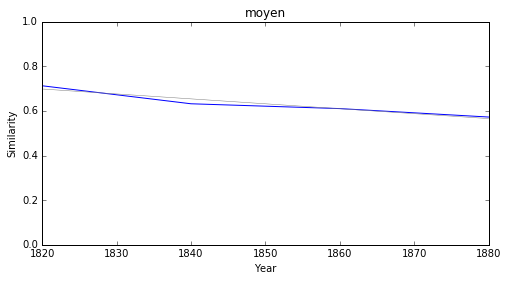

justice


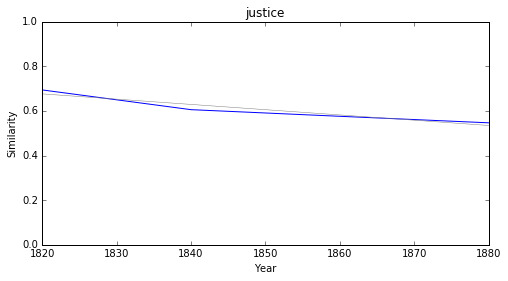

but


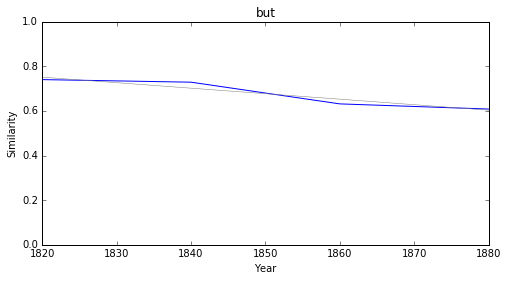

situation


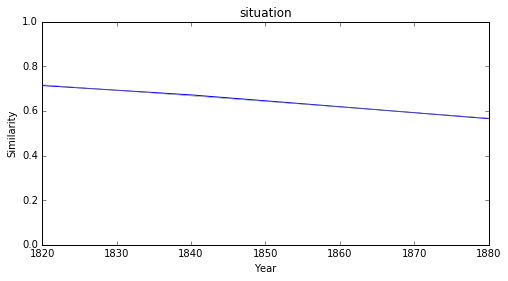

mesure


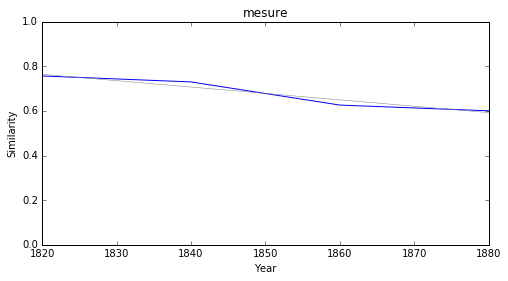

résistance


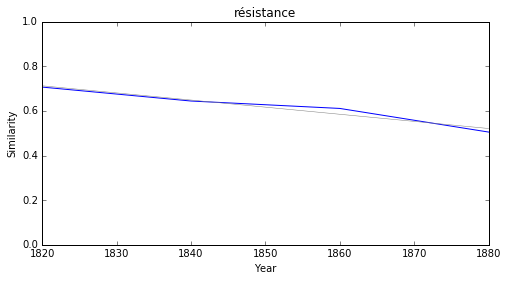

accepter


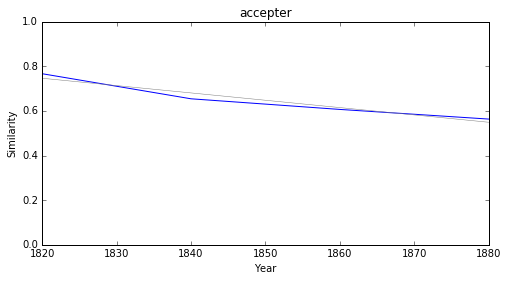

intérêt


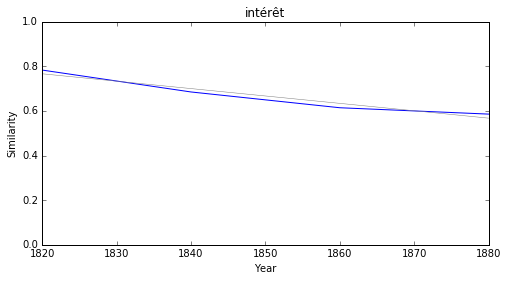

danger


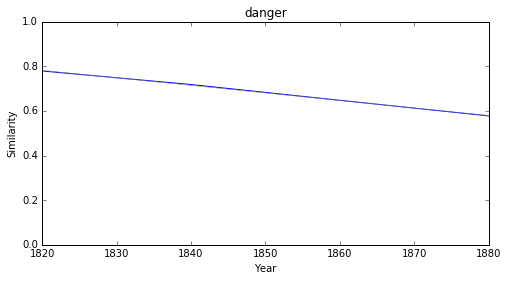

nécessité


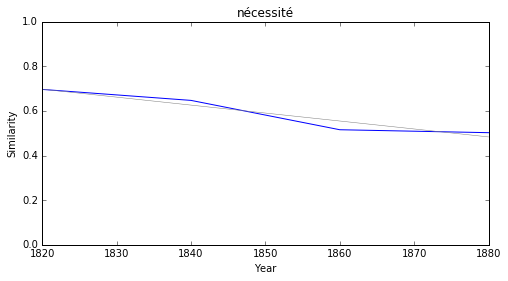

### <i><b>théologie</i></b>

          token     slope         p
4       révolte -0.002058  0.042411
1  conspiration -0.002122  0.021285
2   bourgeoisie -0.002215  0.040849
6       finesse -0.002256  0.013817
3     précision -0.002294  0.018856
0     alexandre -0.002431  0.014221
5         latin -0.002536  0.021431



révolte


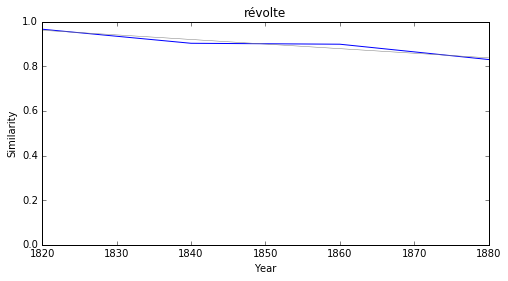

conspiration


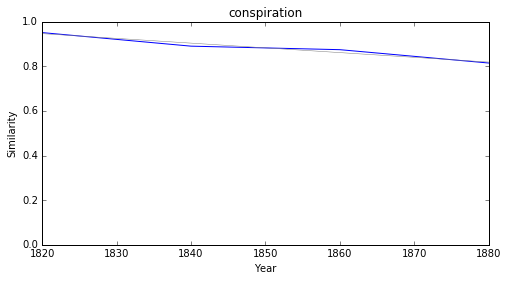

bourgeoisie


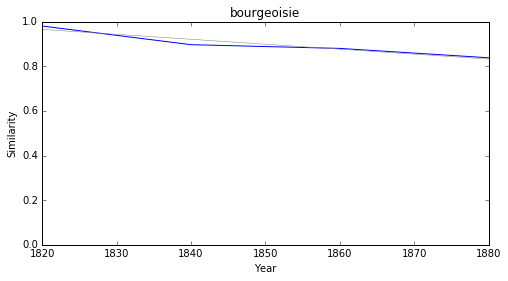

finesse


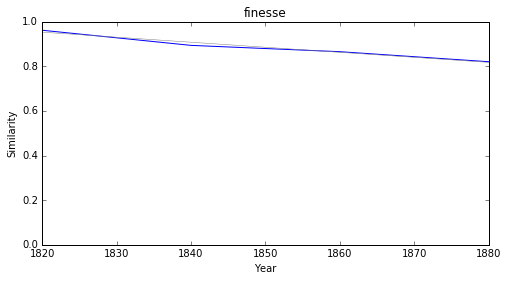

précision


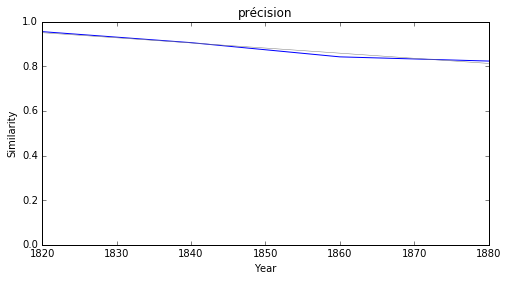

alexandre


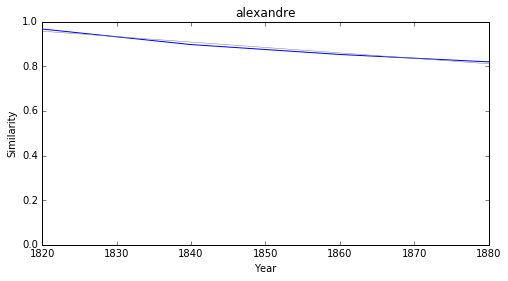

latin


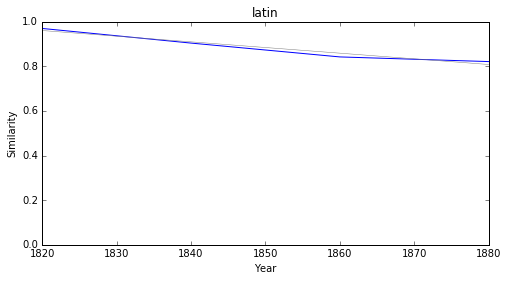

### <i><b>droit</i></b>

         token     slope         p
74    principe -0.002452  0.029501
95     liberté -0.002456  0.042787
77       parti -0.002463  0.049357
50      besoin -0.002609  0.002606
30         but -0.002980  0.014875
73     justice -0.003065  0.004751
99       choix -0.003274  0.022561
94     système -0.003667  0.027429
89    ambition -0.003698  0.044893
7   nécessaire -0.003730  0.036834



principe


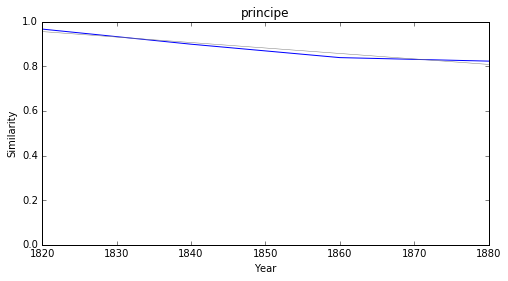

liberté


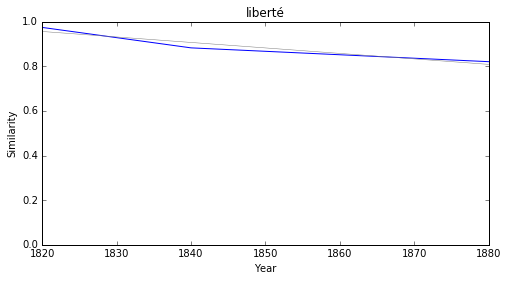

parti


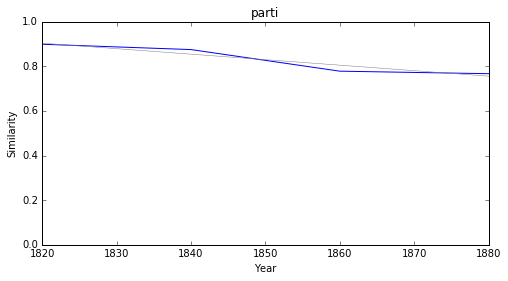

besoin


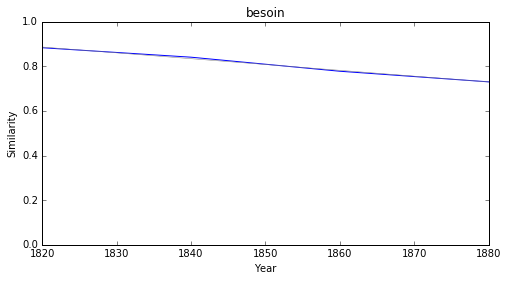

but


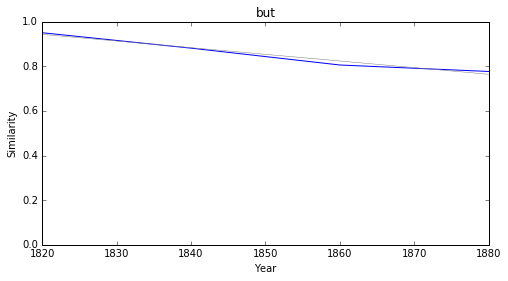

justice


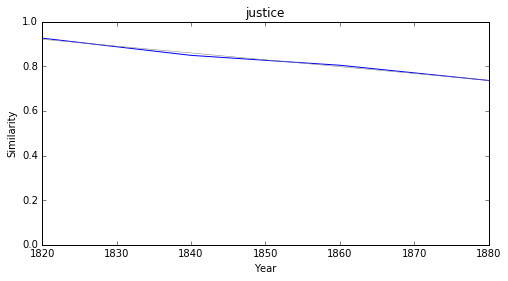

choix


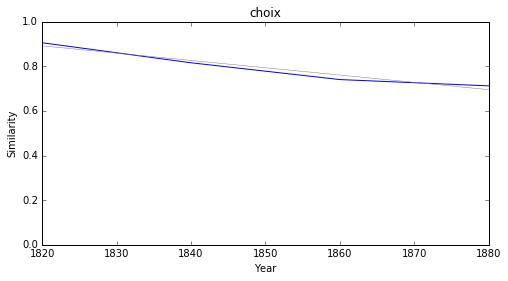

système


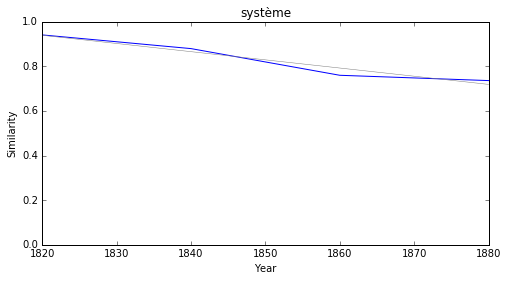

ambition


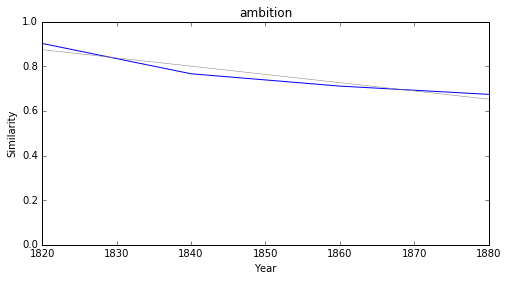

nécessaire


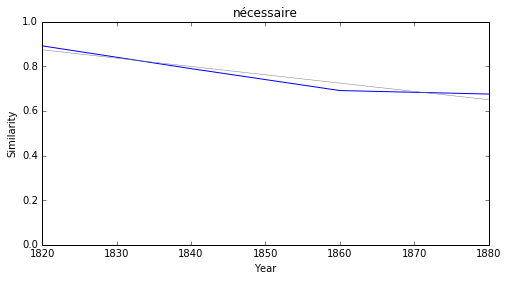

### <i><b>loi</i></b>

          token     slope         p
107      nation -0.001591  0.031155
140       règle -0.002100  0.049025
42    religieux -0.002454  0.032087
70    monarchie -0.002584  0.000842
139        état -0.002693  0.024566
21      matière -0.002900  0.031793
94      science -0.003049  0.019719
52      général -0.003060  0.008078
90   république -0.003060  0.028342
20     critique -0.003195  0.021147



nation


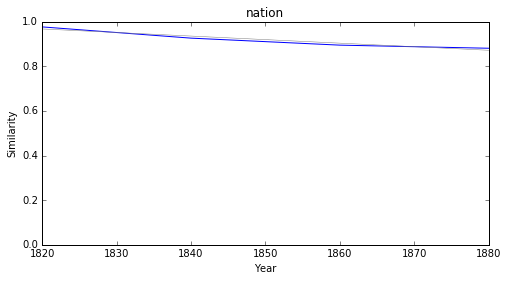

règle


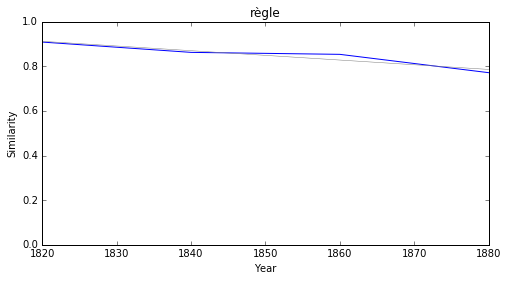

religieux


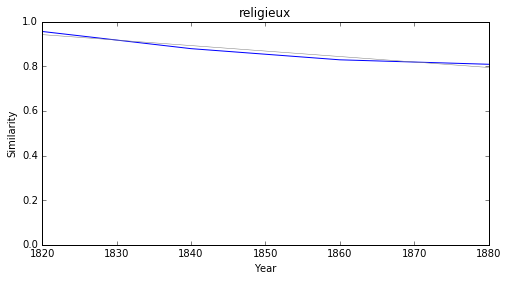

monarchie


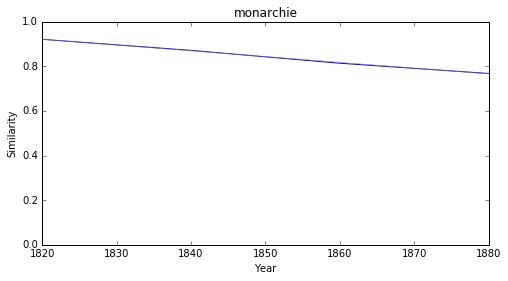

état


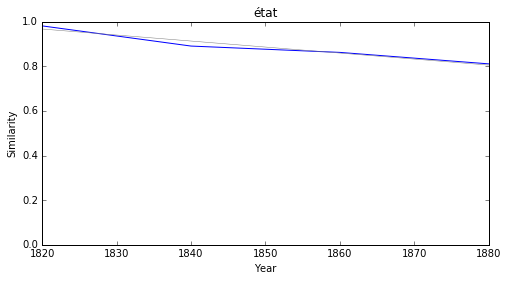

matière


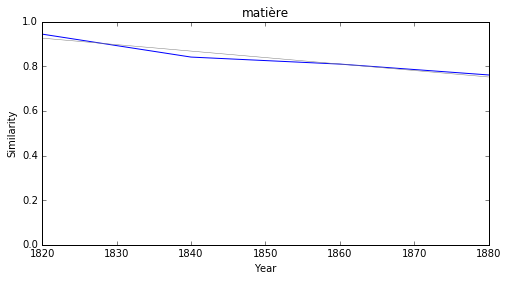

science


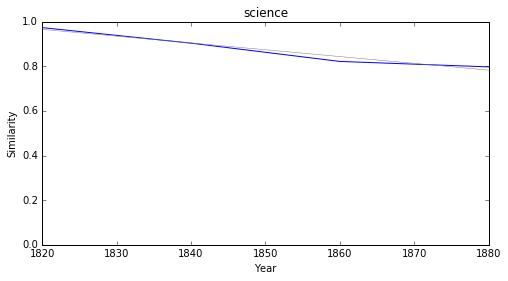

général


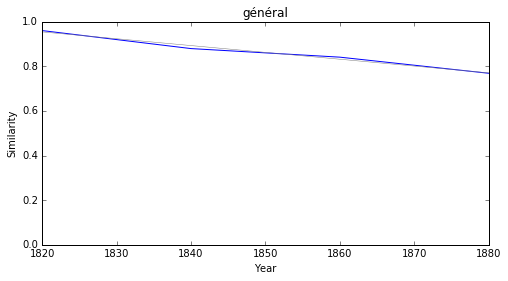

république


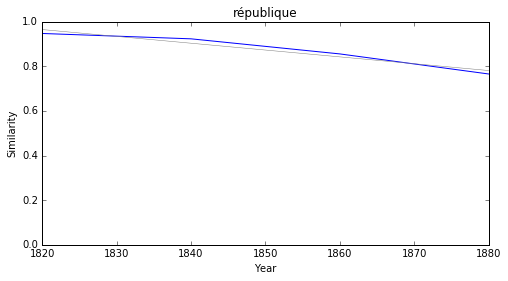

critique


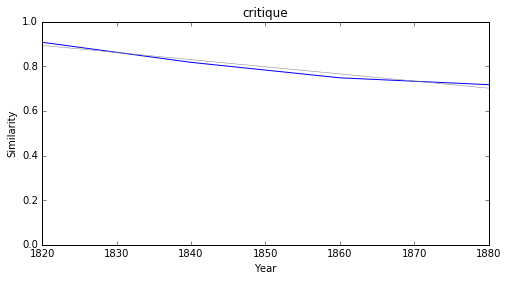

### <i><b>méthode</i></b>

           token     slope         p
8       tendance -0.001392  0.026156
0   intervention -0.001435  0.049911
9       grandeur -0.001512  0.026904
31      économie -0.001684  0.024186
17    conclusion -0.001886  0.009593
15    instrument -0.001973  0.023274
16     tentative -0.002179  0.031834
13       rigueur -0.002191  0.001863
20      peinture -0.002244  0.008228
29         choix -0.002352  0.043804



tendance


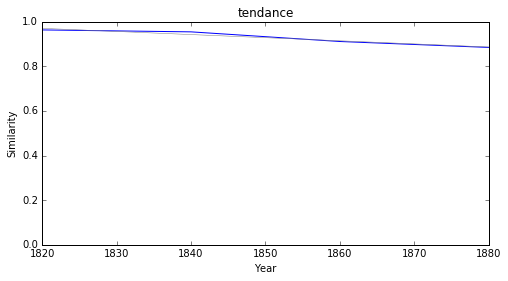

intervention


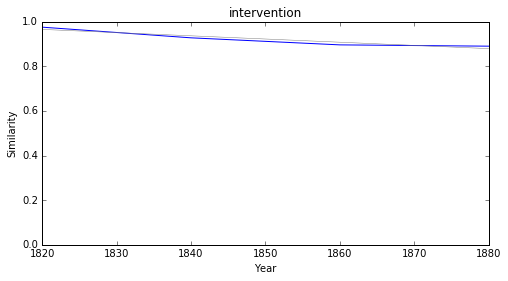

grandeur


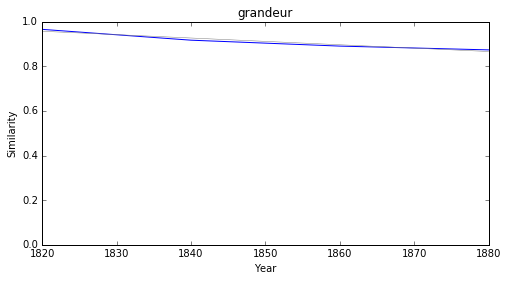

économie


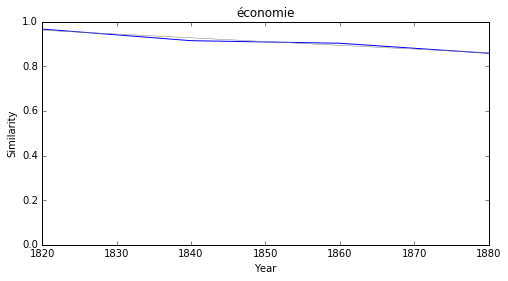

conclusion


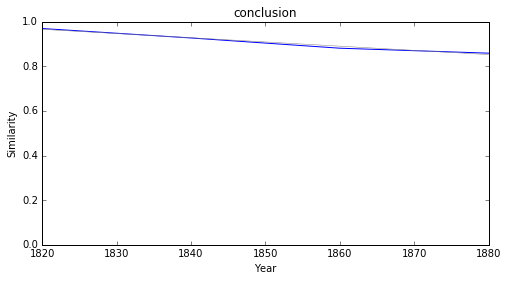

instrument


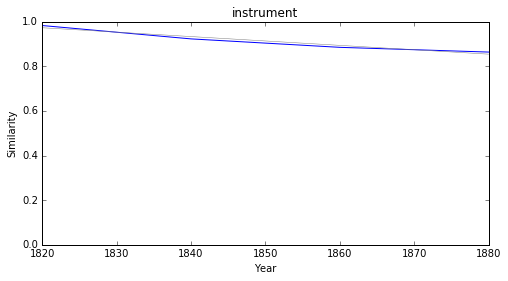

tentative


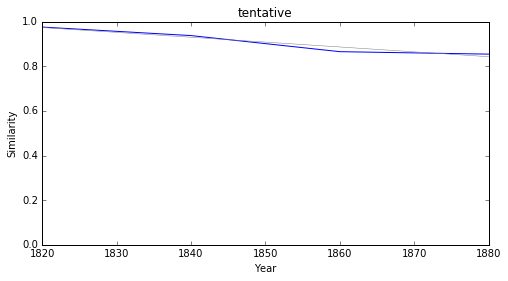

rigueur


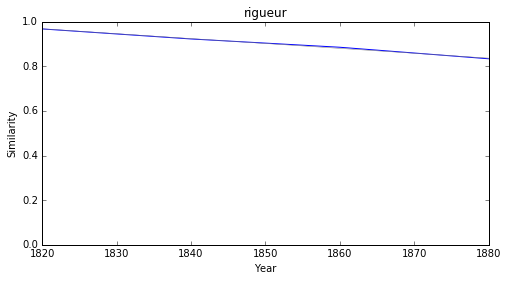

peinture


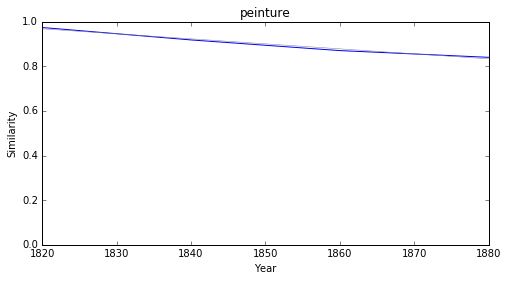

choix


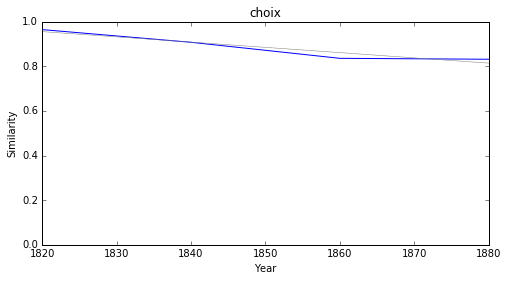

### <i><b>génie</i></b>

        token     slope         p
17   doctrine -0.001842  0.041764
26   noblesse -0.002070  0.012684
38    origine -0.002084  0.040218
19  industrie -0.002266  0.027741
30       acte -0.002458  0.019717
41      style -0.002475  0.021287
7    création -0.002534  0.042505
27      étude -0.002558  0.015022
13  caractère -0.002565  0.012833
4    chrétien -0.002628  0.017428



doctrine


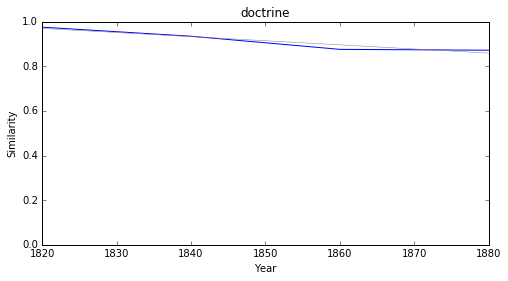

noblesse


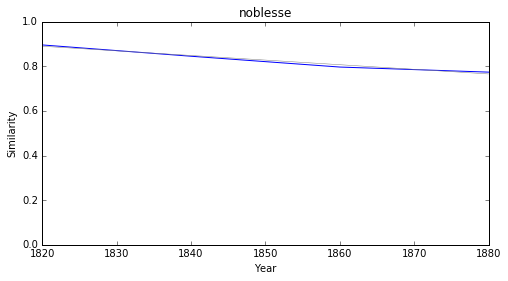

origine


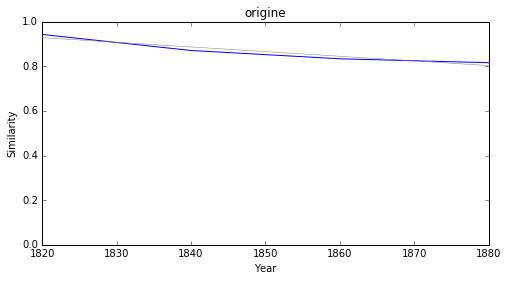

industrie


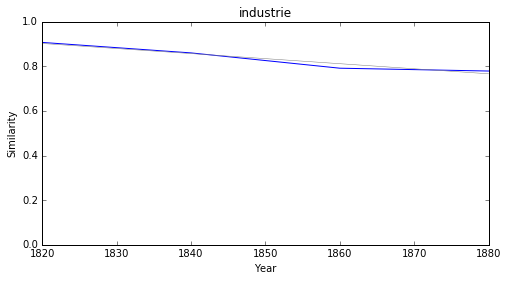

acte


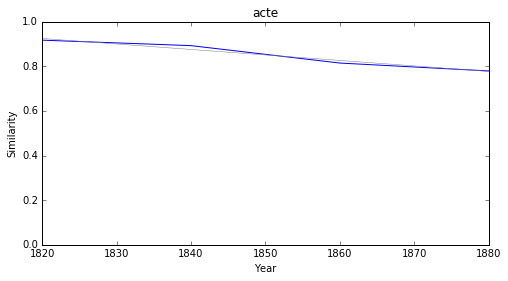

style


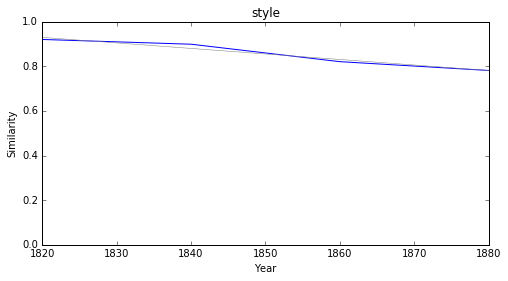

création


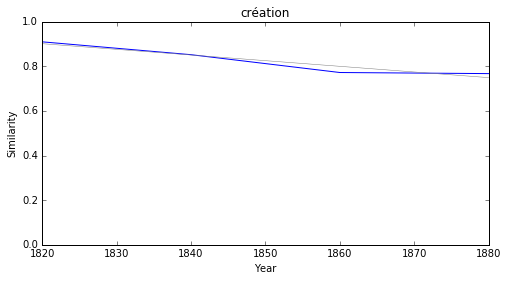

étude


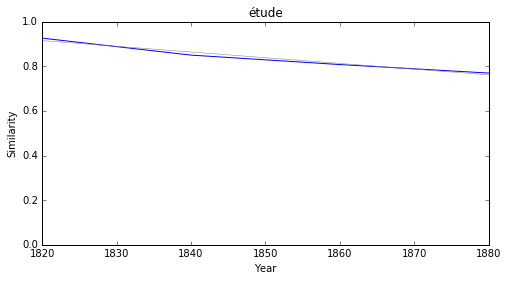

caractère


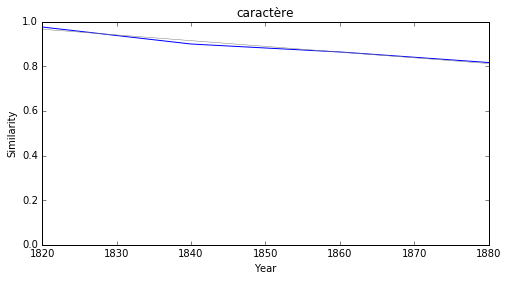

chrétien


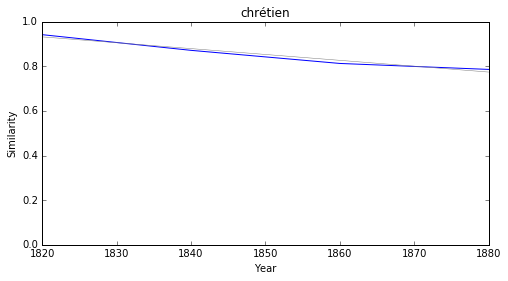

### <i><b>romantisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>réalisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>symbolisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>naturalisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





In [54]:
from IPython.display import Markdown, display

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df3 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df3.sort_values('slope', ascending=False).head(10))
    print('\n\n')
    
    for i, row in df3.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)